---
---

# **`Medicare Provider Fraudulent Detection` 🩺 💰 🕵️‍**

---
---

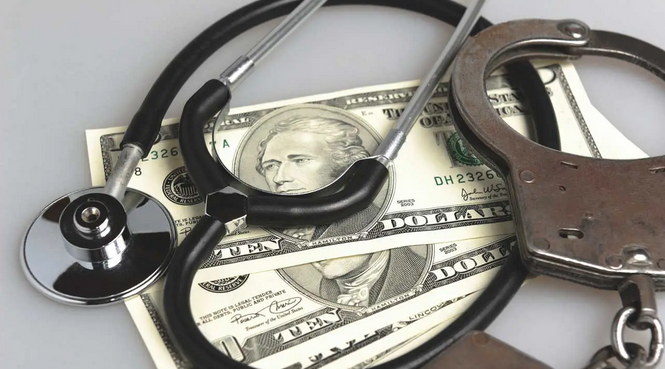

In [1]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Display_Pic.png")

**This Kernel comprises the below tasks:**
   - EDA on Beneficiary Data
   
   - EDA on In-patients & Out-patients Data
   
   - EDA on entire data after joining with Provider Tgt Labels
   
   - Feature Engineered (SET-1):
       - Basic EDA features
       - Single level Aggregated features
       - Multiple levels Aggregated features
   
   
   - Models trained and evaluated on SET-1 features
   
   
   - Feature Engineered (SET-2):
       - Basic EDA features
       - Code Embeddings Similarity Features:
           - CAD <--> Dx
           - CAD <--> PROC
           - Dx <--> PROC
       - Single level Aggregated features (excluding CAD, Dx & PROC codes)
       - Multiple levels Aggregated features (excluding no CAD, Dx & PROC codes)
   
   
   - Models trained and evaluated on SET-2 features
   

**Kindly checkout the below WebApp for accessing the best trained model for this problem:**

- [WebApp](https://medicare-prv-fraud-detection.herokuapp.com/)


**Kindly checkout below link for gaining BUSINESS related insights about this problem:**

- [Deck : Detailed Explanation](https://docs.google.com/presentation/d/1Thuw_eZskafkl9W3xYuEVsjgTJKFeEkzEfAmczH96Uw/)


**Kindly checkout below link for TECHNICAL description about this problem:**

- [Technical Document](https://docs.google.com/document/d/10z9xbn4dZWkforlAszCDaa1M0roAW-MOf2pjJHSnEXk/)


**Kindly checkout below link for In-depth Description and Reasoning of all the Features ::**

- [Features Description](https://docs.google.com/spreadsheets/d/1ktwjad3U-hGT_7yccGyZC4AzGhWAMs3RHrIMk8Gi8xQ/)

### **Importing_Libraries**

In [2]:
import os
import sys
import math
import scipy as scipy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [3]:
pd.set_option('display.max_columns',30)
label_font_dict = {'family':'sans-serif','size':13.5,'color':'brown','style':'italic'}
title_font_dict = {'family':'sans-serif','size':16.5,'color':'Blue','style':'italic'}

# **BENE Data - EDA**

In [4]:
train_bene_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Beneficiarydata-1542865627584.csv")
train_ip_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Inpatientdata-1542865627584.csv")
train_op_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Outpatientdata-1542865627584.csv")

In [5]:
train_bene_df.shape

(138556, 25)

In [6]:
train_bene_df.columns

Index(['BeneID', 'DOB', 'DOD', 'Gender', 'Race', 'RenalDiseaseIndicator',
       'State', 'County', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov',
       'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke', 'IPAnnualReimbursementAmt',
       'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt',
       'OPAnnualDeductibleAmt'],
      dtype='object')

In [7]:
train_bene_df.dtypes

BeneID                             object
DOB                                object
DOD                                object
Gender                              int64
Race                                int64
RenalDiseaseIndicator              object
State                               int64
County                              int64
NoOfMonths_PartACov                 int64
NoOfMonths_PartBCov                 int64
ChronicCond_Alzheimer               int64
ChronicCond_Heartfailure            int64
ChronicCond_KidneyDisease           int64
ChronicCond_Cancer                  int64
ChronicCond_ObstrPulmonary          int64
ChronicCond_Depression              int64
ChronicCond_Diabetes                int64
ChronicCond_IschemicHeart           int64
ChronicCond_Osteoporasis            int64
ChronicCond_rheumatoidarthritis     int64
ChronicCond_stroke                  int64
IPAnnualReimbursementAmt            int64
IPAnnualDeductibleAmt               int64
OPAnnualReimbursementAmt          

In [8]:
train_bene_df.head()

,BeneID,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt
0,BENE11001,1943-01-01,NaN,1,1,0,39,230,12,12,1,2,1,2,2,1,1,1,2,1,1,36000,3204,60,70
1,BENE11002,1936-09-01,NaN,2,1,0,39,280,12,12,2,2,2,2,2,2,2,2,2,2,2,0,0,30,50
2,BENE11003,1936-08-01,NaN,1,1,0,52,590,12,12,1,2,2,2,2,2,2,1,2,2,2,0,0,90,40
3,BENE11004,1922-07-01,NaN,1,1,0,39,270,12,12,1,1,2,2,2,2,1,1,1,1,2,0,0,1810,760
4,BENE11005,1935-09-01,NaN,1,1,0,24,680,12,12,2,2,2,2,1,2,1,2,2,2,2,0,0,1790,1200


### **Q1. How many unique beneficiaries we have in our dataset?**

In [9]:
train_bene_df['BeneID'].nunique()

138556

### **Q2. How many records we have at the GENDER level?**

In [10]:
train_bene_df['Gender'].unique()

array([1, 2])

In [11]:
train_bene_df['Gender'] = train_bene_df['Gender'].apply(lambda val: 0 if val == 2 else 1)

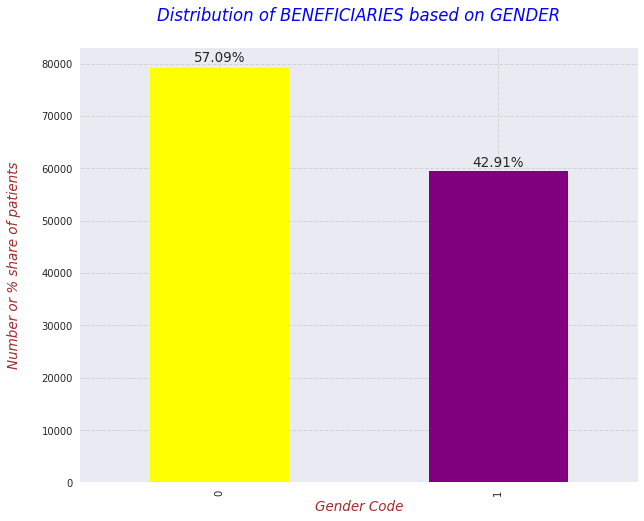

In [12]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of GENDER 
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  fig = train_bene_df['Gender'].value_counts().plot(kind='bar', color=['yellow','purple'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
  # Providing the labels and title to the graph
  plt.xlabel("Gender Code", fontdict=label_font_dict)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES based on GENDER\n", fontdict=title_font_dict)

**`OBERVATION`**
* From the above plot, we can decude that the ratio b/w GENDER_0 : GENDER_1 is 57% : 43%.





### **Q3. Lets calculate the AGE of every BENEFICIARY?**

In [13]:
train_bene_df['DOB'] = pd.to_datetime(train_bene_df['DOB'], format="%Y-%m-%d")

In [14]:
train_bene_df['Patient_Age_Year'] = train_bene_df['DOB'].dt.year
train_bene_df['Patient_Age_Month'] = train_bene_df['DOB'].dt.month

* **`Adding new feature`** <::::::::::::::::::::::::> **"`YEAR of birth of beneficiaries`"**

In [15]:
bene_age_year_df = pd.DataFrame(train_bene_df['Patient_Age_Year'].value_counts()).reset_index(drop=False)
bene_age_year_df.columns= ['year','num_of_beneficiaries']
bene_age_year_df = bene_age_year_df.sort_values(by='year')

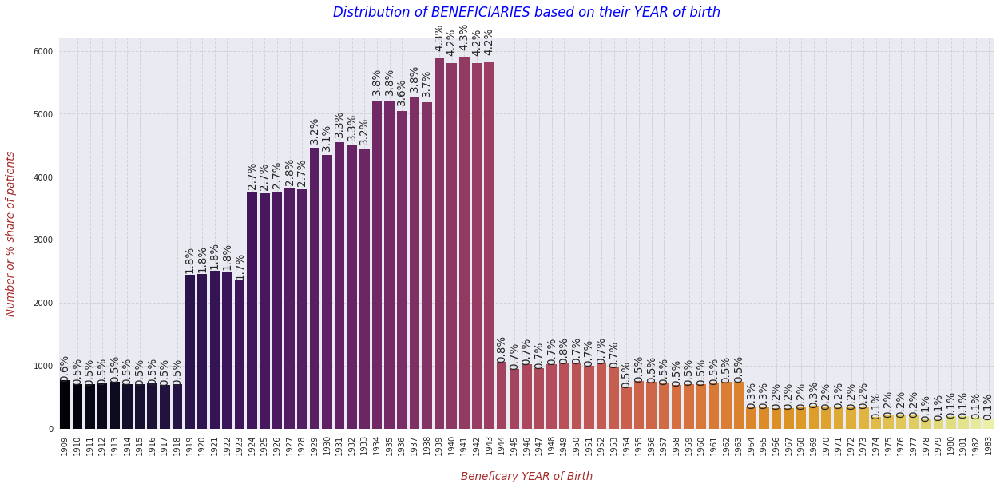

In [16]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of their YEAR of Birth 
with plt.style.context('seaborn'):
  plt.figure(figsize=(21,9))
  fig = sns.barplot(data=bene_age_year_df, x='year', y='num_of_beneficiaries', palette='inferno')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],1))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
  # Providing the labels and title to the graph
  plt.xlabel("\nBeneficary YEAR of Birth", fontdict=label_font_dict)
  plt.xticks(rotation=90)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.minorticks_on()
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.title("Distribution of BENEFICIARIES based on their YEAR of birth\n", fontdict=title_font_dict)

**`OBERVATION`**
*   From the above plot, we can decude that the majority of the beneficiaries are from the YEAR - 1919 to 1943.
  *   More specifically, overall the percentage of number of beneficiaries with YEAR of birth from 1939 to 1943 is the highest. Whereas, it is lowest from 1978 to 1983.


**`REASONING`**
*   The reason for adding the "YEAR of Birth of Beneficiaries" as a new feature in the dataset with the intent to find whether personal details has been forged by the beneficiary or its direct/indirect association with Fraud claims.

* **`Adding new feature`** <::::::::::::::::::::::::> **"`MONTH of birth of beneficiaries`"**

In [17]:
bene_age_month_df = pd.DataFrame(train_bene_df['Patient_Age_Month'].value_counts()).reset_index(drop=False)
bene_age_month_df.columns= ['month','num_of_beneficiaries']
bene_age_month_df = bene_age_month_df.sort_values(by='month')

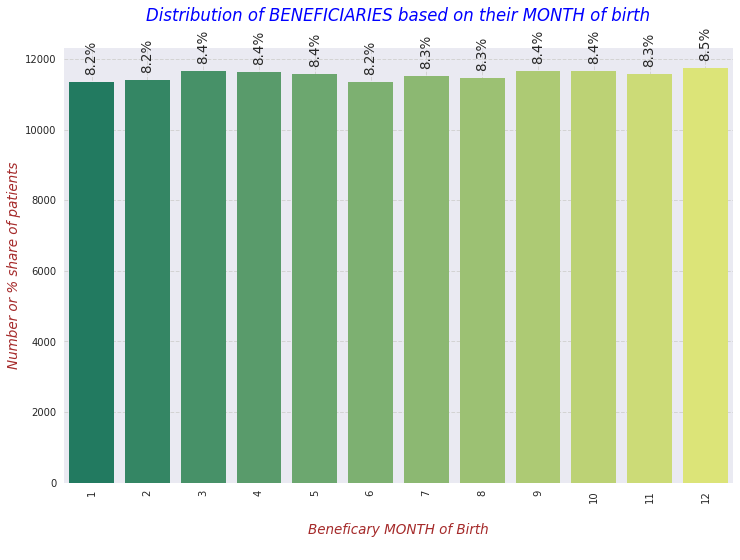

In [18]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of their MONTH of Birth 
with plt.style.context('seaborn'):
  plt.figure(figsize=(12,8))
  fig = sns.barplot(data=bene_age_month_df, x='month', y='num_of_beneficiaries', palette='summer')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],1))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
  # Providing the labels and title to the graph
  plt.xlabel("\nBeneficary MONTH of Birth\n", fontdict=label_font_dict)
  plt.xticks(rotation=90)
  plt.ylabel("Number or % share of patients", fontdict=label_font_dict)
  plt.minorticks_on()
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.title("Distribution of BENEFICIARIES based on their MONTH of birth\n", fontdict=title_font_dict)

**`OBERVATION`**
* From the above plot, we can decude that there is no such difference b/w the patients based on their MONTH of birth. 
  * Initial, look suggests me that this feature might not be more of a use.


**`REASONING`**
* The reason for adding the "MONTH of Birth of Beneficiaries" as a new feature in the dataset with the intent to find whether personal details has been forged by the beneficiary or its direct/indirect association with Fraud claims.

In [19]:
train_bene_df.head()

,BeneID,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,Patient_Age_Year,Patient_Age_Month
0,BENE11001,1943-01-01,NaN,1,1,0,39,230,12,12,1,2,1,2,2,1,1,1,2,1,1,36000,3204,60,70,1943,1
1,BENE11002,1936-09-01,NaN,0,1,0,39,280,12,12,2,2,2,2,2,2,2,2,2,2,2,0,0,30,50,1936,9
2,BENE11003,1936-08-01,NaN,1,1,0,52,590,12,12,1,2,2,2,2,2,2,1,2,2,2,0,0,90,40,1936,8
3,BENE11004,1922-07-01,NaN,1,1,0,39,270,12,12,1,1,2,2,2,2,1,1,1,1,2,0,0,1810,760,1922,7
4,BENE11005,1935-09-01,NaN,1,1,0,24,680,12,12,2,2,2,2,1,2,1,2,2,2,2,0,0,1790,1200,1935,9


* **`Adding new indicator`** <::::::::::::::::::::::::> **"`Beneficiary Dead or Alive?`"**
  * This represent whether a patient is alive or not?
    * Here, the point to understand is that there can be ONE to MANY relationship b/w a BENEFICIARY and CLAIM filed, thus I'm making an assumption here is that beneficiaries with DOD as NA are alive, however this cannot be  always true once we join it with CLAIMS data.
      * For example, A patient gets successfully operated for Kidney Failure on Sep 2012 and filed CLAIM-I. So, this claimed gets approved with DOD as NA. 
        * Same patient gets operated after 4 months for Cardiac Failure but couldn't survived and filed CLAIM-II. Thus, for CLAIM-I this person shoud have DEAD_or_ALIVE indicator as FALSE whereas for CLAIM-II it should be TRUE.


* **`REASONING`**
  * My intention behind adding this feature is to see whether FRAUD claims are higher for DEAD patients or not? 
    * The reason here is that generally when an organized fraud happens then healthcare providers falsely diagnose, misdiagnose, or overdiagnose a disease, which can lead to harmful courses of medication or treatments or procedures being prescribed or performed. All of this together can lead to patient death.

In [20]:
# 0 means ALIVE and 1 means DEAD
train_bene_df['Dead_or_Alive'] = train_bene_df['DOD'].apply(lambda val: 0 if val != val else 1)

In [21]:
train_bene_df['Dead_or_Alive'].value_counts()

0    137135
1      1421
Name: Dead_or_Alive, dtype: int64

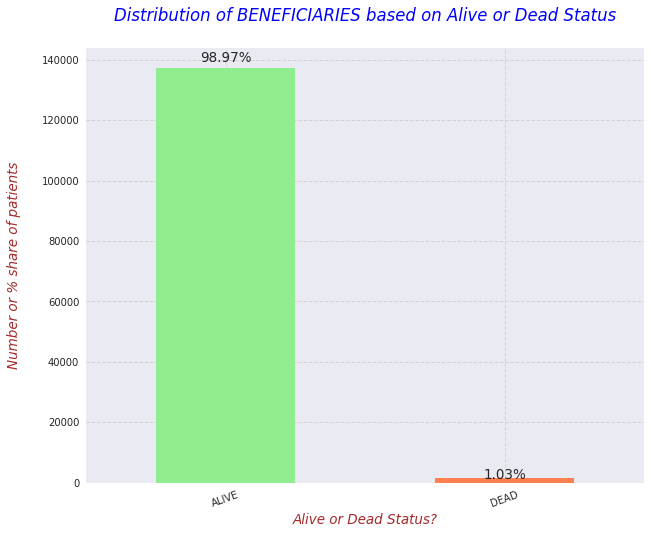

In [22]:
# Here, I'm displaying the distribution of whether BENEFICIARY is ALIVE or NOT?
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  fig = train_bene_df['Dead_or_Alive'].value_counts().plot(kind='bar', color=['lightgreen','coral'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
  # Providing the labels and title to the graph
  plt.xlabel("Alive or Dead Status?", fontdict=label_font_dict)
  plt.xticks(labels=["ALIVE","DEAD"], ticks=[0,1], rotation=20)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES based on Alive or Dead Status\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph tells us that almost 99% of the beneficiaries are ALIVE and very small percentage of patients are DEAD. It would be good to see how much this feature has impact on the actual label.

In [23]:
train_bene_df['DOD'] = pd.to_datetime(train_bene_df['DOD'])

In [24]:
# Greatest Date of Death in the TRAIN set for beneficiaries
max_bene_DOD = max(train_bene_df['DOD'].unique()[1:])
max_bene_DOD

numpy.datetime64('2009-12-01T00:00:00.000000000')

In [25]:
# For all NAN DODs filling the greatest Date of Death
train_bene_df['DOD'].fillna(value=max_bene_DOD, inplace=True)

* **`Adding new feature`** <::::::::::::::::::::::::> **"`Beneficiary AGE`"**
  * This represent the AGE of the beneficiary.


* **`REASONING`**
  * My intention behind adding this feature is to better analyse the CLAIM and Patient related data.

In [26]:
train_bene_df['AGE'] = np.round(((train_bene_df['DOD'] - train_bene_df['DOB']).dt.days)/365.0,1)

In [27]:
train_bene_df.drop(labels=['DOD'],axis=1,inplace=True)

In [28]:
train_bene_df.head()

,BeneID,DOB,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,Patient_Age_Year,Patient_Age_Month,Dead_or_Alive,AGE
0,BENE11001,1943-01-01,1,1,0,39,230,12,12,1,2,1,2,2,1,1,1,2,1,1,36000,3204,60,70,1943,1,0,67.0
1,BENE11002,1936-09-01,0,1,0,39,280,12,12,2,2,2,2,2,2,2,2,2,2,2,0,0,30,50,1936,9,0,73.3
2,BENE11003,1936-08-01,1,1,0,52,590,12,12,1,2,2,2,2,2,2,1,2,2,2,0,0,90,40,1936,8,0,73.4
3,BENE11004,1922-07-01,1,1,0,39,270,12,12,1,1,2,2,2,2,1,1,1,1,2,0,0,1810,760,1922,7,0,87.5
4,BENE11005,1935-09-01,1,1,0,24,680,12,12,2,2,2,2,1,2,1,2,2,2,2,0,0,1790,1200,1935,9,0,74.3


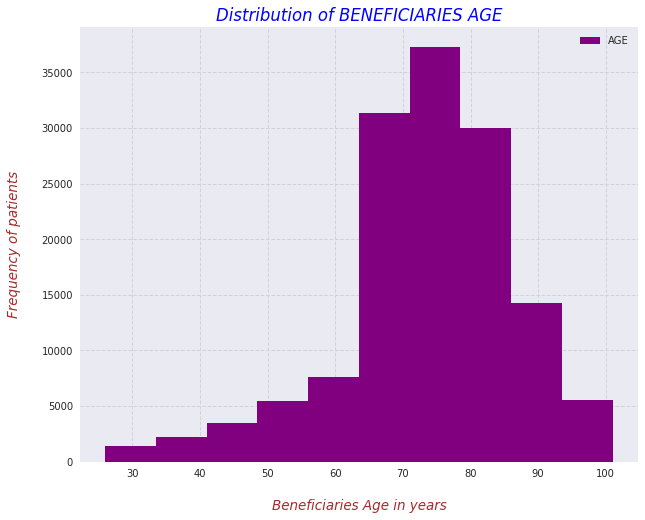

In [29]:
# Here, I'm displaying the distribution of AGE of Beneficiaries?
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  train_bene_df['AGE'].plot(kind='hist', color='purple')
  # Providing the labels and title to the graph
  plt.xlabel("\nBeneficiaries Age in years", fontdict=label_font_dict)
  plt.ylabel("Frequency of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES AGE", fontdict=title_font_dict)
  plt.legend();

- **`OBSERVATION`**
  - The above graph tells us that the majority of the beneficiaries are b/w 65 to 85 years.

In [30]:
train_bene_df['AGE'].describe()

count    138556.000000
mean         73.632756
std          12.736605
min          26.000000
25%          68.000000
50%          74.300000
75%          82.000000
max         101.000000
Name: AGE, dtype: float64

* **`Adding new categorical column`** <::::::::::::::::::::::::> **"`Beneficiary AGE brackets`"**
  * This will represent whether a patient falls in a specific AGE bracket?
    * [1-40] --> Group 1 --> Young
    * (40-60] --> Group 2 --> Mid Aged
    * (60-80] --> Group 3 --> Old 
    * (80 or more] --> Group 4 --> Very Old


* **`REASONING`**
  * My intention behind adding this feature is to see whether FRAUD claims are higher for specific AGE Groups?
    * The reasoning here is that there may be a potential pattern that providers files higher number of FRAUD claims for either a younger age group or very old age group.

In [31]:
def bene_age_brackets(val):
  if val >=1 and val <=40:
    return 'Young'
  elif val > 40 and val <=60:
    return 'Mid'
  elif val > 60 and val <= 80:
    return 'Old'
  else:
    return 'Very Old'

In [32]:
train_bene_df['AGE_groups'] = train_bene_df['AGE'].apply(lambda age: bene_age_brackets(age))

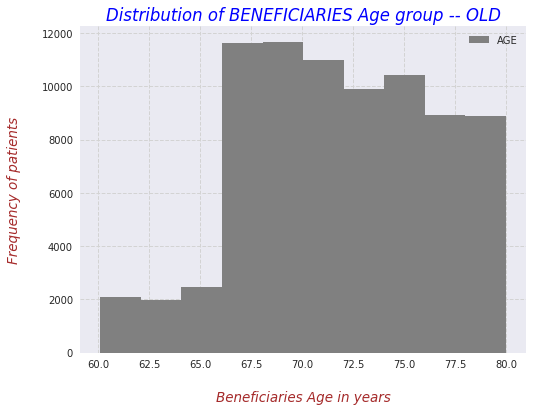

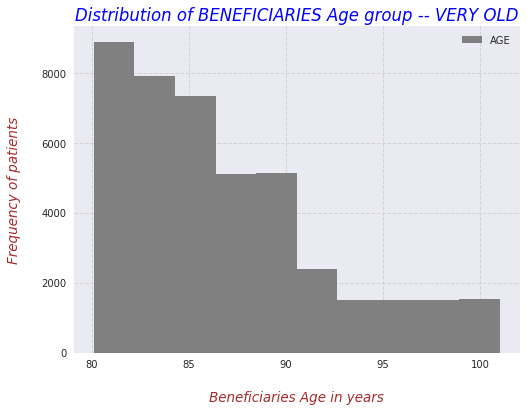

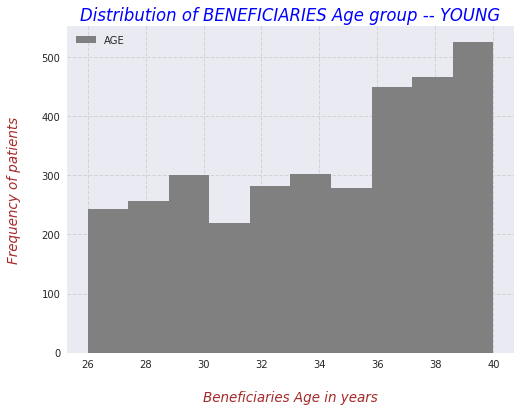

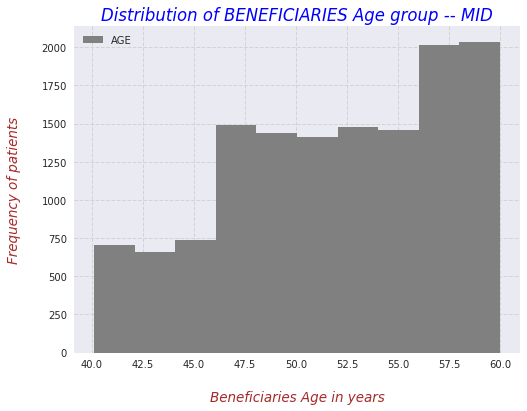

In [33]:
age_grps = list(train_bene_df['AGE_groups'].unique())
for grp in age_grps:
  # Here, I'm displaying the distribution of AGE GROUPS of Beneficiaries?
  with plt.style.context('seaborn'):
    plt.figure(figsize=(8,6))
    train_bene_df[train_bene_df['AGE_groups'] == grp]['AGE'].plot(kind='hist', color='grey')
    # Providing the labels and title to the graph
    plt.xlabel("\nBeneficiaries Age in years", fontdict=label_font_dict)
    plt.ylabel("Frequency of patients\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of BENEFICIARIES Age group -- {}".format(str(grp).upper()), fontdict=title_font_dict)
    plt.legend();

- **`OBSERVATION`**
  - The above graphs tells us about the spread of beneficiaries across the Age Groups.
    - For YOUNG group we can say that the spread is quite even across the ages of beneficiaries.

### **Q4. Lets see the ratio of GENDER across various HUMAN RACE?**

*  **The world population can be divided into 4 major races:**
  * white/Caucasian 
  * Mongoloid/Asian
  * Negroid/Black
  * Australoid. 

**This is based on a racial classification made by Carleton S. Coon in 1962. Refer [here](https://www.umsl.edu/~naumannj/culture%20and%20cultural%20geography/articles/How%20many%20major%20races%20are%20there%20in%20the%20world.docx#:~:text=The%20world%20population%20can%20be,classification%20made%20by%20Carleton%20S.).**

In [34]:
train_bene_df['Race'].unique()

array([1, 2, 3, 5])

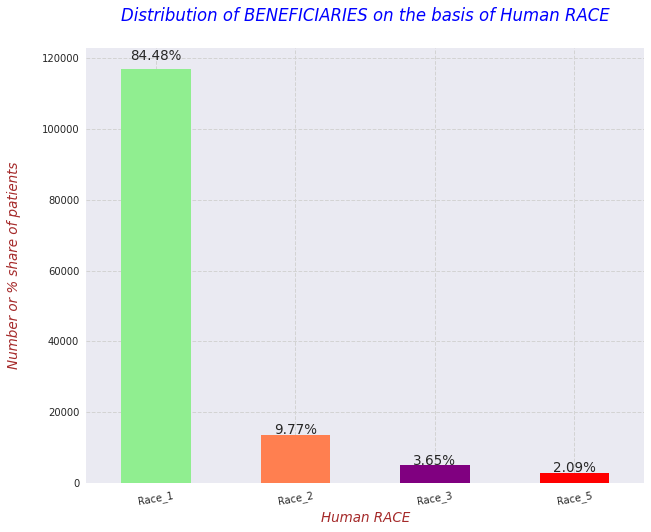

In [35]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of Human RACE
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  fig = train_bene_df['Race'].value_counts().plot(kind='bar', color=['lightgreen','coral','purple','red'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.02), ha='center', fontsize=13.5)
  # Providing the labels and title to the graph
  plt.xlabel("Human RACE", fontdict=label_font_dict)
  plt.xticks(labels=["Race_1","Race_2","Race_3","Race_5"], ticks=[0,1,2,3], rotation=10)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of Human RACE\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph tells us that there is a serious imbalance in the records for Human Race categories.

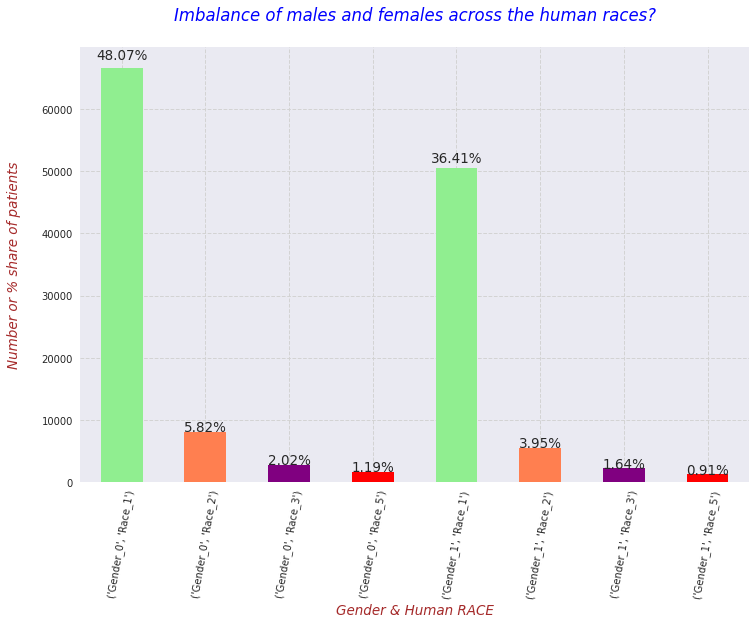

In [36]:
# Lets validate whether we have imbalance of males and females across the human races
with plt.style.context('seaborn'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['Gender','Race'])['AGE'].count().plot(kind='bar', color=['lightgreen','coral','purple','red','lightgreen','coral','purple','red'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.02), ha='center', fontsize=13.5)
  # Providing the labels and title to the graph
  plt.xlabel("Gender & Human RACE", fontdict=label_font_dict)
  plt.xticks(labels=[("Gender_0","Race_1"), ("Gender_0","Race_2"), ("Gender_0","Race_3"), ("Gender_0","Race_5"),("Gender_1","Race_1"), ("Gender_1","Race_2"), ("Gender_1","Race_3"), ("Gender_1","Race_5")],
             ticks=[0,1,2,3,4,5,6,7], rotation=80)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Imbalance of males and females across the human races?\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us whether we have an imbalance of males or females across the human races. 
    - And, it looks like within a specific human race there is no such gender imbalance.

### **Q5. Lets see the number of beneficiaries with Chronic Renal Disease.**

*  There are two main types of kidney disease - short-term (acute kidney injury) and lifelong (chronic).

*  The two main types of kidney disease are short-term (acute kidney injury) and lifelong (chronic kidney disease).
  *  Chronic kidney disease, also known as chronic renal disease or CKD, is a condition characterized by a gradual loss of kidney function over time.

* **What are the main causes of chronic kidney disease?**
  * Diabetes and high blood pressure, or hypertension, are responsible for two-thirds of chronic kidney disease cases.

**For more info refer here -->** [link-1](https://kidney.org.au/your-kidneys/what-is-kidney-disease/types-of-kidney-disease) 
[link-2](https://www.kidney.org/atoz/content/about-chronic-kidney-disease)

   RenalDiseaseIndicator
0                 118978
Y                  19578 



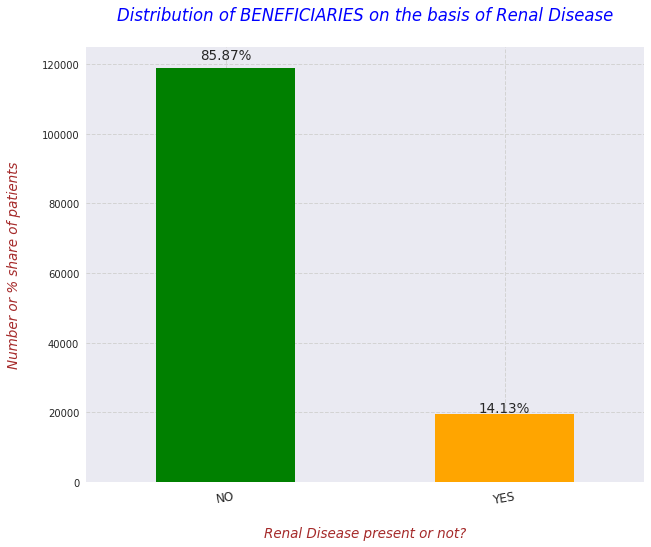

In [37]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of State
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  fig = train_bene_df['RenalDiseaseIndicator'].value_counts().plot(kind='bar', color=['green','orange'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.02), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nRenal Disease present or not?", fontdict=label_font_dict)
  plt.xticks(labels=["NO","YES"], ticks=[0,1], rotation=10, size=12)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of Renal Disease\n", fontdict=title_font_dict)

  # 0 means NO and 1 means YES
  print(pd.DataFrame(train_bene_df['RenalDiseaseIndicator'].value_counts()),"\n")

- **`OBSERVATION`**
  - Above graph tells us that around 14% of beneficiaries has or had Kidney Failure(Renal Disease).

   ChronicCond_KidneyDisease
2                      95277
1                      43279 



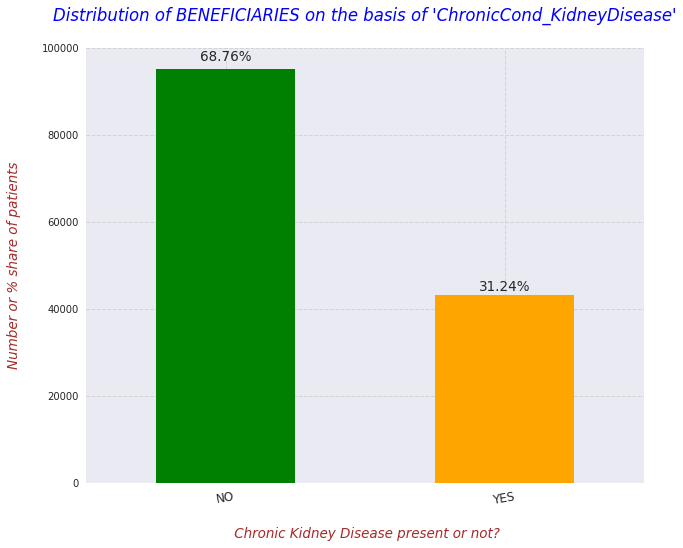

In [38]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of "ChronicCond_KidneyDisease"
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  fig = train_bene_df['ChronicCond_KidneyDisease'].value_counts().plot(kind='bar', color=['green','orange'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.02), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\n Chronic Kidney Disease present or not?", fontdict=label_font_dict)
  plt.xticks(labels=["NO","YES"], ticks=[0,1], rotation=10, size=12)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of 'ChronicCond_KidneyDisease'\n", fontdict=title_font_dict)

# I believe 2 means NO and 1 means YES
print(pd.DataFrame(train_bene_df['ChronicCond_KidneyDisease'].value_counts()),'\n')

- **`OBSERVATION`**
  - Above graph tells us that around 31% of Beneficiaries had Chronic Kidney Disease.

* In the beneficiary dataset, we have 2 columns:
  * RenalDisease
  * ChronicCond_KidneyDisease
Both of these columns appears to be representing the beneficiary history about the kidney disease.

I found this [link](https://www.kidney.org/blog/ask-doctor/chronic-kidney-disease-and-chronic-renal-failure-same-thing) useful in order to understand the difference b/w both of these. It looks they have RenalDisease indicator to represent whether the beneficiary has or had Kidney Failure.
And, ChronicCond_KidneyDisease represents the long term Kidney Disease may be like not functioning to the fullest.

                                                 Gender
RenalDiseaseIndicator ChronicCond_KidneyDisease        
0                     1                           27768
                      2                           91210
Y                     1                           15511
                      2                            4067 



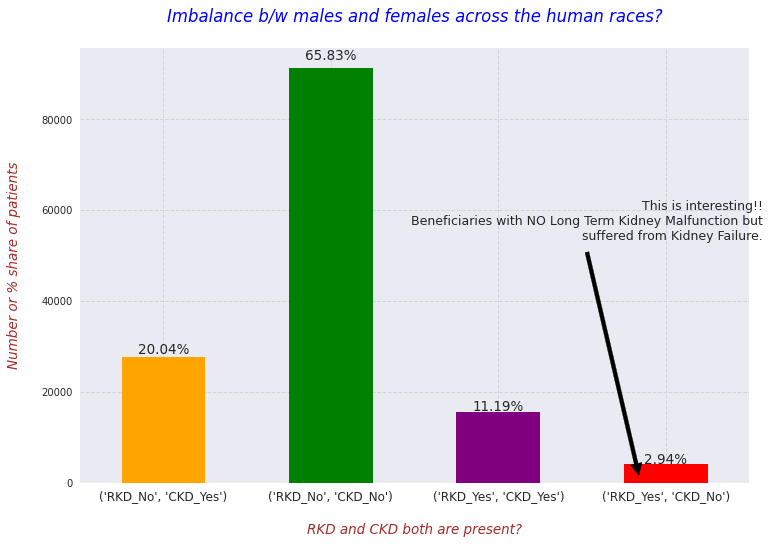

In [39]:
# Lets validate whether we have beneficiaries with both RKD & CKD?
with plt.style.context('seaborn'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['RenalDiseaseIndicator','ChronicCond_KidneyDisease'])['Gender'].count().plot(kind='bar', color=['orange','green','purple','red'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.02), ha='center', fontsize=13.5)
  
  # Added the Description for one of the horizontal bar
  fig.annotate('This is interesting!!\n Beneficiaries with NO Long Term Kidney Malfunction but\n suffered from Kidney Failure.', 
               xy=(2.85, 0.85),  xycoords='data', xytext=(1.02, 0.65), textcoords='axes fraction', fontsize=12.5,
               arrowprops=dict(facecolor='black', shrink=0.03), horizontalalignment='right', verticalalignment='top')

  # Providing the labels and title to the graph
  plt.xlabel("\nRKD and CKD both are present?", fontdict=label_font_dict)
  plt.xticks(labels=[("RKD_No","CKD_Yes"), ("RKD_No","CKD_No"), ("RKD_Yes","CKD_Yes"), ("RKD_Yes","CKD_No")], ticks=[0,1,2,3], rotation=0, size=12)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Imbalance b/w males and females across the human races?\n", fontdict=title_font_dict)

# RKD --> Renal Disease Indicator
# CKD --> Chronic Condition Kidney Disease
print(pd.DataFrame(train_bene_df.groupby(['RenalDiseaseIndicator','ChronicCond_KidneyDisease'])['Gender'].count()),"\n")

- **`OBSERVATION`**
  - In the above, we came to know that 2.94% of beneficiaries had no previously CKD but suffered from RKD. It would be good to check how many out these end-up as FRAUD claims.

### **Q6. Lets see the number of beneficiaries on the basis of State Codes.**

In [40]:
train_bene_df['State'].unique()

array([39, 52, 24, 23, 45, 15, 44, 41,  1, 14,  7, 13, 34, 31,  5, 49, 46,
        6, 38, 10, 26,  3, 20, 33, 18, 27, 51, 29, 42, 36, 11, 12, 30, 19,
        4, 25, 17, 16, 32,  2, 21, 50, 22, 54, 28, 43, 35, 37, 47,  8,  9,
       53])

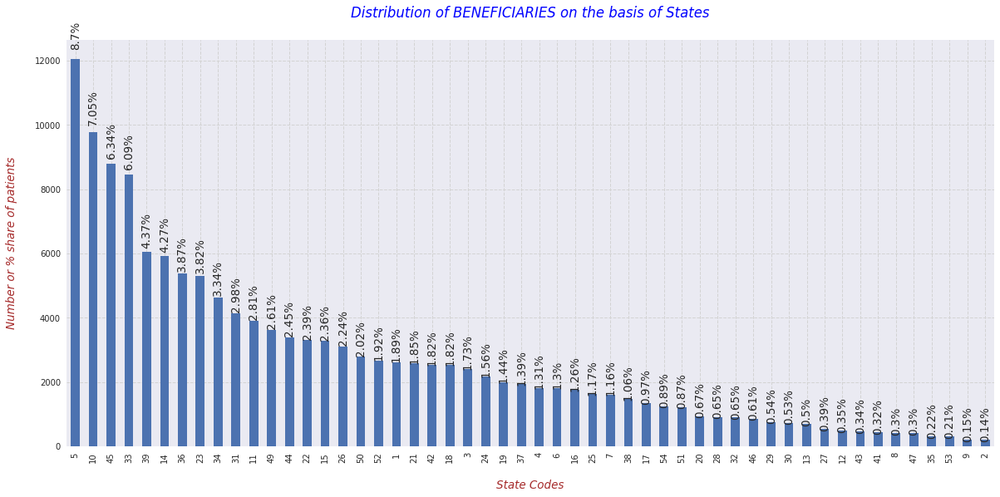

In [41]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of State
with plt.style.context('seaborn'):
  plt.figure(figsize=(20,9))
  fig = train_bene_df['State'].value_counts().plot(kind='bar')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.03), ha='center', fontsize=13.5, rotation=90)
  # Providing the labels and title to the graph
  plt.xlabel("\nState Codes", fontdict=label_font_dict)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of States\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us that for some States the number of beneficiaries are more as compared to the others. And, the maximum number of beneficiaries are from State-5.

### **Q7. Lets see the number of beneficiaries on the basis of Country Codes.**

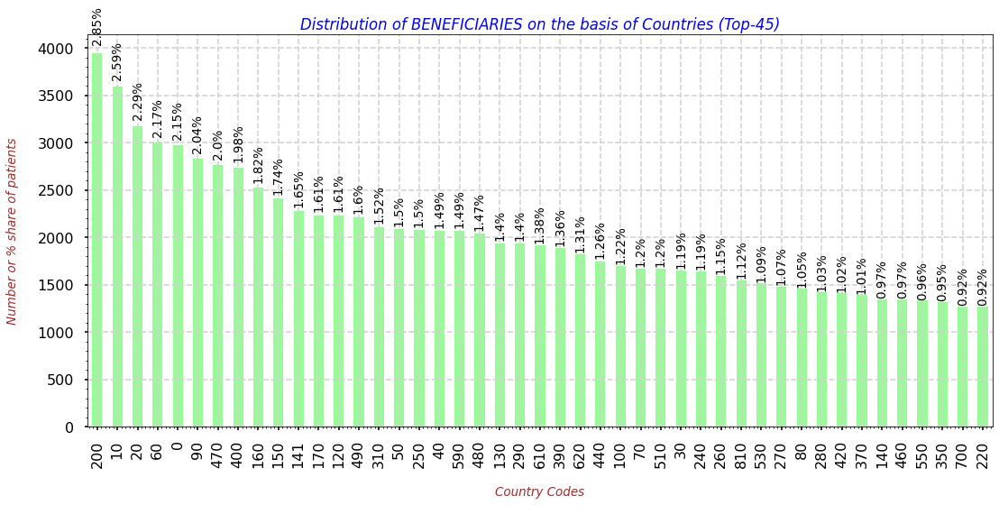

In [42]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of Country
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(18,8))
  fig = train_bene_df['County'].value_counts()[0:45].plot(kind='bar', color='palegreen')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.03), ha='center', fontsize=13.5, rotation=90)
  # Providing the labels and title to the graph
  plt.xlabel("\nCountry Codes", fontdict=label_font_dict)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of Countries (Top-45)", fontdict=title_font_dict)

In [43]:
# Countries with only handful of beneficiaries
train_bene_df['County'].value_counts()[::-1][0:45]

521    1
753    1
834    1
117    1
742    1
804    1
944    1
744    1
796    1
14     2
84     2
875    2
691    2
912    2
904    2
712    2
873    3
672    3
876    3
1      3
785    3
412    3
844    3
632    3
161    3
955    3
862    3
793    3
662    4
887    4
612    4
893    4
34     4
583    4
755    4
931    4
903    4
878    5
292    5
542    5
271    5
797    5
784    5
562    5
431    5
Name: County, dtype: int64

- **`OBSERVATION`**
  - The above graph shows us that distribution of beneficiaries based upon the country codes. Some having very high number of beneficiaries and others have very less.

- **`NOTE`**
  - One thing still needs to be evaluated that whether some specific state or country code has higher number of frauds?

### **Q8.1 Lets see the number of beneficiaries on the basis of 'NoOfMonths_PartACov'.**

In [44]:
train_bene_df['NoOfMonths_PartACov'].unique()

array([12,  0,  3,  7, 10, 11,  8,  4,  1,  6,  2,  9,  5])

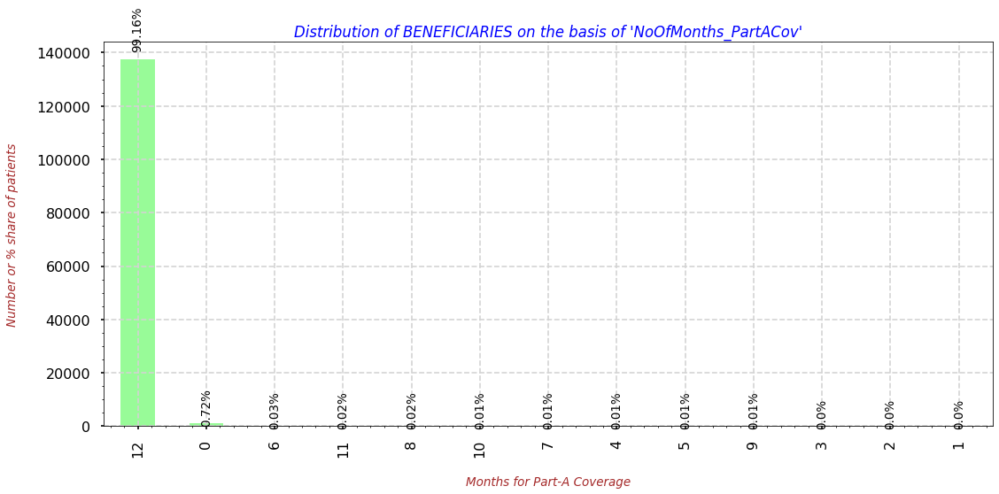

In [45]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of NoOfMonths_PartACov
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(18,8))
  fig = train_bene_df['NoOfMonths_PartACov'].value_counts().plot(kind='bar', color='palegreen')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.03), ha='center', fontsize=13.5, rotation=90)
  # Providing the labels and title to the graph
  plt.xlabel("\nMonths for Part-A Coverage", fontdict=label_font_dict)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of 'NoOfMonths_PartACov'", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us that more than 99% of beneficiaries have 12 months Part-A Coverage. My initial look to above plot tells me that this feature won't have much impact on the tgt labels.

### **Q8.2 Lets see the number of beneficiaries on the basis of 'NoOfMonths_PartBCov'.**

In [46]:
train_bene_df['NoOfMonths_PartBCov'].unique()

array([12,  0,  1,  9, 11,  3, 10,  8,  2,  6,  4,  5,  7])

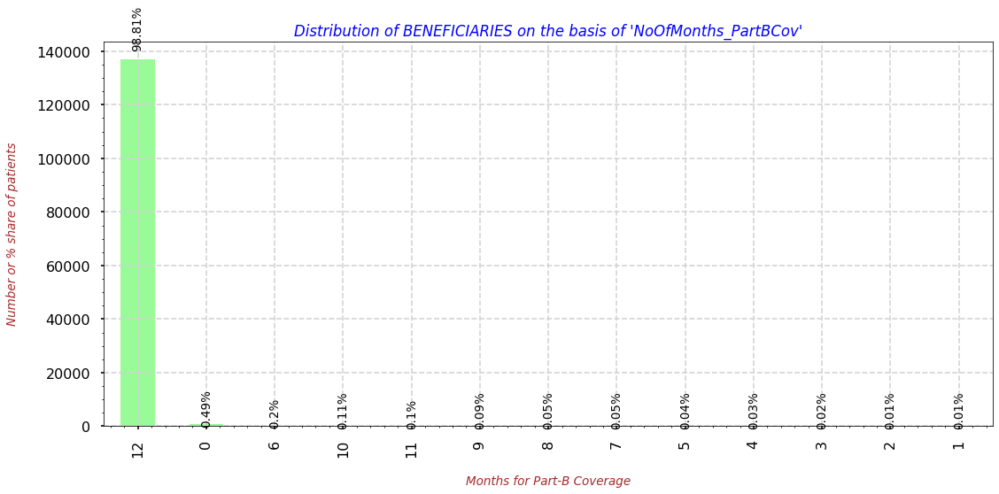

In [47]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of NoOfMonths_PartBCov
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(18,8))
  fig = train_bene_df['NoOfMonths_PartBCov'].value_counts().plot(kind='bar', color='palegreen')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.03), ha='center', fontsize=13.5, rotation=90)
  # Providing the labels and title to the graph
  plt.xlabel("\nMonths for Part-B Coverage", fontdict=label_font_dict)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of 'NoOfMonths_PartBCov'", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us that around 99% of beneficiaries have 12 months Part-B Coverage. My initial look to above plot tells me that this feature won't have much impact on the tgt labels.

### **Q9 Lets see the number of beneficiaries on the basis of 'ChronicCond_Alzheimer'. And, the Annual IP & OP expenditures for such patients.**

   ChronicCond_Alzheimer
2                  92530
1                  46026 



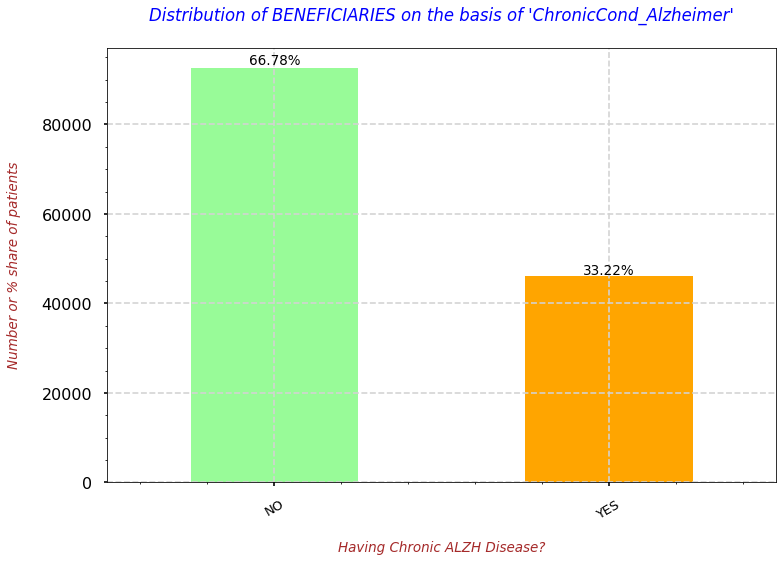

In [48]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of 'ChronicCond_Alzheimer'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df['ChronicCond_Alzheimer'].value_counts().plot(kind='bar', color=['palegreen','orange'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ALZH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['NO', 'YES'], fontsize=13, rotation=30)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of 'ChronicCond_Alzheimer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ALZH Disease
# 2 means -ve with Chronic ALZH Disease
print(pd.DataFrame(train_bene_df['ChronicCond_Alzheimer'].value_counts()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the beneficiaries with Chronic ALZH Disease are almost half as compared to the non-ALZH beneficiaries.

                       IPAnnualReimbursementAmt
ChronicCond_Alzheimer                          
1                                     247213280
2                                     259949690 



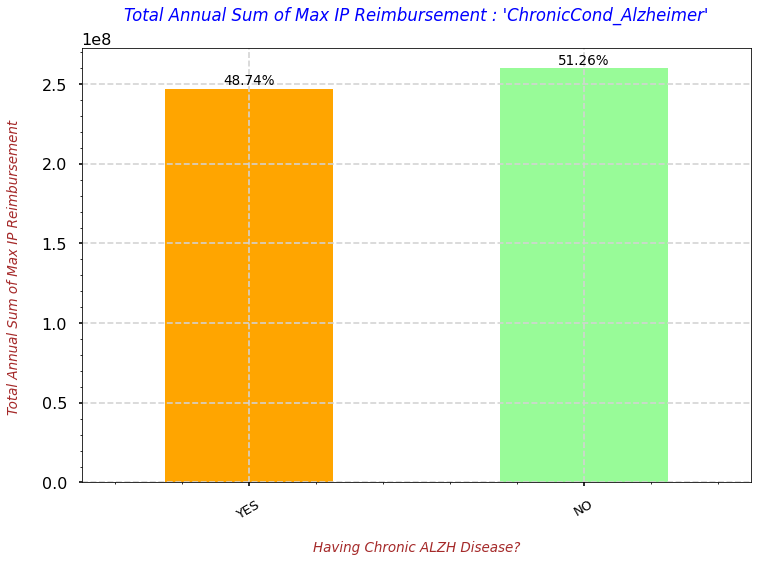

In [49]:
# Here, I'm displaying the Total Annual Sum of Max IP Reimbursement for 'ChronicCond_Alzheimer'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Alzheimer'])['IPAnnualReimbursementAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["IPAnnualReimbursementAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ALZH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of Max IP Reimbursement \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of Max IP Reimbursement : 'ChronicCond_Alzheimer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ALZH Disease
# 2 means -ve with Chronic ALZH Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['IPAnnualReimbursementAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that despite the non-ALZH beneficiaries are double in number as compared to their counterparts, however, the Annual Sum of MAX IP Reimbursement is almost same for both the groups.
    - This means if a beneficiary with or without chronic ALZH Disease get admitted then the annual reimbursement paid is approx same.
      - The difference is of 13 Million or 2.52%.

                       OPAnnualReimbursementAmt
ChronicCond_Alzheimer                          
1                                      74721530
2                                     105154550 



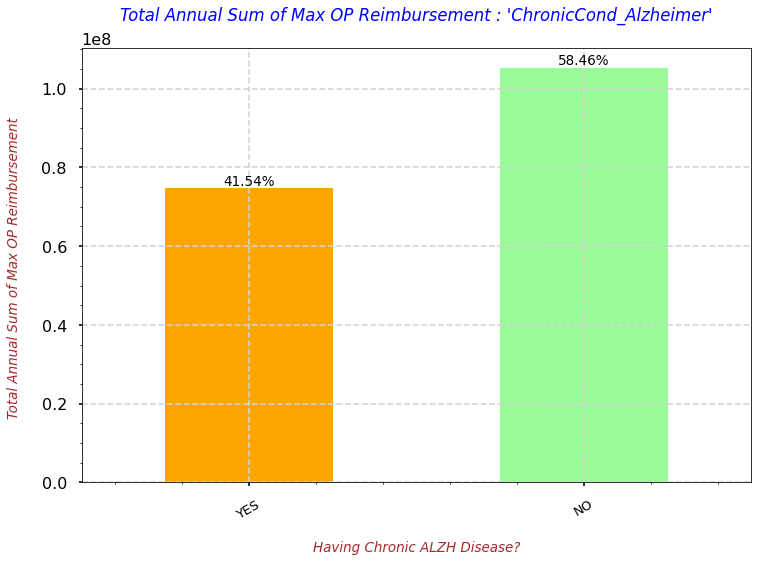

In [50]:
# Here, I'm displaying the Total Annual Sum of Max OP Reimbursement for 'ChronicCond_Alzheimer'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Alzheimer'])['OPAnnualReimbursementAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["OPAnnualReimbursementAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ALZH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of Max OP Reimbursement \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of Max OP Reimbursement : 'ChronicCond_Alzheimer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ALZH Disease
# 2 means -ve with Chronic ALZH Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['OPAnnualReimbursementAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Annual Sum of OP Reimbursement for non-chronic ALZH Disease beneficiaries is more than 31 Million or 16.92% than the other group.

                       IPAnnualDeductibleAmt
ChronicCond_Alzheimer                       
1                                   28200854
2                                   27200388 



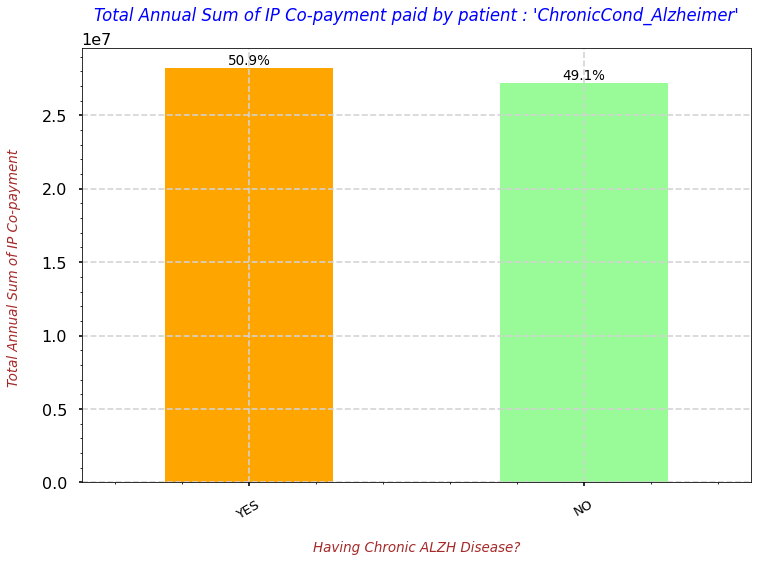

In [51]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Alzheimer'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Alzheimer'])['IPAnnualDeductibleAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["IPAnnualDeductibleAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ALZH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of IP Co-payment \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of IP Co-payment paid by patient : 'ChronicCond_Alzheimer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ALZH Disease
# 2 means -ve with Chronic ALZH Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['IPAnnualDeductibleAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Annual Sum of IP Co-payment paid by the patient of non-chronic & chronic ALZH Disease is almost same. The difference is only of 10 Million or 1.8%.
    - So, we can say that the re-imbursement & co-payment amounts are same for chronic and non-chronic patients if they gets admitted.

                       OPAnnualDeductibleAmt
ChronicCond_Alzheimer                       
1                                   21502981
2                                   30832150 



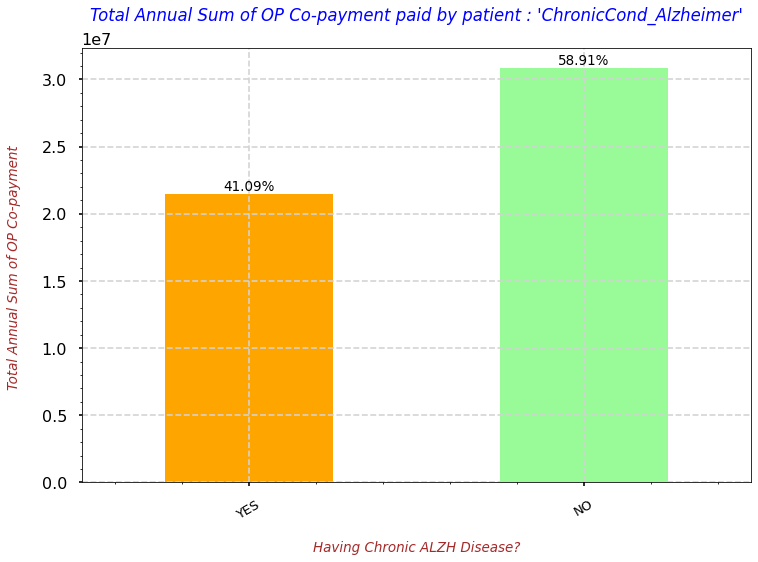

In [52]:
# Here, I'm displaying the Total Annual Sum of OP Co-payment for 'ChronicCond_Alzheimer'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Alzheimer'])['OPAnnualDeductibleAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["OPAnnualDeductibleAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ALZH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of OP Co-payment \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of OP Co-payment paid by patient : 'ChronicCond_Alzheimer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ALZH Disease
# 2 means -ve with Chronic ALZH Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['OPAnnualDeductibleAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Annual Sum of OP Co-payment paid by the patient of non-chronic is more as compared to chronic ALZH Disease. The difference is of 93.3 Million or 17.82%.
    - So, we can say that the co-payment paid by non-admitted patients is higher than the ones who gets admitted.

In [53]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['BeneID'].count())

,BeneID
ChronicCond_Alzheimer,
1,46026
2,92530


In [54]:
CC_ALZH_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Alzheimer'])['BeneID'].count())
CC_ALZH_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_ALZH_IP_R

,AVG IP Reimbursement Amt
ChronicCond_Alzheimer,
1,5371.165863
2,2809.355777


In [55]:
CC_ALZH_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Alzheimer'])['BeneID'].count())
CC_ALZH_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_ALZH_OP_R

,AVG OP Reimbursement Amt
ChronicCond_Alzheimer,
1,1623.463477
2,1136.437372


In [56]:
CC_ALZH_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Alzheimer'])['BeneID'].count())
CC_ALZH_IP_D.columns = ['AVG IP Co-payment Amt']
CC_ALZH_IP_D

,AVG IP Co-payment Amt
ChronicCond_Alzheimer,
1,612.715726
2,293.962909


In [57]:
CC_ALZH_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Alzheimer'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Alzheimer'])['BeneID'].count())
CC_ALZH_OP_D.columns = ['AVG OP Co-payment Amt']
CC_ALZH_OP_D

,AVG OP Co-payment Amt
ChronicCond_Alzheimer,
1,467.192044
2,333.212472


In [58]:
CC_ALZH_all_amts = pd.concat([CC_ALZH_IP_R, CC_ALZH_OP_R, CC_ALZH_IP_D, CC_ALZH_OP_D], axis=1)
CC_ALZH_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_Alzheimer,,,,
1,5371.165863,1623.463477,612.715726,467.192044
2,2809.355777,1136.437372,293.962909,333.212472


                       AVG IP Reimbursement Amt  AVG OP Reimbursement Amt  \
ChronicCond_Alzheimer                                                       
1                                   5371.165863               1623.463477   
2                                   2809.355777               1136.437372   

                       AVG IP Co-payment Amt  AVG OP Co-payment Amt  
ChronicCond_Alzheimer                                                
1                                 612.715726             467.192044  
2                                 293.962909             333.212472   



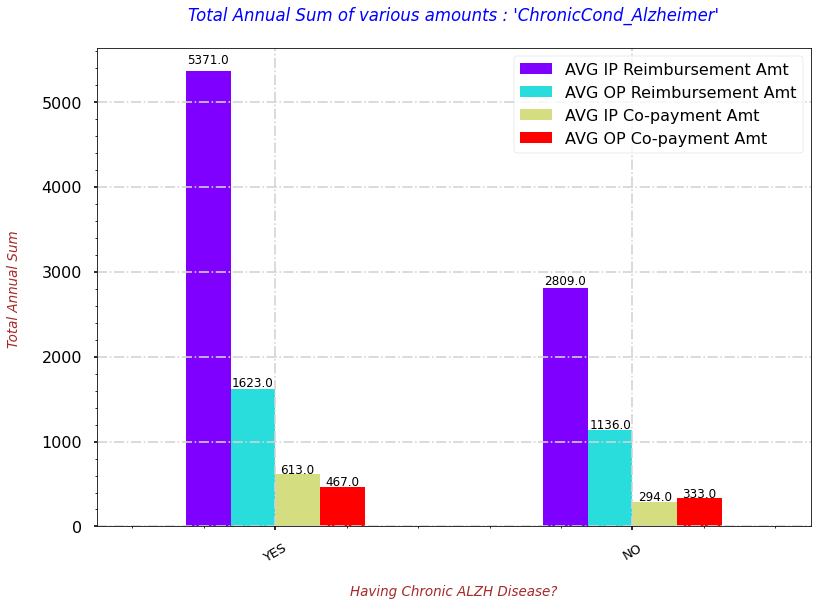

In [59]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Alzheimer'
with plt.style.context('seaborn-poster'):
  fig = CC_ALZH_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ALZH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Alzheimer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ALZH Disease
# 2 means -ve with Chronic ALZH Disease
print(CC_ALZH_all_amts,"\n")

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic ALZH disease. To be more precise, in case of +ve it is more than 50%.
    - For other comparisons the difference is not very high.

### **Q10. Lets see the number of beneficiaries on the basis of 'ChronicCond_Heartfailure'. And, the Annual IP & OP expenditures for such patients.**

   ChronicCond_Heartfailure
2                     70154
1                     68402 



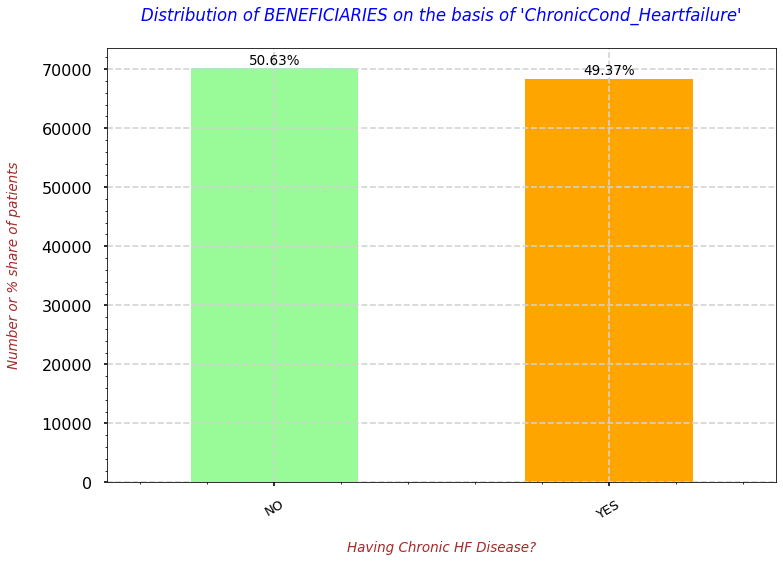

In [60]:
# Here, I'm displaying the distribution of BENEFICIARIES on the basis of 'ChronicCond_Heartfailure'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df['ChronicCond_Heartfailure'].value_counts().plot(kind='bar', color=['palegreen','orange'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/train_bene_df.shape[0],2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic HF Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['NO', 'YES'], fontsize=13, rotation=30)
  plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Distribution of BENEFICIARIES on the basis of 'ChronicCond_Heartfailure'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic HF Disease
# 2 means -ve with Chronic HF Disease
print(pd.DataFrame(train_bene_df['ChronicCond_Heartfailure'].value_counts()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the beneficiaries with Chronic HF Disease are almost equal to the non-ALZH beneficiaries.

                          IPAnnualReimbursementAmt
ChronicCond_Heartfailure                          
1                                        370856140
2                                        136306830 



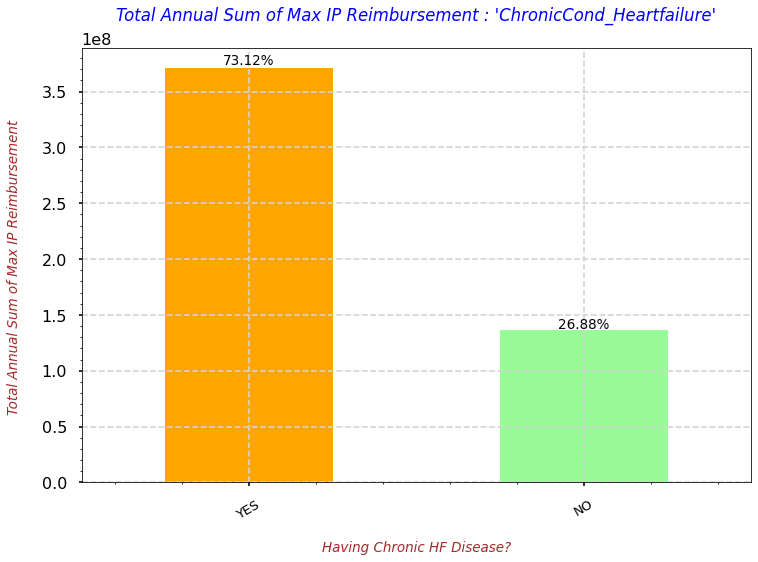

In [61]:
# Here, I'm displaying the Total Annual Sum of Max IP Reimbursement for 'ChronicCond_Heartfailure'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Heartfailure'])['IPAnnualReimbursementAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["IPAnnualReimbursementAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic HF Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of Max IP Reimbursement \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of Max IP Reimbursement : 'ChronicCond_Heartfailure'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic HF Disease
# 2 means -ve with Chronic HF Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['IPAnnualReimbursementAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Payer pays very high amount annually for patients with Chronic Heart Failure Disease.
      - The difference is of around 234 Million or 47%. This is very high and it can be a potential sign of FRAUD claims.

                          OPAnnualReimbursementAmt
ChronicCond_Heartfailure                          
1                                        114280500
2                                         65595580 



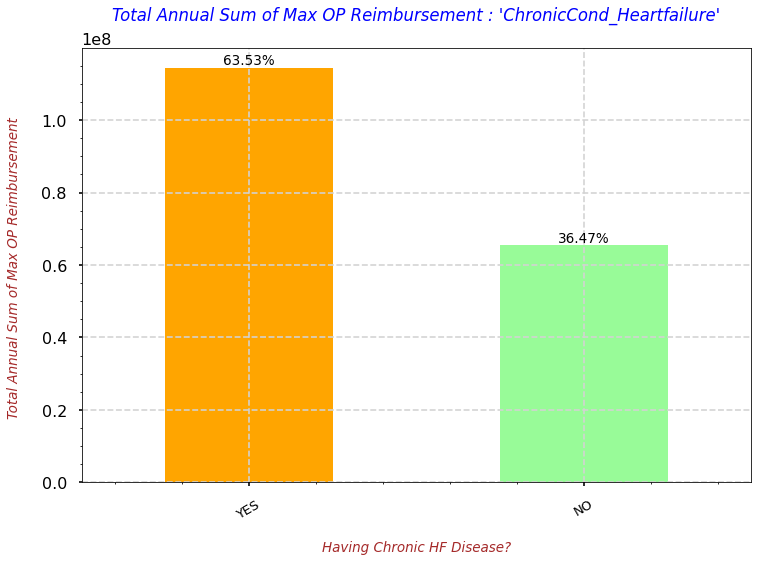

In [62]:
# Here, I'm displaying the Total Annual Sum of Max OP Reimbursement for 'ChronicCond_Heartfailure'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Heartfailure'])['OPAnnualReimbursementAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["OPAnnualReimbursementAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic HF Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of Max OP Reimbursement \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of Max OP Reimbursement : 'ChronicCond_Heartfailure'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic HF Disease
# 2 means -ve with Chronic HF Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['OPAnnualReimbursementAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Annual Sum paid by the payers for non-admitted patients is 49 Million more than the other group. This again can be a potential sign of fraud claims.

                          IPAnnualDeductibleAmt
ChronicCond_Heartfailure                       
1                                      40303650
2                                      15097592 



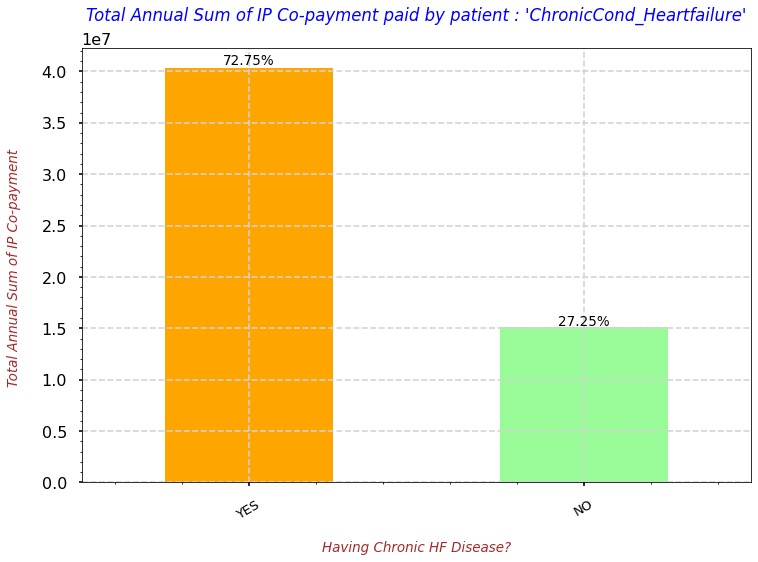

In [63]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Heartfailure'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Heartfailure'])['IPAnnualDeductibleAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["IPAnnualDeductibleAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic HF Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of IP Co-payment \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of IP Co-payment paid by patient : 'ChronicCond_Heartfailure'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic HF Disease
# 2 means -ve with Chronic HF Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['IPAnnualDeductibleAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Annual Sum of IP Co-payment paid by the patient of non-chronic & chronic HF Disease has a difference of 25 Million.
    - But, the point to note here that the co-payment proportion is very less in front of the part paid by the Payer. This again can be potential sign of FRAUD.

                          OPAnnualDeductibleAmt
ChronicCond_Heartfailure                       
1                                      32649838
2                                      19685293 



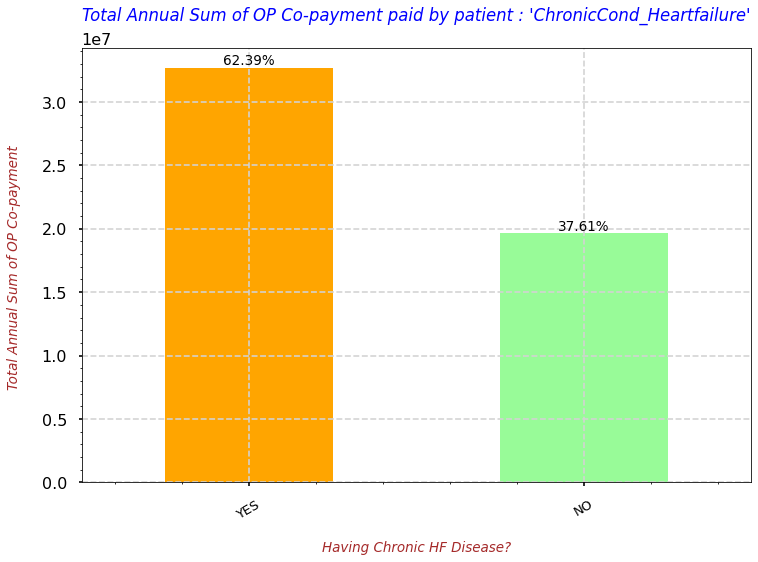

In [64]:
# Here, I'm displaying the Total Annual Sum of OP Co-payment for 'ChronicCond_Heartfailure'
with plt.style.context('seaborn-poster'):
  plt.figure(figsize=(12,8))
  fig = train_bene_df.groupby(['ChronicCond_Heartfailure'])['OPAnnualDeductibleAmt'].sum().plot(kind='bar', color=['orange','palegreen'])
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{str(round((height*100)/(train_bene_df["OPAnnualDeductibleAmt"].sum()),2))+"%"}', (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic HF Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum of OP Co-payment \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="--", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of OP Co-payment paid by patient : 'ChronicCond_Heartfailure'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic HF Disease
# 2 means -ve with Chronic HF Disease
print(pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['OPAnnualDeductibleAmt'].sum()),"\n")

- **`OBSERVATION`**
  - The above graph shows us that the Annual Sum of OP Co-payment paid by the patient of non-chronic & chronic HF Disease has a difference of 13 Million.
    - But, the point to note here that the co-payment proportion is very less in front of the part paid by the Payer. This again can be potential sign of FRAUD.

In [65]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['BeneID'].count())

,BeneID
ChronicCond_Heartfailure,
1,68402
2,70154


In [66]:
CC_HF_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Heartfailure'])['BeneID'].count())
CC_HF_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_HF_IP_R

,AVG IP Reimbursement Amt
ChronicCond_Heartfailure,
1,5421.714862
2,1942.965904


In [67]:
CC_HF_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Heartfailure'])['BeneID'].count())
CC_HF_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_HF_OP_R

,AVG OP Reimbursement Amt
ChronicCond_Heartfailure,
1,1670.718692
2,935.022664


In [68]:
CC_HF_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Heartfailure'])['BeneID'].count())
CC_HF_IP_D.columns = ['AVG IP Co-payment Amt']
CC_HF_IP_D

,AVG IP Co-payment Amt
ChronicCond_Heartfailure,
1,589.217421
2,215.206432


In [69]:
CC_HF_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Heartfailure'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Heartfailure'])['BeneID'].count())
CC_HF_OP_D.columns = ['AVG OP Co-payment Amt']
CC_HF_OP_D

,AVG OP Co-payment Amt
ChronicCond_Heartfailure,
1,477.322856
2,280.601149


In [70]:
CC_HF_all_amts = pd.concat([CC_HF_IP_R, CC_HF_OP_R, CC_HF_IP_D, CC_HF_OP_D], axis=1)
CC_HF_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_Heartfailure,,,,
1,5421.714862,1670.718692,589.217421,477.322856
2,1942.965904,935.022664,215.206432,280.601149


                          AVG IP Reimbursement Amt  AVG OP Reimbursement Amt  \
ChronicCond_Heartfailure                                                       
1                                      5421.714862               1670.718692   
2                                      1942.965904                935.022664   

                          AVG IP Co-payment Amt  AVG OP Co-payment Amt  
ChronicCond_Heartfailure                                                
1                                    589.217421             477.322856  
2                                    215.206432             280.601149   



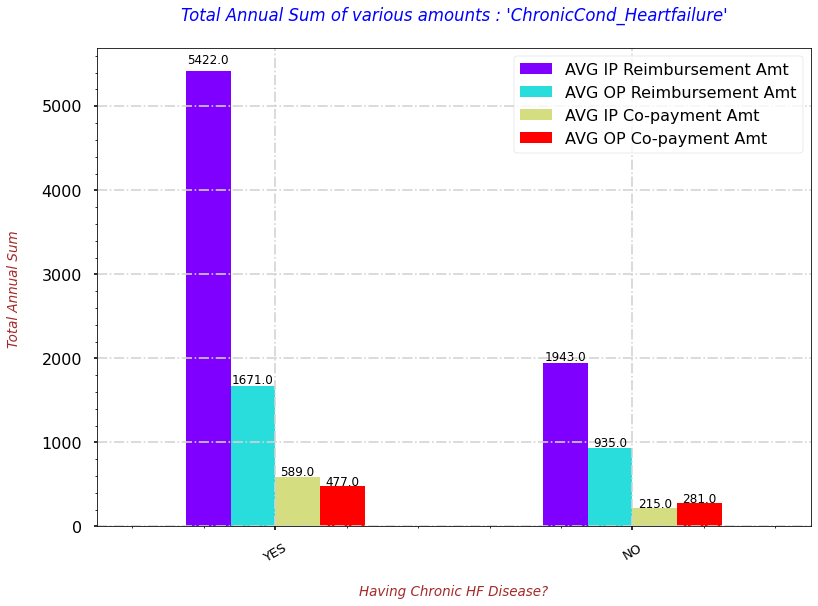

In [71]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Heartfailure'
with plt.style.context('seaborn-poster'):
  fig = CC_HF_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic HF Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Heartfailure'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic HF Disease
# 2 means -ve with Chronic HF Disease
print(CC_HF_all_amts,"\n")

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is more than 50%.
    - For other comparisons the difference is not very high.

### **Q11. Lets see the number of beneficiaries on the basis of 'ChronicCond_KidneyDisease'. And, the Annual IP & OP expenditures for such patients.**

In [72]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_KidneyDisease'])['BeneID'].count())

,BeneID
ChronicCond_KidneyDisease,
1,43279
2,95277


In [73]:
CC_KD_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_KidneyDisease'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_KidneyDisease'])['BeneID'].count())
CC_KD_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_KD_IP_R

,AVG IP Reimbursement Amt
ChronicCond_KidneyDisease,
1,7500.768040
2,1915.858287


In [74]:
CC_KD_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_KidneyDisease'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_KidneyDisease'])['BeneID'].count())
CC_KD_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_KD_OP_R

,AVG OP Reimbursement Amt
ChronicCond_KidneyDisease,
1,2061.602625
2,951.457120


In [75]:
CC_KD_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_KidneyDisease'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_KidneyDisease'])['BeneID'].count())
CC_KD_IP_D.columns = ['AVG IP Co-payment Amt']
CC_KD_IP_D

,AVG IP Co-payment Amt
ChronicCond_KidneyDisease,
1,785.385707
2,224.718809


In [76]:
CC_KD_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_KidneyDisease'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_KidneyDisease'])['BeneID'].count())
CC_KD_OP_D.columns = ['AVG OP Co-payment Amt']
CC_KD_OP_D

,AVG OP Co-payment Amt
ChronicCond_KidneyDisease,
1,582.706417
2,284.603629


In [77]:
CC_KD_all_amts = pd.concat([CC_KD_IP_R, CC_KD_OP_R, CC_KD_IP_D, CC_KD_OP_D], axis=1)
CC_KD_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_KidneyDisease,,,,
1,7500.768040,2061.602625,785.385707,582.706417
2,1915.858287,951.457120,224.718809,284.603629


                           AVG IP Reimbursement Amt  AVG OP Reimbursement Amt  \
ChronicCond_KidneyDisease                                                       
1                                       7500.768040               2061.602625   
2                                       1915.858287                951.457120   

                           AVG IP Co-payment Amt  AVG OP Co-payment Amt  
ChronicCond_KidneyDisease                                                
1                                     785.385707             582.706417  
2                                     224.718809             284.603629   



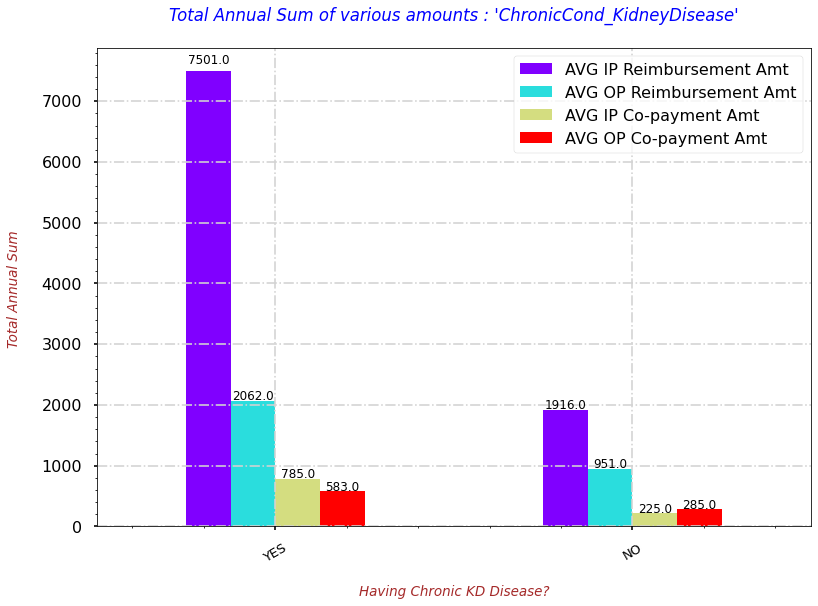

In [78]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_KidneyDisease'
with plt.style.context('seaborn-poster'):
  fig = CC_KD_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic KD Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_KidneyDisease'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic KD Disease
# 2 means -ve with Chronic KD Disease
print(CC_KD_all_amts,"\n")

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is more than 50%.
    - For other comparisons the difference is not very high.

### **Q12. Lets see the number of beneficiaries on the basis of 'ChronicCond_Cancer'. And, the Annual IP & OP expenditures for such patients.**

In [79]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_Cancer'])['BeneID'].count())

,BeneID
ChronicCond_Cancer,
1,16621
2,121935


In [80]:
CC_CN_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Cancer'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Cancer'])['BeneID'].count())
CC_CN_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_CN_IP_R

,AVG IP Reimbursement Amt
ChronicCond_Cancer,
1,6067.532038
2,3332.222250


In [81]:
CC_CN_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Cancer'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Cancer'])['BeneID'].count())
CC_CN_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_CN_OP_R

,AVG OP Reimbursement Amt
ChronicCond_Cancer,
1,1788.427291
2,1231.398942


In [82]:
CC_CN_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Cancer'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Cancer'])['BeneID'].count())
CC_CN_IP_D.columns = ['AVG IP Co-payment Amt']
CC_CN_IP_D

,AVG IP Co-payment Amt
ChronicCond_Cancer,
1,636.339811
2,367.610924


In [83]:
CC_CN_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Cancer'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Cancer'])['BeneID'].count())
CC_CN_OP_D.columns = ['AVG OP Co-payment Amt']
CC_CN_OP_D

,AVG OP Co-payment Amt
ChronicCond_Cancer,
1,520.832682
2,358.210284


In [84]:
CC_CN_all_amts = pd.concat([CC_CN_IP_R, CC_CN_OP_R, CC_CN_IP_D, CC_CN_OP_D], axis=1)
CC_CN_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_Cancer,,,,
1,6067.532038,1788.427291,636.339811,520.832682
2,3332.222250,1231.398942,367.610924,358.210284


                    AVG IP Reimbursement Amt  AVG OP Reimbursement Amt  \
ChronicCond_Cancer                                                       
1                                6067.532038               1788.427291   
2                                3332.222250               1231.398942   

                    AVG IP Co-payment Amt  AVG OP Co-payment Amt  
ChronicCond_Cancer                                                
1                              636.339811             520.832682  
2                              367.610924             358.210284   



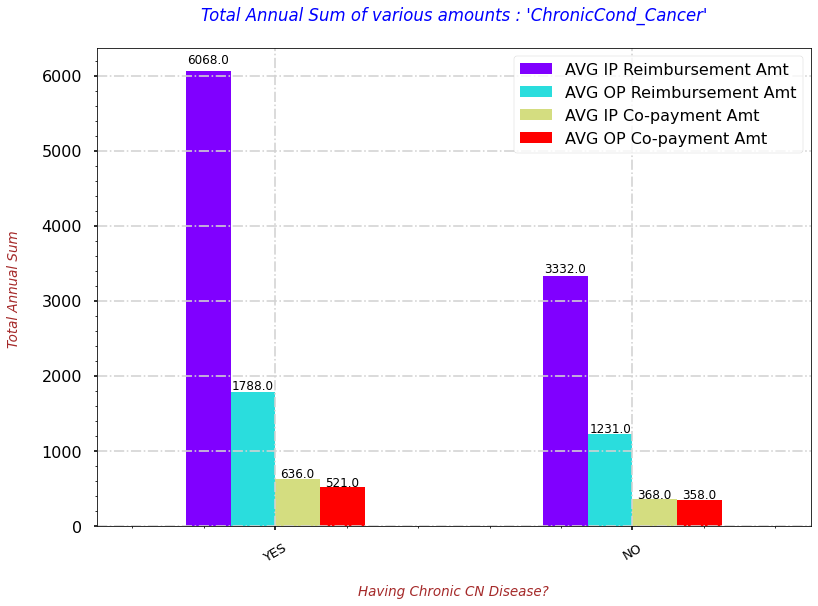

In [85]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Cancer'
with plt.style.context('seaborn-poster'):
  fig = CC_CN_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic CN Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Cancer'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic CN Disease
# 2 means -ve with Chronic CN Disease
print(CC_CN_all_amts,"\n")

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is around 50%.
    - For other comparisons the difference is not very high.

### **Q13. Lets see the number of beneficiaries on the basis of 'ChronicCond_ObstrPulmonary'. And, the Annual IP & OP expenditures for such patients.**

In [86]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['BeneID'].count())

,BeneID
ChronicCond_ObstrPulmonary,
1,32859
2,105697


In [87]:
CC_PL_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['BeneID'].count())
CC_PL_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_PL_IP_R

,AVG IP Reimbursement Amt
ChronicCond_ObstrPulmonary,
1,7361.772422
2,2509.650132


In [88]:
CC_PL_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['BeneID'].count())
CC_PL_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_PL_OP_R

,AVG OP Reimbursement Amt
ChronicCond_ObstrPulmonary,
1,1810.864908
2,1138.848501


In [89]:
CC_PL_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['BeneID'].count())
CC_PL_IP_D.columns = ['AVG IP Co-payment Amt']
CC_PL_IP_D

,AVG IP Co-payment Amt
ChronicCond_ObstrPulmonary,
1,818.228917
2,269.781148


In [90]:
CC_PL_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_ObstrPulmonary'])['BeneID'].count())
CC_PL_OP_D.columns = ['AVG OP Co-payment Amt']
CC_PL_OP_D

,AVG OP Co-payment Amt
ChronicCond_ObstrPulmonary,
1,519.44767
2,333.65753


In [91]:
CC_PL_all_amts = pd.concat([CC_PL_IP_R, CC_PL_OP_R, CC_PL_IP_D, CC_PL_OP_D], axis=1)
CC_PL_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_ObstrPulmonary,,,,
1,7361.772422,1810.864908,818.228917,519.44767
2,2509.650132,1138.848501,269.781148,333.65753


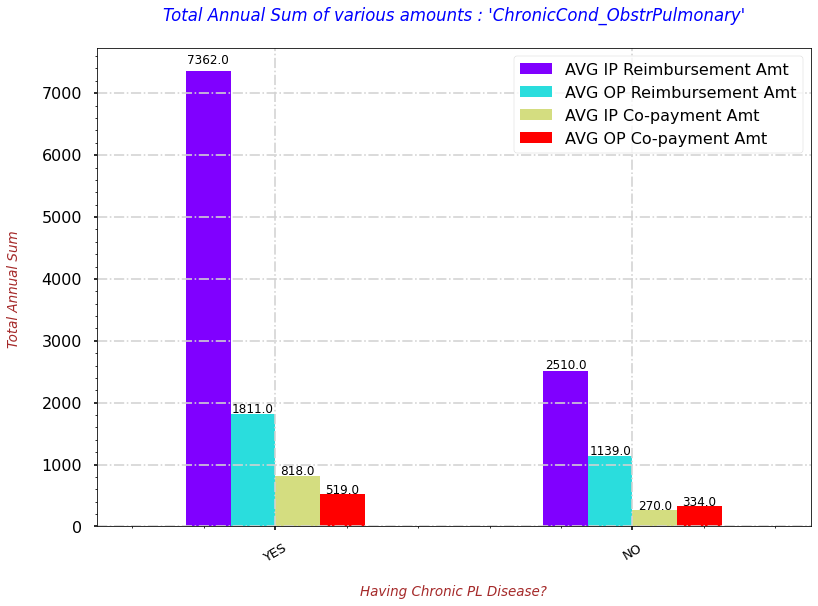

In [92]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_ObstrPulmonary'
with plt.style.context('seaborn-poster'):
  fig = CC_PL_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic PL Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_ObstrPulmonary'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic PL Disease
# 2 means -ve with Chronic PL Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is more than 50%.
    - For other comparisons the difference is not very high.

### **Q14. Lets see the number of beneficiaries on the basis of 'ChronicCond_Depression'. And, the Annual IP & OP expenditures for such patients.**

In [93]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_Depression'])['BeneID'].count())

,BeneID
ChronicCond_Depression,
1,49260
2,89296


In [94]:
CC_DP_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Depression'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Depression'])['BeneID'].count())
CC_DP_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_DP_IP_R

,AVG IP Reimbursement Amt
ChronicCond_Depression,
1,5022.162810
2,2909.102647


In [95]:
CC_DP_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Depression'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Depression'])['BeneID'].count())
CC_DP_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_DP_OP_R

,AVG OP Reimbursement Amt
ChronicCond_Depression,
1,1603.871701
2,1129.606701


In [96]:
CC_DP_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Depression'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Depression'])['BeneID'].count())
CC_DP_IP_D.columns = ['AVG IP Co-payment Amt']
CC_DP_IP_D

,AVG IP Co-payment Amt
ChronicCond_Depression,
1,570.054771
2,305.952607


In [97]:
CC_DP_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Depression'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Depression'])['BeneID'].count())
CC_DP_OP_D.columns = ['AVG OP Co-payment Amt']
CC_DP_OP_D

,AVG OP Co-payment Amt
ChronicCond_Depression,
1,464.285708
2,329.963459


In [98]:
CC_DP_all_amts = pd.concat([CC_DP_IP_R, CC_DP_OP_R, CC_DP_IP_D, CC_DP_OP_D], axis=1)
CC_DP_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_Depression,,,,
1,5022.162810,1603.871701,570.054771,464.285708
2,2909.102647,1129.606701,305.952607,329.963459


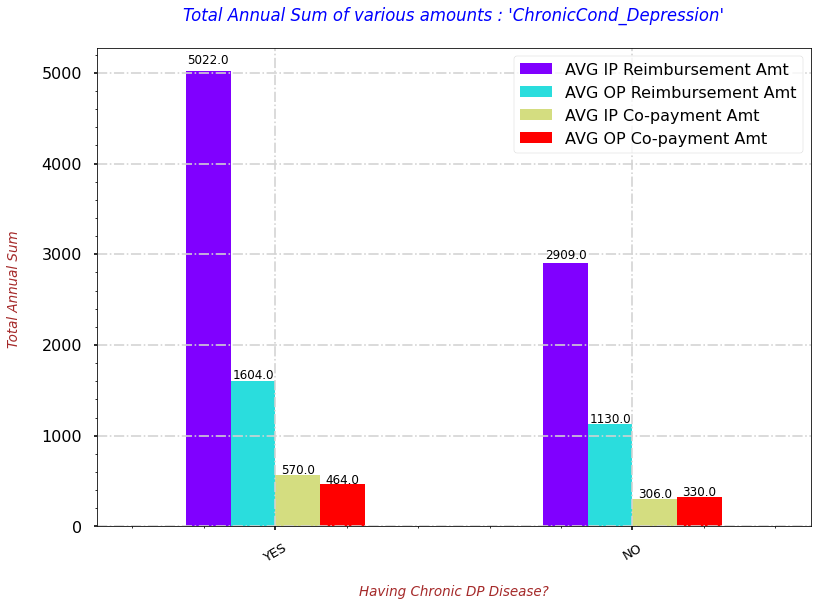

In [99]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Depression'
with plt.style.context('seaborn-poster'):
  fig = CC_DP_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic DP Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Depression'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic DP Disease
# 2 means -ve with Chronic DP Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is around 42%.
    - For other comparisons the difference is not very high.

### **Q15. Lets see the number of beneficiaries on the basis of 'ChronicCond_Diabetes'. And, the Annual IP & OP expenditures for such patients.**

In [100]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_Diabetes'])['BeneID'].count())

,BeneID
ChronicCond_Diabetes,
1,83391
2,55165


In [101]:
CC_DB_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Diabetes'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Diabetes'])['BeneID'].count())
CC_DB_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_DB_IP_R

,AVG IP Reimbursement Amt
ChronicCond_Diabetes,
1,4870.622010
2,1830.815372


In [102]:
CC_DB_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Diabetes'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Diabetes'])['BeneID'].count())
CC_DB_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_DB_OP_R

,AVG OP Reimbursement Amt
ChronicCond_Diabetes,
1,1607.259536
2,831.054110


In [103]:
CC_DB_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Diabetes'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Diabetes'])['BeneID'].count())
CC_DB_IP_D.columns = ['AVG IP Co-payment Amt']
CC_DB_IP_D

,AVG IP Co-payment Amt
ChronicCond_Diabetes,
1,534.254680
2,196.668359


In [104]:
CC_DB_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Diabetes'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Diabetes'])['BeneID'].count())
CC_DB_OP_D.columns = ['AVG OP Co-payment Amt']
CC_DB_OP_D

,AVG OP Co-payment Amt
ChronicCond_Diabetes,
1,464.345421
2,246.767008


In [105]:
CC_DB_all_amts = pd.concat([CC_DB_IP_R, CC_DB_OP_R, CC_DB_IP_D, CC_DB_OP_D], axis=1)
CC_DB_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_Diabetes,,,,
1,4870.622010,1607.259536,534.254680,464.345421
2,1830.815372,831.054110,196.668359,246.767008


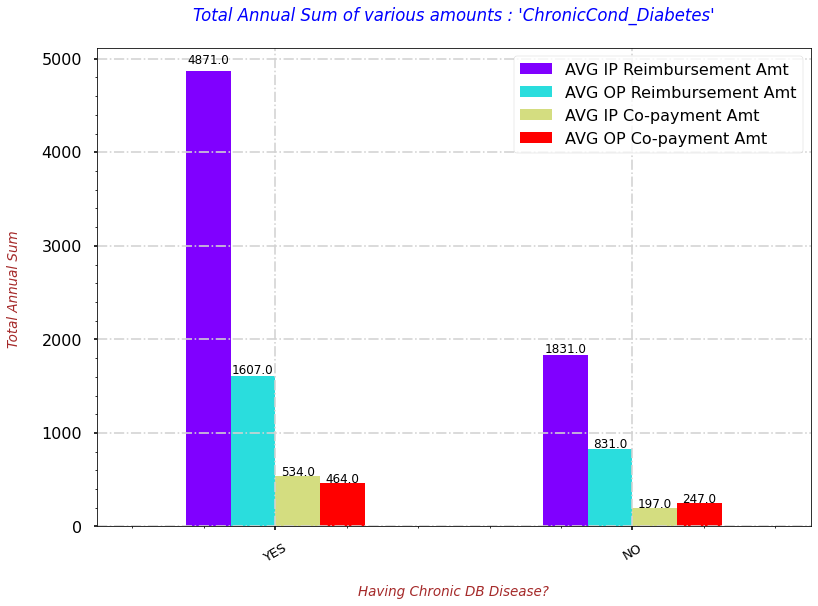

In [106]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Diabetes'
with plt.style.context('seaborn-poster'):
  fig = CC_DB_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic DB Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Diabetes'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic DB Disease
# 2 means -ve with Chronic DB Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is more than 50%.
    - For other comparisons the difference is not very high.

### **Q16. Lets see the number of beneficiaries on the basis of 'ChronicCond_IschemicHeart'. And, the Annual IP & OP expenditures for such patients.**

In [107]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_IschemicHeart'])['BeneID'].count())

,BeneID
ChronicCond_IschemicHeart,
1,93644
2,44912


In [108]:
CC_IH_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_IschemicHeart'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_IschemicHeart'])['BeneID'].count())
CC_IH_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_IH_IP_R

,AVG IP Reimbursement Amt
ChronicCond_IschemicHeart,
1,4697.683034
2,1497.442554


In [109]:
CC_IH_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_IschemicHeart'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_IschemicHeart'])['BeneID'].count())
CC_IH_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_IH_OP_R

,AVG OP Reimbursement Amt
ChronicCond_IschemicHeart,
1,1521.077485
2,833.547827


In [110]:
CC_IH_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_IschemicHeart'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_IschemicHeart'])['BeneID'].count())
CC_IH_IP_D.columns = ['AVG IP Co-payment Amt']
CC_IH_IP_D

,AVG IP Co-payment Amt
ChronicCond_IschemicHeart,
1,506.661676
2,177.133416


In [111]:
CC_IH_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_IschemicHeart'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_IschemicHeart'])['BeneID'].count())
CC_IH_OP_D.columns = ['AVG OP Co-payment Amt']
CC_IH_OP_D

,AVG OP Co-payment Amt
ChronicCond_IschemicHeart,
1,441.447535
2,244.839197


In [112]:
CC_IH_all_amts = pd.concat([CC_IH_IP_R, CC_IH_OP_R, CC_IH_IP_D, CC_IH_OP_D], axis=1)
CC_IH_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_IschemicHeart,,,,
1,4697.683034,1521.077485,506.661676,441.447535
2,1497.442554,833.547827,177.133416,244.839197


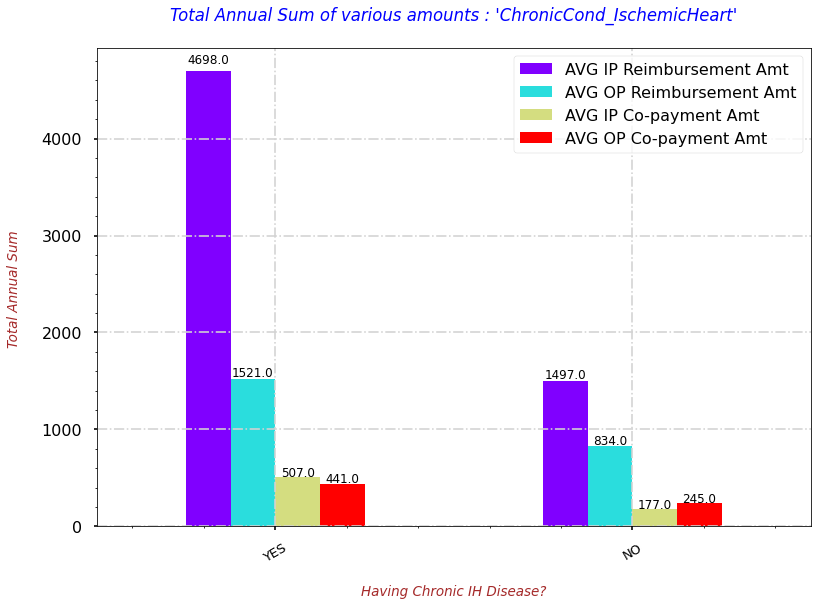

In [113]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_IschemicHeart'
with plt.style.context('seaborn-poster'):
  fig = CC_IH_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic IH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_IschemicHeart'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic IH Disease
# 2 means -ve with Chronic IH Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve it is more than 50%.
    - For other comparisons the difference is not very high.

### **Q17. Lets see the number of beneficiaries on the basis of 'ChronicCond_Osteoporasis'. And, the Annual IP & OP expenditures for such patients.**

In [114]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_Osteoporasis'])['BeneID'].count())

,BeneID
ChronicCond_Osteoporasis,
1,38059
2,100497


In [115]:
CC_OS_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Osteoporasis'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Osteoporasis'])['BeneID'].count())
CC_OS_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_OS_IP_R

,AVG IP Reimbursement Amt
ChronicCond_Osteoporasis,
1,4608.419822
2,3301.303721


In [116]:
CC_OS_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Osteoporasis'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_Osteoporasis'])['BeneID'].count())
CC_OS_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_OS_OP_R

,AVG OP Reimbursement Amt
ChronicCond_Osteoporasis,
1,1494.709004
2,1223.807178


In [117]:
CC_OS_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Osteoporasis'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Osteoporasis'])['BeneID'].count())
CC_OS_IP_D.columns = ['AVG IP Co-payment Amt']
CC_OS_IP_D

,AVG IP Co-payment Amt
ChronicCond_Osteoporasis,
1,512.038204
2,357.359722


In [118]:
CC_OS_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_Osteoporasis'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_Osteoporasis'])['BeneID'].count())
CC_OS_OP_D.columns = ['AVG OP Co-payment Amt']
CC_OS_OP_D

,AVG OP Co-payment Amt
ChronicCond_Osteoporasis,
1,436.249271
2,355.552106


In [119]:
CC_OS_all_amts = pd.concat([CC_OS_IP_R, CC_OS_OP_R, CC_OS_IP_D, CC_OS_OP_D], axis=1)
CC_OS_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_Osteoporasis,,,,
1,4608.419822,1494.709004,512.038204,436.249271
2,3301.303721,1223.807178,357.359722,355.552106


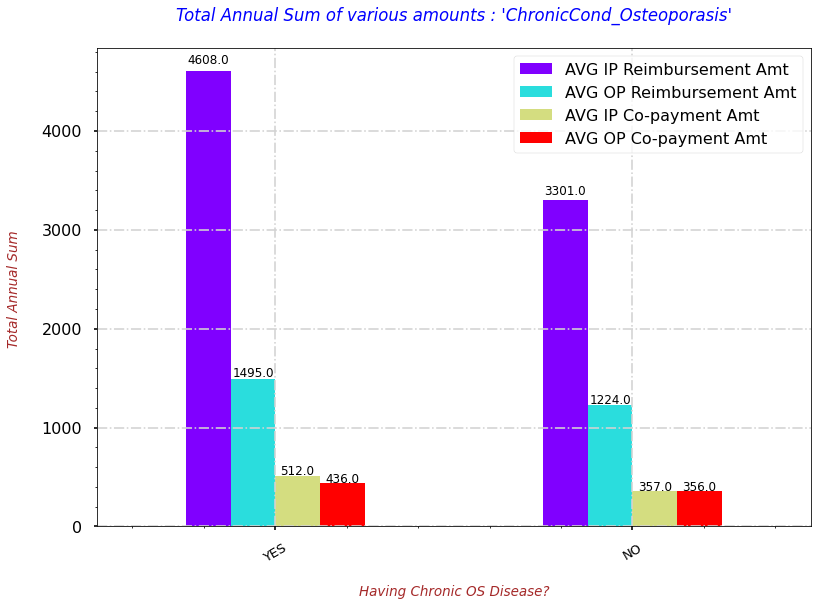

In [120]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_Osteoporasis'
with plt.style.context('seaborn-poster'):
  fig = CC_OS_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic OS Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Osteoporasis'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic OS Disease
# 2 means -ve with Chronic OS Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve the difference is not that high.
    - For other comparisons the difference is not very high.

### **Q18. Lets see the number of beneficiaries on the basis of 'ChronicCond_rheumatoidarthritis'. And, the Annual IP & OP expenditures for such patients.**

In [121]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['BeneID'].count())

,BeneID
ChronicCond_rheumatoidarthritis,
1,35584
2,102972


In [122]:
CC_RH_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['BeneID'].count())
CC_RH_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_RH_IP_R

,AVG IP Reimbursement Amt
ChronicCond_rheumatoidarthritis,
1,5102.027597
2,3162.145243


In [123]:
CC_RH_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['BeneID'].count())
CC_RH_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_RH_OP_R

,AVG OP Reimbursement Amt
ChronicCond_rheumatoidarthritis,
1,1548.057835
2,1211.882745


In [124]:
CC_RH_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['BeneID'].count())
CC_RH_IP_D.columns = ['AVG IP Co-payment Amt']
CC_RH_IP_D

,AVG IP Co-payment Amt
ChronicCond_rheumatoidarthritis,
1,562.630789
2,343.594259


In [125]:
CC_RH_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_rheumatoidarthritis'])['BeneID'].count())
CC_RH_OP_D.columns = ['AVG OP Co-payment Amt']
CC_RH_OP_D

,AVG OP Co-payment Amt
ChronicCond_rheumatoidarthritis,
1,453.423196
2,351.556928


In [126]:
CC_RH_all_amts = pd.concat([CC_RH_IP_R, CC_RH_OP_R, CC_RH_IP_D, CC_RH_OP_D], axis=1)
CC_RH_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_rheumatoidarthritis,,,,
1,5102.027597,1548.057835,562.630789,453.423196
2,3162.145243,1211.882745,343.594259,351.556928


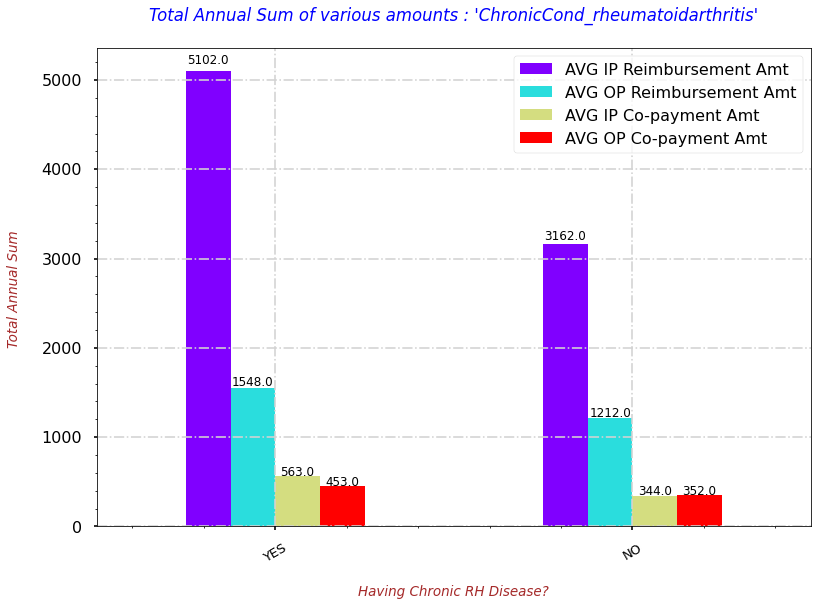

In [127]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_rheumatoidarthritis'
with plt.style.context('seaborn-poster'):
  fig = CC_RH_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic RH Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_rheumatoidarthritis'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic RH Disease
# 2 means -ve with Chronic RH Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve the difference is not that high.
    - For other comparisons the difference is not very high.

### **Q19. Lets see the number of beneficiaries on the basis of 'ChronicCond_stroke'. And, the Annual IP & OP expenditures for such patients.**

In [128]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['ChronicCond_stroke'])['BeneID'].count())

,BeneID
ChronicCond_stroke,
1,10954
2,127602


In [129]:
CC_ST_IP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_stroke'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_stroke'])['BeneID'].count())
CC_ST_IP_R.columns = ['AVG IP Reimbursement Amt']
CC_ST_IP_R

,AVG IP Reimbursement Amt
ChronicCond_stroke,
1,8111.475260
2,3278.239134


In [130]:
CC_ST_OP_R = pd.DataFrame(train_bene_df.groupby(['ChronicCond_stroke'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['ChronicCond_stroke'])['BeneID'].count())
CC_ST_OP_R.columns = ['AVG OP Reimbursement Amt']
CC_ST_OP_R

,AVG OP Reimbursement Amt
ChronicCond_stroke,
1,1925.197188
2,1244.396404


In [131]:
CC_ST_IP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_stroke'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_stroke'])['BeneID'].count())
CC_ST_IP_D.columns = ['AVG IP Co-payment Amt']
CC_ST_IP_D

,AVG IP Co-payment Amt
ChronicCond_stroke,
1,861.399489
2,360.225326


In [132]:
CC_ST_OP_D = pd.DataFrame(train_bene_df.groupby(['ChronicCond_stroke'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['ChronicCond_stroke'])['BeneID'].count())
CC_ST_OP_D.columns = ['AVG OP Co-payment Amt']
CC_ST_OP_D

,AVG OP Co-payment Amt
ChronicCond_stroke,
1,535.947508
2,364.135061


In [133]:
CC_ST_all_amts = pd.concat([CC_ST_IP_R, CC_ST_OP_R, CC_ST_IP_D, CC_ST_OP_D], axis=1)
CC_ST_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
ChronicCond_stroke,,,,
1,8111.475260,1925.197188,861.399489,535.947508
2,3278.239134,1244.396404,360.225326,364.135061


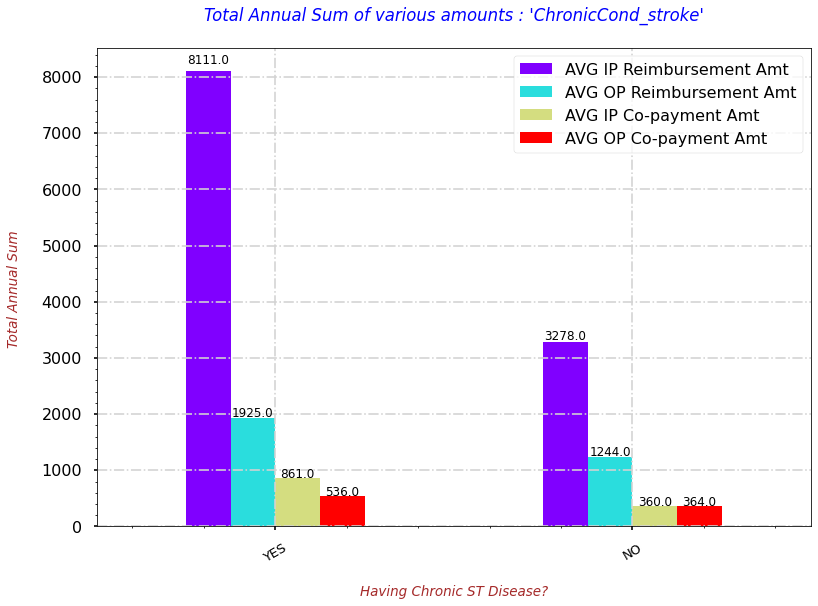

In [134]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'ChronicCond_stroke'
with plt.style.context('seaborn-poster'):
  fig = CC_ST_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic ST Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['YES', 'NO'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'ChronicCond_stroke'\n", fontdict=title_font_dict)

# 1 means +ve with Chronic ST Disease
# 2 means -ve with Chronic ST Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without chronic HF disease. To be more precise, in case of +ve the difference is more than 50%.
    - For other comparisons the difference is not very high.

### **Q20. Lets see the number of beneficiaries on the basis of 'RenalDiseaseIndicator'. And, the Annual IP & OP expenditures for such patients.**

In [135]:
# Number of beneficiaries with chronic or no-chronic conditions
pd.DataFrame(train_bene_df.groupby(['RenalDiseaseIndicator'])['BeneID'].count())

,BeneID
RenalDiseaseIndicator,
0,118978
Y,19578


In [136]:
RKD_IP_R = pd.DataFrame(train_bene_df.groupby(['RenalDiseaseIndicator'])['IPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['RenalDiseaseIndicator'])['BeneID'].count())
RKD_IP_R.columns = ['AVG IP Reimbursement Amt']
RKD_IP_R

,AVG IP Reimbursement Amt
RenalDiseaseIndicator,
0,3051.430264
Y,7360.808050


In [137]:
RKD_OP_R = pd.DataFrame(train_bene_df.groupby(['RenalDiseaseIndicator'])['OPAnnualReimbursementAmt'].sum() / train_bene_df.groupby(['RenalDiseaseIndicator'])['BeneID'].count())
RKD_OP_R.columns = ['AVG OP Reimbursement Amt']
RKD_OP_R

,AVG OP Reimbursement Amt
RenalDiseaseIndicator,
0,1047.351611
Y,2822.774543


In [138]:
RKD_IP_D = pd.DataFrame(train_bene_df.groupby(['RenalDiseaseIndicator'])['IPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['RenalDiseaseIndicator'])['BeneID'].count())
RKD_IP_D.columns = ['AVG IP Co-payment Amt']
RKD_IP_D

,AVG IP Co-payment Amt
RenalDiseaseIndicator,
0,342.384239
Y,749.057616


In [139]:
RKD_OP_D = pd.DataFrame(train_bene_df.groupby(['RenalDiseaseIndicator'])['OPAnnualDeductibleAmt'].sum() / train_bene_df.groupby(['RenalDiseaseIndicator'])['BeneID'].count())
RKD_OP_D.columns = ['AVG OP Co-payment Amt']
RKD_OP_D

,AVG OP Co-payment Amt
RenalDiseaseIndicator,
0,311.659139
Y,779.167944


In [140]:
RKD_all_amts = pd.concat([RKD_IP_R, RKD_OP_R, RKD_IP_D, RKD_OP_D], axis=1)
RKD_all_amts

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
RenalDiseaseIndicator,,,,
0,3051.430264,1047.351611,342.384239,311.659139
Y,7360.808050,2822.774543,749.057616,779.167944


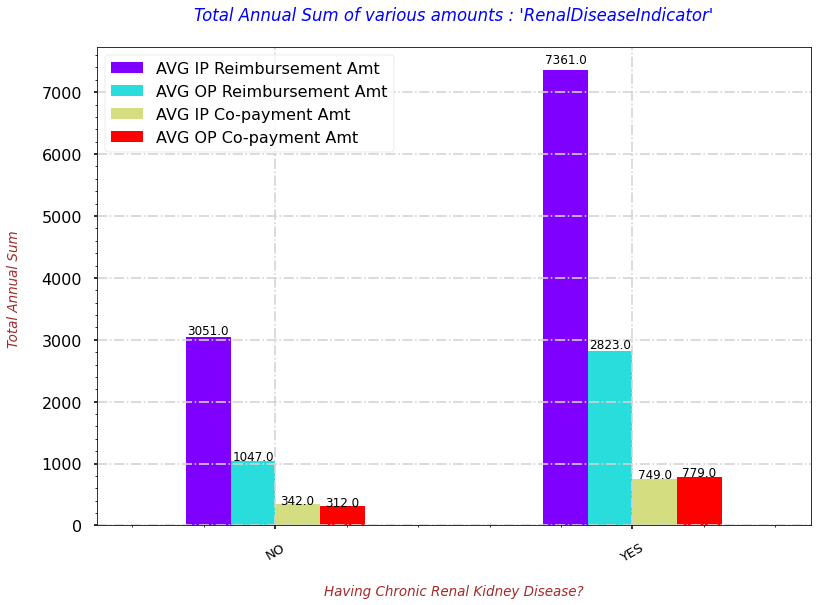

In [141]:
# Here, I'm displaying the Total Annual Sum of IP Co-payment for 'RenalDiseaseIndicator'
with plt.style.context('seaborn-poster'):
  fig = RKD_all_amts.plot(kind='bar', colormap='rainbow')
  # Using the "patches" function we will get the location of the rectangle bars from the graph.
  ## Then by using those location(width & height) values we will add the annotations
  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height*1.015), ha='center', fontsize=12, rotation=0)
  # Providing the labels and title to the graph
  plt.xlabel("\nHaving Chronic Renal Kidney Disease?", fontdict=label_font_dict)
  plt.xticks(ticks=[0,1], labels=['NO', 'YES'], fontsize=13, rotation=30)
  plt.ylabel("Total Annual Sum \n", fontdict=label_font_dict)
  plt.grid(which='major', linestyle="-.", color='lightgrey')
  plt.minorticks_on()
  plt.title("Total Annual Sum of various amounts : 'RenalDiseaseIndicator'\n", fontdict=title_font_dict)

# Y means +ve with Renal Kidney Disease
# 0 means -ve with Renal Kidney Disease

- **`OBSERVATION`**
  - The above graph is telling us below points:
    - Payer pays huge chunk of expenses specially when a beneficiary gets admitted with or without Renal Kidney Disease. To be more precise, in case of +ve the difference is more than 50%.
    - For other comparisons the difference is not very high.

### **Q21. Lets check the percentiles of the pre-disease indicators for the Annual IP expenditures for such patients.**

In [142]:
def cal_display_percentiles(x_col, y_col, title_lbl, x_filter_code):
    """
    Description : This function is created for calculating and generating the percentiles for pre-disease indicators.
    
    Input: It accepts below parameters:
        1. x_col : Disease indicator feature name.
        2. y_col : Feature like re-imbursement or deductible amount whose percentiles you want to generate.
        3. title_lbl : Label to be provided in the title of the plot.
        4. x_filter_code : Category code for which you want to generate the percentiles.
        
    Output: It returns the dataframe having percentiles and their respective values for the specific disease indicator feature.
    And, it displays the pointplot graph of the same.
    """
    percentiles = []
    percentiles_vals = []

    # Calculating & storing the various percentiles and their respective values
    for val in [0.1,0.2,0.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99,0.999,0.9999,0.99999,0.999999,1.0]:
        percentile = round(float(val*100),6)
        percentiles.append(percentile)

        percentile_val = round(train_bene_df[train_bene_df[x_col] == x_filter_code][y_col].quantile(val),1)
        percentiles_vals.append(percentile_val)

    # Creating the temp dataframe for displaying the results
    tmp_percentiles = pd.DataFrame([percentiles, percentiles_vals]).T
    tmp_percentiles.columns = ['Percentiles', 'Values']

    # Here, I'm displaying the Percentiles values for all disease code features
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(15,7))
        sns.pointplot(data=tmp_percentiles, x='Percentiles', y='Values', markers="o", palette='spring')
        sns.pointplot(data=tmp_percentiles, x='Percentiles', y='Values', markers="", color='grey', linestyles="solid")
        # Providing the labels and title to the graph
        plt.xlabel("\nPercentiles", fontdict=label_font_dict)
        plt.xticks(rotation=90, size=12)
        plt.ylabel("Total Annual `{}` Sum \n".format(y_col), fontdict=label_font_dict)
        plt.grid(which='major', linestyle="-.", color='lightpink')
        plt.minorticks_on()
        plt.title("Percentile values of `{}` :: `{}`\n".format(y_col,title_lbl), fontdict=title_font_dict)
        
    return tmp_percentiles

- **(RenalDiseaseIndicator == YES) and (IPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

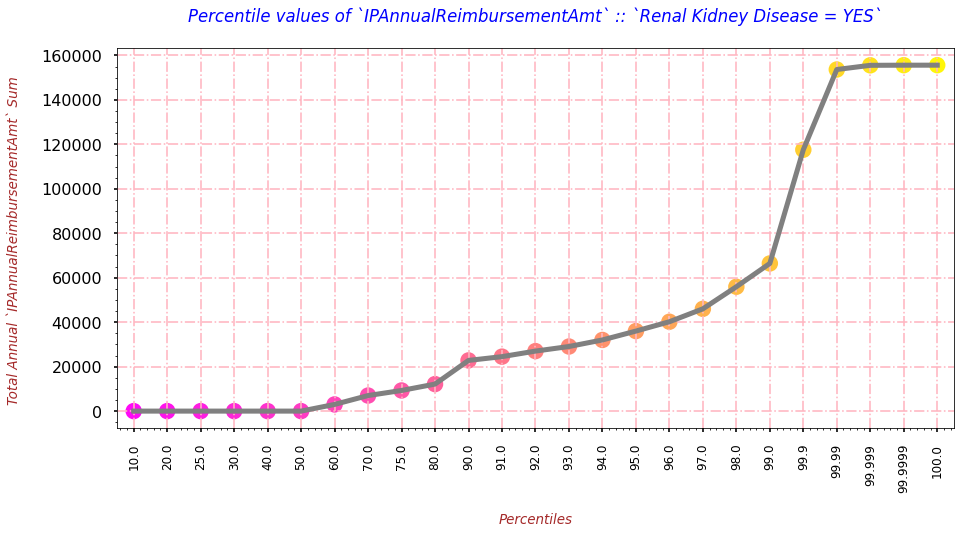

In [143]:
RKD_YES_IP_R_percentiles = cal_display_percentiles(x_col='RenalDiseaseIndicator', 
                                                   y_col='IPAnnualReimbursementAmt',
                                                   title_lbl="Renal Kidney Disease = YES",
                                                   x_filter_code='Y')

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(RenalDiseaseIndicator == NO) and (IPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

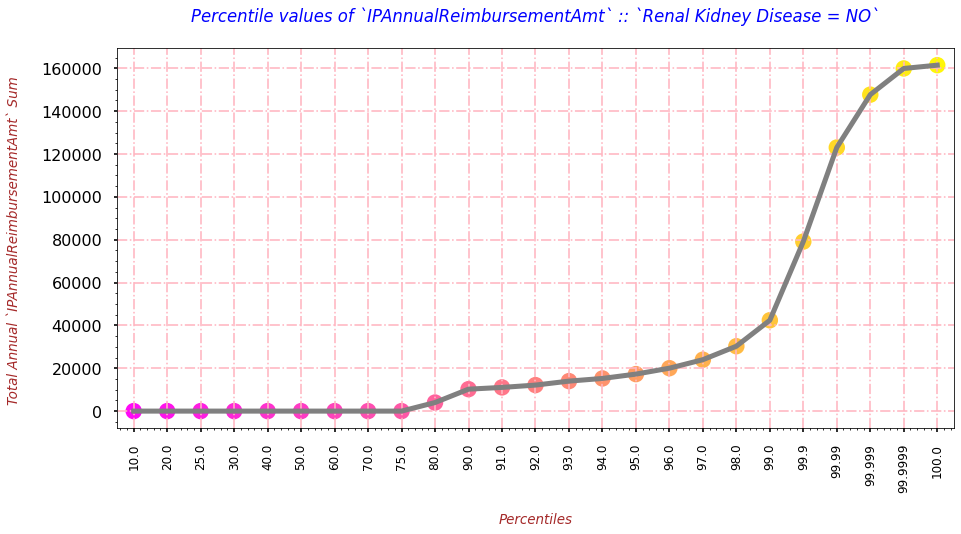

In [144]:
RKD_NO_IP_R_percentiles = cal_display_percentiles(x_col='RenalDiseaseIndicator', 
                                                   y_col='IPAnnualReimbursementAmt',
                                                   title_lbl="Renal Kidney Disease = NO",
                                                   x_filter_code='0')

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(RenalDiseaseIndicator == YES) and (OPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

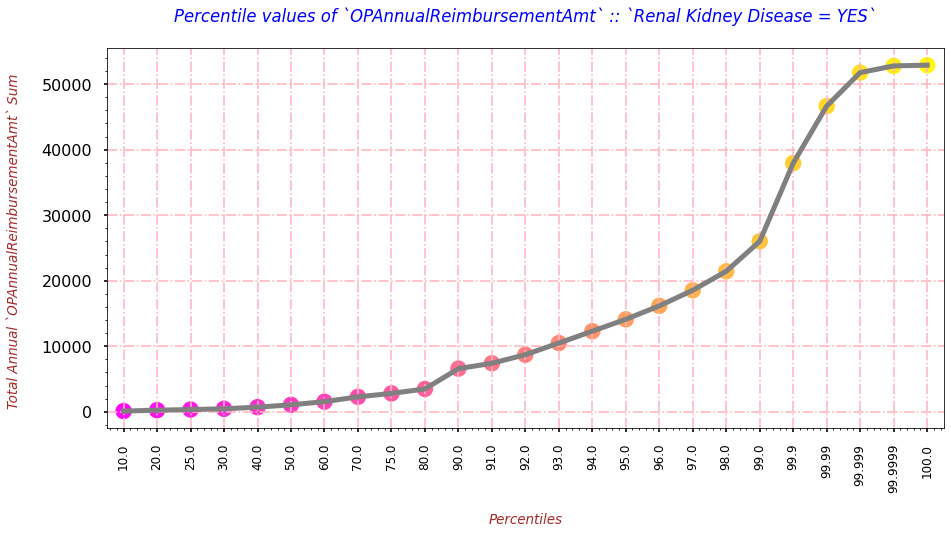

In [145]:
RKD_YES_OP_R_percentiles = cal_display_percentiles(x_col='RenalDiseaseIndicator', 
                                                   y_col='OPAnnualReimbursementAmt',
                                                   title_lbl="Renal Kidney Disease = YES",
                                                   x_filter_code='Y')

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(RenalDiseaseIndicator == NO) and (OPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

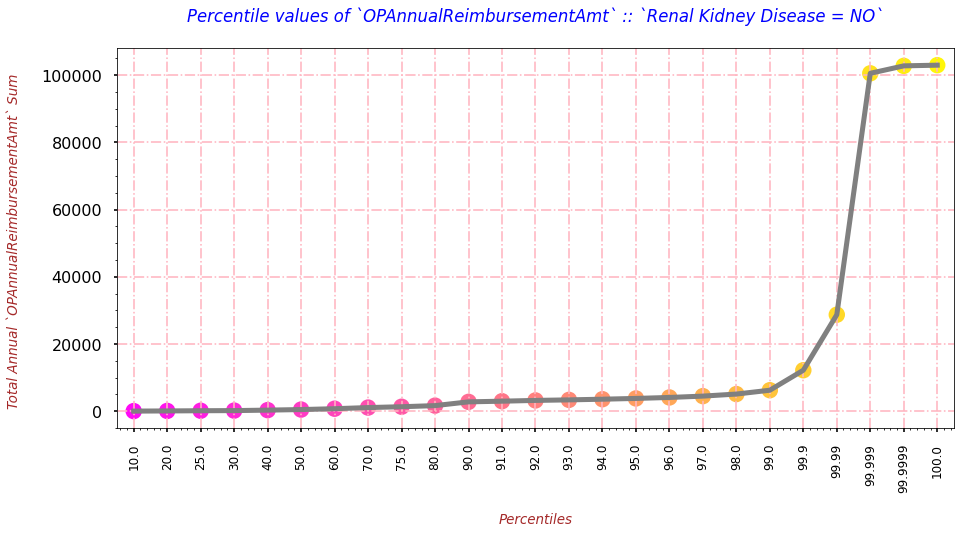

In [146]:
RKD_NO_OP_R_percentiles = cal_display_percentiles(x_col='RenalDiseaseIndicator', 
                                                   y_col='OPAnnualReimbursementAmt',
                                                   title_lbl="Renal Kidney Disease = NO",
                                                   x_filter_code='0')

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(ChronicCond_stroke == YES) and (IPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

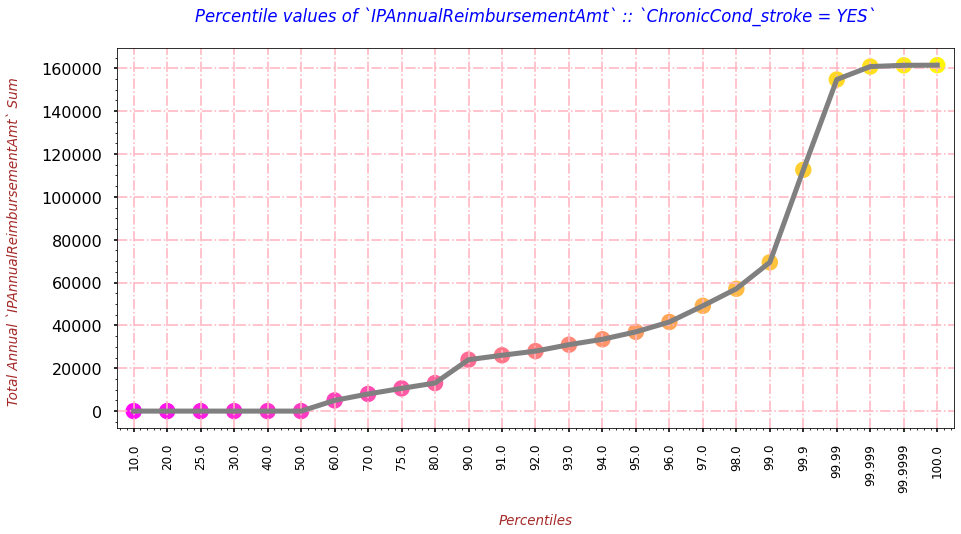

In [147]:
CC_ST_YES_IP_R_percentiles = cal_display_percentiles(x_col='ChronicCond_stroke', 
                                                     y_col='IPAnnualReimbursementAmt',
                                                     title_lbl="ChronicCond_stroke = YES",
                                                     x_filter_code=1)

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(ChronicCond_stroke == NO) and (IPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

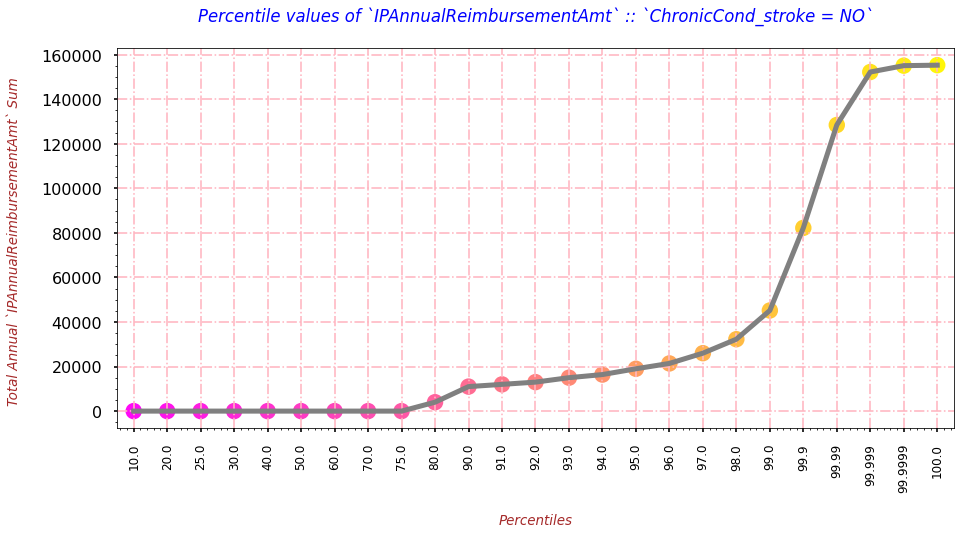

In [148]:
CC_ST_NO_IP_R_percentiles = cal_display_percentiles(x_col='ChronicCond_stroke', 
                                                     y_col='IPAnnualReimbursementAmt',
                                                     title_lbl="ChronicCond_stroke = NO",
                                                     x_filter_code=2)

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(ChronicCond_stroke == YES) and (OPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

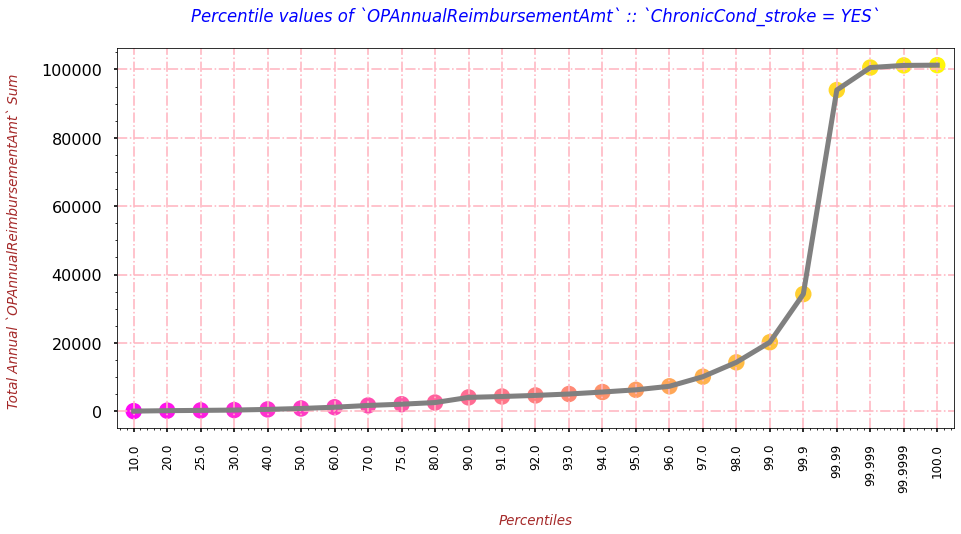

In [149]:
CC_ST_YES_OP_R_percentiles = cal_display_percentiles(x_col='ChronicCond_stroke', 
                                                     y_col='OPAnnualReimbursementAmt',
                                                     title_lbl="ChronicCond_stroke = YES",
                                                     x_filter_code=1)

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

- **(ChronicCond_stroke == NO) and (OPAnnualReimbursementAmt)**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.5019607843137255, 0.5019607843137255, 0.5019607843137255), (0.501960784313

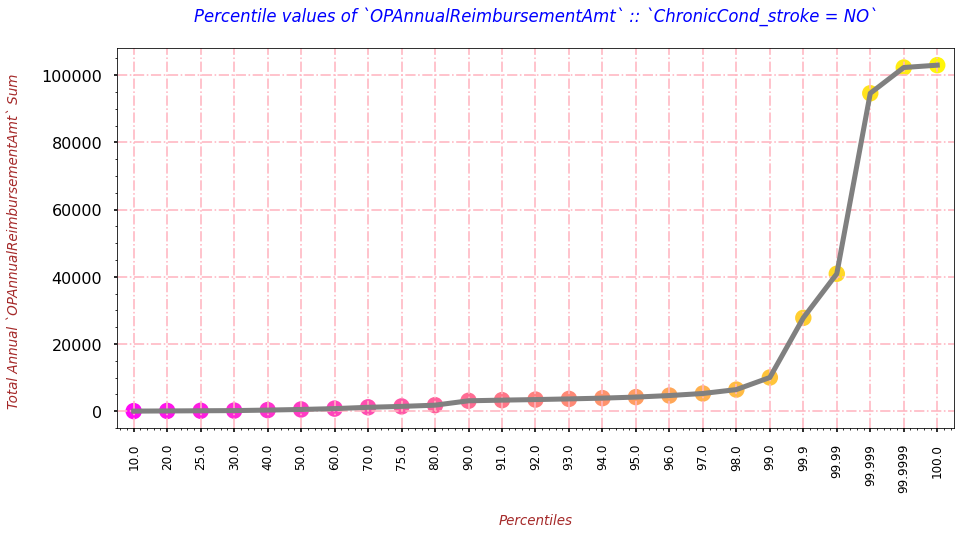

In [150]:
CC_ST_NO_OP_R_percentiles = cal_display_percentiles(x_col='ChronicCond_stroke', 
                                                     y_col='OPAnnualReimbursementAmt',
                                                     title_lbl="ChronicCond_stroke = NO",
                                                     x_filter_code=2)

- **`OBSERVATION`**
  - The above graph shows us that some of the reimbursements paid by the PAYER are very high as compared to the rest of the records.
      - This can be a potential sign of fraudulent cases because generally the criminals file some forge cases with exponentially high amounts.

### **Q22. Lets just visualize the spread of pre-disease indicators for the Annual IP and OP expenditures across males and females.**

In [151]:
def plot_strip_plots(x_col, hue_col, y_col, lgd_title):
    """
    Description : This function is created for plotting the spread of data points of pre-disease indicators for the Annual IP and OP expenditures
    across males and females.
    
    Input: It accepts below parameters:
        1. x_col : Gender feature.
        2. hue_Col : Pre-Disease indicator
        3. y_col : Feature like re-imbursement or deductible amount whose percentiles you want to generate.
        4. lgd_title : Category code for which you want to generate the data spread.
        
    Output: It displays the stipplot graph of the same.
    """
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(10,7))
        sns.stripplot(data=train_bene_df, x=x_col, y=y_col, hue=hue_col, palette='plasma')
        # Providing the labels and title to the graph
        plt.xlabel("\n{}".format(x_col), fontdict=label_font_dict)
        plt.xticks(rotation=90, size=12)
        plt.ylabel("{}\n".format(y_col), fontdict=label_font_dict)
        plt.grid(which='major', linestyle="-.", color='lightpink')
        plt.minorticks_on()
        plt.title("Spread of payment paid by payer\n", fontdict=title_font_dict)
        plt.legend(loc='upper center',title=lgd_title)

- **(RenalDiseaseIndicator) , (IPAnnualReimbursementAmt) and (GENDER)**

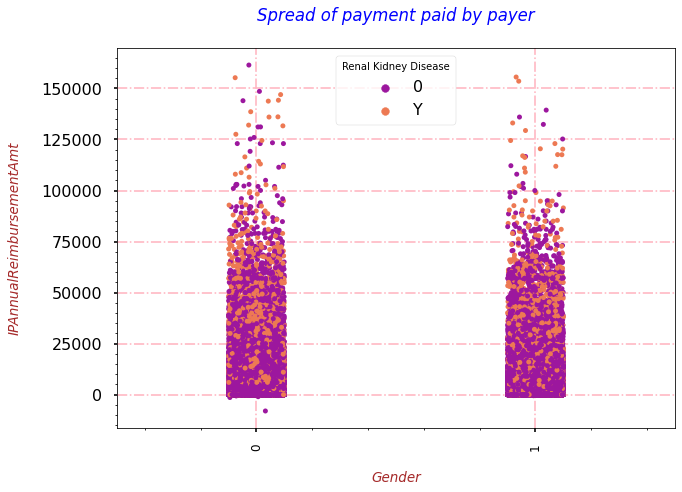

In [152]:
plot_strip_plots(x_col='Gender', hue_col="RenalDiseaseIndicator", y_col='IPAnnualReimbursementAmt', lgd_title="Renal Kidney Disease")

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points with some potential outliers(may be fraud).
      - Here, another thing that I found is that few of the points lying in the negative range(this is quite strange may be error).

In [153]:
train_bene_df['OPAnnualReimbursementAmt'].min(), train_bene_df['IPAnnualReimbursementAmt'].min()

(-70, -8000)

In [154]:
train_bene_df['OPAnnualDeductibleAmt'].min(), train_bene_df['IPAnnualDeductibleAmt'].min()

(0, 0)

- **(RenalDiseaseIndicator) , (OPAnnualReimbursementAmt) and (GENDER)**

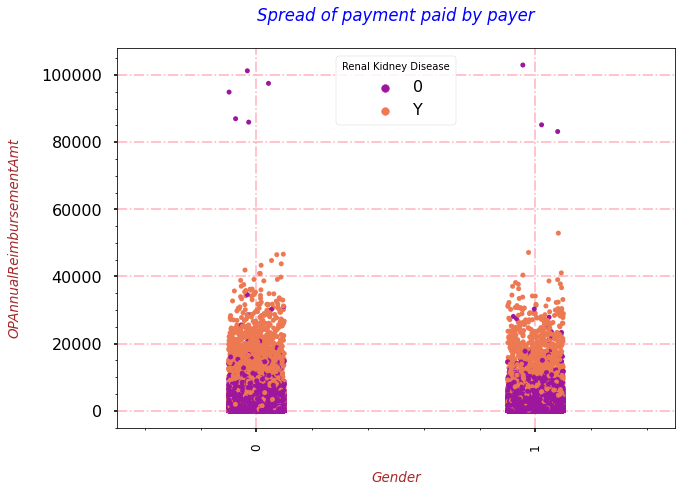

In [155]:
plot_strip_plots(x_col='Gender', hue_col="RenalDiseaseIndicator", y_col='OPAnnualReimbursementAmt', lgd_title="Renal Kidney Disease")

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points with some potential outliers(may be fraud).
      - Here, another thing taht I found is that few of the points lying in the negative range(this is quite strange may be error).

- **(ChronicCond_rheumatoidarthritis) , (IPAnnualReimbursementAmt) and (GENDER)**

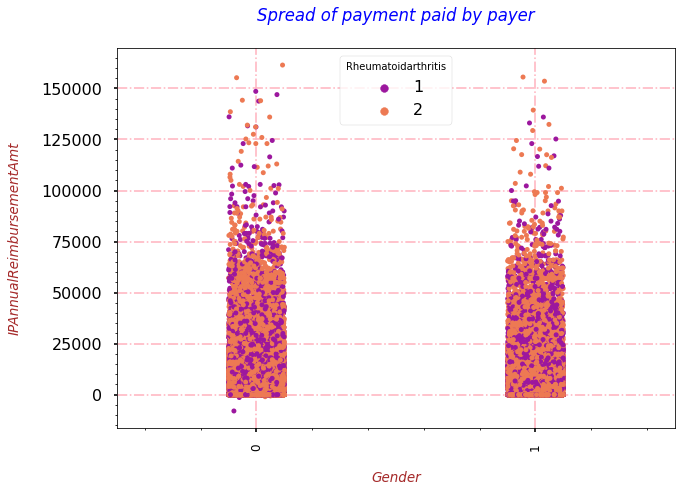

In [156]:
plot_strip_plots(x_col='Gender', hue_col="ChronicCond_rheumatoidarthritis", y_col='IPAnnualReimbursementAmt', lgd_title="Rheumatoidarthritis")

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points with some potential outliers(may be fraud).
      - Here, another thing taht I found is that few of the points lying in the negative range(this is quite strange may be error).

- **(ChronicCond_rheumatoidarthritis) , (OPAnnualReimbursementAmt) and (GENDER)**

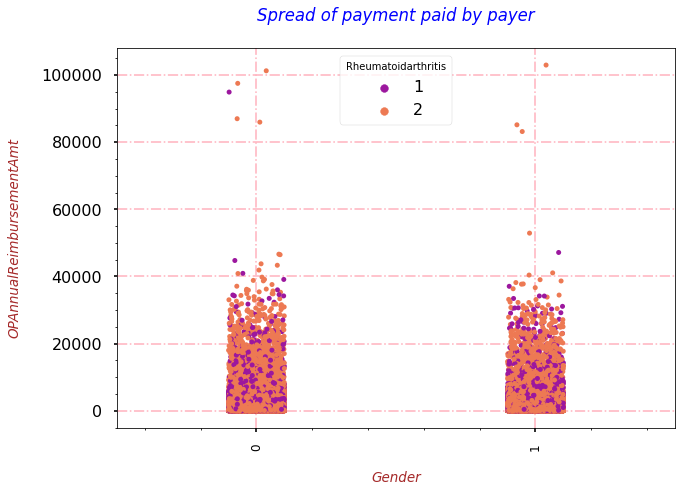

In [157]:
plot_strip_plots(x_col='Gender', hue_col="ChronicCond_rheumatoidarthritis", y_col='OPAnnualReimbursementAmt', lgd_title="Rheumatoidarthritis")

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points with some potential outliers(may be fraud).
      - Here, another thing taht I found is that few of the points lying in the negative range(this is quite strange may be error).

- **(ChronicCond_IschemicHeart) , (IPAnnualReimbursementAmt) and (GENDER)**

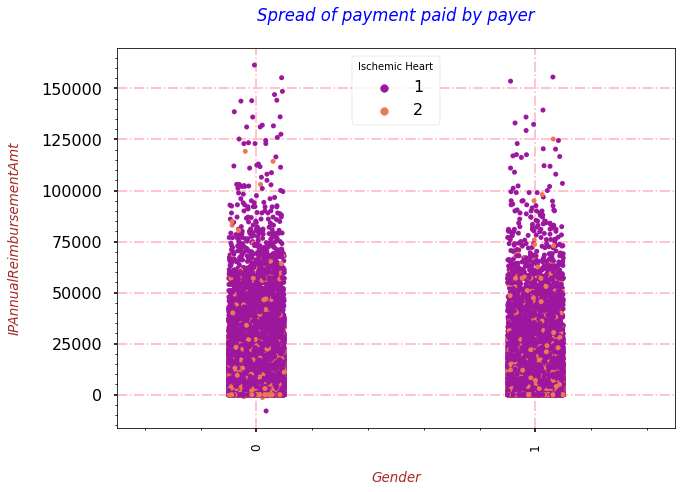

In [158]:
plot_strip_plots(x_col='Gender', hue_col="ChronicCond_IschemicHeart", y_col='IPAnnualReimbursementAmt', lgd_title="Ischemic Heart")

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points with some potential outliers specifically for patients with Chronic Heart Desiase(may be fraud).
      - Here, another thing taht I found is that few of the points lying in the negative range(this is quite strange may be error).

- **(ChronicCond_IschemicHeart) , (OPAnnualReimbursementAmt) and (GENDER)**

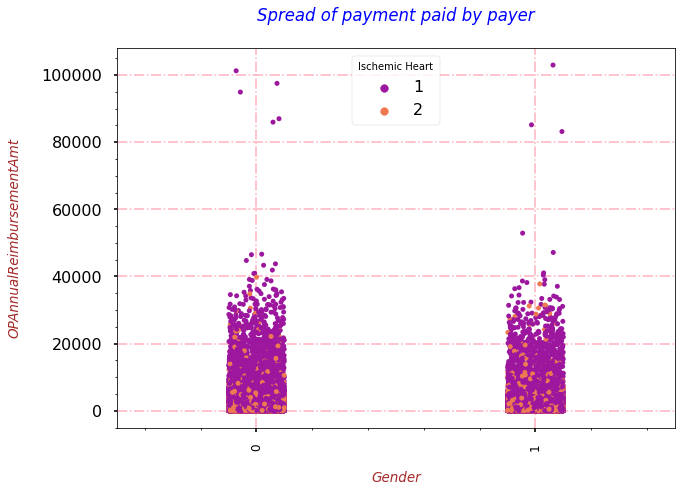

In [159]:
plot_strip_plots(x_col='Gender', hue_col="ChronicCond_IschemicHeart", y_col='OPAnnualReimbursementAmt', lgd_title="Ischemic Heart")

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points with some potential outliers specifically for patients with Chronic Heart Desiase(may be fraud).
      - Here, another thing taht I found is that few of the points lying in the negative range(this is quite strange may be error).

### **Q23. Lets visualize the spread of Annual IP and OP expenditures through out the AGE and its assciated features for males and females.**

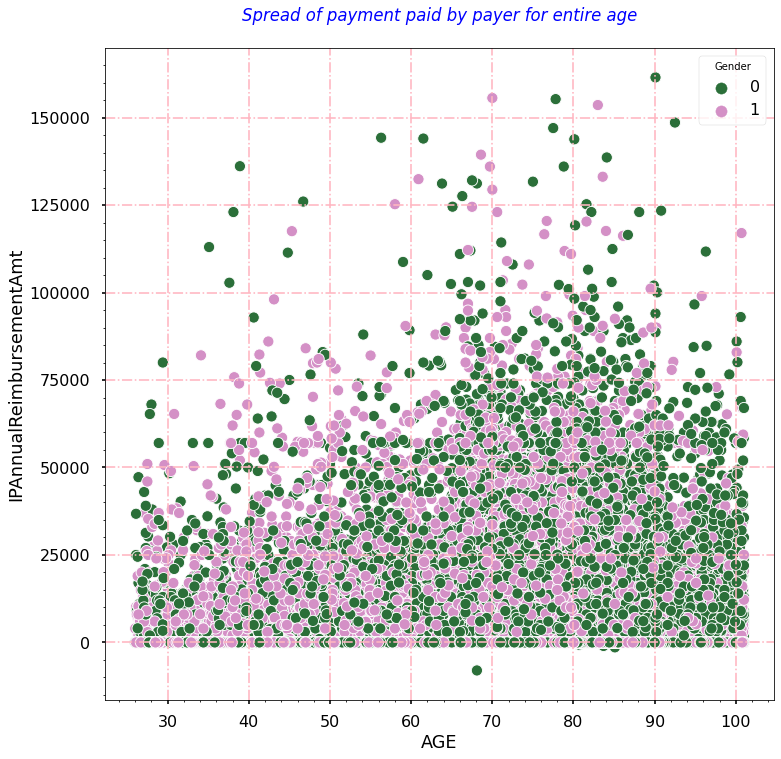

In [160]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,12))
    sns.scatterplot(data=train_bene_df, x='AGE', y='IPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.grid(which='major', linestyle="-.", color='lightpink')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer for entire age\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points.

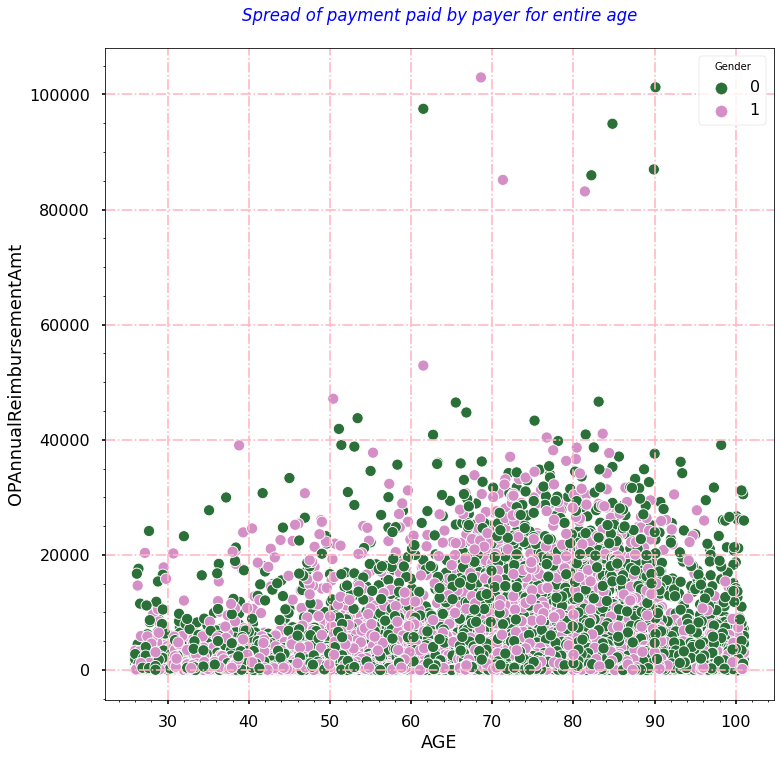

In [161]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,12))
    sns.scatterplot(data=train_bene_df, x='AGE', y='OPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.grid(which='major', linestyle="-.", color='lightpink')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer for entire age\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us the complete overlapping of data points.

- **(AGE GROUPS) , (IPAnnualReimbursementAmt) and (GENDER)**

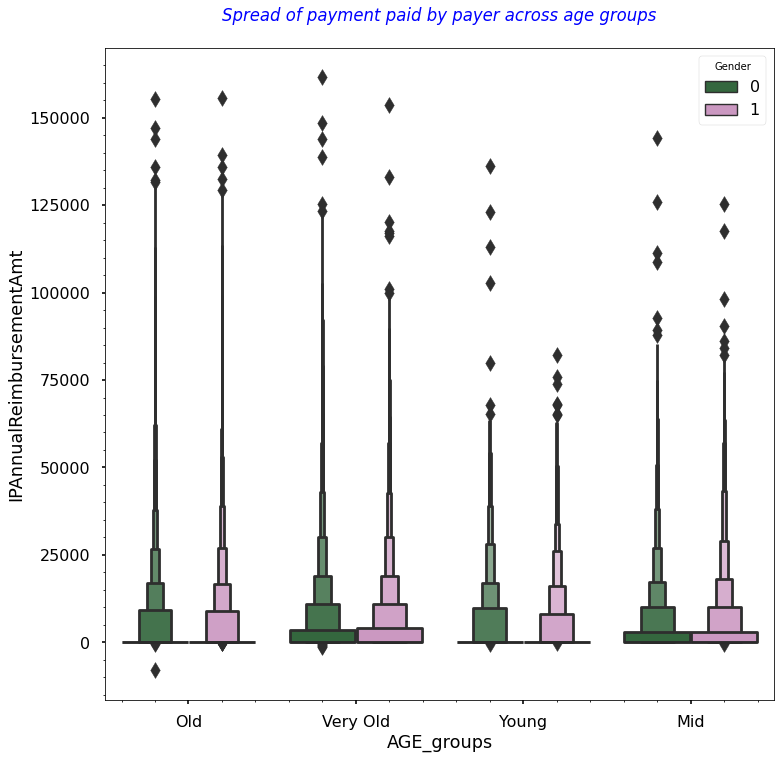

In [162]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,12))
    sns.boxenplot(data=train_bene_df, x='AGE_groups', y='IPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer across age groups\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(AGE GROUPS) , (OPAnnualReimbursementAmt) and (GENDER)**

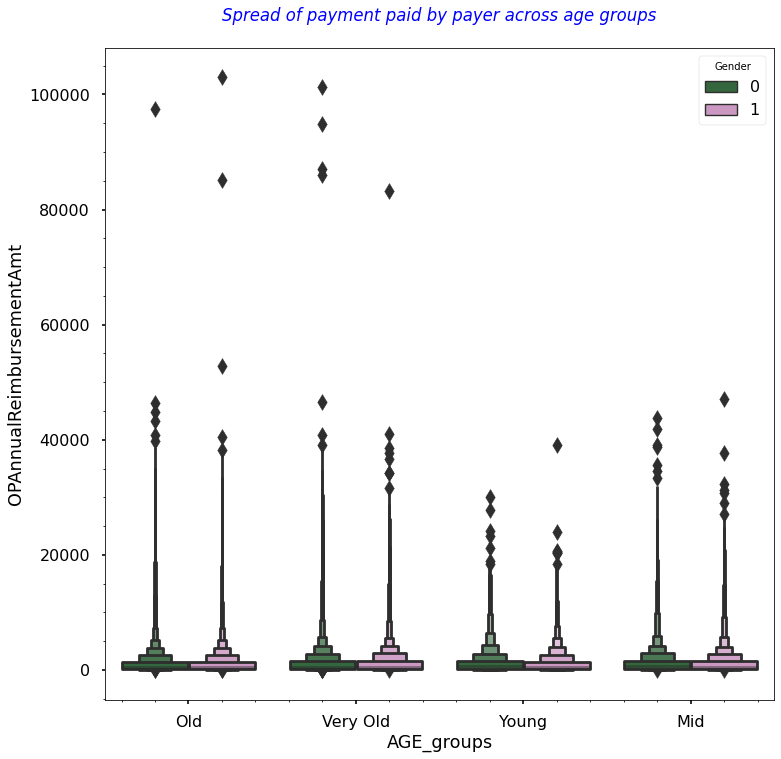

In [163]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,12))
    sns.boxenplot(data=train_bene_df, x='AGE_groups', y='OPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer across age groups\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(DOB MONTH) , (IPAnnualReimbursementAmt) and (GENDER)**

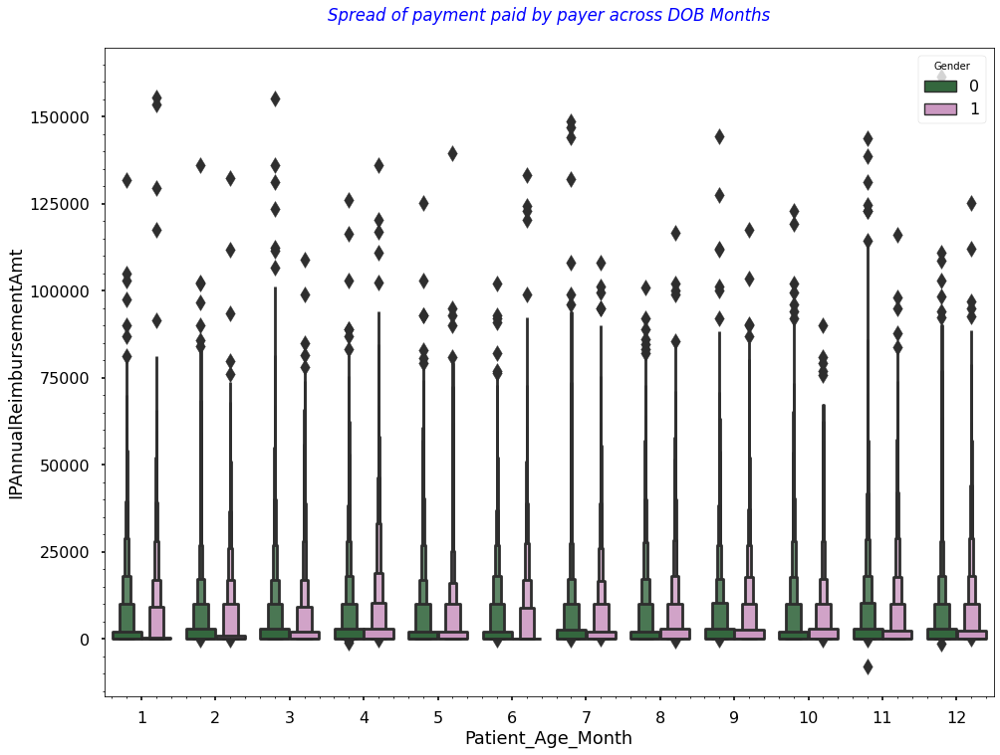

In [164]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,12))
    sns.boxenplot(data=train_bene_df, x='Patient_Age_Month', y='IPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer across DOB Months\n", fontdict=title_font_dict)
    plt.legend(loc='upper right', title="Gender")

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(DOB MONTH) , (OPAnnualReimbursementAmt) and (GENDER)**

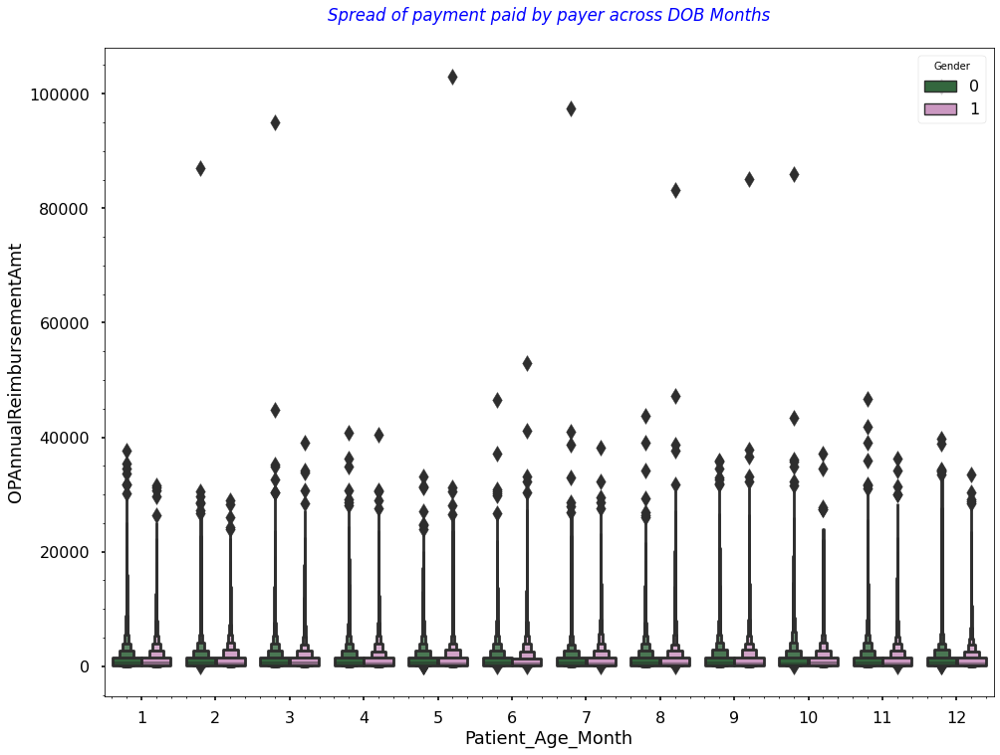

In [165]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,12))
    sns.boxenplot(data=train_bene_df, x='Patient_Age_Month', y='OPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer across DOB Months\n", fontdict=title_font_dict)
    plt.legend(loc='upper right', title="Gender")

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(DOB YEARS) , (IPAnnualReimbursementAmt) and (GENDER)**

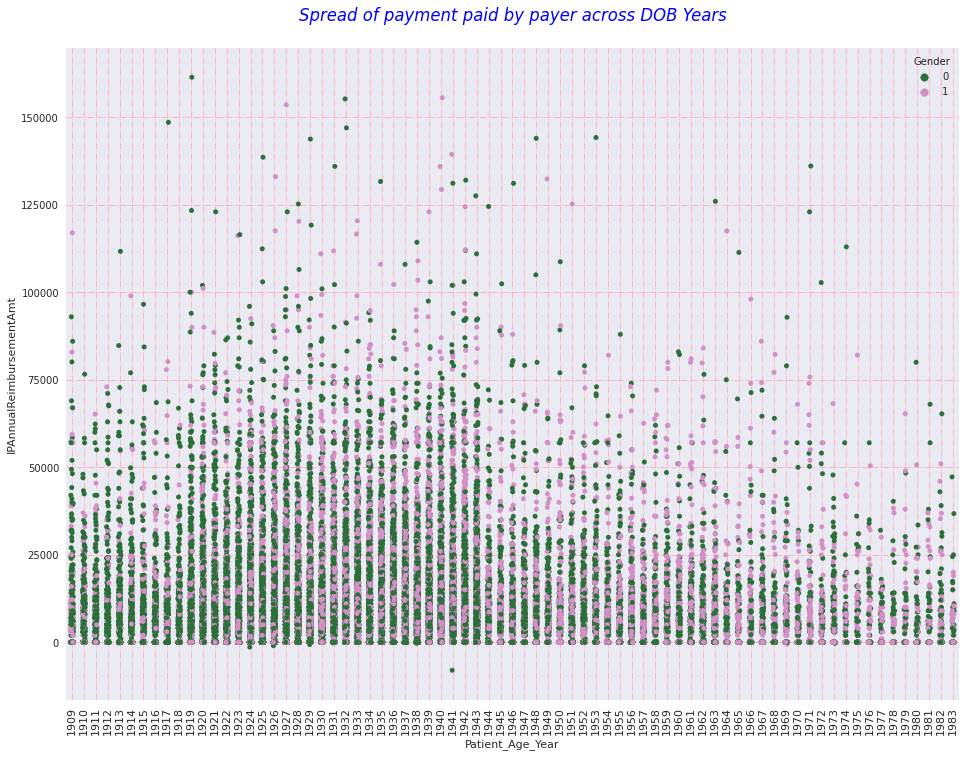

In [166]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,12))
    sns.stripplot(data=train_bene_df, x='Patient_Age_Year', y='IPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.xticks(rotation=90, fontsize=11)
    plt.grid(which='major', linestyle="-.", color='lightpink')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer across DOB Years\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(DOB YEARS) , (OPAnnualReimbursementAmt) and (GENDER)**

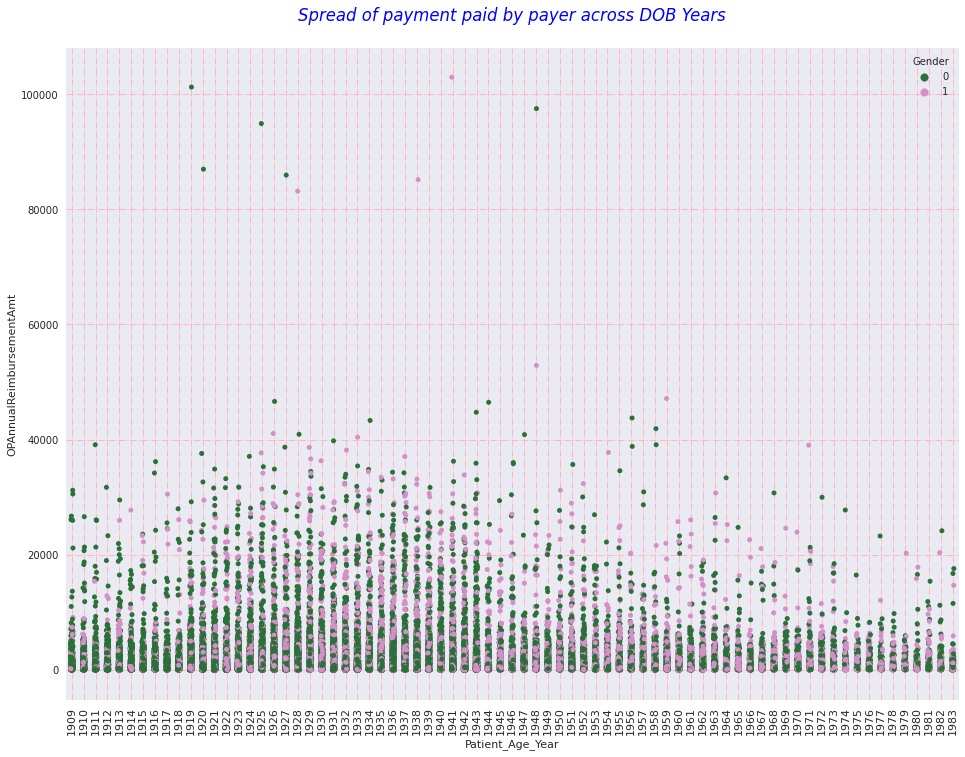

In [167]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,12))
    sns.stripplot(data=train_bene_df, x='Patient_Age_Year', y='OPAnnualReimbursementAmt', hue='Gender', palette='cubehelix')
    plt.xticks(rotation=90, fontsize=11)
    plt.grid(which='major', linestyle="-.", color='lightpink')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer across DOB Years\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(LIFE Status) , (IPAnnualReimbursementAmt) and (GENDER)**

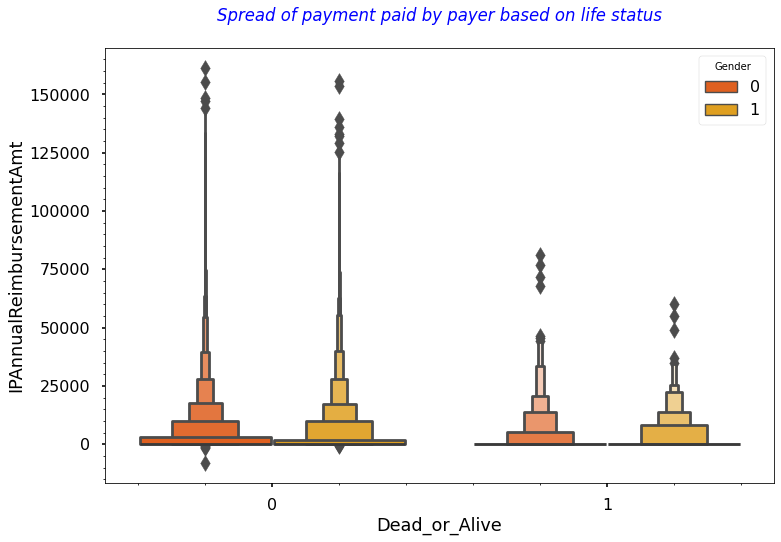

In [168]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,8))
    sns.boxenplot(data=train_bene_df, x='Dead_or_Alive', y='IPAnnualReimbursementAmt', hue='Gender', palette='autumn')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer based on life status\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(LIFE STATUS) , (OPAnnualReimbursementAmt) and (GENDER)**

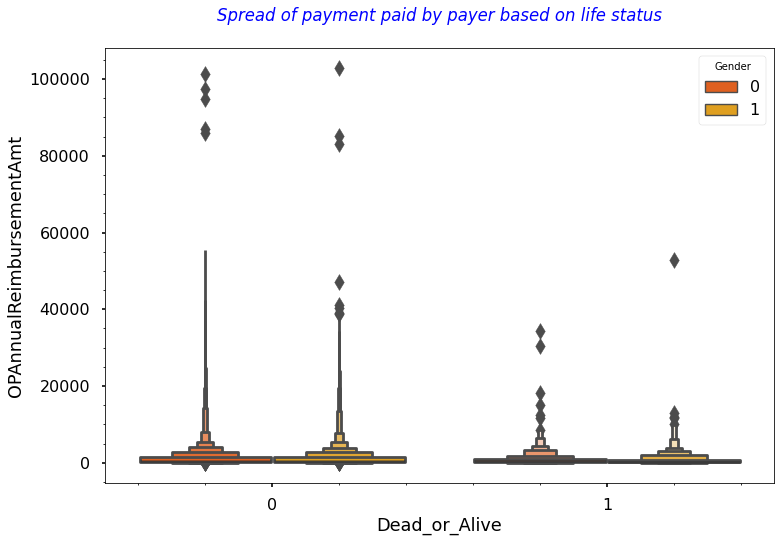

In [169]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,8))
    sns.boxenplot(data=train_bene_df, x='Dead_or_Alive', y='OPAnnualReimbursementAmt', hue='Gender', palette='autumn')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer based on life status\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(HUMAN RACE) , (IPAnnualReimbursementAmt) and (GENDER)**

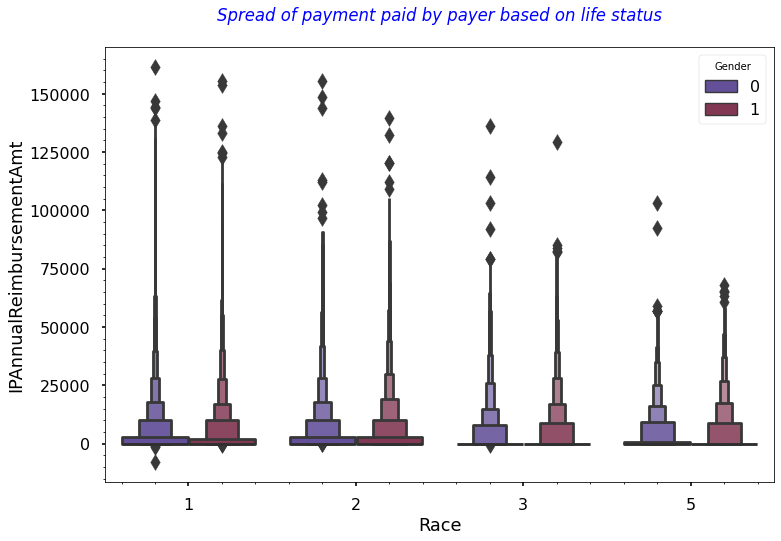

In [170]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,8))
    sns.boxenplot(data=train_bene_df, x='Race', y='IPAnnualReimbursementAmt', hue='Gender', palette='twilight')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer based on life status\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

- **(HUMAN RACE) , (OPAnnualReimbursementAmt) and (GENDER)**

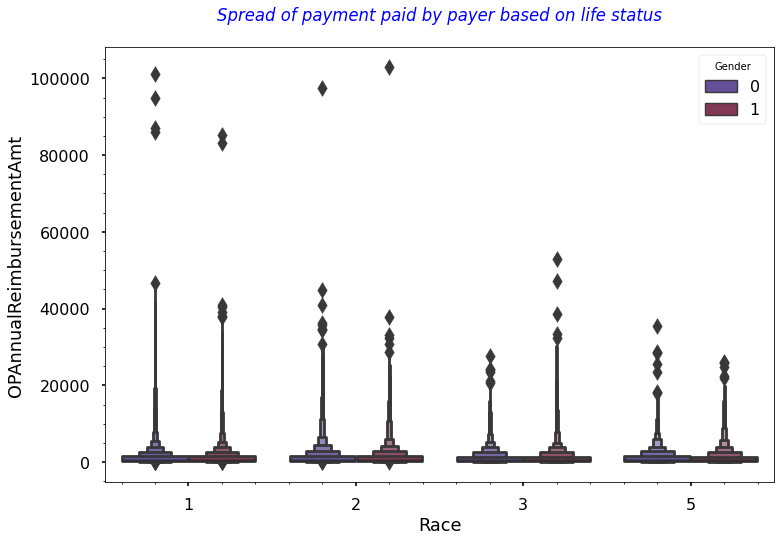

In [171]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,8))
    sns.boxenplot(data=train_bene_df, x='Race', y='OPAnnualReimbursementAmt', hue='Gender', palette='twilight')
    plt.minorticks_on()
    plt.title("Spread of payment paid by payer based on life status\n", fontdict=title_font_dict)

- **`OBSERVATION`**
  - The above graph shows us there is no such difference in the amounts across different AGE Groups.

# **`BENE - EDA - SUMMARY`**

1. For the below mentioned features, based on the above initial analysis it looks like these might not be able to provide much information or differentiation but still I would like to check them after adding CLAIMS data.
    - `DOB YEAR`
    - `DOB MONTH`
    - `AGE GROUPS`
    - `LIFE STATUS`
    - `HUMAN RACE`
    - `STATE`
      
      
2. For the below mentioned features majority of the values are same which most probably won't be of any use thus removing these from BENE dataset.
    - `NoOfMonths_PartACov`
    - `NoOfMonths_PartBCov`
    

3. The `Pre-disease` indicators looks like important features based on the initial analysis thus it would interesting to see how much they are useful after adding CLAIMS dataset.


4. `Date of Death` is also removed from the dataset, as we have already calculated bene age, life status and others out of it.

In [172]:
train_bene_df.drop(["NoOfMonths_PartACov", "NoOfMonths_PartBCov"], axis=1, inplace=True)

In [173]:
train_bene_df.shape

(138556, 27)

In [174]:
train_bene_df.head()

,BeneID,DOB,Gender,Race,RenalDiseaseIndicator,State,County,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,Patient_Age_Year,Patient_Age_Month,Dead_or_Alive,AGE,AGE_groups
0,BENE11001,1943-01-01,1,1,0,39,230,1,2,1,2,2,1,1,1,2,1,1,36000,3204,60,70,1943,1,0,67.0,Old
1,BENE11002,1936-09-01,0,1,0,39,280,2,2,2,2,2,2,2,2,2,2,2,0,0,30,50,1936,9,0,73.3,Old
2,BENE11003,1936-08-01,1,1,0,52,590,1,2,2,2,2,2,2,1,2,2,2,0,0,90,40,1936,8,0,73.4,Old
3,BENE11004,1922-07-01,1,1,0,39,270,1,1,2,2,2,2,1,1,1,1,2,0,0,1810,760,1922,7,0,87.5,Very Old
4,BENE11005,1935-09-01,1,1,0,24,680,2,2,2,2,1,2,1,2,2,2,2,0,0,1790,1200,1935,9,0,74.3,Old


In [175]:
train_bene_df.to_csv("train_bene_1.csv")

# **IP & OP Data - EDA**

In [176]:
train_bene_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Beneficiarydata-1542865627584.csv")
train_ip_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Inpatientdata-1542865627584.csv")
train_op_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Outpatientdata-1542865627584.csv")

## ***Records_counts_for_In-patient_&_Out-patient_Data***

- **In-patients**

In [177]:
train_ip_df.shape

(40474, 30)

In [178]:
train_ip_df.dtypes

BeneID                     object
ClaimID                    object
ClaimStartDt               object
ClaimEndDt                 object
Provider                   object
InscClaimAmtReimbursed      int64
AttendingPhysician         object
OperatingPhysician         object
OtherPhysician             object
AdmissionDt                object
ClmAdmitDiagnosisCode      object
DeductibleAmtPaid         float64
DischargeDt                object
DiagnosisGroupCode         object
ClmDiagnosisCode_1         object
ClmDiagnosisCode_2         object
ClmDiagnosisCode_3         object
ClmDiagnosisCode_4         object
ClmDiagnosisCode_5         object
ClmDiagnosisCode_6         object
ClmDiagnosisCode_7         object
ClmDiagnosisCode_8         object
ClmDiagnosisCode_9         object
ClmDiagnosisCode_10        object
ClmProcedureCode_1        float64
ClmProcedureCode_2        float64
ClmProcedureCode_3        float64
ClmProcedureCode_4        float64
ClmProcedureCode_5        float64
ClmProcedureCo

In [179]:
train_ip_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,2948,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,30390,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,2762,7843,32723,V1041,4254,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,3051,34400,5856,42732,486,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN


In [180]:
print("### Number of records where patient gets admitted --> {} ###".format(train_ip_df.shape[0]))

### Number of records where patient gets admitted --> 40474 ###


- **Out-patients**

In [181]:
train_op_df.shape

(517737, 27)

In [182]:
train_op_df.dtypes

BeneID                     object
ClaimID                    object
ClaimStartDt               object
ClaimEndDt                 object
Provider                   object
InscClaimAmtReimbursed      int64
AttendingPhysician         object
OperatingPhysician         object
OtherPhysician             object
ClmDiagnosisCode_1         object
ClmDiagnosisCode_2         object
ClmDiagnosisCode_3         object
ClmDiagnosisCode_4         object
ClmDiagnosisCode_5         object
ClmDiagnosisCode_6         object
ClmDiagnosisCode_7         object
ClmDiagnosisCode_8         object
ClmDiagnosisCode_9         object
ClmDiagnosisCode_10        object
ClmProcedureCode_1        float64
ClmProcedureCode_2        float64
ClmProcedureCode_3        float64
ClmProcedureCode_4        float64
ClmProcedureCode_5        float64
ClmProcedureCode_6        float64
DeductibleAmtPaid           int64
ClmAdmitDiagnosisCode      object
dtype: object

In [183]:
train_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DeductibleAmtPaid,ClmAdmitDiagnosisCode
0,BENE11002,CLM624349,2009-10-11,2009-10-11,PRV56011,30,PHY326117,NaN,NaN,78943,V5866,V1272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,56409
1,BENE11003,CLM189947,2009-02-12,2009-02-12,PRV57610,80,PHY362868,NaN,NaN,6115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,79380
2,BENE11003,CLM438021,2009-06-27,2009-06-27,PRV57595,10,PHY328821,NaN,NaN,2723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
3,BENE11004,CLM121801,2009-01-06,2009-01-06,PRV56011,40,PHY334319,NaN,NaN,71988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
4,BENE11004,CLM150998,2009-01-22,2009-01-22,PRV56011,200,PHY403831,NaN,NaN,82382,30000,72887,4280,7197,V4577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,71947


In [184]:
print("### Number of records where patients didn't gets admitted --> {} ###".format(train_op_df.shape[0]))

### Number of records where patients didn't gets admitted --> 517737 ###


- **Patient IDs who medicated with or without admission**

In [185]:
ip_bene_unq = set(train_ip_df['BeneID'])
op_bene_unq = set(train_op_df['BeneID'])

In [186]:
len(ip_bene_unq), len(op_bene_unq)

(31289, 133980)

- **Number of patients who either are in-patients or out-patients**

In [187]:
only_in_patients = ip_bene_unq.intersection(op_bene_unq)
len(only_in_patients)

26713

In [188]:
print("### Only admitted in-patients --> {} ###".format(len(only_in_patients)))

### Only admitted in-patients --> 26713 ###


In [189]:
only_out_patients = op_bene_unq.difference(ip_bene_unq)
len(only_out_patients)

107267

In [190]:
print("### Only out-patients --> {} ###".format(len(only_out_patients)))

### Only out-patients --> 107267 ###


In [191]:
patients_counts = pd.DataFrame([len(only_in_patients), len(only_out_patients)]).T
patients_counts.columns = ['Only In-patients', 'Only Out-patients']
patients_counts

,Only In-patients,Only Out-patients
0,26713,107267


In [192]:
tot_patients = len(only_in_patients) + len(only_out_patients)
tot_patients

133980

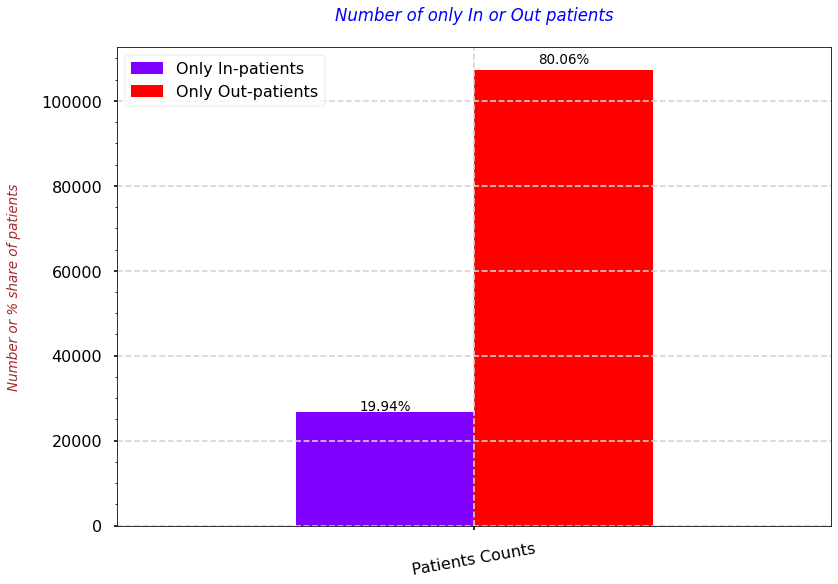

In [193]:
# Here, I'm displaying the number of only in-patients and out-patients
with plt.style.context('seaborn-poster'):
    fig = patients_counts.plot(kind='bar',colormap='rainbow')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_patients,2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xticks(labels=["Patients Counts"], ticks=[0], rotation=10)
    plt.ylabel("Number or % share of patients\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Number of only In or Out patients\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can decude that 80% of the patients gets medicared without even admission.

# ***Exploring the In-patients Data***

In [194]:
train_ip_df

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,2948,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,30390,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,2762,7843,32723,V1041,4254,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,3051,34400,5856,42732,486,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40469,BENE159167,CLM69886,2009-09-28,2009-10-02,PRV53671,7000,PHY345332,PHY319565,NaN,2009-09-28,2859,1068.0,2009-10-02,812,2851,2762,53550,V0254,V1005,5173,79092,70704,2869,4148,9904.0,NaN,NaN,NaN,NaN,NaN
40470,BENE159175,CLM74504,2009-11-03,2009-11-06,PRV54981,4000,PHY342806,PHY365497,NaN,2009-11-03,79902,1068.0,2009-11-06,228,42823,4148,4019,3970,4241,V1042,49122,4254,5990,NaN,8605.0,NaN,NaN,NaN,NaN,NaN
40471,BENE159177,CLM76485,2009-11-18,2009-11-22,PRV56588,3000,PHY423220,PHY332752,NaN,2009-11-18,78605,1068.0,2009-11-22,302,4280,3963,5859,4019,40390,4111,71534,71590,V4502,NaN,9390.0,NaN,NaN,NaN,NaN,NaN
40472,BENE159177,CLM79949,2009-12-17,2009-12-18,PRV56575,5000,PHY353156,NaN,NaN,2009-12-17,7802,1068.0,2009-12-18,309,7802,5859,496,2809,V1254,42822,4263,0414,41400,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- **NULL records in the in-patients data**

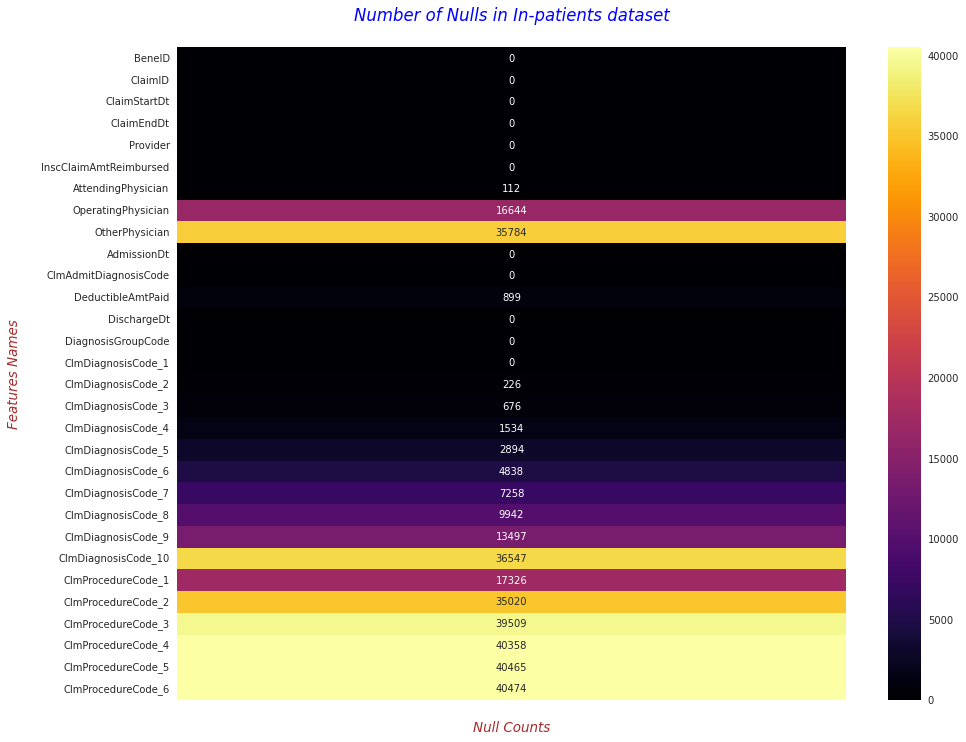

In [195]:
# Here, I'm displaying the number of only in-patients and out-patients
with plt.style.context('seaborn'):
    plt.figure(figsize=(15,12))
    fig = sns.heatmap(pd.DataFrame(train_ip_df.isnull().sum()), annot=True, fmt=".7g", cmap='inferno', cbar=True)
    # Providing the labels and title to the graph
    plt.xticks(labels=[" "], ticks=[0])
    plt.xlabel("Null Counts", fontdict=label_font_dict)
    plt.ylabel("Features Names\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Number of Nulls in In-patients dataset\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can see that the majority of the ProcedureCodes are having NULLS. And, ClmDiagnosisCode_10 is very rare among Patients.

- **Added Flag for indicating whether beneficiary admitted or not?**

In [196]:
train_ip_df["Admitted?"] = 1

- **Added Claim_Clearance_Days**

In [197]:
train_ip_df['ClaimStartDt'] = pd.to_datetime(train_ip_df['ClaimStartDt'], format="%Y-%m-%d")
train_ip_df['ClaimEndDt'] = pd.to_datetime(train_ip_df['ClaimEndDt'], format="%Y-%m-%d")

In [198]:
train_ip_df['Claim_Duration'] = (train_ip_df['ClaimEndDt'] - train_ip_df['ClaimStartDt']).dt.days

In [199]:
train_ip_df['Claim_Duration'].describe()

count    40474.000000
mean         5.660251
std          5.628873
min          0.000000
25%          2.000000
50%          4.000000
75%          7.000000
max         36.000000
Name: Claim_Duration, dtype: float64

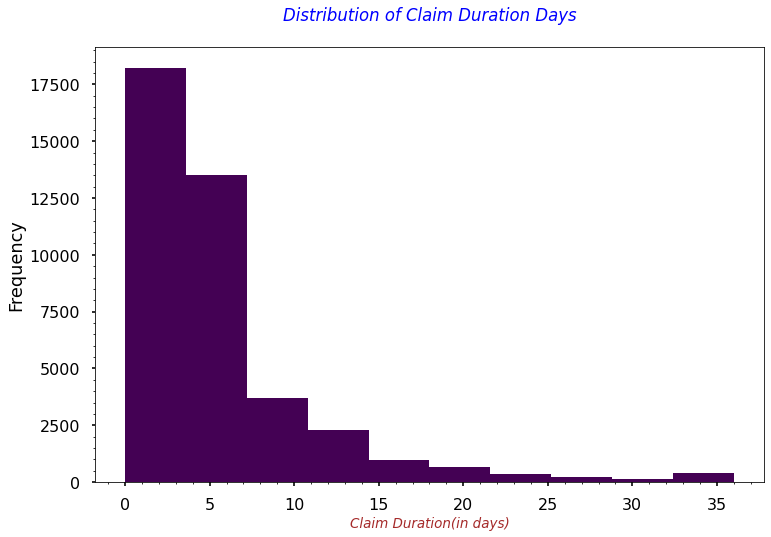

In [200]:
# Here, I'm displaying the number of only in-patients and out-patients
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,8))
    train_ip_df['Claim_Duration'].plot(kind='hist', colormap="viridis");
    # Providing the labels and title to the graph
    plt.xlabel("Claim Duration(in days)", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Claim Duration Days\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can decude that the majority of the claims filed for less than 7 days.


- **Percentiles values**

In [201]:
for val in [0.1,0.2,0.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99,0.999,0.9999,0.99999,0.999999,1.0]:
    percentile = round(float(val*100),6)
    percentile_val = round(train_ip_df["Claim_Duration"].quantile(val),1)
    print("Percentile --> {} and its value is --> {}".format(percentile,percentile_val))

Percentile --> 10.0 and its value is --> 1.0
Percentile --> 20.0 and its value is --> 2.0
Percentile --> 25.0 and its value is --> 2.0
Percentile --> 30.0 and its value is --> 3.0
Percentile --> 40.0 and its value is --> 3.0
Percentile --> 50.0 and its value is --> 4.0
Percentile --> 60.0 and its value is --> 5.0
Percentile --> 70.0 and its value is --> 6.0
Percentile --> 75.0 and its value is --> 7.0
Percentile --> 80.0 and its value is --> 8.0
Percentile --> 90.0 and its value is --> 12.0
Percentile --> 91.0 and its value is --> 13.0
Percentile --> 92.0 and its value is --> 14.0
Percentile --> 93.0 and its value is --> 14.0
Percentile --> 94.0 and its value is --> 15.0
Percentile --> 95.0 and its value is --> 17.0
Percentile --> 96.0 and its value is --> 18.0
Percentile --> 97.0 and its value is --> 21.0
Percentile --> 98.0 and its value is --> 25.0
Percentile --> 99.0 and its value is --> 32.0
Percentile --> 99.9 and its value is --> 35.0
Percentile --> 99.99 and its value is --> 35

**`OBSERVATION`**
* From the results, we can say that 95% of the claims are filed for 17 days.

### **Q1. What is the relationship b/w Amount of Insurance Claim Reimbursed v/s Claim Clearance Days?**

In [202]:
unq_claim_duration_days = train_ip_df['Claim_Duration'].unique()
unq_claim_duration_days

array([ 6,  2,  3,  8, 17,  5,  4,  7,  1, 11, 35,  9, 15, 12, 24, 23, 14,
        0, 10, 13, 18, 19, 28, 16, 21, 26, 22, 32, 27, 20, 31, 25, 34, 30,
       29, 33, 36])

In [203]:
tot_claims_filed_for_specific_days = pd.DataFrame(train_ip_df.groupby(['Claim_Duration'])['BeneID'].count())
tot_claims_filed_for_specific_days

,BeneID
Claim_Duration,
0,605
1,4599
2,6119
3,6899
4,4993
5,3579
6,2714
7,2210
8,1612


In [204]:
tot_insc_amount_for_claim_durations = pd.DataFrame(train_ip_df.groupby(['Claim_Duration'])['InscClaimAmtReimbursed'].sum())
tot_insc_amount_for_claim_durations

,InscClaimAmtReimbursed
Claim_Duration,
0,3925000
1,33356000
2,43987610
3,56477460
4,43932690
5,33962440
6,29057610
7,25537200
8,20637600


In [205]:
claim_clearance_amts = pd.merge(left=tot_claims_filed_for_specific_days, right=tot_insc_amount_for_claim_durations,
                                how='inner',
                                left_on=tot_claims_filed_for_specific_days.index,
                                right_on=tot_insc_amount_for_claim_durations.index)

claim_clearance_amts.columns = ['Claim_durations_in_days', 'Total_claims', 'All_Claims_Total_Amount']
claim_clearance_amts.head()

,Claim_durations_in_days,Total_claims,All_Claims_Total_Amount
0,0,605,3925000
1,1,4599,33356000
2,2,6119,43987610
3,3,6899,56477460
4,4,4993,43932690


In [206]:
claim_clearance_amts['Avg_Claim_Insc_Amount'] = np.round(claim_clearance_amts['All_Claims_Total_Amount']/claim_clearance_amts['Total_claims'],2)

In [207]:
claim_clearance_amts.head()

,Claim_durations_in_days,Total_claims,All_Claims_Total_Amount,Avg_Claim_Insc_Amount
0,0,605,3925000,6487.60
1,1,4599,33356000,7252.88
2,2,6119,43987610,7188.69
3,3,6899,56477460,8186.33
4,4,4993,43932690,8798.86


/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.313725490

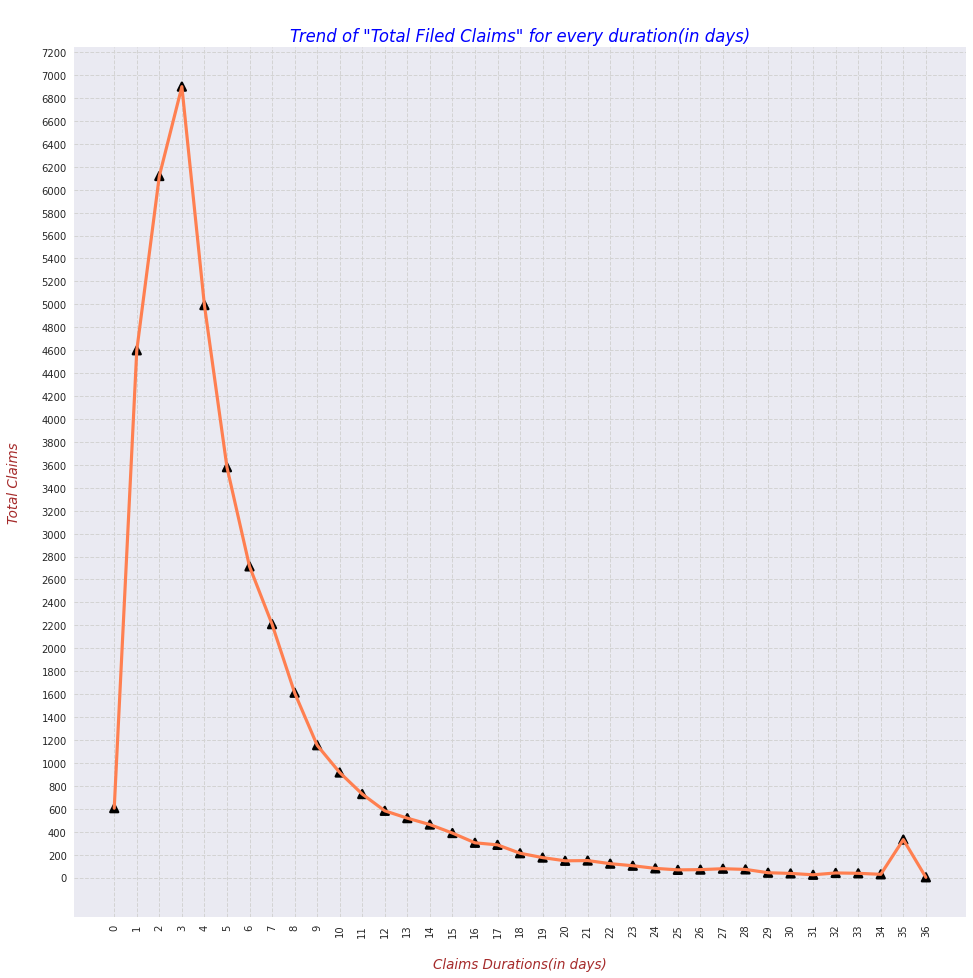

In [208]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,16))
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Total_claims', 
                  color='k', markers="^", linestyles="")
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Total_claims', 
                  color='coral', markers="", linestyles="-")
     
    # Providing the labels and title to the graph
    plt.xticks(rotation=90)
    plt.xlabel("\nClaims Durations(in days)", fontdict= label_font_dict)
    plt.ylabel("Total Claims\n", fontdict= label_font_dict)
    plt.yticks(np.arange(0,7500,200))
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title('\nTrend of "Total Filed Claims" for every duration(in days)', fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above graph tells us that the most number of claims are filed for 3 days. And, there are very less number of claims for duration greater than 15.
    * However, we can witness a litter spike for 35 days of duration for claims.

* And, there are around 600 claims for which the duration is 0 that means Claim Start Date and End Date is same.

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.313725490

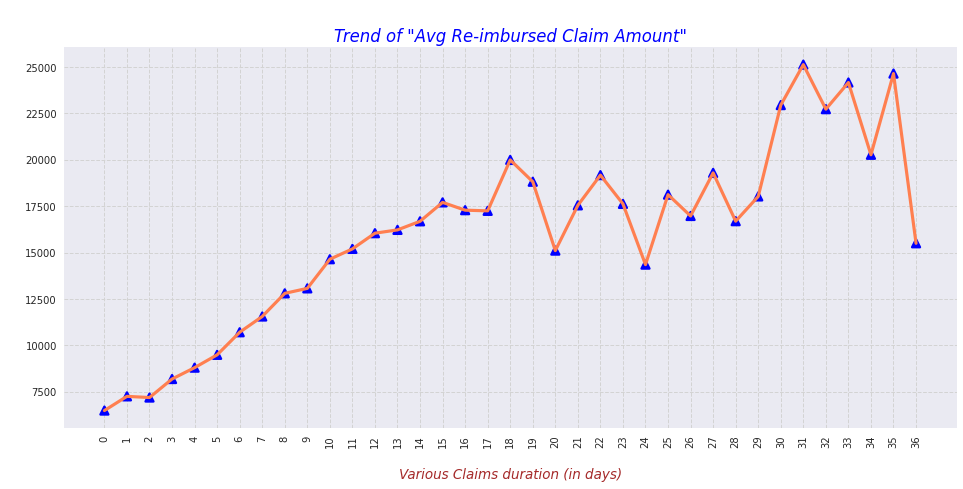

In [209]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,7))
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Avg_Claim_Insc_Amount', 
                  color='blue', markers="^", linestyles="")
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Avg_Claim_Insc_Amount', 
                  color='coral', markers="", linestyles="-")
    # Providing the labels and title to the graph
    plt.xticks(rotation=90)
    plt.xlabel("\nVarious Claims duration (in days)", fontdict= label_font_dict)
    plt.ylabel(" ", fontdict= label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title('\nTrend of "Avg Re-imbursed Claim Amount"', fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above graph tells us that as the claim duration increases then the Avg Re-imbursed Amount also increases, however, as we have already seen that total number of claims are very less when duration is greater than 15 days.

* Another thing to look here is that if the duration is b/w [30-35] then the Average Re-imbursed amount is very high and reaches its maximum.

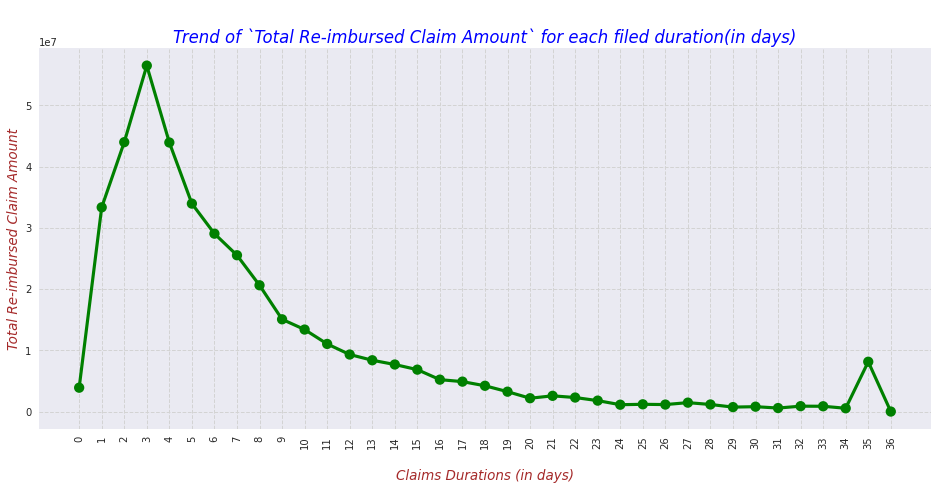

In [210]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,7))
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='All_Claims_Total_Amount', color='green')
    # Providing the labels and title to the graph
    plt.xticks(rotation=90)
    plt.xlabel("\nClaims Durations (in days)", fontdict= label_font_dict)
    plt.ylabel("Total Re-imbursed Claim Amount", fontdict= label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("\nTrend of `Total Re-imbursed Claim Amount` for each filed duration(in days)", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above graph tells us that the Total Re-imbursed Amount is the highest for 3 days claims

* And, for claims with durations from 12 to 34 the total re-imbursed amount is very less, however, for 35 days duration we can witness a clear spike that can be a potential sign of fraudulent.

### **Q2. What is the relationship b/w Claimed and Admitted Durations with Re-imbursed Amount?**

In [211]:
train_ip_df['DischargeDt'] = pd.to_datetime(train_ip_df['DischargeDt'], format="%Y-%m-%d")
train_ip_df['AdmissionDt'] = pd.to_datetime(train_ip_df['AdmissionDt'], format="%Y-%m-%d")

In [212]:
train_ip_df['Admitted_Days'] = train_ip_df['DischargeDt'] - train_ip_df['AdmissionDt']
train_ip_df['Admitted_Days'] = train_ip_df['Admitted_Days'].dt.days

In [213]:
claims_with_diff_admitted_and_claimed_dur = train_ip_df[~(train_ip_df['Claim_Duration'] == train_ip_df['Admitted_Days'])]
claims_with_diff_admitted_and_claimed_dur

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,...,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,Admitted?,Claim_Duration,Admitted_Days
35,BENE11093,CLM82202,2009-01-03,2009-01-12,PRV51842,20000,PHY341192,PHY355416,NaN,2009-01-03,4439,1068.0,2009-01-09,255,99662,...,V854,4280,E9320,04185,412,42732,3950.0,2762.0,NaN,NaN,NaN,NaN,1,9,6
2163,BENE18587,CLM37486,2009-02-10,2009-02-11,PRV52020,3000,PHY359519,NaN,NaN,2009-02-08,2859,1068.0,2009-02-11,804,2859,...,4168,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,3
3864,BENE24807,CLM82212,2008-12-31,2009-01-11,PRV54111,13000,PHY360669,PHY408812,NaN,2008-12-31,55221,1068.0,2009-01-09,345,56889,...,42731,9974,4589,27801,25000,NaN,5369.0,NaN,NaN,NaN,NaN,NaN,1,11,9
4422,BENE26849,CLM70032,2009-10-02,2009-10-07,PRV56647,12000,PHY332134,NaN,NaN,2009-09-29,2930,1068.0,2009-10-07,867,0389,...,42820,486,25000,4589,42833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,5,8
5400,BENE30503,CLM67400,2009-09-12,2009-09-14,PRV54228,3000,PHY364179,NaN,NaN,2009-09-09,5789,1068.0,2009-09-14,376,56211,...,4019,3004,41401,5771,2724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2,5
5647,BENE31388,CLM40738,2009-03-07,2009-03-08,PRV51490,16000,PHY325912,PHY325912,NaN,2009-03-02,25070,1068.0,2009-03-08,242,25070,...,25000,41401,40391,99591,73017,40390,8411.0,NaN,NaN,NaN,NaN,NaN,1,1,6
5869,BENE32209,CLM58624,2009-07-10,2009-07-17,PRV51249,6000,PHY326642,PHY383790,PHY372651,2009-07-06,5990,1068.0,2009-07-17,862,03842,...,99591,2900,78550,27651,NaN,NaN,9921.0,NaN,NaN,NaN,NaN,NaN,1,7,11
7752,BENE39346,CLM82211,2009-02-18,2009-02-26,PRV54065,19000,PHY337531,PHY341176,NaN,2009-02-18,44421,1068.0,2009-02-23,254,4422,...,44021,V1582,2724,25040,4439,27801,3712.0,NaN,NaN,NaN,NaN,NaN,1,8,5
7828,BENE39685,CLM47198,2009-04-20,2009-04-22,PRV53705,600,PHY416391,PHY356670,NaN,2009-04-16,78903,1068.0,2009-04-22,348,78720,...,78321,5772,71590,5601,2724,NaN,9390.0,NaN,NaN,NaN,NaN,NaN,1,2,6
7869,BENE39802,CLM73187,2009-11-01,2009-11-05,PRV52100,3000,PHY366670,PHY348391,NaN,2009-10-24,5780,1068.0,2009-11-05,349,53140,...,25000,78720,4280,33394,40390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,4,12


In [214]:
claims_with_diff_admitted_and_claimed_dur['InscClaimAmtReimbursed'].sum()

671400

**`OBSERVATION`**
* The above table tells us that there are 49 claims whose Claimed Duration and Admitted Duration are different.

* And, for these 49 claims the total re-imbursed amount is around 0.67 Million. So, doesn't look like an issue here as the admitted days can be greater than claimed duration based upon the plan bought by the beneficiary.

* **Lets check whether claimed duration is greater then admitted duration**

In [215]:
claims_with_diff_admitted_and_claimed_dur[claims_with_diff_admitted_and_claimed_dur['Claim_Duration']  > \
                                          claims_with_diff_admitted_and_claimed_dur['Admitted_Days']]

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,...,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,Admitted?,Claim_Duration,Admitted_Days
35,BENE11093,CLM82202,2009-01-03,2009-01-12,PRV51842,20000,PHY341192,PHY355416,NaN,2009-01-03,4439,1068.0,2009-01-09,255,99662,...,V854,4280,E9320,04185,412,42732,3950.0,2762.0,NaN,NaN,NaN,NaN,1,9,6
3864,BENE24807,CLM82212,2008-12-31,2009-01-11,PRV54111,13000,PHY360669,PHY408812,NaN,2008-12-31,55221,1068.0,2009-01-09,345,56889,...,42731,9974,4589,27801,25000,NaN,5369.0,NaN,NaN,NaN,NaN,NaN,1,11,9
7752,BENE39346,CLM82211,2009-02-18,2009-02-26,PRV54065,19000,PHY337531,PHY341176,NaN,2009-02-18,44421,1068.0,2009-02-23,254,4422,...,44021,V1582,2724,25040,4439,27801,3712.0,NaN,NaN,NaN,NaN,NaN,1,8,5
9094,BENE44545,CLM82209,2009-01-18,2009-01-27,PRV52843,14000,PHY365072,NaN,NaN,2009-01-18,85181,1068.0,2009-01-25,023,85202,...,2449,3485,78720,5070,5990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,9,7
9974,BENE47786,CLM82208,2009-05-27,2009-06-04,PRV52828,14000,PHY391167,NaN,NaN,2009-05-27,486,1068.0,2009-06-01,166,486,...,V140,27652,53081,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,8,5
17060,BENE73681,CLM82213,2009-02-10,2009-02-21,PRV54354,11000,PHY397703,NaN,PHY390453,2009-02-10,78079,1068.0,2009-02-18,315,41071,...,5849,42831,5853,28860,V4502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,11,8
18267,BENE78133,CLM82210,2009-01-02,2009-01-05,PRV53461,20000,PHY331754,PHY426843,NaN,2009-01-02,72981,1068.0,2009-01-03,228,44422,...,NaN,NaN,NaN,NaN,NaN,NaN,387.0,NaN,NaN,NaN,NaN,NaN,1,3,1
21298,BENE88968,CLM82205,2009-02-23,2009-02-28,PRV52045,24000,PHY339550,PHY359571,NaN,2009-02-23,78650,1068.0,2009-02-25,304,V5332,...,42741,V8536,4271,4148,4275,NaN,54.0,NaN,NaN,NaN,NaN,NaN,1,5,2
26395,BENE107828,CLM82216,2009-01-01,2009-01-22,PRV55018,19000,PHY364322,PHY320450,NaN,2009-01-01,78900,1068.0,2009-01-19,439,5758,...,41071,496,5990,5856,2720,486,5123.0,7850.0,NaN,NaN,NaN,NaN,1,21,18
27053,BENE110116,CLM82217,2009-02-09,2009-03-17,PRV56268,20000,PHY400645,PHY408610,NaN,2009-02-09,25010,1068.0,2009-03-16,642,25080,...,42789,42731,56881,5184,73007,NaN,3950.0,NaN,NaN,NaN,NaN,NaN,1,36,35


In [216]:
claims_with_diff_admitted_and_claimed_dur[claims_with_diff_admitted_and_claimed_dur['Claim_Duration']  > \
                                          claims_with_diff_admitted_and_claimed_dur['Admitted_Days']]['InscClaimAmtReimbursed'].sum()

274000

**`OBSERVATION`**
* The above table tells us that 17 claims out of 49 have Claimed Duration greater than the Admitted Duration.

* And, for these 17 claims the total re-imbursed amount is around 0.27 Million. For now, I'll keep this feature but my initial look says that it won't be much of a use.

### **Q3. What is the relationship b/w DeductibleAmtPaid and Re-imbursed Amount?**

In [217]:
no_of_claim_with_no_copay = train_ip_df[train_ip_df['DeductibleAmtPaid'].isna()].shape[0]
no_of_claim_with_no_copay

899

In [218]:
no_of_claim_with_copay = train_ip_df[~train_ip_df['DeductibleAmtPaid'].isna()].shape[0]
no_of_claim_with_copay

39575

In [219]:
percent_of_no_copay_claims = round((no_of_claim_with_no_copay / (no_of_claim_with_copay + no_of_claim_with_no_copay)) * 100,1)
print("### Percentage of claims with no co-payment or deductible --> {}% ###".format(percent_of_no_copay_claims))

### Percentage of claims with no co-payment or deductible --> 2.2% ###


In [220]:
re_imbursed_amt_for_no_copay = train_ip_df[train_ip_df['DeductibleAmtPaid'].isna()]['InscClaimAmtReimbursed'].sum()
re_imbursed_amt_for_no_copay

10690000

In [221]:
re_imbursed_amt_with_some_copay = train_ip_df[~train_ip_df['DeductibleAmtPaid'].isna()]['InscClaimAmtReimbursed'].sum()
re_imbursed_amt_with_some_copay

397607020

In [222]:
tot_sum_of_claims_with_copay = re_imbursed_amt_with_some_copay / (re_imbursed_amt_with_some_copay + re_imbursed_amt_for_no_copay)
tot_sum_of_claims_with_no_copay = re_imbursed_amt_for_no_copay / (re_imbursed_amt_with_some_copay + re_imbursed_amt_for_no_copay)

In [223]:
percent_of_tot_sum_no_copay_claims_amt = round(tot_sum_of_claims_with_no_copay * 100,1)
print("### Percentage of Total Re-imbursed Amount for claims with no co-payment or deductible --> {}% ###".\
      format(percent_of_tot_sum_no_copay_claims_amt))

### Percentage of Total Re-imbursed Amount for claims with no co-payment or deductible --> 2.6% ###


**`OBSERVATION`**
* The above table tells us that there are a 2% of total claims for which there is no co-payment.
    * And, for these 2% (or 899) of total claims the total re-imbursed amount is 10.6 Million that is 2.6% of the total re-imbursed amount.

In [224]:
# Here, updating the NULL values of DeductibleAmtPaid feature as 0
train_ip_df['DeductibleAmtPaid'].fillna(value=0.0, inplace=True)

### **Q4. What is the relationship of Providers with Total number of claims filed & Re-imbursed Amount?**

In [225]:
# How many unique providers are there in the dataset?
print("We have {} unique number of Providers in the in-patient dataset.".format(train_ip_df['Provider'].nunique()))

We have 2092 unique number of Providers in the in-patient dataset.


In [226]:
provider_tot_claims_filed = pd.DataFrame(train_ip_df.groupby(['Provider'])['ClaimID'].count())
provider_tot_reimbursed_amt = pd.DataFrame(train_ip_df.groupby(['Provider'])['InscClaimAmtReimbursed'].sum())

prv_tot_filed_claims_and_tot_reimb_amt = pd.merge(left=provider_tot_claims_filed, right=provider_tot_reimbursed_amt, how='inner',
                                                  left_on=provider_tot_claims_filed.index, right_on=provider_tot_reimbursed_amt.index)

prv_tot_filed_claims_and_tot_reimb_amt.columns = ['ProviderID', 'Tot_Claims_Filed', 'Tot_Re_Imbursed_Amt']
prv_tot_filed_claims_and_tot_reimb_amt.reset_index(drop=True,inplace=True)
prv_tot_filed_claims_and_tot_reimb_amt['Percentage_out_of_tot_reimb_amt'] = round((prv_tot_filed_claims_and_tot_reimb_amt['Tot_Re_Imbursed_Amt'] / train_ip_df['InscClaimAmtReimbursed'].sum()) * 100, 3)

provider_max_reimbursed_amt = pd.DataFrame(train_ip_df.groupby(['Provider'])['InscClaimAmtReimbursed'].max())
provider_max_reimbursed_amt.rename(columns={"InscClaimAmtReimbursed": "Max_Re_Imbursed_Amt"}, inplace=True)

prv_tot_filed_claims_tot_max_reimb_amt = pd.merge(left=prv_tot_filed_claims_and_tot_reimb_amt, 
                                                  right=provider_max_reimbursed_amt, how='inner',
                                                  left_on=prv_tot_filed_claims_and_tot_reimb_amt['ProviderID'], 
                                                  right_on=provider_max_reimbursed_amt.index)

prv_tot_filed_claims_tot_max_reimb_amt.drop(['key_0'], axis=1, inplace=True)
prv_tot_filed_claims_tot_max_reimb_amt['Diff_in_Tot_and_Max'] = prv_tot_filed_claims_tot_max_reimb_amt['Tot_Re_Imbursed_Amt'] - \
prv_tot_filed_claims_tot_max_reimb_amt['Max_Re_Imbursed_Amt']

prv_tot_filed_claims_tot_max_reimb_amt.head()

,ProviderID,Tot_Claims_Filed,Tot_Re_Imbursed_Amt,Percentage_out_of_tot_reimb_amt,Max_Re_Imbursed_Amt,Diff_in_Tot_and_Max
0,PRV51001,5,97000,0.024,42000,55000
1,PRV51003,62,573000,0.140,57000,516000
2,PRV51007,3,19000,0.005,10000,9000
3,PRV51008,2,25000,0.006,21000,4000
4,PRV51011,1,5000,0.001,5000,0


In [227]:
prv_tot_filed_claims_tot_max_reimb_amt.sort_values(by=['Diff_in_Tot_and_Max','Max_Re_Imbursed_Amt','Percentage_out_of_tot_reimb_amt'],
                                                   axis=0, inplace=True,
                                                   ascending=[True, False, False])

In [228]:
prv_tot_filed_claims_tot_max_reimb_amt.head(60)

,ProviderID,Tot_Claims_Filed,Tot_Re_Imbursed_Amt,Percentage_out_of_tot_reimb_amt,Max_Re_Imbursed_Amt,Diff_in_Tot_and_Max
574,PRV52518,1,57000,0.014,57000,0
578,PRV52537,1,57000,0.014,57000,0
1767,PRV56664,1,57000,0.014,57000,0
1883,PRV57080,1,57000,0.014,57000,0
2012,PRV57399,1,57000,0.014,57000,0
1970,PRV57290,2,55000,0.013,55000,0
305,PRV51681,1,51000,0.012,51000,0
637,PRV52804,1,36000,0.009,36000,0
286,PRV51626,1,35000,0.009,35000,0
11,PRV51035,1,29000,0.007,29000,0


**`OBSERVATION`**
* The above table showing us the Provider Ids who only filed 1 or 2 claims and got the entire amount re-imbursed.
    * This, can be a potential sign of fraudulent because many small-small hospitals in rural area who don't have much facilities or equipments made fraud for benefits. Similar recently happened : refer here https://www.justice.gov/opa/pr/two-individuals-convicted-14-billion-health-care-fraud-scheme-involving-rural-hospitals

In [229]:
tot_re_imb_amt_for_prv_with_5orless_claims = prv_tot_filed_claims_tot_max_reimb_amt[prv_tot_filed_claims_tot_max_reimb_amt['Tot_Claims_Filed'] < 5] \
                                            ['Tot_Re_Imbursed_Amt'].sum()

pp_re_imb_amt_for_prv_with_5orless_claims = round((tot_re_imb_amt_for_prv_with_5orless_claims / train_ip_df['InscClaimAmtReimbursed'].sum()) * 100,2)
print("### Total Re-imbursed Amount for Providers with less than 5 filed claims is --> {} (17 Million). ###\n\
### And, this is {}% of Total Re-imbursed Claim Amount (408 Million). ###".format(tot_re_imb_amt_for_prv_with_5orless_claims, 
                                                                    pp_re_imb_amt_for_prv_with_5orless_claims))

### Total Re-imbursed Amount for Providers with less than 5 filed claims is --> 17012550 (17 Million). ###
### And, this is 4.17% of Total Re-imbursed Claim Amount (408 Million). ###


# ***Exploring the Out-patients Data***

In [230]:
train_op_df.shape

(517737, 27)

- **NULL records in the in-patients data**

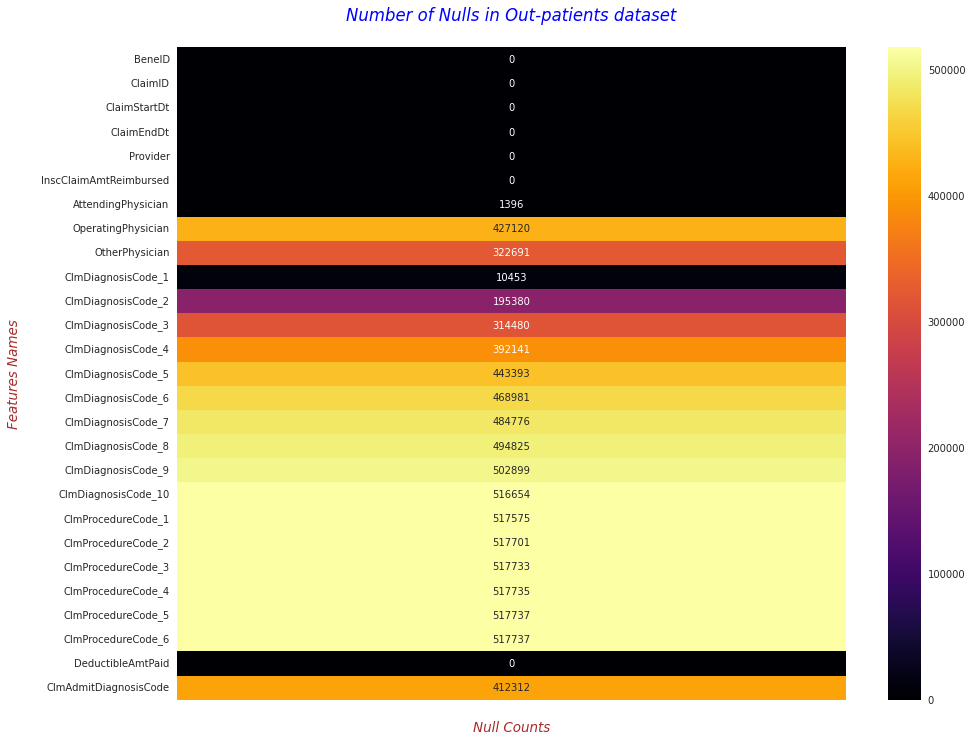

In [231]:
# Here, I'm displaying the number of only out-patients
with plt.style.context('seaborn'):
    plt.figure(figsize=(15,12))
    fig = sns.heatmap(pd.DataFrame(train_op_df.isnull().sum()), annot=True, fmt=".7g", cmap='inferno', cbar=True)
    # Providing the labels and title to the graph
    plt.xticks(labels=[" "], ticks=[0])
    plt.xlabel("Null Counts", fontdict=label_font_dict)
    plt.ylabel("Features Names\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Number of Nulls in Out-patients dataset\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can say that the majority of the ProcedureCodes are having NULLS. 

* ClmDiagnosisCode_9 & ClmDiagnosisCode_10 are very rare among Patients.

- **Added Flag for indicating whether beneficiary admitted or not?**

In [232]:
train_op_df["Admitted?"] = 0

- **Added Claim_Clearance_Days**

In [233]:
train_op_df['ClaimStartDt'] = pd.to_datetime(train_op_df['ClaimStartDt'], format="%Y-%m-%d")
train_op_df['ClaimEndDt'] = pd.to_datetime(train_op_df['ClaimEndDt'], format="%Y-%m-%d")

In [234]:
train_op_df['Claim_Duration'] = (train_op_df['ClaimEndDt'] - train_op_df['ClaimStartDt']).dt.days

In [235]:
train_op_df['Claim_Duration'].describe()

count    517737.000000
mean          1.420532
std           4.707387
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          23.000000
Name: Claim_Duration, dtype: float64

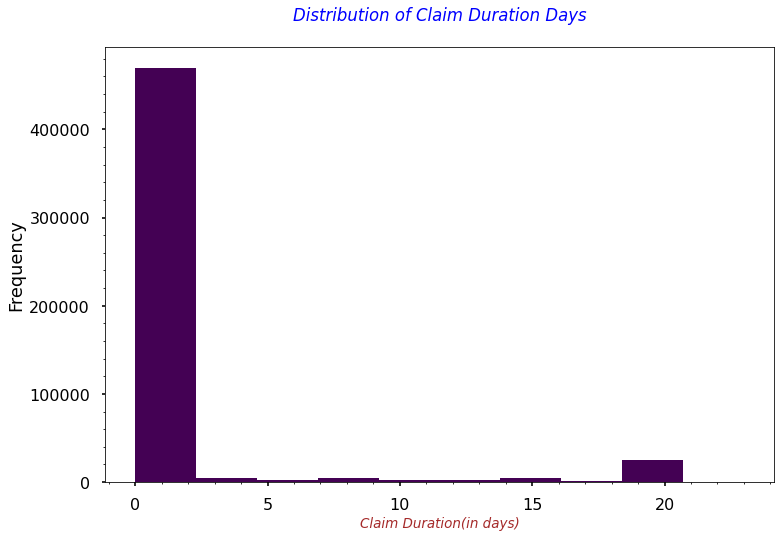

In [236]:
# Here, I'm displaying the number of only out-patients
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12,8))
    train_op_df['Claim_Duration'].plot(kind='hist', colormap="viridis");
    # Providing the labels and title to the graph
    plt.xlabel("Claim Duration(in days)", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Claim Duration Days\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can decude that the majority of the claims filed for less than or equals to 2 days.


- **Percentiles values**

In [237]:
for val in [0.1,0.2,0.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99,0.999,0.9999,0.99999,0.999999,1.0]:
    percentile = round(float(val*100),6)
    percentile_val = round(train_op_df["Claim_Duration"].quantile(val),1)
    print("Percentile --> {} and its value is --> {}".format(percentile,percentile_val))

Percentile --> 10.0 and its value is --> 0.0
Percentile --> 20.0 and its value is --> 0.0
Percentile --> 25.0 and its value is --> 0.0
Percentile --> 30.0 and its value is --> 0.0
Percentile --> 40.0 and its value is --> 0.0
Percentile --> 50.0 and its value is --> 0.0
Percentile --> 60.0 and its value is --> 0.0
Percentile --> 70.0 and its value is --> 0.0
Percentile --> 75.0 and its value is --> 0.0
Percentile --> 80.0 and its value is --> 0.0
Percentile --> 90.0 and its value is --> 2.0
Percentile --> 91.0 and its value is --> 3.0
Percentile --> 92.0 and its value is --> 6.0
Percentile --> 93.0 and its value is --> 9.0
Percentile --> 94.0 and its value is --> 14.0
Percentile --> 95.0 and its value is --> 17.0
Percentile --> 96.0 and its value is --> 20.0
Percentile --> 97.0 and its value is --> 20.0
Percentile --> 98.0 and its value is --> 20.0
Percentile --> 99.0 and its value is --> 20.0
Percentile --> 99.9 and its value is --> 20.0
Percentile --> 99.99 and its value is --> 20.0
P

**`OBSERVATION`**
* From the results, we can say that 90% of the claims are filed for 2 days.

### **Q5. What is the relationship b/w Claim Duration and Re-imbursed Amount?**

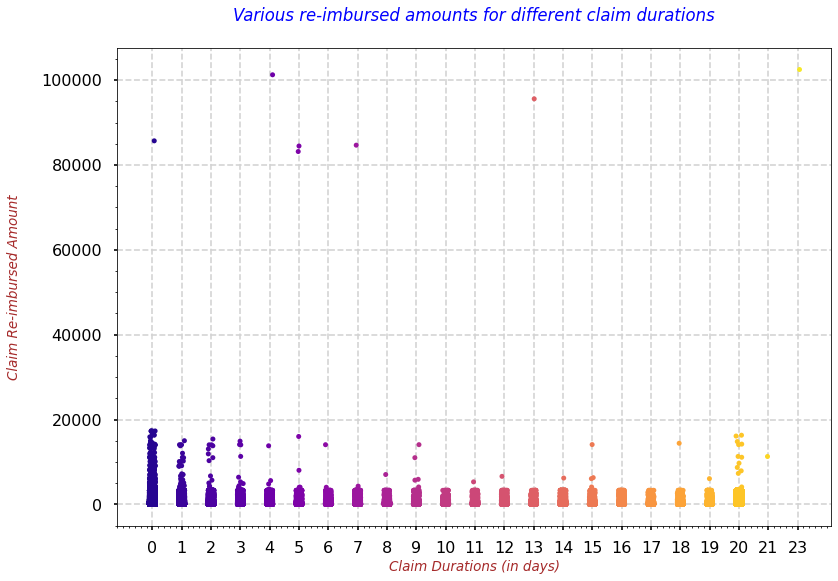

In [238]:
with plt.style.context("seaborn-poster"):
    sns.stripplot(x="Claim_Duration", y="InscClaimAmtReimbursed", data=train_op_df, palette="plasma")
    # Providing the labels and title to the graph
    plt.xlabel("Claim Durations (in days)", fontdict=label_font_dict)
    plt.ylabel("Claim Re-imbursed Amount\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Various re-imbursed amounts for different claim durations\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can decude that the majority of the claims filed have re-imbursed amount less than 20,000. And, very few have more than 1,00,000.

In [239]:
for val in [0.1,0.2,0.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99,0.999,0.9999,0.99999,0.999999,1.0]:
    percentile = round(float(val*100),6)
    percentile_val = round(train_op_df["InscClaimAmtReimbursed"].quantile(val),1)
    print("Percentile --> {} and its value is --> {}".format(percentile,percentile_val))

Percentile --> 10.0 and its value is --> 10.0
Percentile --> 20.0 and its value is --> 30.0
Percentile --> 25.0 and its value is --> 40.0
Percentile --> 30.0 and its value is --> 40.0
Percentile --> 40.0 and its value is --> 60.0
Percentile --> 50.0 and its value is --> 80.0
Percentile --> 60.0 and its value is --> 100.0
Percentile --> 70.0 and its value is --> 200.0
Percentile --> 75.0 and its value is --> 200.0
Percentile --> 80.0 and its value is --> 300.0
Percentile --> 90.0 and its value is --> 700.0
Percentile --> 91.0 and its value is --> 800.0
Percentile --> 92.0 and its value is --> 900.0
Percentile --> 93.0 and its value is --> 1000.0
Percentile --> 94.0 and its value is --> 1200.0
Percentile --> 95.0 and its value is --> 1500.0
Percentile --> 96.0 and its value is --> 1800.0
Percentile --> 97.0 and its value is --> 2100.0
Percentile --> 98.0 and its value is --> 2500.0
Percentile --> 99.0 and its value is --> 3300.0
Percentile --> 99.9 and its value is --> 3500.0
Percentile 

* **99.9% of claims have Re-imbursed amount less than 3500.**

### **Q5.1 What is the relationship b/w Claim Duration and Co-Payment?**

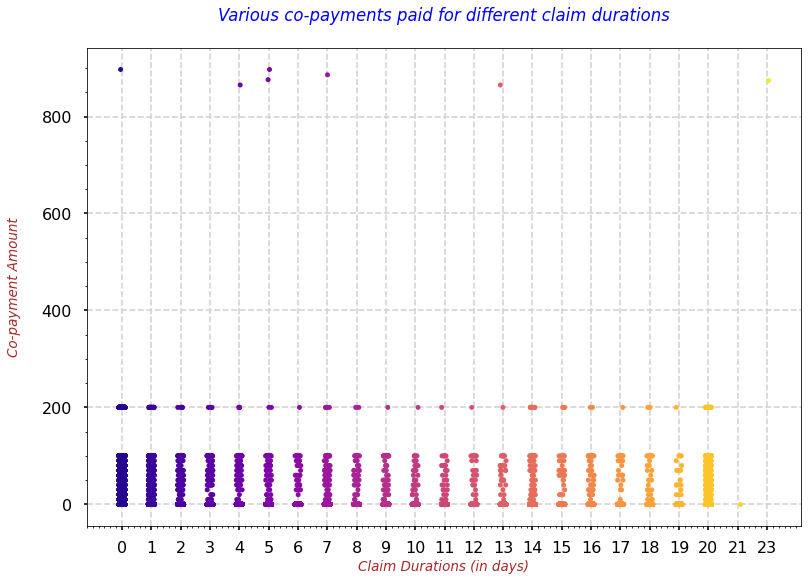

In [240]:
with plt.style.context("seaborn-poster"):
    sns.stripplot(x="Claim_Duration", y="DeductibleAmtPaid", data=train_op_df, palette="plasma")
    # Providing the labels and title to the graph
    plt.xlabel("Claim Durations (in days)", fontdict=label_font_dict)
    plt.ylabel("Co-payment Amount\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Various co-payments paid for different claim durations\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can decude that the trend of co-payment is similar across the various durations, however, there are few co-payment which are very high or more than 800.

### **Q6. What is the relationship b/w Amount of Insurance Claim Reimbursed v/s Claim Clearance Days?**

In [241]:
unq_claim_duration_days = train_op_df['Claim_Duration'].unique()
unq_claim_duration_days

array([ 0, 20, 12,  7, 14,  1, 15,  3,  6,  2, 13,  5,  9, 18, 10, 19, 16,
        4,  8, 17, 11, 23, 21])

In [242]:
train_op_df.columns

Index(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider',
       'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
       'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5',
       'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8',
       'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1',
       'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4',
       'ClmProcedureCode_5', 'ClmProcedureCode_6', 'DeductibleAmtPaid',
       'ClmAdmitDiagnosisCode', 'Admitted?', 'Claim_Duration'],
      dtype='object')

In [243]:
tot_claims_filed_for_specific_days = pd.DataFrame(train_op_df.groupby(['Claim_Duration'])['ClaimID'].count())
tot_claims_filed_for_specific_days

,ClaimID
Claim_Duration,
0,453348
1,11960
2,4366
3,2597
4,2238
5,1511
6,1306
7,2564
8,1189


In [244]:
tot_insc_amount_for_claim_durations = pd.DataFrame(train_op_df.groupby(['Claim_Duration'])['InscClaimAmtReimbursed'].sum())
tot_insc_amount_for_claim_durations

,InscClaimAmtReimbursed
Claim_Duration,
0,105624910
1,5381060
2,2227230
3,1272800
4,1270910
5,976870
6,571400
7,1280020
8,463190


In [245]:
claim_clearance_amts = pd.merge(left=tot_claims_filed_for_specific_days, right=tot_insc_amount_for_claim_durations,
                                how='inner',
                                left_on=tot_claims_filed_for_specific_days.index,
                                right_on=tot_insc_amount_for_claim_durations.index)

claim_clearance_amts.columns = ['Claim_durations_in_days', 'Total_claims', 'All_Claims_Total_Amount']
claim_clearance_amts.head()

,Claim_durations_in_days,Total_claims,All_Claims_Total_Amount
0,0,453348,105624910
1,1,11960,5381060
2,2,4366,2227230
3,3,2597,1272800
4,4,2238,1270910


In [246]:
claim_clearance_amts['Avg_Claim_Insc_Amount'] = np.round(claim_clearance_amts['All_Claims_Total_Amount']/claim_clearance_amts['Total_claims'],2)

In [247]:
claim_clearance_amts.head()

,Claim_durations_in_days,Total_claims,All_Claims_Total_Amount,Avg_Claim_Insc_Amount
0,0,453348,105624910,232.99
1,1,11960,5381060,449.92
2,2,4366,2227230,510.13
3,3,2597,1272800,490.10
4,4,2238,1270910,567.88


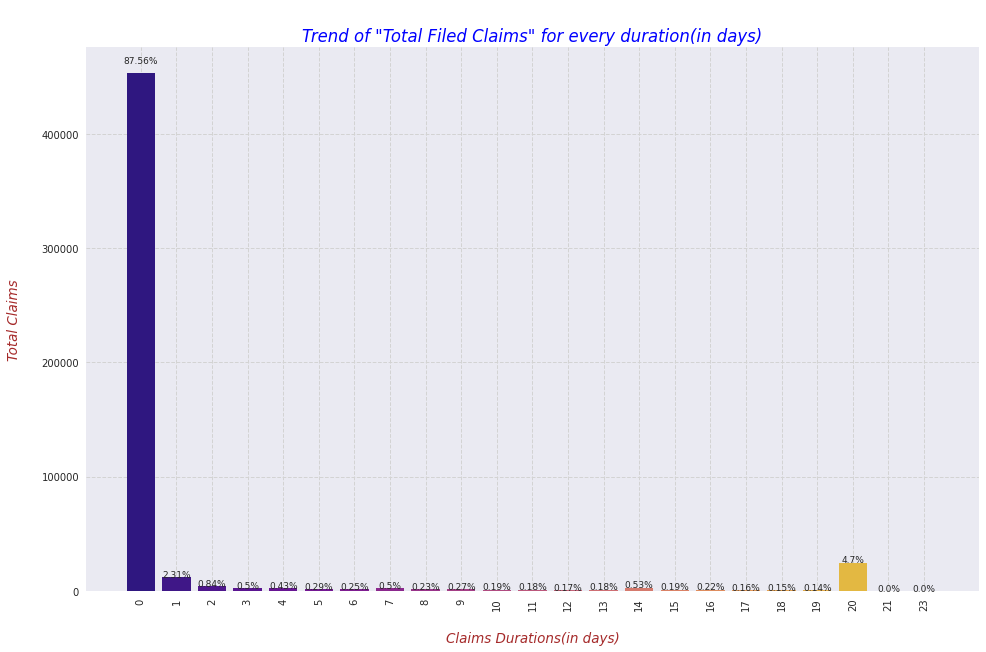

In [248]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,10))
    fig = sns.barplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Total_claims', palette='plasma')     
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/claim_clearance_amts["Total_claims"].sum(),2))+"%"}', (x + width/2, y + height*1.02), ha='center', fontsize=9, rotation=0)
    
    # Providing the labels and title to the graph
    plt.xticks(rotation=90)
    plt.xlabel("\nClaims Durations(in days)", fontdict= label_font_dict)
    plt.ylabel("Total Claims\n", fontdict= label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title('\nTrend of "Total Filed Claims" for every duration(in days)', fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above graph tells us that the most number of claims are filed for 0 days. And, there are very less number of claims for other durations.
    * However, we can witness a litter spike for 20 days of duration for claims.

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1735: UserWarning: You passed a edgecolor/edgecolors ([(1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.3137254901960784), (1.0, 0.4980392156862745, 0.313725490

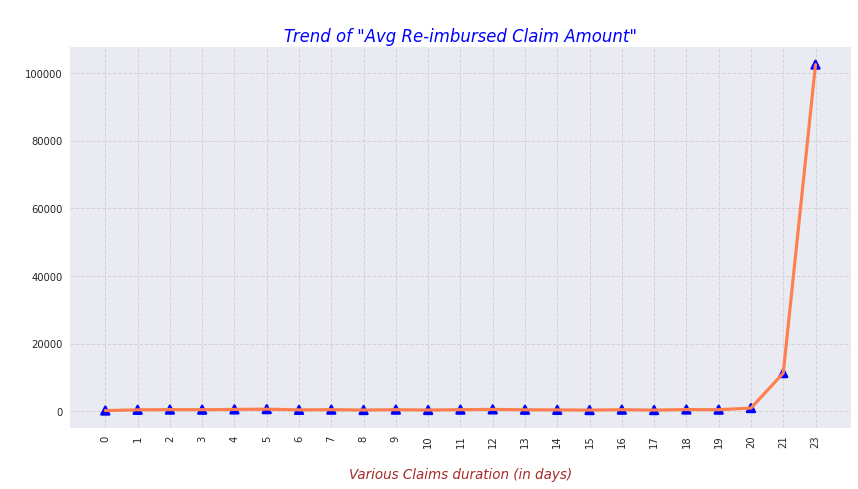

In [249]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(14,7))
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Avg_Claim_Insc_Amount', 
                  color='blue', markers="^", linestyles="")
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='Avg_Claim_Insc_Amount', 
                  color='coral', markers="", linestyles="-")
    # Providing the labels and title to the graph
    plt.xticks(rotation=90)
    plt.xlabel("\nVarious Claims duration (in days)", fontdict= label_font_dict)
    plt.ylabel(" ", fontdict= label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title('\nTrend of "Avg Re-imbursed Claim Amount"', fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above graph tells us that the Average Re-imbursed Amount is same throughout the various durations except for 21 and 23 days.

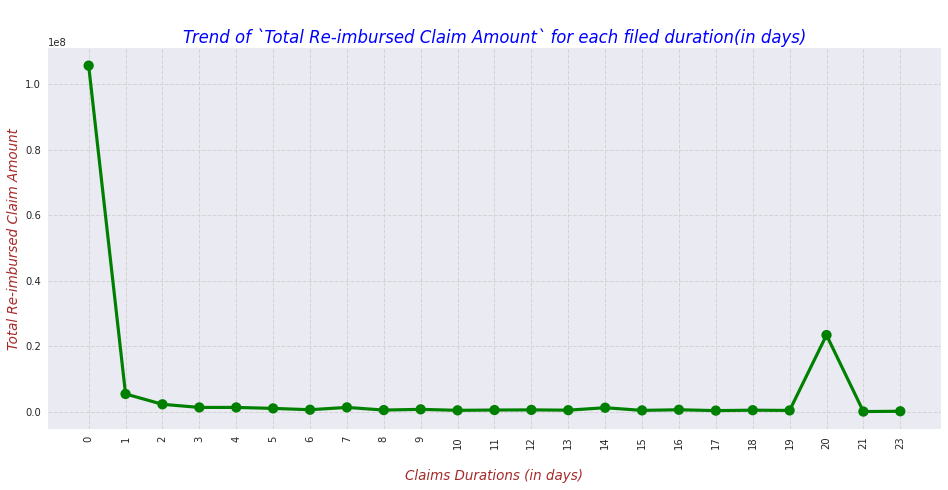

In [250]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(16,7))
    sns.pointplot(data=claim_clearance_amts, x='Claim_durations_in_days', y='All_Claims_Total_Amount', color='green')
    # Providing the labels and title to the graph
    plt.xticks(rotation=90)
    plt.xlabel("\nClaims Durations (in days)", fontdict= label_font_dict)
    plt.ylabel("Total Re-imbursed Claim Amount", fontdict= label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("\nTrend of `Total Re-imbursed Claim Amount` for each filed duration(in days)", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above graph tells us that the Total Re-imbursed Amount is the highest for 0 days claims.

* And, for claims with durations from 2 to 19 the total re-imbursed amount is very less or similar, however, for 20 days duration we can witness a clear spike that can be a potential sign of fraudulent.

### **Q7. What is the relationship b/w DeductibleAmtPaid and Re-imbursed Amount?**

In [251]:
no_of_claim_with_no_copay = train_op_df[train_op_df['DeductibleAmtPaid'] == 0].shape[0]
no_of_claim_with_no_copay

496701

In [252]:
no_of_claim_with_copay = train_op_df[train_op_df['DeductibleAmtPaid'] != 0].shape[0]
no_of_claim_with_copay

21036

In [253]:
percent_of_no_copay_claims = round((no_of_claim_with_no_copay / (no_of_claim_with_copay + no_of_claim_with_no_copay)) * 100,1)
print("### Percentage of claims with no co-payment or deductible --> {}% ###".format(percent_of_no_copay_claims))

### Percentage of claims with no co-payment or deductible --> 95.9% ###


In [254]:
re_imbursed_amt_for_no_copay = train_op_df[train_op_df['DeductibleAmtPaid'] == 0]['InscClaimAmtReimbursed'].sum()
re_imbursed_amt_for_no_copay

142391850

In [255]:
re_imbursed_amt_with_some_copay = train_op_df[train_op_df['DeductibleAmtPaid'] != 0]['InscClaimAmtReimbursed'].sum()
re_imbursed_amt_with_some_copay

5854270

In [256]:
tot_sum_of_claims_with_copay = re_imbursed_amt_with_some_copay / (re_imbursed_amt_with_some_copay + re_imbursed_amt_for_no_copay)
tot_sum_of_claims_with_no_copay = re_imbursed_amt_for_no_copay / (re_imbursed_amt_with_some_copay + re_imbursed_amt_for_no_copay)

In [257]:
percent_of_tot_sum_no_copay_claims_amt = round(tot_sum_of_claims_with_no_copay * 100,1)
print("### Percentage of Total Re-imbursed Amount for claims with no co-payment or deductible --> {}% ###".\
      format(percent_of_tot_sum_no_copay_claims_amt))

### Percentage of Total Re-imbursed Amount for claims with no co-payment or deductible --> 96.1% ###


**`OBSERVATION`**
* The above table tells us that there are 95.9% of total claims for which there is no co-payment.
    * And, for these 95.9% of total claims the total re-imbursed amount is 142.3 Million that is 96.1% of the total re-imbursed amount.

### **Q8. What is the relationship of Providers with Total number of claims filed & Re-imbursed Amount?**

In [258]:
# How many unique providers are there in the dataset?
print("We have {} unique number of Providers in the in-patient dataset.".format(train_op_df['Provider'].nunique()))

We have 5012 unique number of Providers in the in-patient dataset.


In [259]:
provider_tot_claims_filed = pd.DataFrame(train_op_df.groupby(['Provider'])['ClaimID'].count())
provider_tot_reimbursed_amt = pd.DataFrame(train_op_df.groupby(['Provider'])['InscClaimAmtReimbursed'].sum())

prv_tot_filed_claims_and_tot_reimb_amt = pd.merge(left=provider_tot_claims_filed, right=provider_tot_reimbursed_amt, how='inner',
                                                  left_on=provider_tot_claims_filed.index, right_on=provider_tot_reimbursed_amt.index)

prv_tot_filed_claims_and_tot_reimb_amt.columns = ['ProviderID', 'Tot_Claims_Filed', 'Tot_Re_Imbursed_Amt']
prv_tot_filed_claims_and_tot_reimb_amt.reset_index(drop=True,inplace=True)
prv_tot_filed_claims_and_tot_reimb_amt['Percentage_out_of_tot_reimb_amt'] = round((prv_tot_filed_claims_and_tot_reimb_amt['Tot_Re_Imbursed_Amt'] / train_op_df['InscClaimAmtReimbursed'].sum()) * 100, 3)

provider_max_reimbursed_amt = pd.DataFrame(train_op_df.groupby(['Provider'])['InscClaimAmtReimbursed'].max())
provider_max_reimbursed_amt.rename(columns={"InscClaimAmtReimbursed": "Max_Re_Imbursed_Amt"}, inplace=True)

prv_tot_filed_claims_tot_max_reimb_amt = pd.merge(left=prv_tot_filed_claims_and_tot_reimb_amt, 
                                                  right=provider_max_reimbursed_amt, how='inner',
                                                  left_on=prv_tot_filed_claims_and_tot_reimb_amt['ProviderID'], 
                                                  right_on=provider_max_reimbursed_amt.index)

prv_tot_filed_claims_tot_max_reimb_amt.drop(['key_0'], axis=1, inplace=True)
prv_tot_filed_claims_tot_max_reimb_amt['Diff_in_Tot_and_Max'] = prv_tot_filed_claims_tot_max_reimb_amt['Tot_Re_Imbursed_Amt'] - \
prv_tot_filed_claims_tot_max_reimb_amt['Max_Re_Imbursed_Amt']

prv_tot_filed_claims_tot_max_reimb_amt.head()

,ProviderID,Tot_Claims_Filed,Tot_Re_Imbursed_Amt,Percentage_out_of_tot_reimb_amt,Max_Re_Imbursed_Amt,Diff_in_Tot_and_Max
0,PRV51001,20,7640,0.005,1500,6140
1,PRV51003,70,32670,0.022,3300,29370
2,PRV51004,149,52170,0.035,3300,48870
3,PRV51005,1165,280910,0.189,4080,276830
4,PRV51007,69,14710,0.010,3300,11410


In [260]:
prv_tot_filed_claims_tot_max_reimb_amt.sort_values(by=['Diff_in_Tot_and_Max','Max_Re_Imbursed_Amt','Percentage_out_of_tot_reimb_amt'],
                                                   axis=0, inplace=True,
                                                   ascending=[True, False, False])

In [261]:
prv_tot_filed_claims_tot_max_reimb_amt.head(60)

,ProviderID,Tot_Claims_Filed,Tot_Re_Imbursed_Amt,Percentage_out_of_tot_reimb_amt,Max_Re_Imbursed_Amt,Diff_in_Tot_and_Max
82,PRV51119,1,95580,0.064,95580,0
2480,PRV54295,1,3300,0.002,3300,0
2485,PRV54302,1,3300,0.002,3300,0
3307,PRV55456,1,3300,0.002,3300,0
433,PRV51577,1,2100,0.001,2100,0
1473,PRV52954,1,2100,0.001,2100,0
4326,PRV56819,1,1900,0.001,1900,0
5010,PRV57762,1,1900,0.001,1900,0
521,PRV51689,1,1700,0.001,1700,0
3430,PRV55610,1,1700,0.001,1700,0


**`OBSERVATION`**
* The above table showing us the Provider Ids who only filed 1 or 2 claims and got the entire amount re-imbursed.
    * This, can be a potential sign of fraudulent because many small-small hospitals in rural area who don't have much facilities or equipments made fraud for benefits. Similar recently happened : refer here https://www.justice.gov/opa/pr/two-individuals-convicted-14-billion-health-care-fraud-scheme-involving-rural-hospitals

In [262]:
tot_re_imb_amt_for_prv_with_5orless_claims = prv_tot_filed_claims_tot_max_reimb_amt[prv_tot_filed_claims_tot_max_reimb_amt['Tot_Claims_Filed'] < 5] \
                                            ['Tot_Re_Imbursed_Amt'].sum()

pp_re_imb_amt_for_prv_with_5orless_claims = round((tot_re_imb_amt_for_prv_with_5orless_claims / train_op_df['InscClaimAmtReimbursed'].sum()) * 100,2)
print("### Total Re-imbursed Amount for Providers with less than 5 filed claims is --> {} (0.52 Million). ###\n\
### And, this is {}% of Total Re-imbursed Claim Amount (148 Million). ###".format(tot_re_imb_amt_for_prv_with_5orless_claims, 
                                                                    pp_re_imb_amt_for_prv_with_5orless_claims))

### Total Re-imbursed Amount for Providers with less than 5 filed claims is --> 522910 (0.52 Million). ###
### And, this is 0.35% of Total Re-imbursed Claim Amount (148 Million). ###


# **`IP & OP - EDA - SUMMARY`**

- Features to be added:
    - Claim Duration
    - Admitted Duration
    - Admitted or not?


- Relationships to be validated:
    - Providers <--> Physicians <--> Fraud or not?
    - Providers <--> Physicians <--> Diagnosis and Procedure Codes <--> Fraud or not?
    - Providers with very less number of claims submissions but higher Re-imbursed amount <--> Fraud or not?

# **Entire Data -- EDA**

In [263]:
train_bene_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Beneficiarydata-1542865627584.csv")
train_ip_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Inpatientdata-1542865627584.csv")
train_op_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Outpatientdata-1542865627584.csv")
train_tgt_lbls_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train-1542865627584.csv")

## ***Exploring_Target_Labels_Data***

In [264]:
train_tgt_lbls_df.head()

,Provider,PotentialFraud
0,PRV51001,No
1,PRV51003,Yes
2,PRV51004,No
3,PRV51005,Yes
4,PRV51007,No


* **Check the Fraud and Non-Fraud Counts**

In [265]:
print("### The unique number of providers are {}. ###".format(train_tgt_lbls_df.shape[0]))

### The unique number of providers are 5410. ###


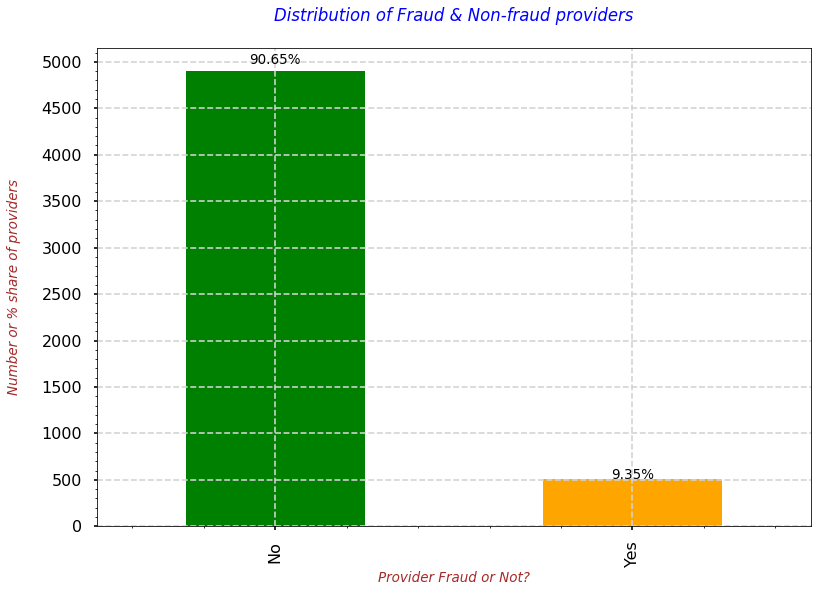

In [266]:
with plt.style.context('seaborn-poster'):
    fig = train_tgt_lbls_df["PotentialFraud"].value_counts().plot(kind='bar', color=['green','orange'])
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/train_tgt_lbls_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xlabel("Provider Fraud or Not?", fontdict=label_font_dict)
    plt.ylabel("Number or % share of providers\n", fontdict=label_font_dict)
    plt.yticks(np.arange(0,5100,500))
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of Fraud & Non-fraud providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can say that 90% of the providers are not frausters and only 9% of them are involved in frauds.

### **Adding the `Admitted` or `Not Admitted` indicator in IP and OP Dataset**

* **Adding in IP Dataset**

In [267]:
train_ip_df["Admitted?"] = 1

In [268]:
train_ip_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,...,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,Admitted?
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,...,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,...,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,...,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,...,7843,32723,V1041,4254,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,...,34400,5856,42732,486,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN,1


* **Adding in OP Dataset**

In [269]:
train_op_df["Admitted?"] = 0

In [270]:
train_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DeductibleAmtPaid,ClmAdmitDiagnosisCode,Admitted?
0,BENE11002,CLM624349,2009-10-11,2009-10-11,PRV56011,30,PHY326117,NaN,NaN,78943,V5866,V1272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,56409,0
1,BENE11003,CLM189947,2009-02-12,2009-02-12,PRV57610,80,PHY362868,NaN,NaN,6115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,79380,0
2,BENE11003,CLM438021,2009-06-27,2009-06-27,PRV57595,10,PHY328821,NaN,NaN,2723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
3,BENE11004,CLM121801,2009-01-06,2009-01-06,PRV56011,40,PHY334319,NaN,NaN,71988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
4,BENE11004,CLM150998,2009-01-22,2009-01-22,PRV56011,200,PHY403831,NaN,NaN,82382,30000,72887,4280,7197,V4577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,71947,0


### **Merging the Datasets**

In [271]:
# Commom columns must be 28
common_cols = [col for col in train_ip_df.columns if col in train_op_df.columns]
len(common_cols)

28

In [272]:
# Merging the IP and OP dataset on the basis of common columns
train_ip_op_df = pd.merge(left=train_ip_df, right=train_op_df, left_on=common_cols, right_on=common_cols, how="outer")
train_ip_op_df.shape

(558211, 31)

In [273]:
train_ip_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,...,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,Admitted?
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,...,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,...,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,...,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,...,7843,32723,V1041,4254,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,...,34400,5856,42732,486,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN,1


### **Merging the IP_OP Dataset with BENE Data**

In [274]:
# Joining the IP_OP dataset with the BENE data
train_ip_op_bene_df = pd.merge(left=train_ip_op_df, right=train_bene_df, left_on='BeneID', right_on='BeneID',how='inner')
train_ip_op_bene_df.shape

(558211, 55)

### **Merging the IP_OP_BENE Dataset with PROVIDER level Tgt Labels Data**

In [275]:
# Joining the IP_OP_BENE dataset with the Tgt Label Provider Data
train_iobp_df = pd.merge(left=train_ip_op_bene_df, right=train_tgt_lbls_df, left_on='Provider', right_on='Provider',how='inner')
train_iobp_df.shape

(558211, 56)

### **Entire Dataset**

In [276]:
train_iobp_df.shape

(558211, 56)

In [277]:
# Unique Providers
train_iobp_df["Provider"].nunique()

5410

In [278]:
# Unique Claim numbers
train_iobp_df["ClaimID"].nunique()

558211

### *`ASSUMPTION`* :: One provider may have been involved in more than one claim. So, does all the claims filed by a potentially fraud provider are all frauds?
    - This cannot holds True for all the providers because if one provider has filed say 50 claims then we can't say that all the claims for that provider are fraudulent. 
        - There may exists a pattern that out of 50 claims a provider files 1 or 2 fraudulent claims. 
    
#### **`Therefore, it is a big assumption to make that all the claims filed by a potentially fraud provider are fraudulent.`**

In [279]:
prvs_claims_df = pd.DataFrame(train_iobp_df.groupby(['Provider'])['ClaimID'].count()).reset_index()
prvs_claims_tgt_lbls_df = pd.merge(left=prvs_claims_df, right=train_tgt_lbls_df, on='Provider', how='inner')
prvs_claims_tgt_lbls_df

,Provider,ClaimID,PotentialFraud
0,PRV51001,25,No
1,PRV51003,132,Yes
2,PRV51004,149,No
3,PRV51005,1165,Yes
4,PRV51007,72,No
...,...,...,...
5405,PRV57759,28,No
5406,PRV57760,22,No
5407,PRV57761,82,No
5408,PRV57762,1,No


**`OBSERVATION`**
* As shown in the above table, PRV51005 has filed 1165 claims so after joining the datasets all of these will be marked as Fraud.

- **Fraud Count at Claims level**

     PotentialFraud
No           345415
Yes          212796 



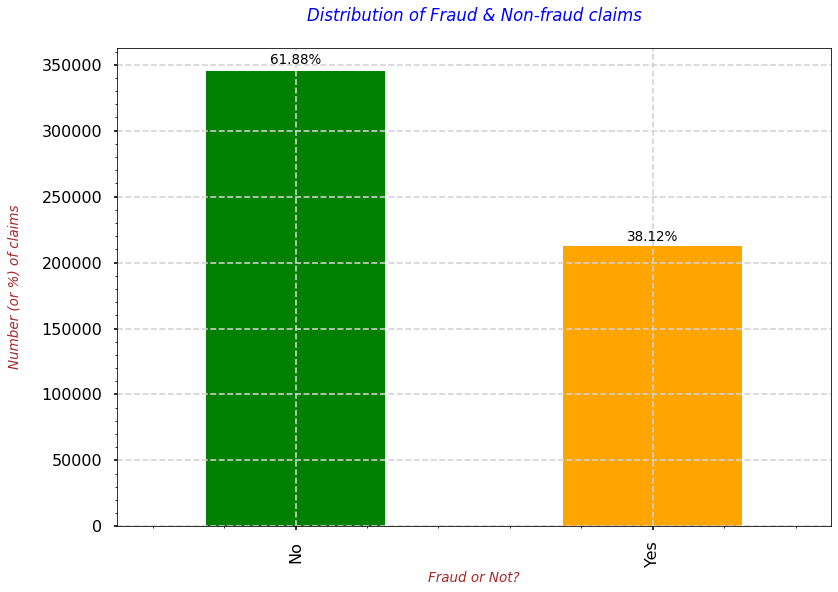

In [280]:
print(pd.DataFrame(train_iobp_df['PotentialFraud'].value_counts()), "\n")

with plt.style.context('seaborn-poster'):
    fig = train_iobp_df['PotentialFraud'].value_counts().plot(kind='bar', color=['green','orange'])
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/train_iobp_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xlabel("Fraud or Not?", fontdict=label_font_dict)
    plt.ylabel("Number (or %) of claims\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of Fraud & Non-fraud claims\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us that, 62% of claims are Non-Fraud and 32% of them are Fraudulent. 
    * By looking at the percentages we may say that there is a class-imbalance problem but after looking at the number of records it doesn't seem to be a severe class-imbalance problem. 
        * So, I'll try some class balancing techniques only after training a baseline model w/o any synthetic or class weighting techniques.

# **Feature Engineering + Impact Analysis**
**`Let's create some features`**

### **Adding `New Feature` :: `Is_Alive?`**

    - Is Alive? = No if DOD is NaN else Yes

In [281]:
train_iobp_df['DOB'] = pd.to_datetime(train_iobp_df['DOB'], format="%Y-%m-%d")
train_iobp_df['DOD'] = pd.to_datetime(train_iobp_df['DOD'], format="%Y-%m-%d")

In [282]:
train_iobp_df['Is_Alive?'] = train_iobp_df['DOD'].apply(lambda val: 'No' if val != val else 'Yes')

In [283]:
train_iobp_df['Is_Alive?'].value_counts()

No     554080
Yes      4131
Name: Is_Alive?, dtype: int64

### **Adding `New Feature` :: `Claim_Duration`**
    
    - Claim Duration = Claim End Date - Claim Start Date

In [284]:
train_iobp_df['ClaimStartDt'] = pd.to_datetime(train_iobp_df['ClaimStartDt'], format="%Y-%m-%d")
train_iobp_df['ClaimEndDt'] = pd.to_datetime(train_iobp_df['ClaimEndDt'], format="%Y-%m-%d")

train_iobp_df['Claim_Duration'] = (train_iobp_df['ClaimEndDt'] - train_iobp_df['ClaimStartDt']).dt.days

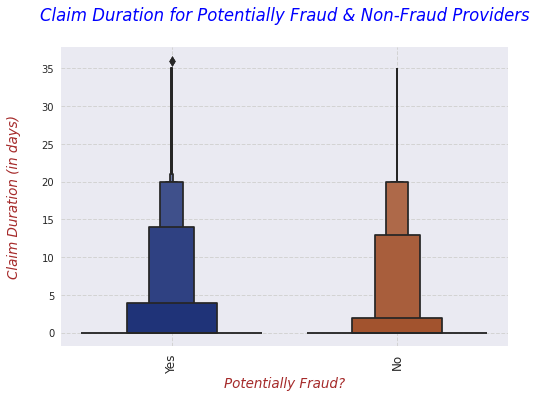

In [285]:
with plt.style.context('seaborn'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='Claim_Duration', palette='dark')
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Duration for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Duration for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Duration alone might not be useful in segregating the Fraud cases.

- **Relationship b/w `Claim_Duration` and `Potentially Fraud` for both the `Genders`**

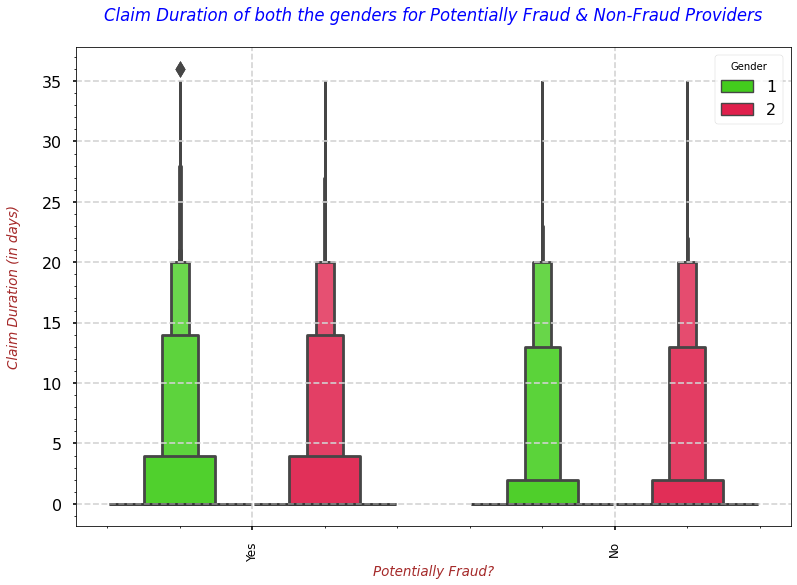

In [286]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='Claim_Duration', hue='Gender', palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Duration of both the genders for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Duration of males and females for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Duration might not be useful in segregating the Fraud cases.

- **Relationship b/w `Claim_Duration` and `Potentially Fraud` for `Is_Alive?`**

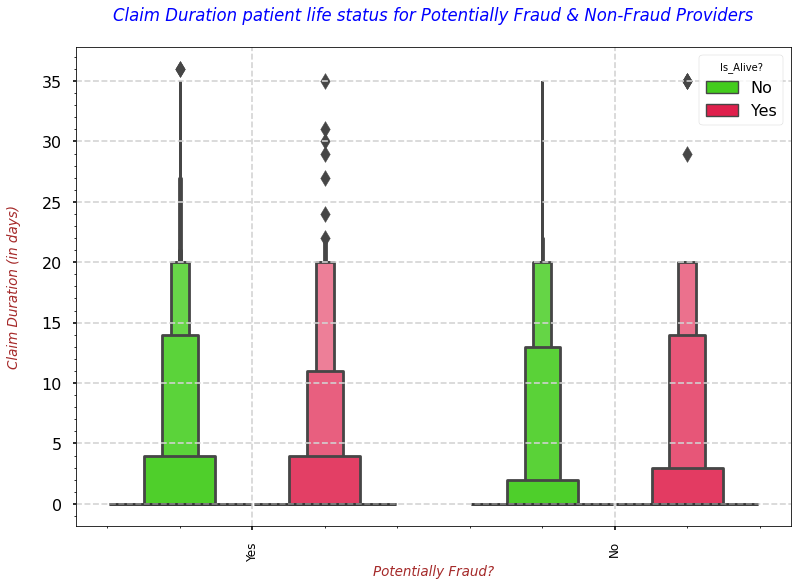

In [287]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='Claim_Duration', hue='Is_Alive?', palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Duration patient life status for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Duration on patient life status for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Duration might not be useful in segregating the Fraud cases.

- **Relationship b/w `Claim_Duration` and `Potentially Fraud` for all `Human Races`**

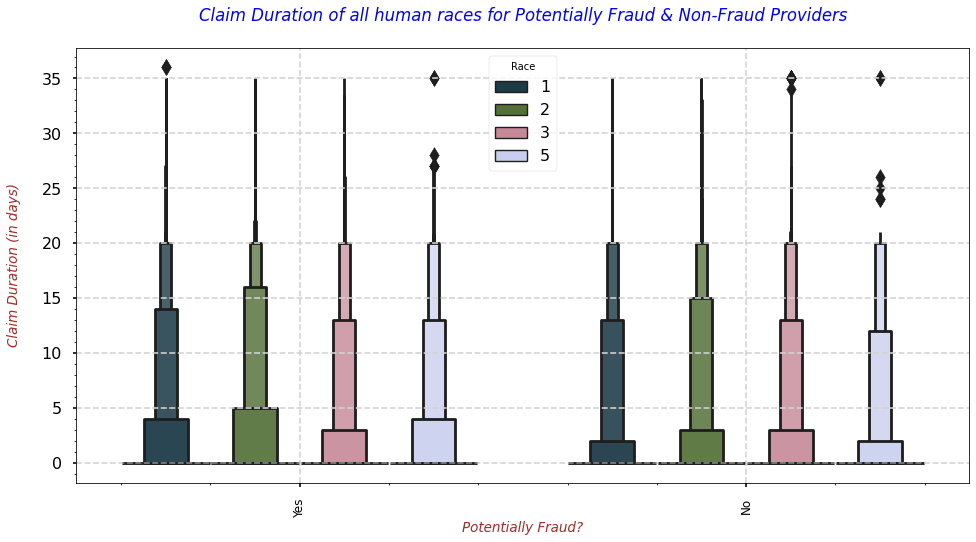

In [288]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='Claim_Duration', hue='Race', palette='cubehelix')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Duration of all human races for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc='upper center',title='Race');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Duration of all human races for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Duration might not be useful in segregating the Fraud cases.

- **Relationship b/w `Claim_Duration` and `Potentially Fraud` for `RenalDiseaseIndicator`**

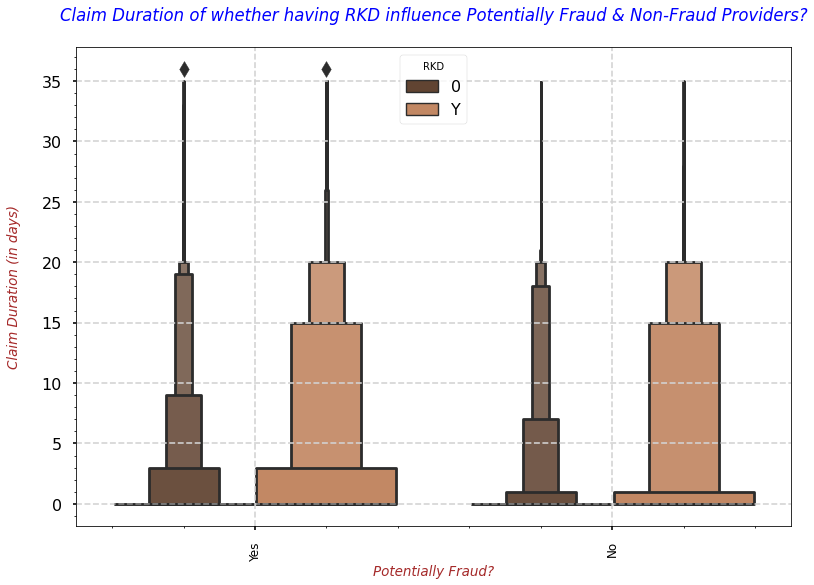

In [289]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='Claim_Duration', hue='RenalDiseaseIndicator', palette='copper')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Duration of whether having RKD influence Potentially Fraud & Non-Fraud Providers?\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title='RKD');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Duration of patients with or w/o RKD for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Duration might not be useful in segregating the Fraud cases.

### **Adding `New Feature` :: `Admitted_Duration`**

    - Admitted Duration = Discharge Date - Admission Date

In [290]:
train_iobp_df['AdmissionDt'] = pd.to_datetime(train_iobp_df['AdmissionDt'], format="%Y-%m-%d")
train_iobp_df['DischargeDt'] = pd.to_datetime(train_iobp_df['DischargeDt'], format="%Y-%m-%d")

train_iobp_df['Admitted_Duration'] = (train_iobp_df['DischargeDt'] - train_iobp_df['AdmissionDt']).dt.days

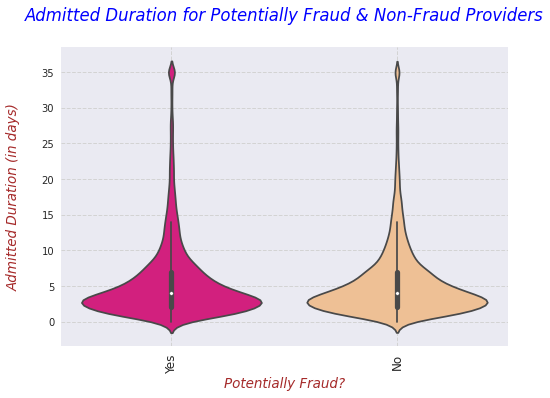

In [291]:
with plt.style.context('seaborn'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Admitted_Duration', palette='Accent_r')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Admitted Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Admitted Duration for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Admit Duration for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Admit Duration alone might not be useful in segregating the Fraud cases.

- **Relationship b/w `Admit_Duration` and `Potentially Fraud` for both the `Genders`**

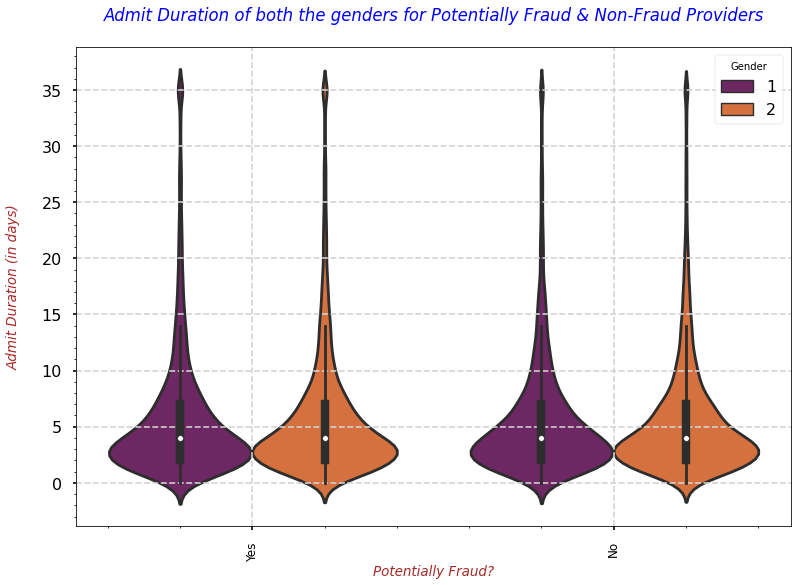

In [292]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Admitted_Duration', hue='Gender', palette='inferno')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Admit Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Admit Duration of both the genders for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Admit Duration of males and females for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Admit Duration might not be useful in segregating the Fraud cases.

- **Relationship b/w `Admitted_Duration` and `Potentially Fraud` for `Is_Alive?`**

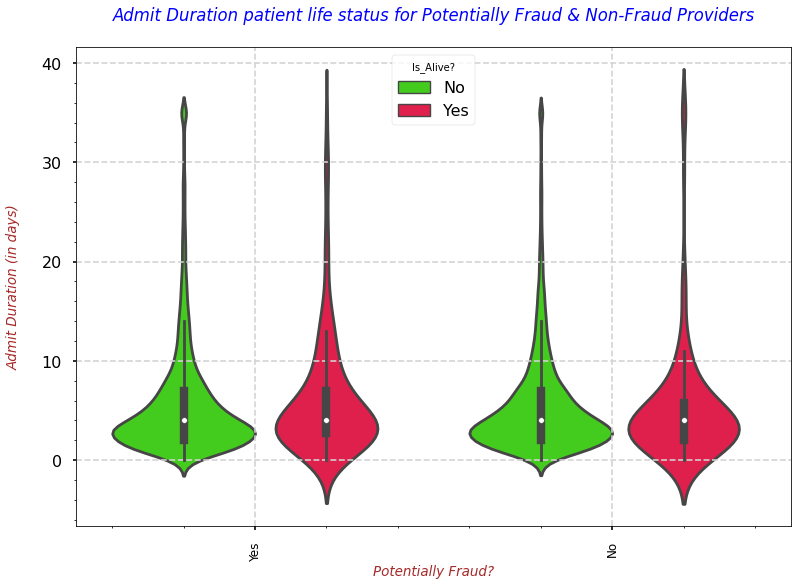

In [293]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Admitted_Duration', hue='Is_Alive?', palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Admit Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Admit Duration patient life status for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title='Is_Alive?');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Admit Duration on patient life status for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Admit Duration might not be useful in segregating the Fraud cases.

- **Relationship b/w `Admit_Duration` and `Potentially Fraud` for all `Human Races`**

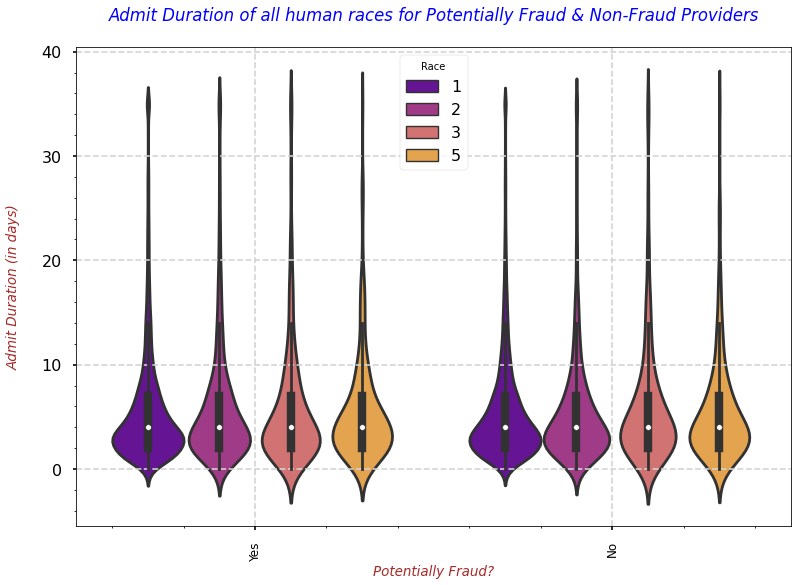

In [294]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Admitted_Duration', hue='Race', palette='plasma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Admit Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Admit Duration of all human races for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title="Race");

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Admit Duration of all human races for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Admit Duration might not be useful in segregating the Fraud cases.

- **Relationship b/w `Admitted_Duration` and `Potentially Fraud` for `RenalDiseaseIndicator`**

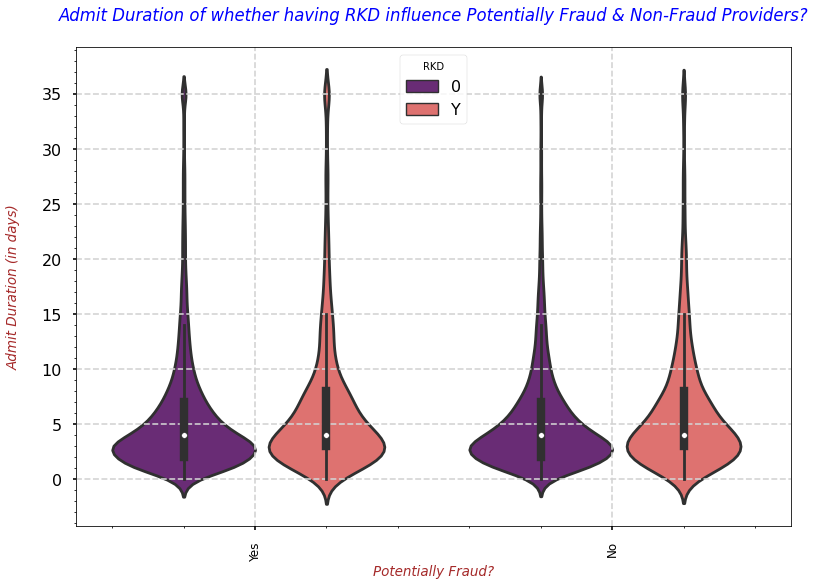

In [295]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Admitted_Duration', hue='RenalDiseaseIndicator',palette='magma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Admit Duration (in days)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Admit Duration of whether having RKD influence Potentially Fraud & Non-Fraud Providers?\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title="RKD");

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Admit Duration of patients with or w/o RKD for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Admit Duration might not be useful in segregating the Fraud cases.

### **Adding `New Feature` :: `Bene_Age`**

    - Bene Age = DOD - DOB (if DOD is Null then replace it with MAX date in DOD)

In [296]:
# Filling the Null values as MAX Date of Death in the Dataset
train_iobp_df['DOD'].fillna(value=train_iobp_df['DOD'].max(), inplace=True)

In [297]:
train_iobp_df['Bene_Age'] = round(((train_iobp_df['DOD'] - train_iobp_df['DOB']).dt.days)/365,1)

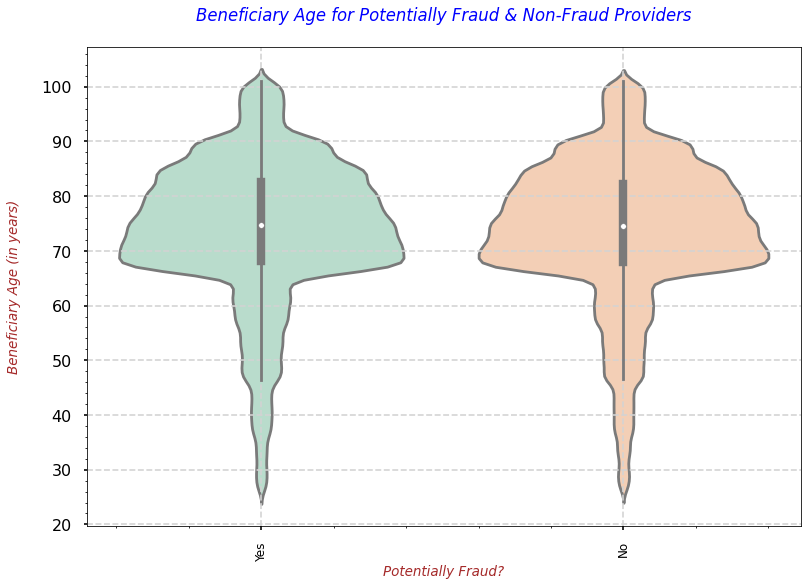

In [298]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Bene_Age', palette='Pastel2')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Beneficiary Age (in years)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Beneficiary Age for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Beneficiary Age for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Beneficiary Age alone might not be useful in segregating the Fraud cases.

- **Relationship b/w `Bene_Age` and `Potentially Fraud` for both the `Genders`**

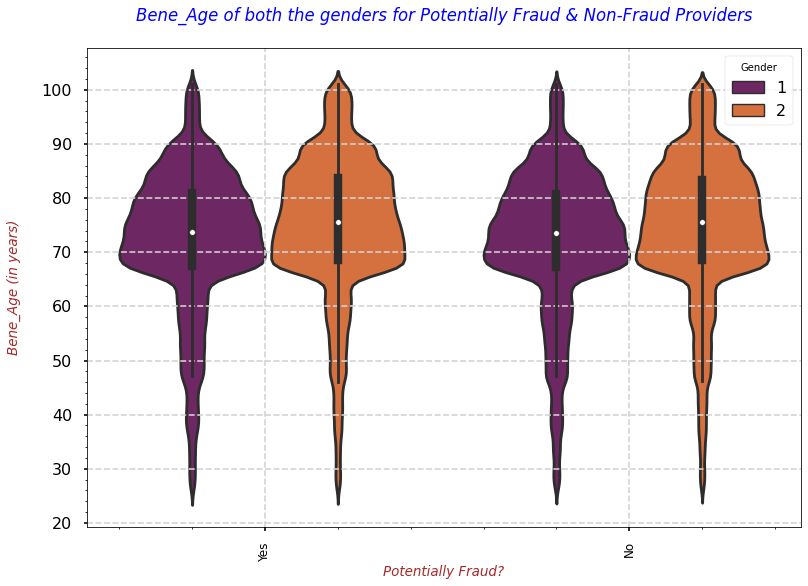

In [299]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Bene_Age', hue='Gender', palette='inferno')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Bene_Age (in years)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Bene_Age of both the genders for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Bene_Age of males and females for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Bene_Age might not be useful in segregating the Fraud cases.

- **Relationship b/w `Bene_Age` and `Potentially Fraud` for `Is_Alive?`**

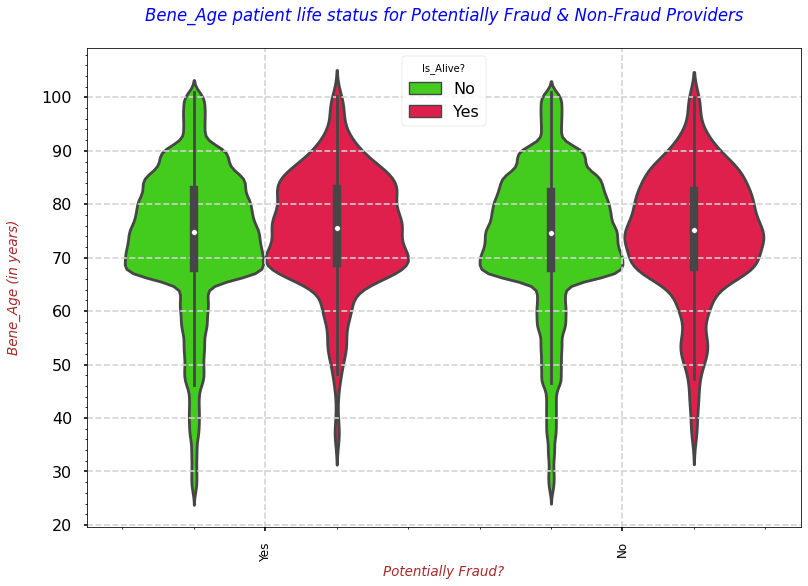

In [300]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Bene_Age', hue='Is_Alive?', palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Bene_Age (in years)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Bene_Age patient life status for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title='Is_Alive?');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Bene_Age on patient life status for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Bene_Age might not be useful in segregating the Fraud cases.

- **Relationship b/w `Bene_Age` and `Potentially Fraud` for all `Human Races`**

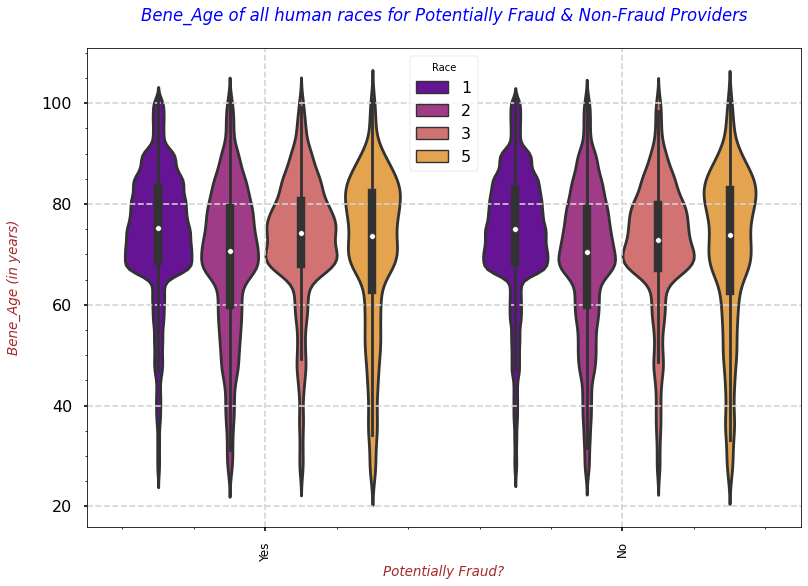

In [301]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Bene_Age', hue='Race', palette='plasma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Bene_Age (in years)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Bene_Age of all human races for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title="Race");

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Bene_Age of all human races for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Bene_Age might not be useful in segregating the Fraud cases.

- **Relationship b/w `Bene_Age` and `Potentially Fraud` for `RenalDiseaseIndicator`**

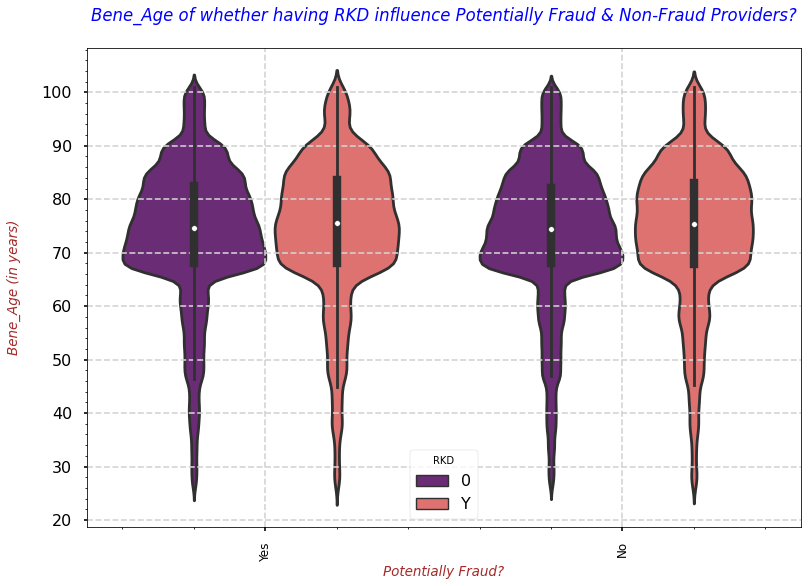

In [302]:
with plt.style.context('seaborn-poster'):
    fig = sns.violinplot(data=train_iobp_df, x='PotentialFraud',y='Bene_Age', hue='RenalDiseaseIndicator',palette='magma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Bene_Age (in years)\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Bene_Age of whether having RKD influence Potentially Fraud & Non-Fraud Providers?\n", fontdict=title_font_dict)
    plt.legend(loc='lower center', title='RKD');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Bene_Age of patients with or w/o RKD for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Bene_Age might not be useful in segregating the Fraud cases.

### **Does `InscClaimAmtReimbursed` influences `Potentially Fraud`?**
   - **Relationship b/w `InscClaimAmtReimbursed` and `Potentially Fraud`**

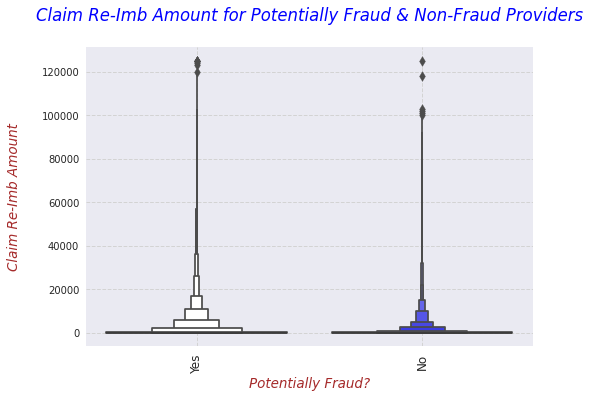

In [303]:
with plt.style.context('seaborn'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='InscClaimAmtReimbursed', palette='flag')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Re-Imb Amount for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Re-Imb Amount for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Re-Imb Amount alone might not be useful in segregating the Fraud cases.

- **Relationship b/w `InscClaimAmtReimbursed` and `Potentially Fraud` for both the `Genders`**

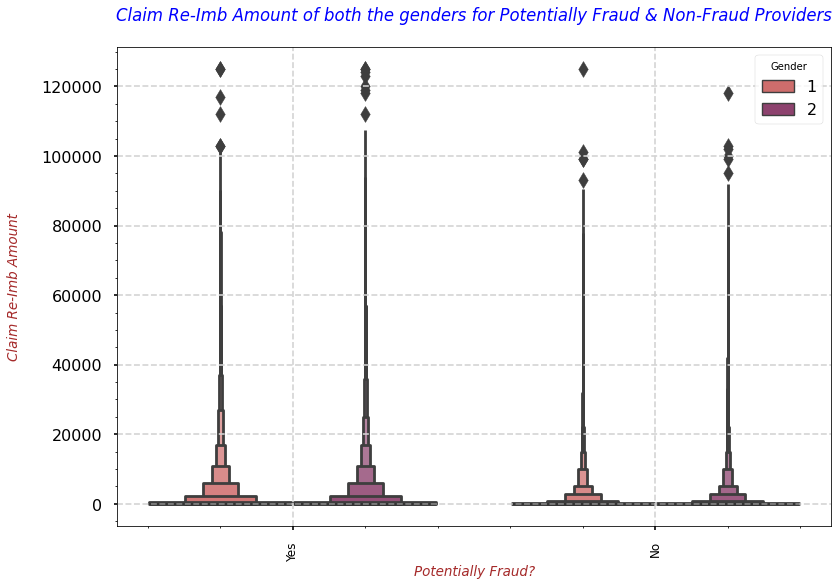

In [304]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='InscClaimAmtReimbursed', hue='Gender', palette='flare')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Re-Imb Amount of both the genders for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Re-Imb Amount of males and females for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `InscClaimAmtReimbursed` and `Potentially Fraud` for `Is_Alive?`**

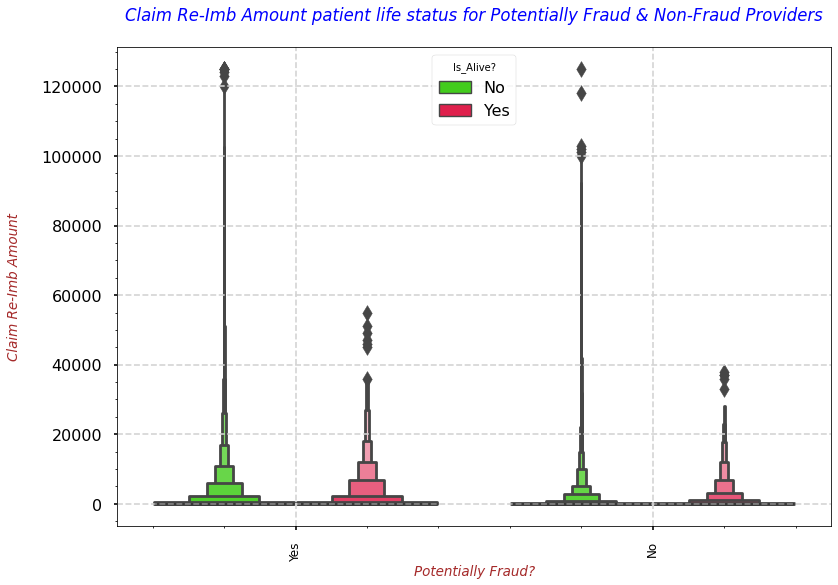

In [305]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='InscClaimAmtReimbursed', hue='Is_Alive?', palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Re-Imb Amount patient life status for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title='Is_Alive?');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Re-Imb Amount on patient life status for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `InscClaimAmtReimbursed` and `Potentially Fraud` for all `Human Races`**

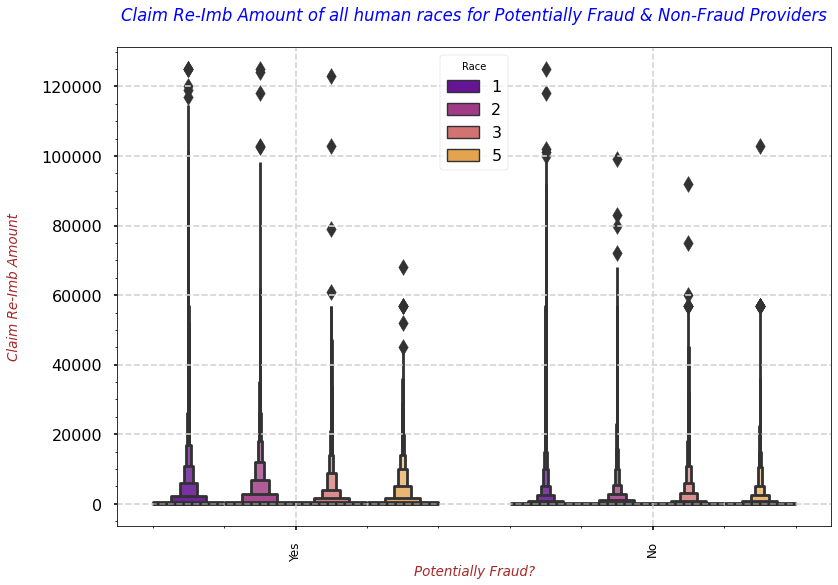

In [306]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='InscClaimAmtReimbursed', hue='Race', palette='plasma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Re-Imb Amount of all human races for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title="Race");

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Re-Imb Amount of all human races for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Claim Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `InscClaimAmtReimbursed` and `Potentially Fraud` for `RenalDiseaseIndicator`**

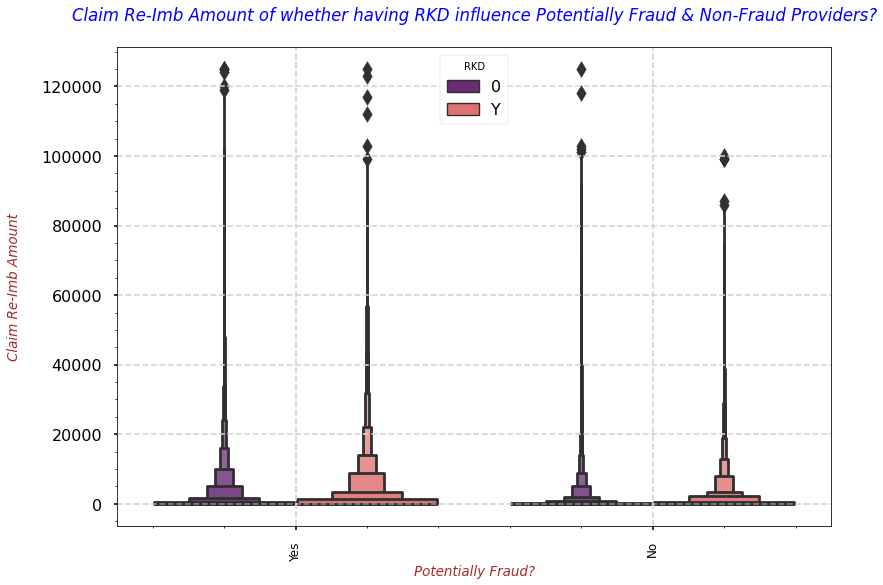

In [307]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df, x='PotentialFraud',y='InscClaimAmtReimbursed', hue='RenalDiseaseIndicator',palette='magma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Claim Re-Imb Amount of whether having RKD influence Potentially Fraud & Non-Fraud Providers?\n", fontdict=title_font_dict)
    plt.legend(loc='upper center', title='RKD');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Claim Re-Imb Amount of patients with or w/o RKD for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that claim Re-Imb Amount might not be useful in segregating the Fraud cases.

### **Does `IPAnnualReimbursementAmt` influences `Potentially Fraud`?**
   - **Relationship b/w `IPAnnualReimbursementAmt` and `Potentially Fraud`**

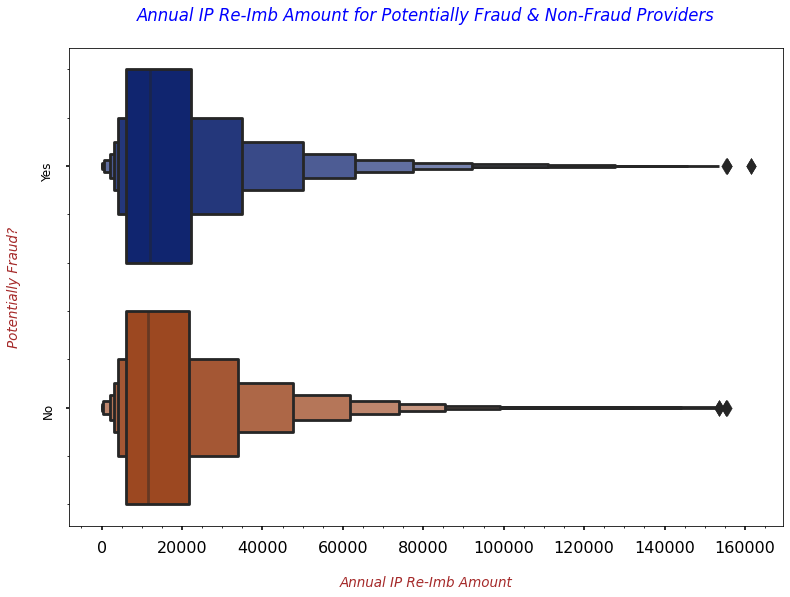

In [308]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 1], y='PotentialFraud',x='IPAnnualReimbursementAmt', 
                         palette='dark', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.yticks(rotation=90, fontsize=12)
    plt.xlabel("\nAnnual IP Re-Imb Amount", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Annual IP Re-Imb Amount for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual IP Re-Imb Amount for Potentially Fraud and Non-Fraud Providers.
    * And, it looks like a Pareto Distribution.

#### **Why do we have `IP Annual Re-Imb Amount` as `0` for `Admitted Patients`?**

In [309]:
print(pd.DataFrame(train_iobp_df[(train_iobp_df['IPAnnualReimbursementAmt'] == 0)]['Admitted?'].value_counts()))

   Admitted?
0     371263
1        413


- So, we have 413 claims where Patients were admitted to the hospital but the allocated `IP Annual Re-Imb Amt` is 0.

In [310]:
print(pd.DataFrame(train_iobp_df[(train_iobp_df['IPAnnualReimbursementAmt'] == 0) & (train_iobp_df['Admitted?'] == 1)]\
                   ['PotentialFraud'].value_counts()))

     PotentialFraud
Yes             249
No              164


- So, out 413 claims 60% of them means 249 are fraudulent whereas 164 are non-fraudulent.

**`OBSERVATION`**

- **Thus, we can say that if the IP Annual Amount is 0 and patient was admitted to the hospital then chances of being fraudulent are high.**

- **Relationship b/w `IPAnnualReimbursementAmt` and `Potentially Fraud` for both the `Genders`**

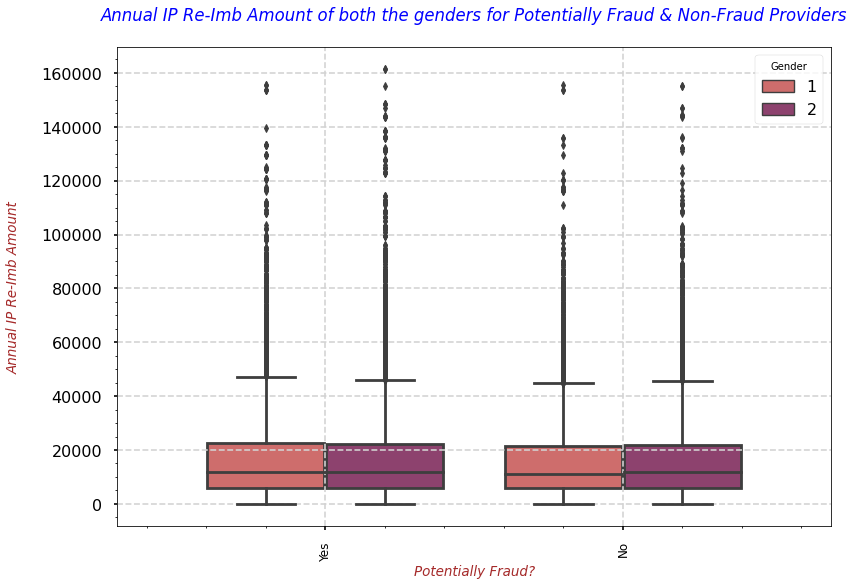

In [311]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 1], x='PotentialFraud',y='IPAnnualReimbursementAmt', hue='Gender',
                      palette='flare')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual IP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual IP Re-Imb Amount of both the genders for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual IP Re-Imb Amount of males and females for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual IP Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `IPAnnualReimbursementAmt` and `Potentially Fraud` for `Is_Alive?`**

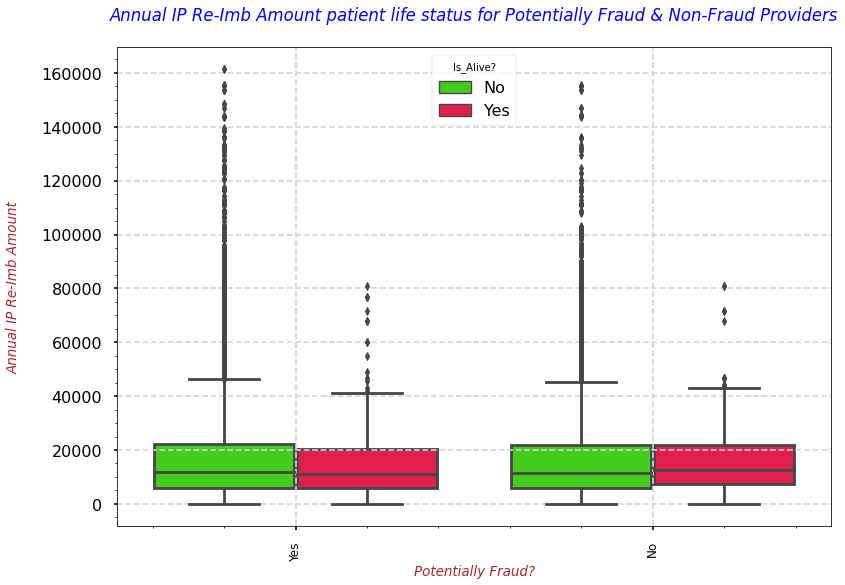

In [312]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 1], x='PotentialFraud',y='IPAnnualReimbursementAmt', hue='Is_Alive?',
                      palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual IP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual IP Re-Imb Amount patient life status for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title='Is_Alive?');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual IP Re-Imb Amount on patient life status for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual IP Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `IPAnnualReimbursementAmt` and `Potentially Fraud` for all `Human Races`**

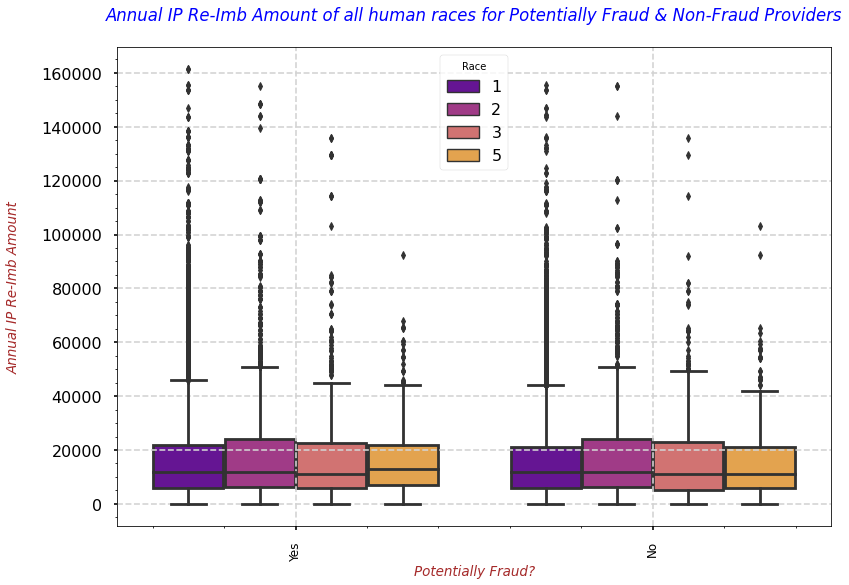

In [313]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 1], x='PotentialFraud',y='IPAnnualReimbursementAmt', hue='Race',
                      palette='plasma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual IP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual IP Re-Imb Amount of all human races for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title="Race");

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual IP Re-Imb Amount of all human races for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual IP Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `IPAnnualReimbursementAmt` and `Potentially Fraud` for `RenalDiseaseIndicator`**

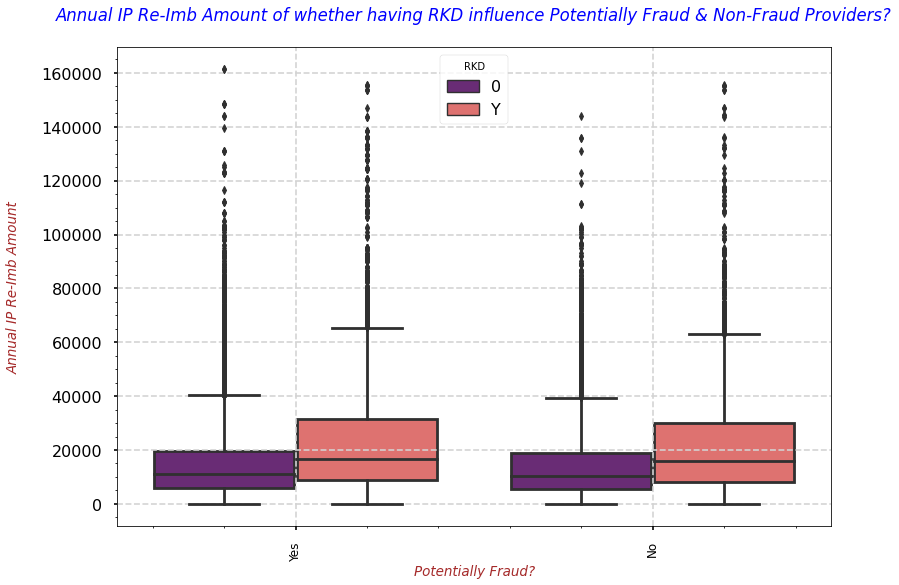

In [314]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 1], x='PotentialFraud',y='IPAnnualReimbursementAmt', 
                      hue='RenalDiseaseIndicator',palette='magma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual IP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual IP Re-Imb Amount of whether having RKD influence Potentially Fraud & Non-Fraud Providers?\n", fontdict=title_font_dict)
    plt.legend(loc='upper center', title='RKD');

**`OBSERVATION`**
* The above plot clearly shows us that there is a very slight difference in the distribution of Annual IP Re-Imb Amount of patients with or w/o RKD for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual IP Re-Imb Amount might not be useful in segregating the Fraud cases.

### **Does `OPAnnualReimbursementAmt` influences `Potentially Fraud`?**
   - **Relationship b/w `OPAnnualReimbursementAmt` and `Potentially Fraud`**

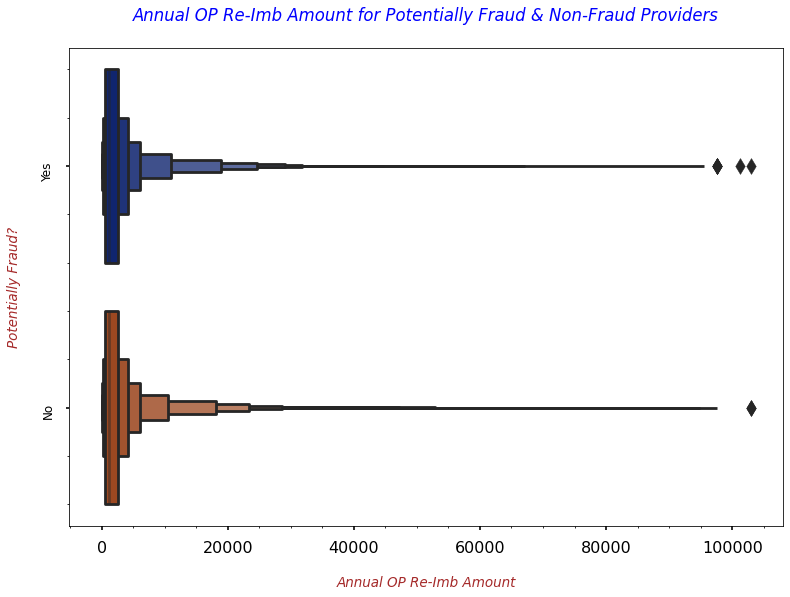

In [315]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxenplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 0], y='PotentialFraud', x='OPAnnualReimbursementAmt', 
                         palette='dark', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.yticks(rotation=90, fontsize=12)
    plt.xlabel("\nAnnual OP Re-Imb Amount", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Annual OP Re-Imb Amount for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual OP Re-Imb Amount for Potentially Fraud and Non-Fraud Providers.
    * And, it looks like a Pareto Distribution.

#### **Why do we have `OP Annual Re-Imb Amount` as `0` for `Admitted Patients`?**

In [316]:
print(pd.DataFrame(train_iobp_df[(train_iobp_df['OPAnnualReimbursementAmt'] == 0)]['Admitted?'].value_counts()))

   Admitted?
1       3909
0       1009


- So, we have 1009 claims where Patients were not admitted to the hospital but the allocated `OP Annual Re-Imb Amt` is 0.

In [317]:
print(pd.DataFrame(train_iobp_df[(train_iobp_df['OPAnnualReimbursementAmt'] == 0) & (train_iobp_df['Admitted?'] == 0)]\
                   ['PotentialFraud'].value_counts()))

     PotentialFraud
No              617
Yes             392


- So, out 1009 claims 38% of them means 392 are fraudulent whereas 62% or 617 are non-fraudulent.

**`OBSERVATION`**

- **Thus, we can say that if the OP Annual Amount is 0 and patient was not admitted to the hospital then chances of being fraudulent are less.**

- **Relationship b/w `OPAnnualReimbursementAmt` and `Potentially Fraud` for both the `Genders`**

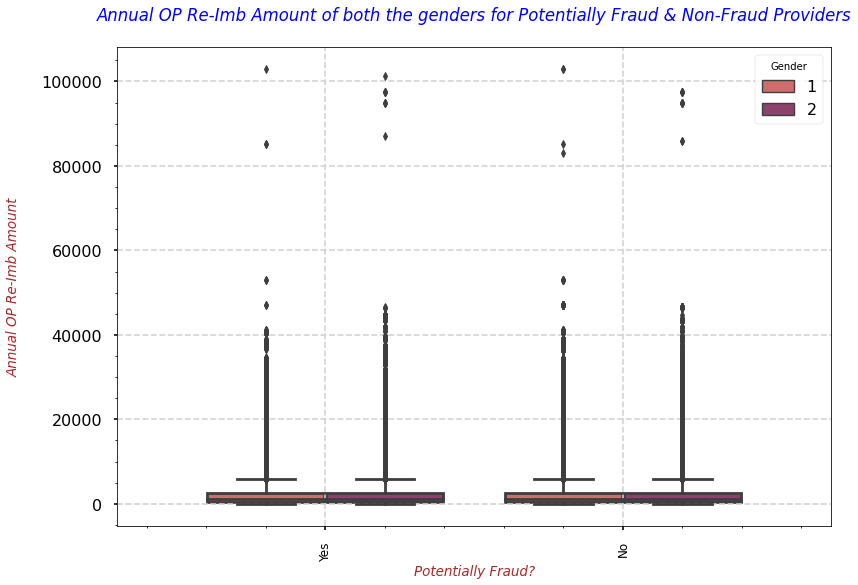

In [318]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 0], x='PotentialFraud',y='OPAnnualReimbursementAmt', hue='Gender',
                      palette='flare')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual OP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual OP Re-Imb Amount of both the genders for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual OP Re-Imb Amount of males and females for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual OP Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `OPAnnualReimbursementAmt` and `Potentially Fraud` for `Is_Alive?`**

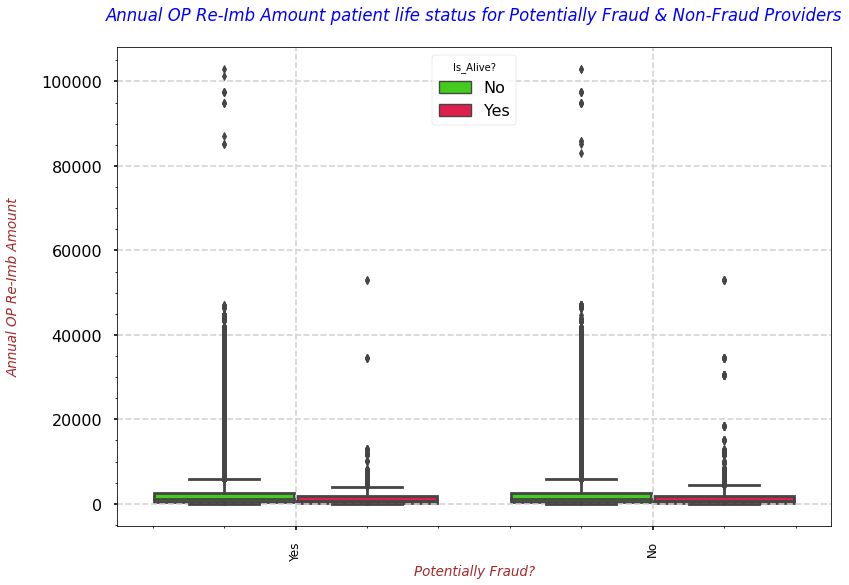

In [319]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 0], x='PotentialFraud',y='OPAnnualReimbursementAmt', hue='Is_Alive?',
                      palette='prism')      
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual OP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual OP Re-Imb Amount patient life status for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title='Is_Alive?');

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual OP Re-Imb Amount on patient life status for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual OP Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `OPAnnualReimbursementAmt` and `Potentially Fraud` for all `Human Races`**

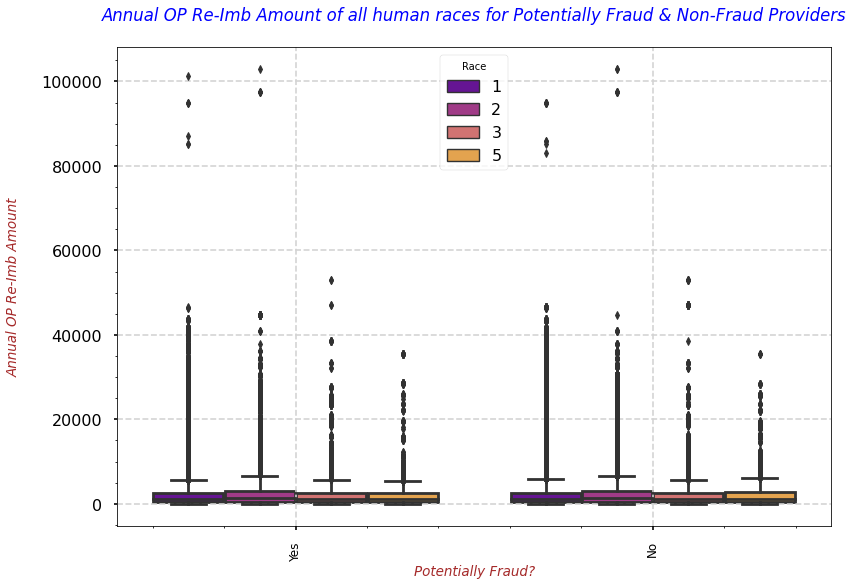

In [320]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 0], x='PotentialFraud',y='OPAnnualReimbursementAmt', hue='Race',
                      palette='plasma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual OP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual OP Re-Imb Amount of all human races for Potentially Fraud & Non-Fraud Providers\n", fontdict=title_font_dict)
    plt.legend(loc="upper center", title="Race");

**`OBSERVATION`**
* The above plot clearly shows us that there is no difference in the distribution of Annual OP Re-Imb Amount of all human races for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual OP Re-Imb Amount might not be useful in segregating the Fraud cases.

- **Relationship b/w `OPAnnualReimbursementAmt` and `Potentially Fraud` for `RenalDiseaseIndicator`**

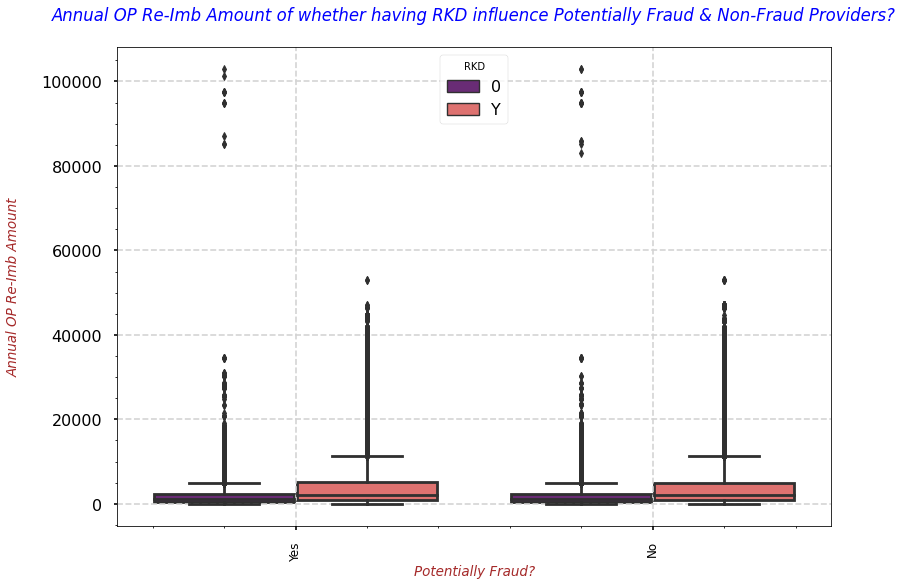

In [321]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df[train_iobp_df['Admitted?'] == 0], x='PotentialFraud',y='OPAnnualReimbursementAmt', 
                      hue='RenalDiseaseIndicator',palette='magma')   
    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Annual OP Re-Imb Amount\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Annual OP Re-Imb Amount of whether having RKD influence Potentially Fraud & Non-Fraud Providers?\n", fontdict=title_font_dict)
    plt.legend(loc='upper center', title='RKD');

**`OBSERVATION`**
* The above plot clearly shows us that there is a very slight difference in the distribution of Annual OP Re-Imb Amount of patients with or w/o RKD for Potentially Fraud and Non-Fraud Providers.
    * Therefore, we can say that Annual OP Re-Imb Amount might not be useful in segregating the Fraud cases.

### **Adding `New Feature` :: `Total Number of false claims filed by a Provider`**

    - Logic :: COUNT(all claims submitted by a Provider) - COUNT(all non-fraud claims submitted by a Provider)

**`REASONING`**

- The idea behind adding this feature is to introduce a way by which we can see how many fraud or non fraud claims been submitted by a provider.

- _Generally what has been observed in medicare frauds is that many small hospitals from rural places had been intentionally used for filing the false claims by giving them bribes or in desire of kickbacks. Thus, for such providers total claims submitted will be less but majority of them will be false._

- ***But, the problem in the given dataset after joining(IP, OP, BENE with PRV TGT) is that***

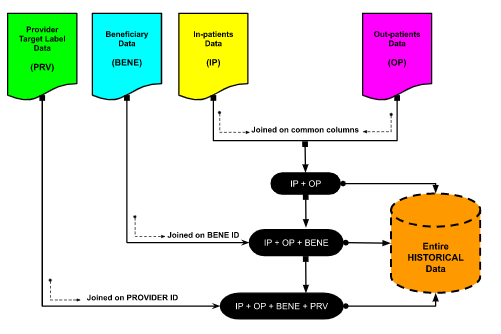

In [322]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Joining Datasets.png")

- ***if a provider was FRAUD then all the claims associated to it will be marked as FRAUD which I believe is wrong and doesn't provide any useful information.***

### **Adding `New Feature` :: `Total Number of claims or cases seen by Attending Physician`**

In [323]:
# Total unique number of Attended Physicians
print("Unique number of Attending Physicians present in the dataset are --> {}".format(train_iobp_df['AttendingPhysician'].nunique()))

Unique number of Attending Physicians present in the dataset are --> 82063


In [324]:
train_iobp_df['Att_Phy_tot_claims'] = train_iobp_df.groupby(['AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df['Att_Phy_tot_claims'].describe()

count    556703.000000
mean        138.634829
std         293.669039
min           1.000000
25%           7.000000
50%          33.000000
75%         116.000000
max        2534.000000
Name: Att_Phy_tot_claims, dtype: float64

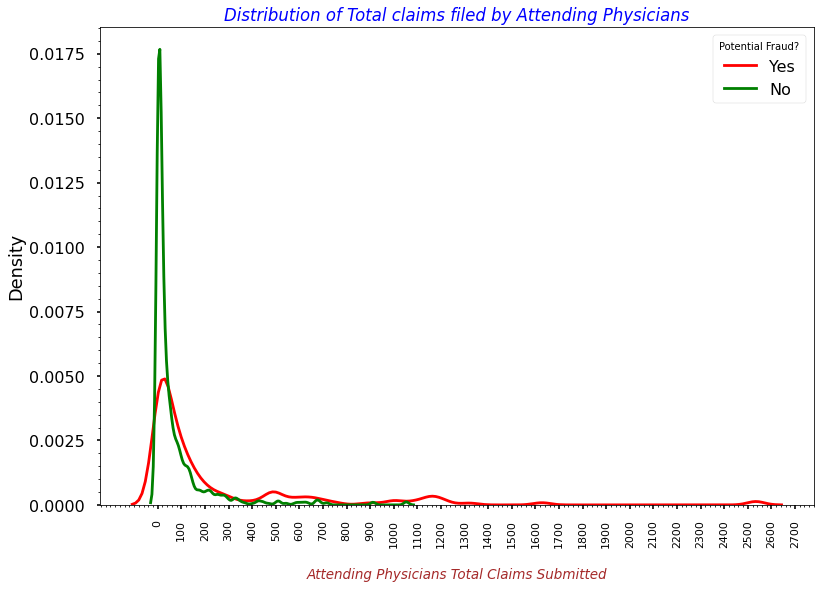

In [325]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Att_Phy_tot_claims'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Att_Phy_tot_claims'],color='green')
    # Providing the labels and title to the graph
    plt.xlabel("\nAttending Physicians Total Claims Submitted", fontdict=label_font_dict)
    plt.xticks(np.arange(0,2800,100), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Total claims filed by Attending Physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

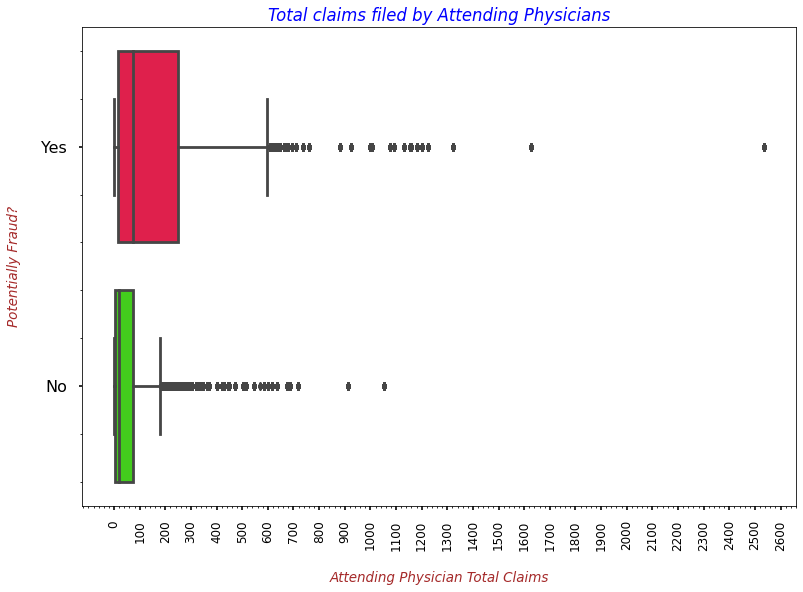

In [326]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Att_Phy_tot_claims', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,2800,100), rotation=90, fontsize=12)
    plt.xlabel("\nAttending Physician Total Claims", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Total claims filed by Attending Physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggests that the newly added feature `Att_Phy_tot_claims` may be useful in segregating the potentially fraud and non-fraudulent cases.
    * For example, we can say that if total claims filed by a Attending Physician is greater than 500 then chances of being fraudulent are high.

### **Adding `New Feature` :: `Total Number of claims or cases seen by Opearting Physician`**

In [327]:
# Total unique number of Operating Physicians
print("Unique number of Operating Physicians present in the dataset are --> {}".format(train_iobp_df['OperatingPhysician'].nunique()))

Unique number of Operating Physicians present in the dataset are --> 35315


In [328]:
train_iobp_df['Opr_Phy_tot_claims'] = train_iobp_df.groupby(['OperatingPhysician'])['ClaimID'].transform('count')
train_iobp_df['Opr_Phy_tot_claims'].describe()

count    114447.000000
mean         27.204811
std          52.687759
min           1.000000
25%           2.000000
50%           8.000000
75%          25.000000
max         424.000000
Name: Opr_Phy_tot_claims, dtype: float64

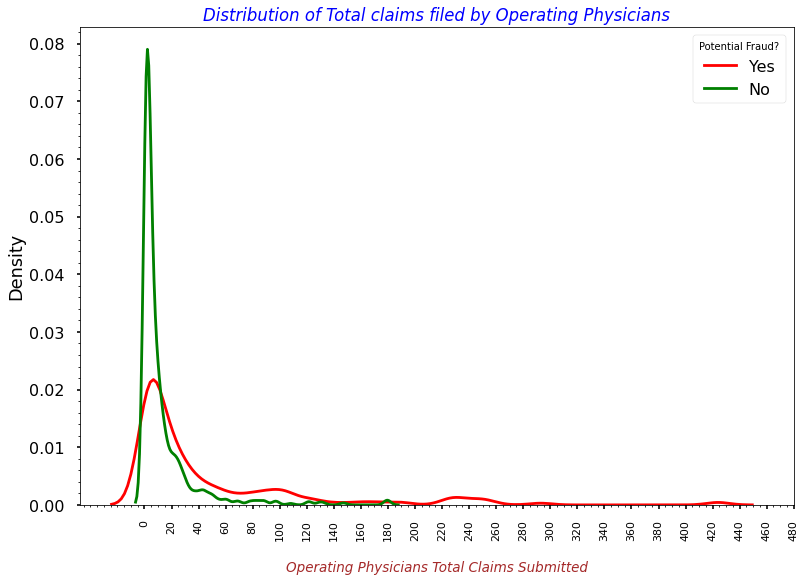

In [329]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Opr_Phy_tot_claims'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Opr_Phy_tot_claims'],color='green')
    # Providing the labels and title to the graph
    plt.xlabel("\nOperating Physicians Total Claims Submitted", fontdict=label_font_dict)
    plt.xticks(np.arange(0,500,20), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Total claims filed by Operating Physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

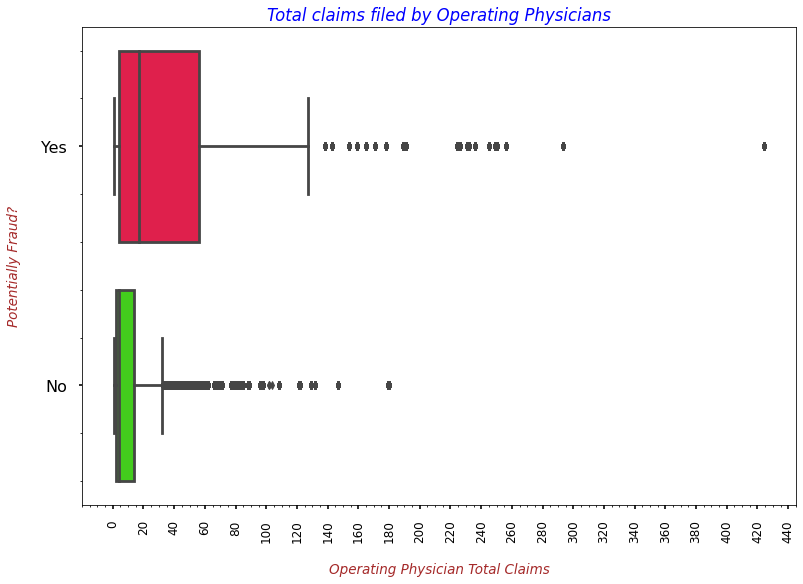

In [330]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Opr_Phy_tot_claims', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,500,20), rotation=90, fontsize=12)
    plt.xlabel("\nOperating Physician Total Claims", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Total claims filed by Operating Physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggests that the newly added feature `Opr_Phy_tot_claims` may be useful in segregating the potentially fraud and non-fraudulent cases.
    * Results are very similar to `Att_Phy_tot_claims`.
        * For example, we can say that if total claims filed by a Operating Physician are greater than 100 then chances of being fraudulent are high.

### **Adding `New Feature` :: `Total Number of claims or cases seen by Other Physician`**

In [331]:
# Total unique number of Other Physicians
print("Unique number of Other Physicians present in the dataset are --> {}".format(train_iobp_df['OtherPhysician'].nunique()))

Unique number of Other Physicians present in the dataset are --> 46457


In [332]:
train_iobp_df['Oth_Phy_tot_claims'] = train_iobp_df.groupby(['OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df['Oth_Phy_tot_claims'].describe()

count    199736.000000
mean         90.207914
std         208.017235
min           1.000000
25%           3.000000
50%          15.000000
75%          60.000000
max        1247.000000
Name: Oth_Phy_tot_claims, dtype: float64

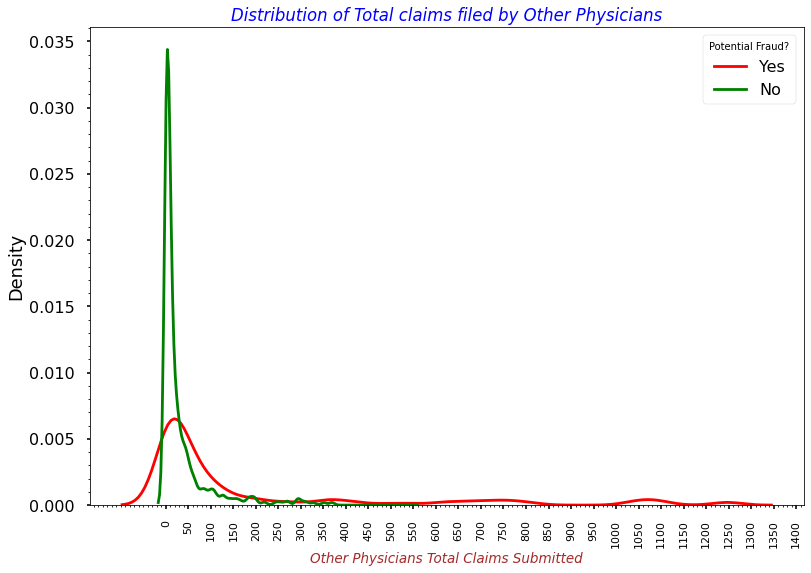

In [333]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Oth_Phy_tot_claims'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Oth_Phy_tot_claims'],color='green')
    # Providing the labels and title to the graph
    plt.xlabel("Other Physicians Total Claims Submitted", fontdict=label_font_dict)
    plt.xticks(np.arange(0,1450,50), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Total claims filed by Other Physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

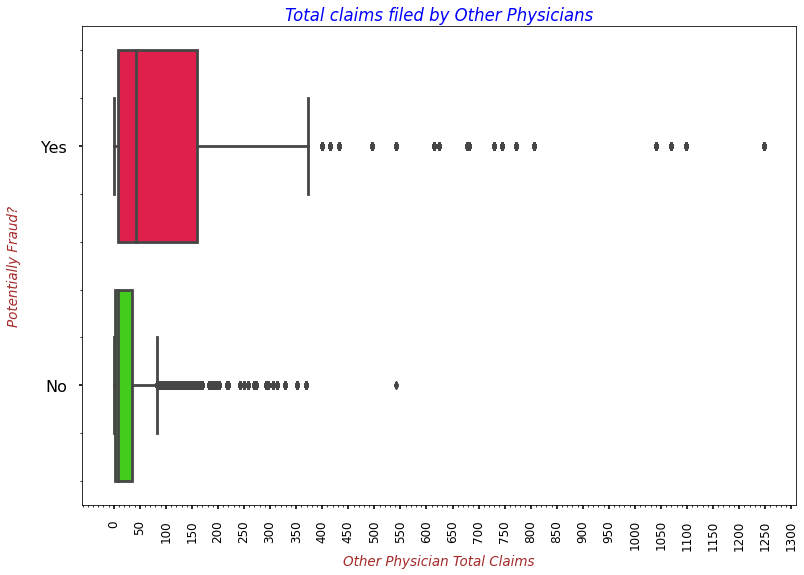

In [334]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Oth_Phy_tot_claims', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,1500,50), rotation=90, fontsize=12)
    plt.xlabel("Other Physician Total Claims", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Total claims filed by Other Physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggests that the newly added feature `Oth_Phy_tot_claims` may be useful in segregating the potentially fraud and non-fraudulent cases.
    * Results are very similar to `Att_Phy_tot_claims`.
        * For example, we can say that if total claims filed by a Other Physician are greater than 100 then chances of being fraudulent are high.

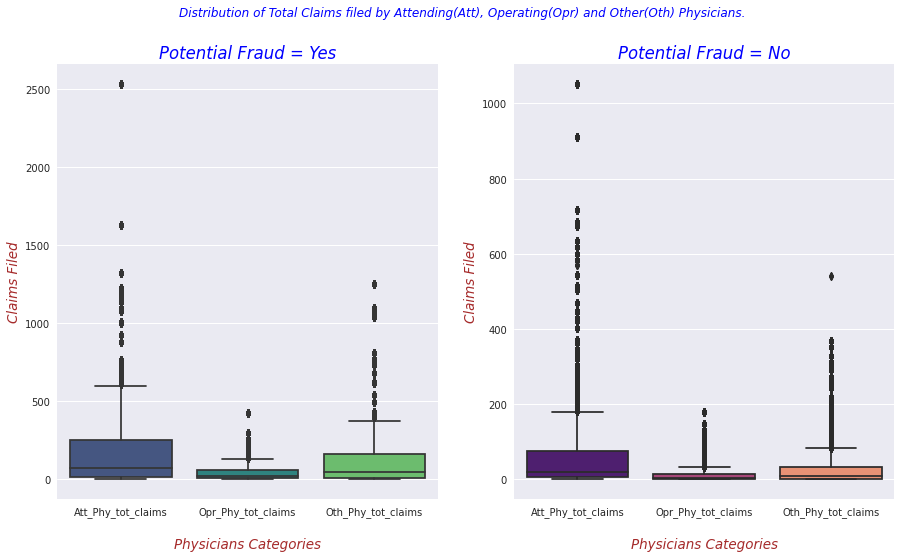

In [335]:
# Simultaneously viewing the plots for better understanding
with plt.style.context('seaborn'):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,8), sharey=False)
    sns.boxplot(data=train_iobp_df[train_iobp_df["PotentialFraud"] == 'Yes'][['Att_Phy_tot_claims','Opr_Phy_tot_claims','Oth_Phy_tot_claims']],
                ax=ax1, palette='viridis')
    ax1.set_title("Potential Fraud = Yes", fontdict=title_font_dict)
    ax1.set_xlabel("\nPhysicians Categories", fontdict=label_font_dict)
    ax1.set_ylabel("Claims Filed", fontdict=label_font_dict)
    
    sns.boxplot(data=train_iobp_df[train_iobp_df["PotentialFraud"] == 'No'][['Att_Phy_tot_claims','Opr_Phy_tot_claims','Oth_Phy_tot_claims']],
                ax=ax2, palette='magma')
    ax2.set_title("Potential Fraud = No", fontdict=title_font_dict)
    ax2.set_xlabel("\nPhysicians Categories", fontdict=label_font_dict)
    ax2.set_ylabel("Claims Filed", fontdict=label_font_dict)
    # Providing the title to the figure
    fig.suptitle("Distribution of Total Claims filed by Attending(Att), Operating(Opr) and Other(Oth) Physicians.\n", fontdict=title_font_dict)
    plt.minorticks_on()
    plt.plot();    

**`OBSERVATION`**
* The above Box plots suggests that theses newly added features may be slightly useful in segregating the potentially fraud and non-fraudulent cases.
    * As we can see that the total false claims filed by physicians are slightly more than the non-false claims filed by them.

### **Adding `Combined Feature` :: `Att_Opr_Oth_Phy_Tot_Claims`**
    
   * It represents the total claims submitted by Attending, Operating and Other Physicians.
       
       * **`Reasoning`** :: The idea behind adding this feature is to see whether a total of physicians claims submission will help in influencing the potential frauds.


   * **`Logic`** :: Att_Phy_tot_claims + Opr_Phy_tot_claims + Oth_Phy_tot_claims

In [336]:
train_iobp_df['Att_Phy_tot_claims'].fillna(value=0, inplace=True)
train_iobp_df['Opr_Phy_tot_claims'].fillna(value=0, inplace=True)
train_iobp_df['Oth_Phy_tot_claims'].fillna(value=0, inplace=True)

In [337]:
train_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'] = train_iobp_df['Att_Phy_tot_claims'] + train_iobp_df['Opr_Phy_tot_claims'] + train_iobp_df['Oth_Phy_tot_claims']

In [338]:
train_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'].describe()

count    558211.000000
mean        176.115666
std         379.833208
min           0.000000
25%           9.000000
50%          41.000000
75%         144.000000
max        3372.000000
Name: Att_Opr_Oth_Phy_Tot_Claims, dtype: float64

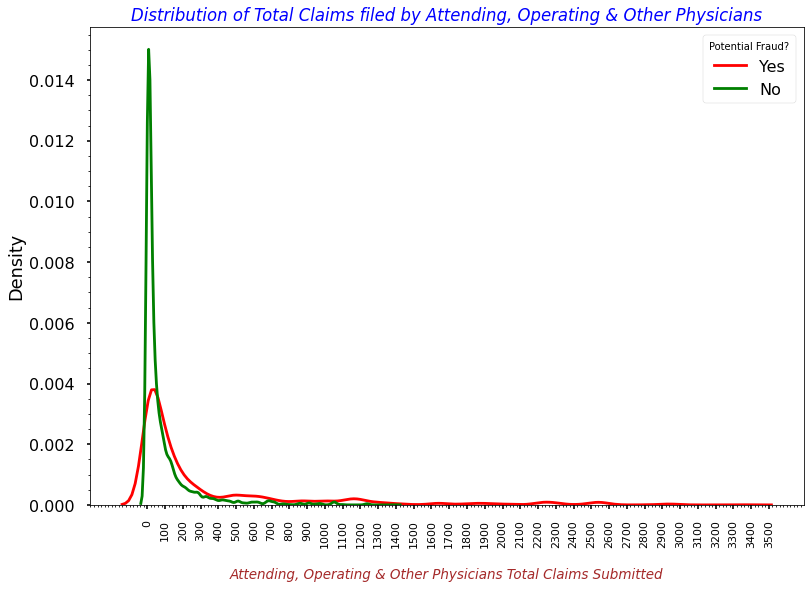

In [339]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Att_Opr_Oth_Phy_Tot_Claims'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Att_Opr_Oth_Phy_Tot_Claims'],color='green')
    # Providing the labels and title to the graph
    plt.xlabel("\nAttending, Operating & Other Physicians Total Claims Submitted", fontdict=label_font_dict)
    plt.xticks(np.arange(0,3600,100), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Total Claims filed by Attending, Operating & Other Physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

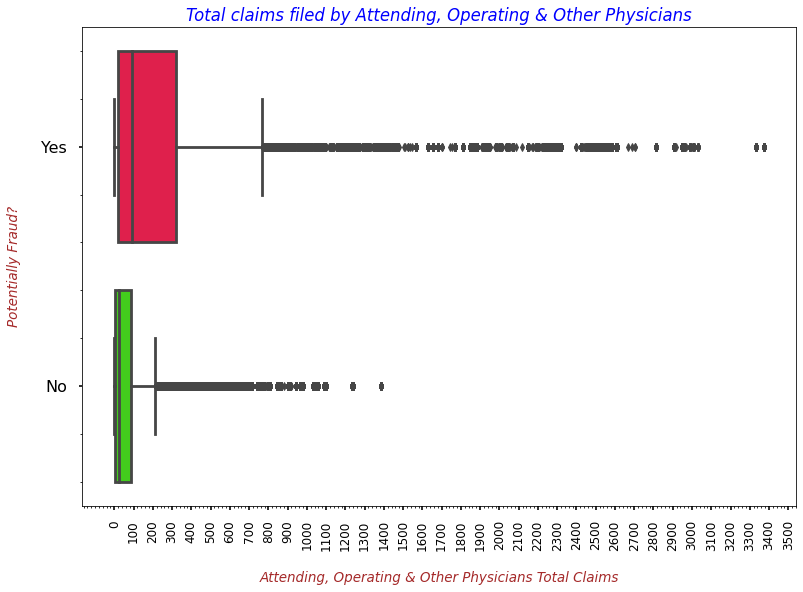

In [340]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Att_Opr_Oth_Phy_Tot_Claims', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,3600,100), rotation=90, fontsize=12)
    plt.xlabel("\nAttending, Operating & Other Physicians Total Claims", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Total claims filed by Attending, Operating & Other Physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above Box plots shows us the similar results like the previous features. And, there is a slight difference in the data distributions which may be useful in segregating the potential frauds.

### **Adding `3` `New Features` :: `Prv_Tot_Att_Phy`, `Prv_Tot_Opr_Phy` and `Prv_Tot_Oth_Phy`**
    
   * These features will represent the total Attending, Operating and Other Physicians for every provider.
       * **`Reasoning`** :: The idea behind adding this feature is to see if a provider has wroked with very less or very high number of physicians then does that increases or decreases the chances of potential fraud.

In [341]:
train_iobp_df["Prv_Tot_Att_Phy"] = train_iobp_df.groupby(['Provider'])['AttendingPhysician'].transform('count')
train_iobp_df["Prv_Tot_Opr_Phy"] = train_iobp_df.groupby(['Provider'])['OperatingPhysician'].transform('count')
train_iobp_df["Prv_Tot_Oth_Phy"] = train_iobp_df.groupby(['Provider'])['OtherPhysician'].transform('count')

In [342]:
# Nulls in the above features
train_iobp_df.isna().sum().tail(3)

Prv_Tot_Att_Phy    0
Prv_Tot_Opr_Phy    0
Prv_Tot_Oth_Phy    0
dtype: int64

In [343]:
train_iobp_df["Prv_Tot_Att_Phy"].describe()

count    558211.000000
mean        820.206469
std        1271.272090
min           1.000000
25%         122.000000
50%         359.000000
75%        1013.000000
max        8207.000000
Name: Prv_Tot_Att_Phy, dtype: float64

* The average number of attending physicians for providers are 820.

In [344]:
train_iobp_df["Prv_Tot_Opr_Phy"].describe()

count    558211.000000
mean        155.030023
std         228.266693
min           0.000000
25%          25.000000
50%          73.000000
75%         185.000000
max        1441.000000
Name: Prv_Tot_Opr_Phy, dtype: float64

* The average number of operating physicians for providers are 155.

In [345]:
train_iobp_df["Prv_Tot_Oth_Phy"].describe()

count    558211.000000
mean        306.781194
std         497.246984
min           0.000000
25%          37.000000
50%         120.000000
75%         381.000000
max        3209.000000
Name: Prv_Tot_Oth_Phy, dtype: float64

* The average number of other physicians for providers are 306.

* **Relationship b/w PROVIDER and ATTENDING PHYSICIAN**

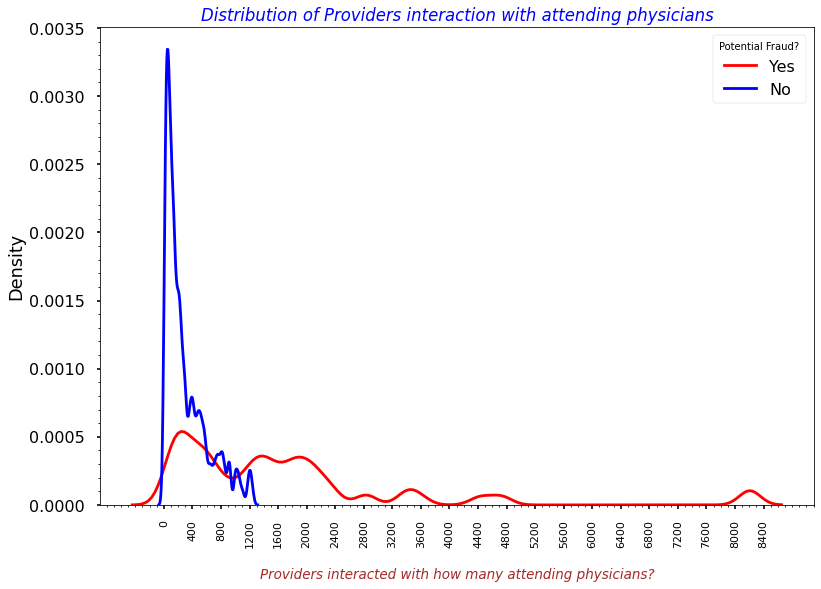

In [346]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Prv_Tot_Att_Phy'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Prv_Tot_Att_Phy'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders interacted with how many attending physicians?", fontdict=label_font_dict)
    plt.xticks(np.arange(0,8800,400), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with attending physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

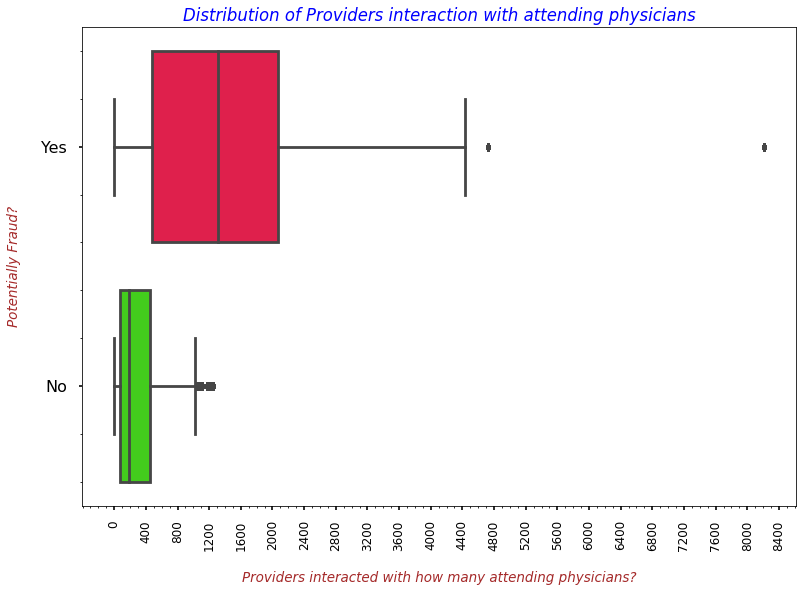

In [347]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Prv_Tot_Att_Phy', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,8800,400), rotation=90, fontsize=12)
    plt.xlabel("\nProviders interacted with how many attending physicians?", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with attending physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots are quite interesting as we can see that if `Prv_Tot_Att_Phy` is high then chances of fraud is quite high.

* **Relationship b/w PROVIDER and OPERATING PHYSICIAN**

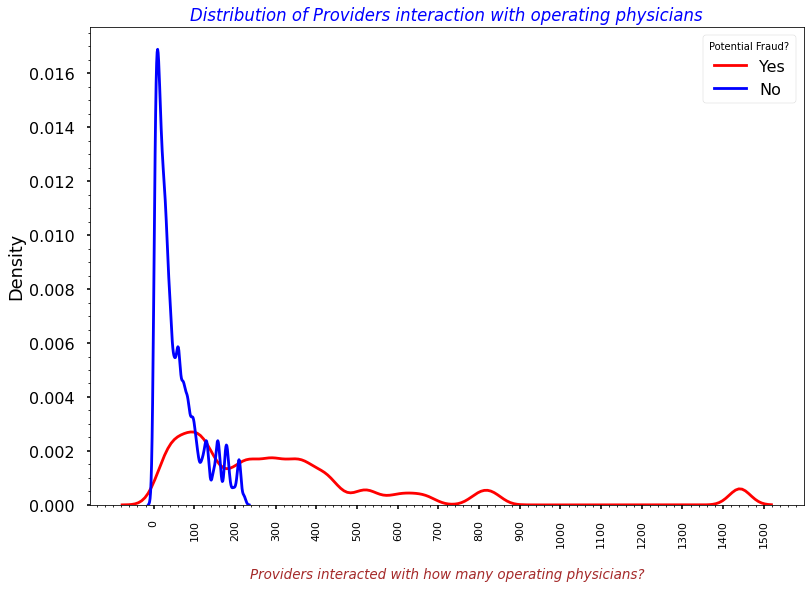

In [348]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Prv_Tot_Opr_Phy'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Prv_Tot_Opr_Phy'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders interacted with how many operating physicians?", fontdict=label_font_dict)
    plt.xticks(np.arange(0,1600,100), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with operating physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

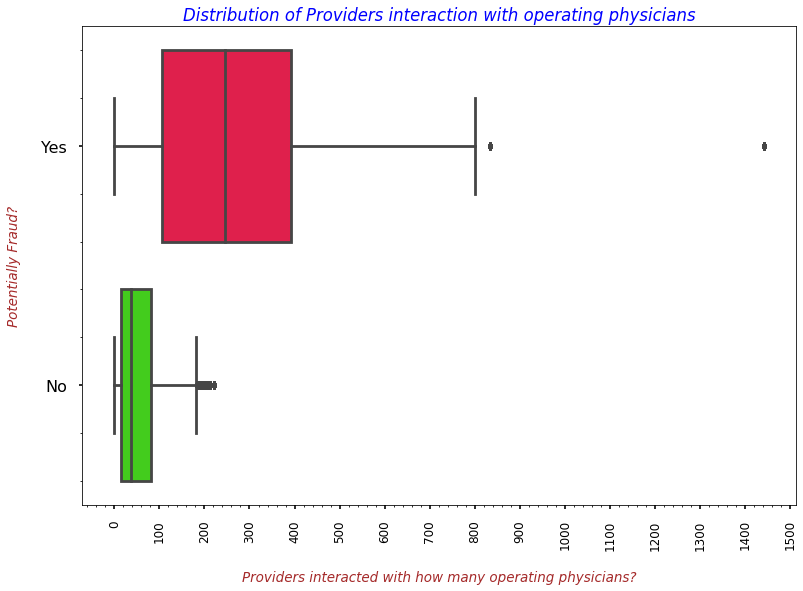

In [349]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Prv_Tot_Opr_Phy', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,1600,100), rotation=90, fontsize=12)
    plt.xlabel("\nProviders interacted with how many operating physicians?", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with operating physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots are quite interesting as we can see that if `Prv_Tot_Opr_Phy` is high then chances of fraud is quite high.

* **Relationship b/w PROVIDER and OTHER PHYSICIAN**

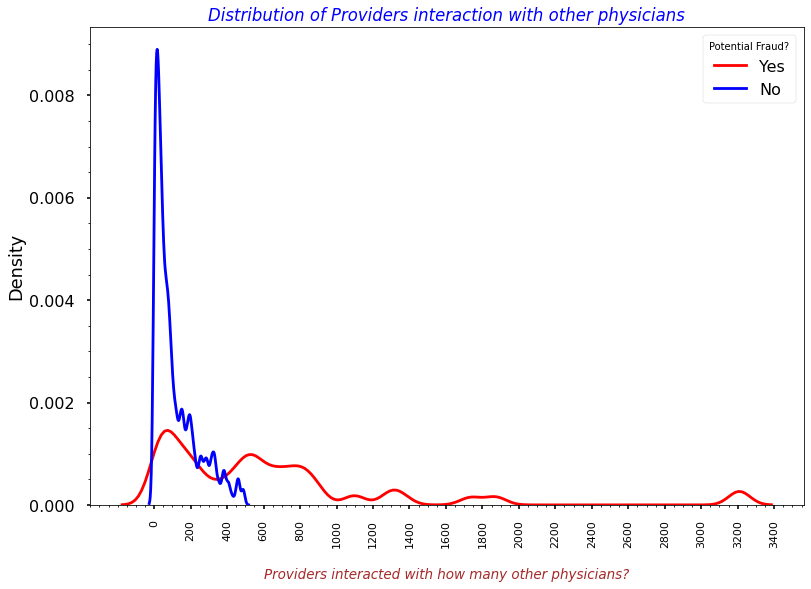

In [350]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Prv_Tot_Oth_Phy'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Prv_Tot_Oth_Phy'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders interacted with how many other physicians?", fontdict=label_font_dict)
    plt.xticks(np.arange(0,3600,200), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with other physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

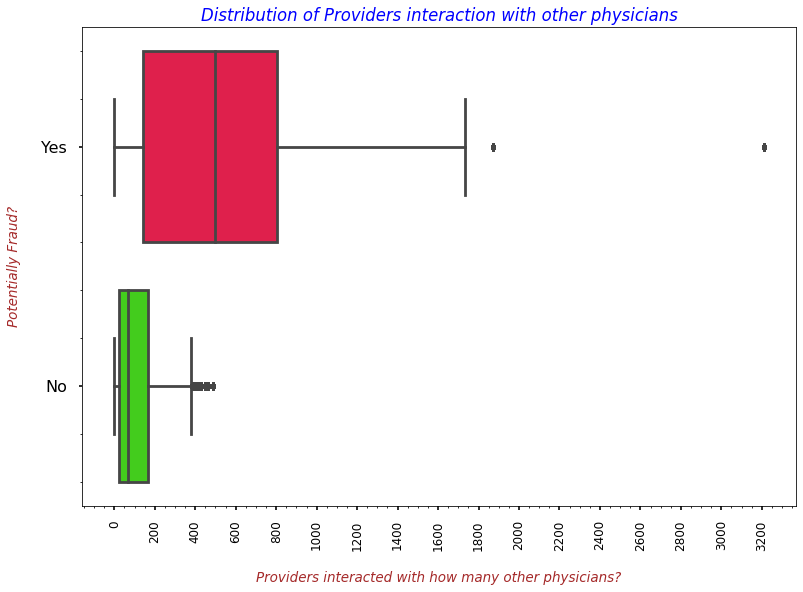

In [351]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Prv_Tot_Oth_Phy', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,3600,200), rotation=90, fontsize=12)
    plt.xlabel("\nProviders interacted with how many other physicians?", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with other physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots are quite interesting as we can see that if `Prv_Tot_Oth_Phy` is high then chances of fraud is quite high.

### **Adding `Combined Feature` :: `Prv_Tot_Att_Opr_Oth_Phys`**
    
   * It represents the total of all kind of physicians that a provider has interacted with.
       
       * **`Reasoning`** :: The idea behind adding this feature is to see whether a fraudulent provider interacts with higher or lower numberof of various physicians.


   * **`Logic`** :: Prv_Tot_Att_Phy + Prv_Tot_Opr_Phy + Prv_Tot_Oth_Phy

In [352]:
train_iobp_df['Prv_Tot_Att_Opr_Oth_Phys'] = train_iobp_df['Prv_Tot_Att_Phy'] + train_iobp_df['Prv_Tot_Opr_Phy'] + train_iobp_df['Prv_Tot_Oth_Phy']

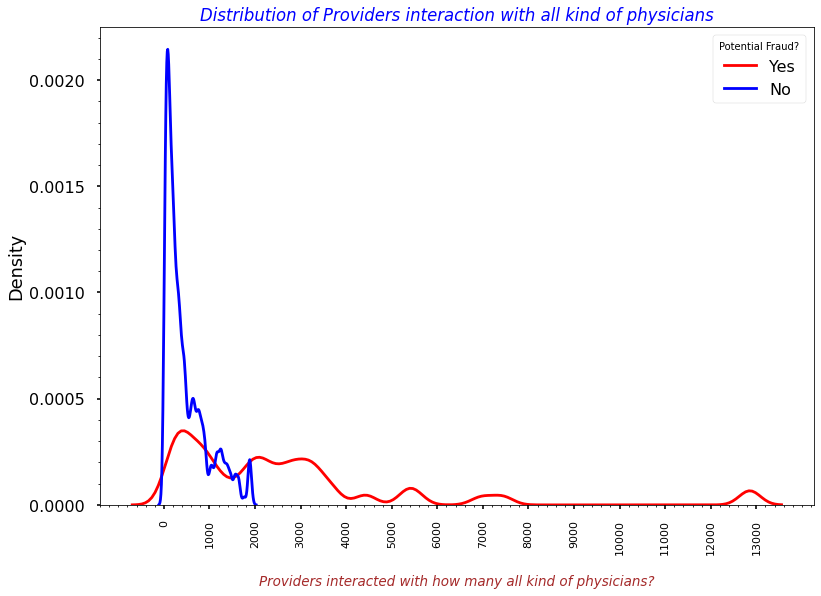

In [353]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['Prv_Tot_Att_Opr_Oth_Phys'],color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['Prv_Tot_Att_Opr_Oth_Phys'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders interacted with how many all kind of physicians?", fontdict=label_font_dict)
    plt.xticks(np.arange(0,14000,1000), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with all kind of physicians", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

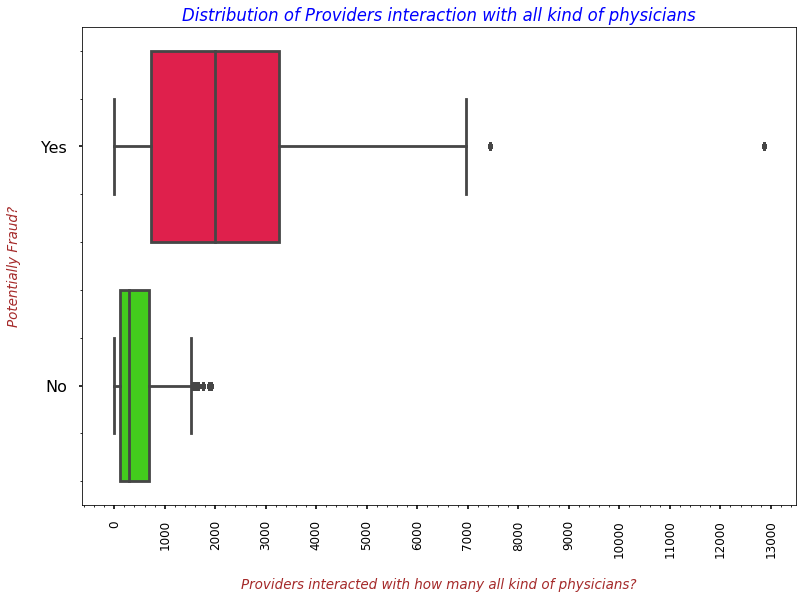

In [354]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='Prv_Tot_Att_Opr_Oth_Phys', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,14000,1000), rotation=90, fontsize=12)
    plt.xlabel("\nProviders interacted with how many all kind of physicians?", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Providers interaction with all kind of physicians", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots are quite interesting as we can see that if `Prv_Tot_Att_Opr_Oth_Phys` is high then chances of fraud is quite high.

### **Adding `New Feature` :: `Total Unique Claim Admit Codes used by a PROVIDER`**
   
   * **`Reasoning`** :: The idea behind adding this feature is to see how many unique number of `Claim Admit Diagnosis Codes` used by the Provider. 
       * As there may be a pattern that if a provider has used so many Admit Diagnosis Codes then it might increases or decreases the chances of fraud.

In [355]:
train_iobp_df['PRV_Tot_Admit_DCodes'] = train_iobp_df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

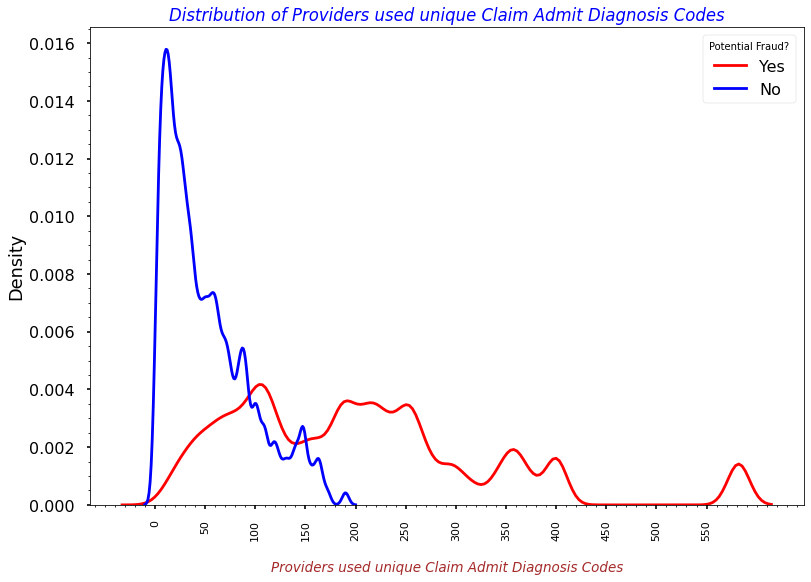

In [356]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['PRV_Tot_Admit_DCodes'], color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['PRV_Tot_Admit_DCodes'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders used unique Claim Admit Diagnosis Codes", fontdict=label_font_dict)
    plt.xticks(np.arange(0,600,50), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Providers used unique Claim Admit Diagnosis Codes", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

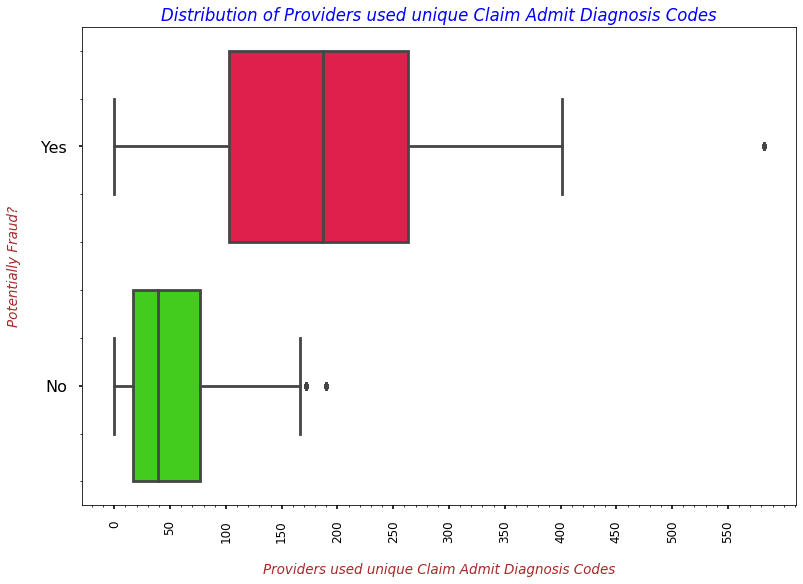

In [357]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='PRV_Tot_Admit_DCodes', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,600,50), rotation=90, fontsize=12)
    plt.xlabel("\nProviders used unique Claim Admit Diagnosis Codes", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Providers used unique Claim Admit Diagnosis Codes", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots are very interesting as we can see that if `PRV_Tot_Admit_DCodes` is high then chances of fraud also increases.

**`NOTE` :: `What didn't worked?`**
* I also looked to add the `unique number of Admit Diagnosis Codes` used by the `3 different class of physicians` but the variation was very minimal, thus not added those features.

### **Adding `New Feature` :: `Total Unique Number of Diagnosis Group Codes used by a PROVIDER`**
   
   * **`Reasoning`** :: The idea behind adding this feature is to see how many unique `Diagnosis Group Codes` used by the Provider.
       * As there may be a pattern that if a provider has used so many Diagnosis Group Codes then it might increases or decreases the chances of fraud.

In [358]:
train_iobp_df['PRV_Tot_DGrpCodes'] = train_iobp_df.groupby(['Provider'])['DiagnosisGroupCode'].transform('nunique')

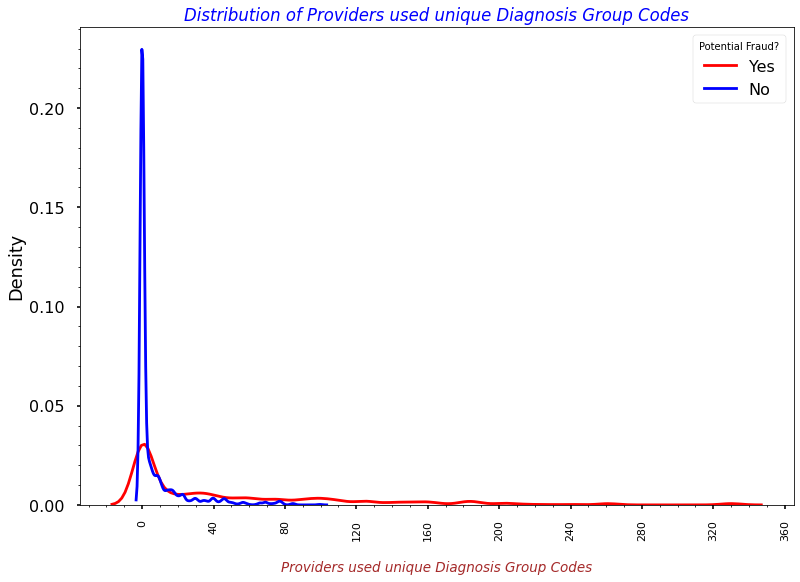

In [359]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['PRV_Tot_DGrpCodes'], color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['PRV_Tot_DGrpCodes'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders used unique Diagnosis Group Codes", fontdict=label_font_dict)
    plt.xticks(np.arange(0,400,40), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Providers used unique Diagnosis Group Codes", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

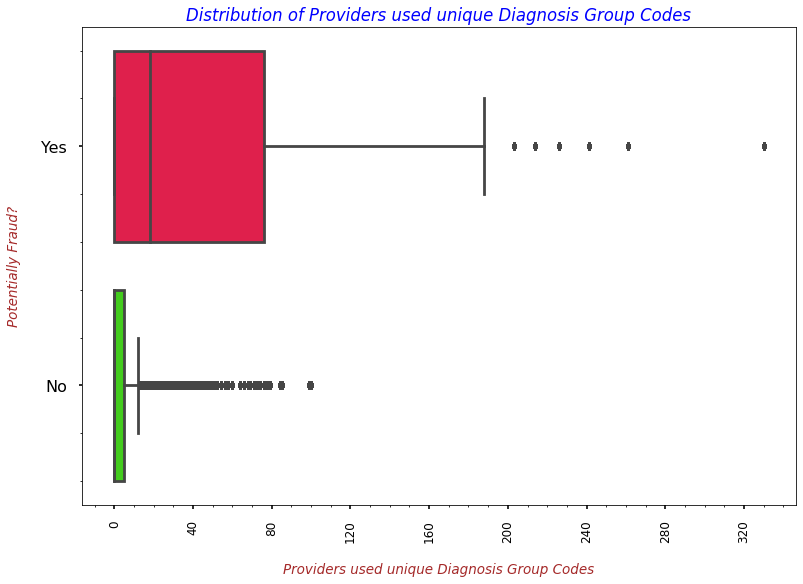

In [360]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='PRV_Tot_DGrpCodes', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,400,40), rotation=90, fontsize=12)
    plt.xlabel("\nProviders used unique Diagnosis Group Codes", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Providers used unique Diagnosis Group Codes", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggest that if `PRV_Tot_Admit_DCodes` is high then it slightly increases the chances of fraud.


**`NOTE` :: `What didn't worked?`**
* I also looked to add the `unique number of Diagnosis Group Codes` used by the `3 different class of physicians` but the variation was very minimal, thus not added those features.


**`NOTE` :: `What didn't worked?`**
* I also looked to add `in how many claims a unique Diagnosis Group Code` is used but there was no variation at all, thus not added that feature. Kindly refer to the below image:

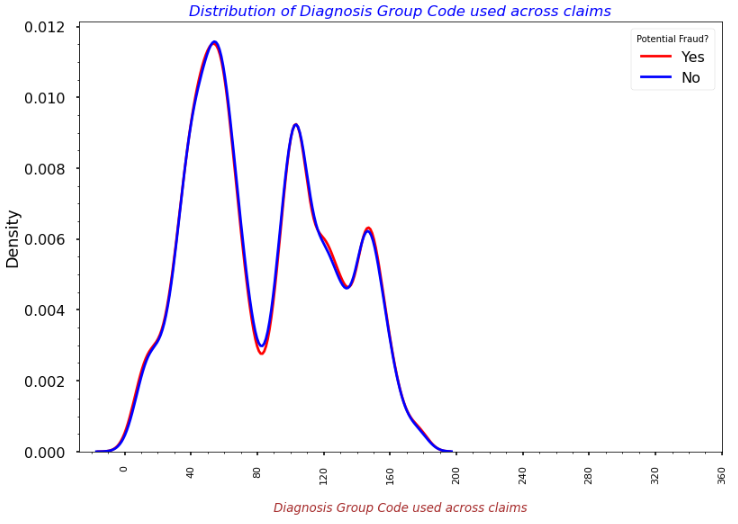

In [361]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/What_didnt_worked_DGCode_across_claims.png")

**`NOTE` :: `What didn't worked?`**
* I also looked to add `DOB -- Month`, `DOD -- Year` and `DOD -- Month` in order to see whether we can find some pattern of bogus DOB or DOD but there was no variation at all, thus not added that feature. Also, raw `DOB -- Year` also showed no variation. Kindly refer to the below image:

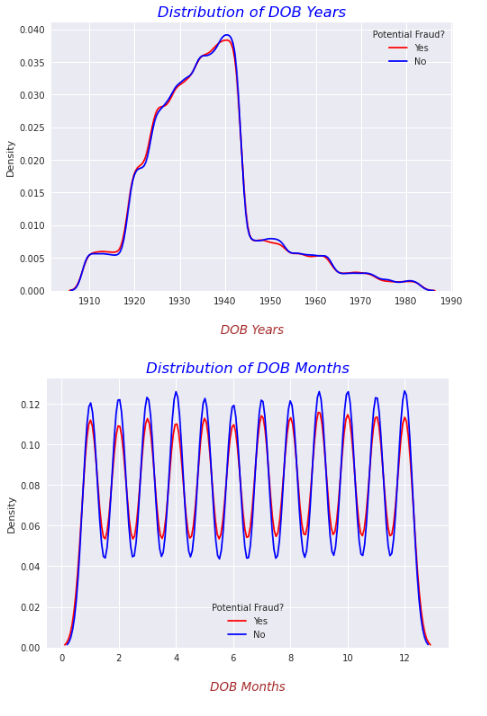

In [362]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/What_didnt_worked_DOB_Years_Month.png")

### **Adding `New Feature` :: `Total unique Date of Birth years of beneficiaries provided by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that if a provider has very high variability in the year of birth of patients then that might be one of the signs of medicare frauds.
       - Because generally private hospitals who treat poor patients make false claims on their names. For example, Nazia is 10 years old. But, according to a claim filed by Chhattisgarh-based Shaheed Hospital with the Rashtriya Swasthya Bima Yojna (RSBY), she has delivered a baby after a caesarean operation. Mukul (name changed) is only 7. But Agarwal Hospital, Raipur, has made a claim for removing cataract from his eyes.

Read more at:
https://economictimes.indiatimes.com/news/politics-and-nation/private-hospitals-perform-fake-surgeries-to-claim-thousands-in-insurance-cover/articleshow/16934229.cms?utm_source=contentofinterest&utm_medium=text&utm_campaign=cppst

In [363]:
train_iobp_df['DOB_Year'] = train_iobp_df['DOB'].dt.year

In [364]:
train_iobp_df['PRV_Tot_Unq_DOB_Years'] = train_iobp_df.groupby(['Provider'])['DOB_Year'].transform('nunique')

In [365]:
train_iobp_df['PRV_Tot_Unq_DOB_Years'].describe()

count    558211.000000
mean         50.615590
std          18.190988
min           1.000000
25%          38.000000
50%          54.000000
75%          67.000000
max          75.000000
Name: PRV_Tot_Unq_DOB_Years, dtype: float64

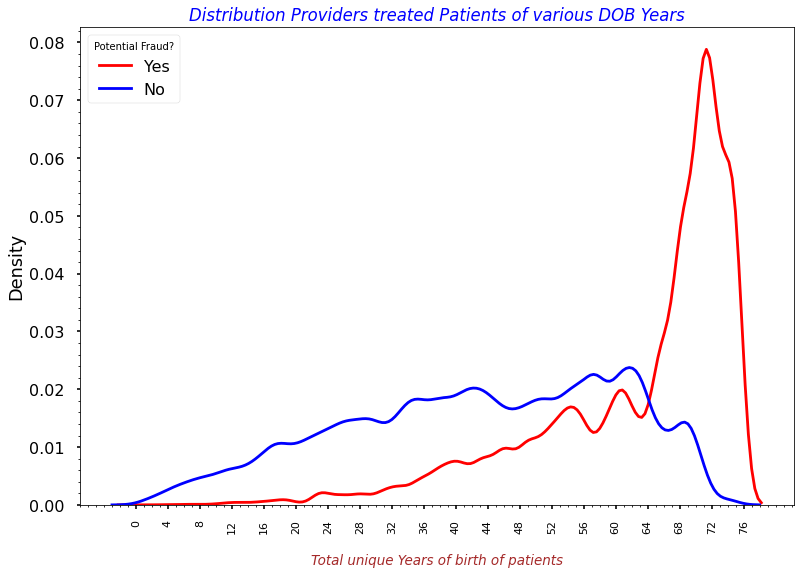

In [366]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['PRV_Tot_Unq_DOB_Years'], color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['PRV_Tot_Unq_DOB_Years'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nTotal unique Years of birth of patients", fontdict=label_font_dict)
    plt.xticks(np.arange(0,80,4), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution Providers treated Patients of various DOB Years", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

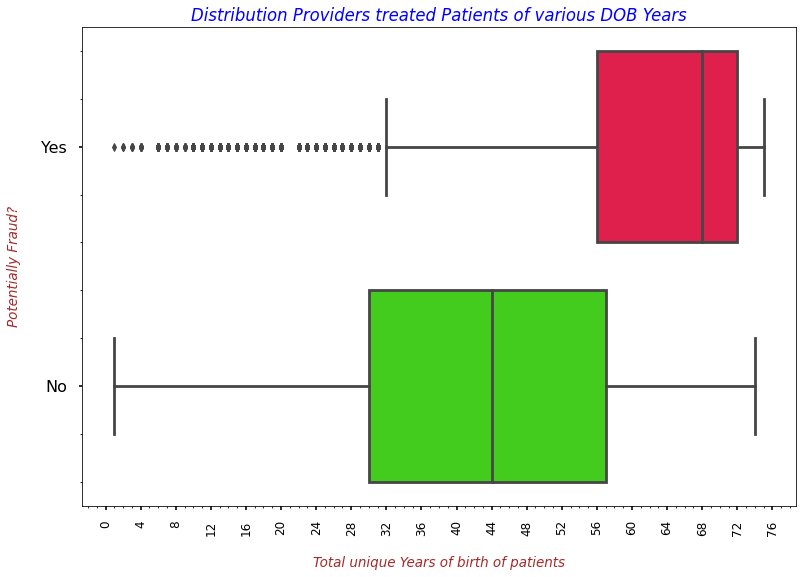

In [367]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='PRV_Tot_Unq_DOB_Years', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,80,4), rotation=90, fontsize=12)
    plt.xlabel("\nTotal unique Years of birth of patients", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution Providers treated Patients of various DOB Years", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggest that if `PRV_Tot_Unq_DOB_Years` is very high than then it increases the chances of fraud as well.
    * As shown below, if PRV_Tot_Unq_DOB_Years is greater than or equals to 67 then the very high majority of cases are fraud.

In [368]:
train_iobp_df[train_iobp_df['PRV_Tot_Unq_DOB_Years'] >=67]['PotentialFraud'].value_counts()

Yes    118873
No      22203
Name: PotentialFraud, dtype: int64

### **Adding `New Feature` :: `Sum of patients age treated by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the sum of patients age treated by a provider is very high or low then it might influence the fraud.

In [369]:
train_iobp_df['PRV_Bene_Age_Sum'] = train_iobp_df.groupby(['Provider'])['Bene_Age'].transform('sum')

In [370]:
train_iobp_df['PRV_Bene_Age_Sum'].describe()

count    558211.000000
mean      60903.124044
std       95028.202759
min          34.300000
25%        9007.200000
50%       26310.800000
75%       74869.500000
max      617454.100000
Name: PRV_Bene_Age_Sum, dtype: float64

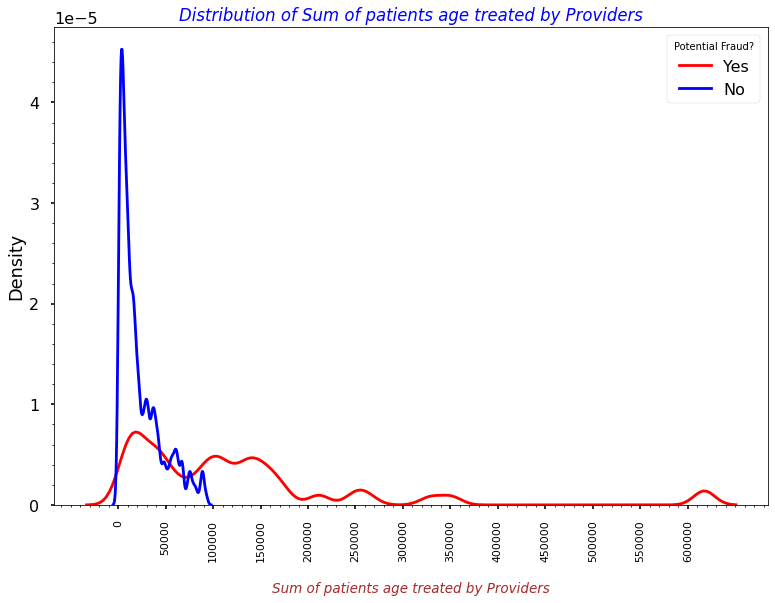

In [371]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['PRV_Bene_Age_Sum'], color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['PRV_Bene_Age_Sum'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nSum of patients age treated by Providers", fontdict=label_font_dict)
    plt.xticks(np.arange(0,620000,50000), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of Sum of patients age treated by Providers", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

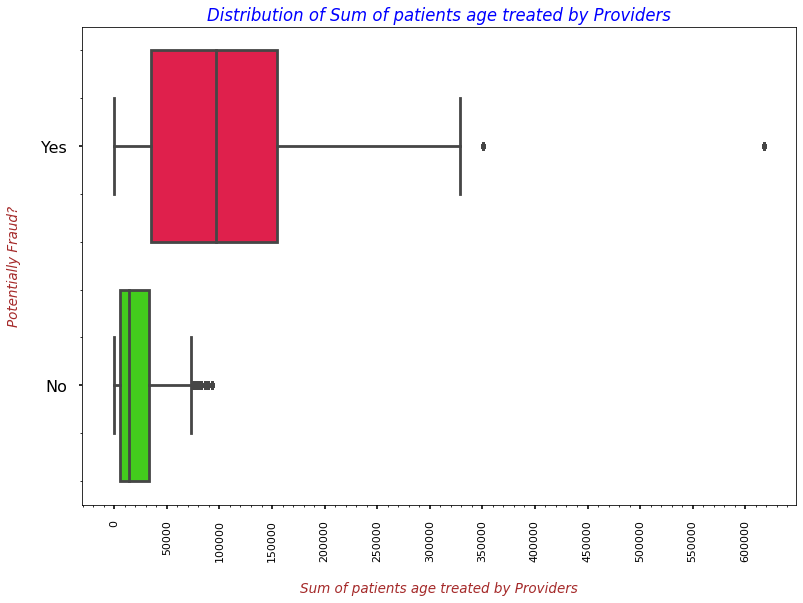

In [372]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='PRV_Bene_Age_Sum', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,620000,50000), rotation=90, fontsize=11)
    plt.xlabel("\nSum of patients age treated by Providers", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Sum of patients age treated by Providers", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggest that if `PRV_Bene_Age_Sum` is high then it increases the chances of fraud.

### **Adding `New Feature` :: `Sum of Insc Claim Re-Imb Amount for a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the sum of claim re-imb amount for a provider is very high or low then it might influence the fraud.

In [373]:
train_iobp_df['PRV_Insc_Clm_ReImb_Amt'] = train_iobp_df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

In [374]:
train_iobp_df['PRV_Insc_Clm_ReImb_Amt'].describe()

count    5.582110e+05
mean     4.877429e+05
std      7.367223e+05
min      0.000000e+00
25%      6.369000e+04
50%      2.036000e+05
75%      5.969000e+05
max      5.996050e+06
Name: PRV_Insc_Clm_ReImb_Amt, dtype: float64

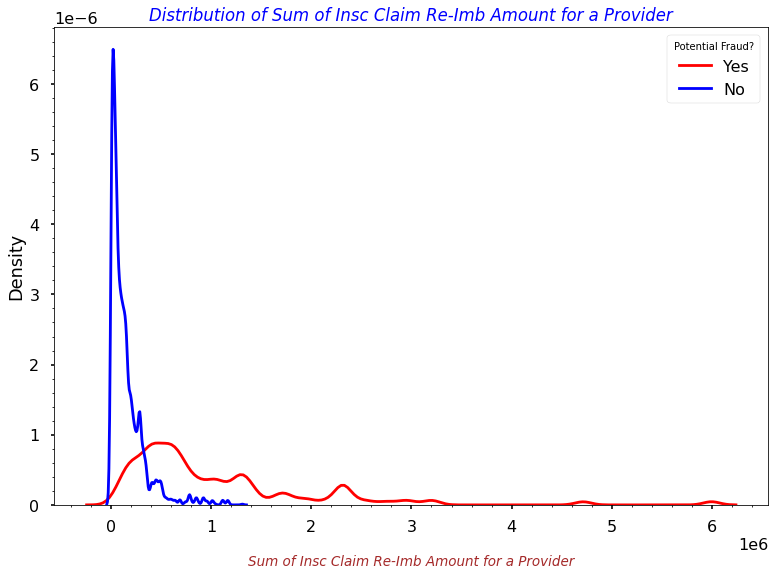

In [375]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['PRV_Insc_Clm_ReImb_Amt'], color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['PRV_Insc_Clm_ReImb_Amt'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nSum of Insc Claim Re-Imb Amount for a Provider", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Sum of Insc Claim Re-Imb Amount for a Provider", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

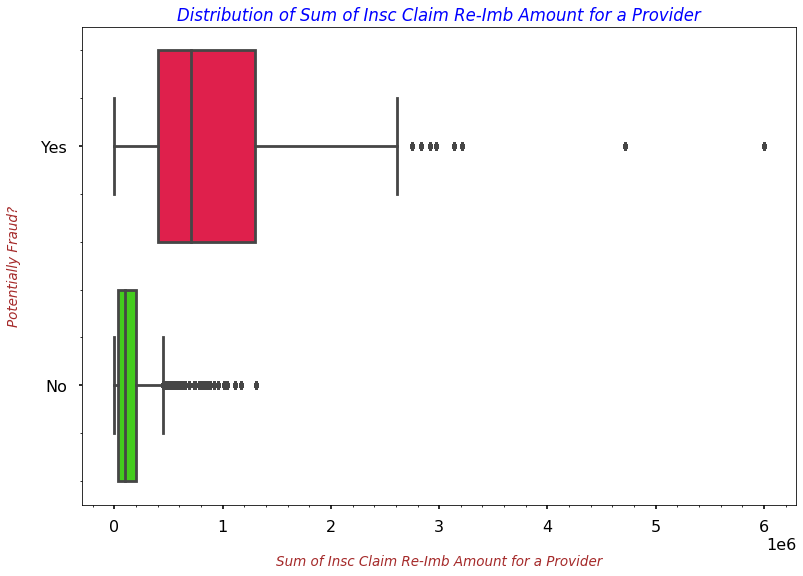

In [376]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='PRV_Insc_Clm_ReImb_Amt', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xlabel("\nSum of Insc Claim Re-Imb Amount for a Provider", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of Sum of Insc Claim Re-Imb Amount for a Provider", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggest that if `PRV_Insc_Clm_ReImb_Amt` is high then it increases the chances of fraud.

### **Adding `New Feature` :: `Total number of RKD Patients seen by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the total number of RKD Patients seen by a Provider is very high or low then it might influence the fraud.

In [377]:
train_iobp_df['RenalDiseaseIndicator'] = train_iobp_df['RenalDiseaseIndicator'].apply(lambda val: 1 if val == "Y" else 0)

In [378]:
train_iobp_df['PRV_Tot_RKD_Patients'] = train_iobp_df.groupby(['Provider'])['RenalDiseaseIndicator'].transform('sum')

In [379]:
train_iobp_df['PRV_Tot_RKD_Patients'].describe()

count    558211.000000
mean        157.902616
std         233.828365
min           0.000000
25%          24.000000
50%          73.000000
75%         192.000000
max        1447.000000
Name: PRV_Tot_RKD_Patients, dtype: float64

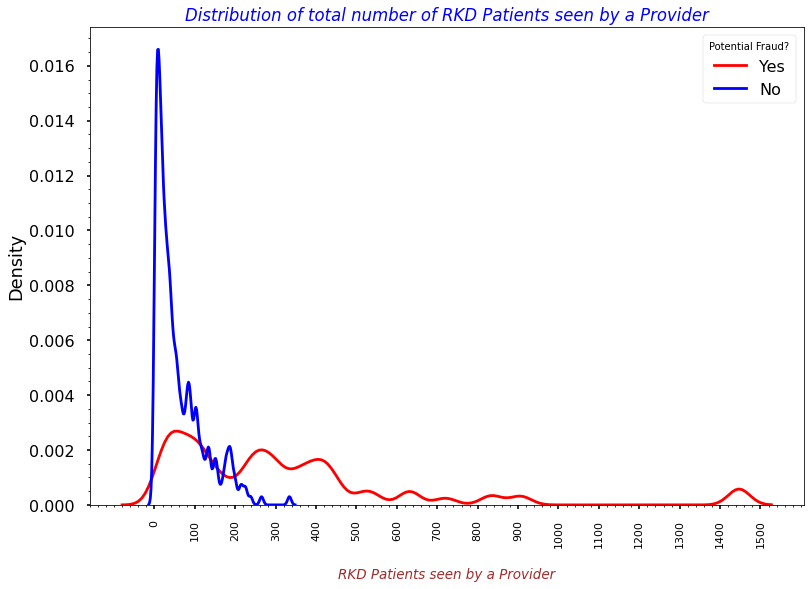

In [380]:
with plt.style.context('seaborn-poster'):
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'Yes']['PRV_Tot_RKD_Patients'], color='red')
    sns.kdeplot(x=train_iobp_df[train_iobp_df['PotentialFraud'] == 'No']['PRV_Tot_RKD_Patients'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nRKD Patients seen by a Provider", fontdict=label_font_dict)
    plt.xticks(np.arange(0,1600,100), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.title("Distribution of total number of RKD Patients seen by a Provider", fontdict=title_font_dict)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

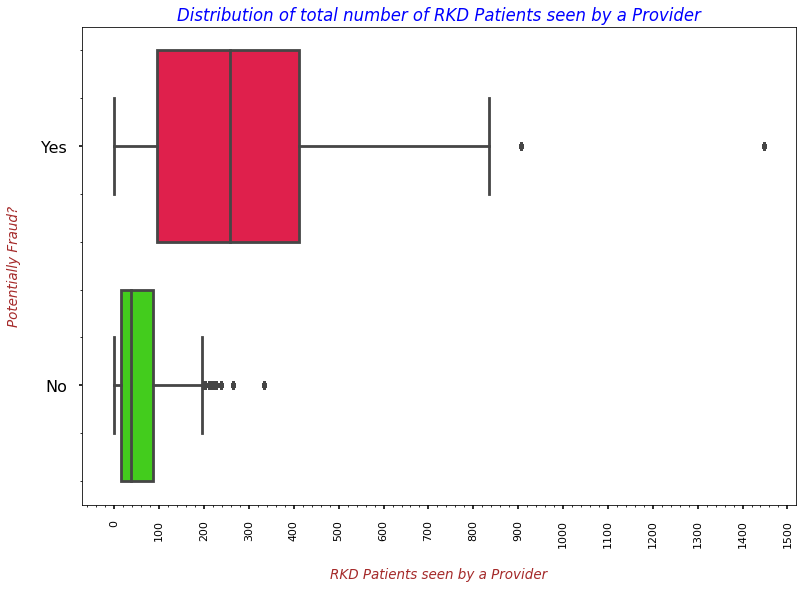

In [381]:
with plt.style.context('seaborn-poster'):
    fig = sns.boxplot(data=train_iobp_df, y='PotentialFraud', x='PRV_Tot_RKD_Patients', palette='prism_r', orient='h')   
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontdict=label_font_dict)
    plt.xticks(np.arange(0,1600,100), rotation=90, fontsize=11)
    plt.xlabel("\nRKD Patients seen by a Provider", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.title("Distribution of total number of RKD Patients seen by a Provider", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above KDE and Box plots suggest that if `PRV_Tot_RKD_Patients` is high then it increases the chances of fraud.

# **`Some trends`**

### **Q1. Which are the Top-25 `Providers` with maximum number of fraudulent cases?**

In [382]:
tmp = pd.DataFrame(train_iobp_df.groupby(['Provider','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['Provider', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,Provider,Fraud?,Num_of_cases,Cases,Percentage
0,PRV51001,No,25,345415,0.01
1,PRV51003,Yes,132,212796,0.06
2,PRV51004,No,149,345415,0.04
3,PRV51005,Yes,1165,212796,0.55
4,PRV51007,No,72,345415,0.02


In [383]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

    Provider  Num_of_cases  Percentage
0   PRV51459          8240        3.87
1   PRV53797          4739        2.23
2   PRV51574          4444        2.09
3   PRV53918          3588        1.69
4   PRV54895          3436        1.61
5   PRV55215          3393        1.59
6   PRV52064          2844        1.34
7   PRV56011          2833        1.33
8   PRV55004          2399        1.13
9   PRV56560          2313        1.09
10  PRV57306          2315        1.09
11  PRV52030          2275        1.07
12  PRV52649          2156        1.01
13  PRV54772          2115        0.99
14  PRV52628          2098        0.99
15  PRV51369          2083        0.98
16  PRV51347          2067        0.97
17  PRV55039          2058        0.97
18  PRV57103          2049        0.96
19  PRV52019          1961        0.92
20  PRV51480          1924        0.90
21  PRV55462          1907        0.90
22  PRV52041          1885        0.89
23  PRV55467          1896        0.89
24  PRV54742          189

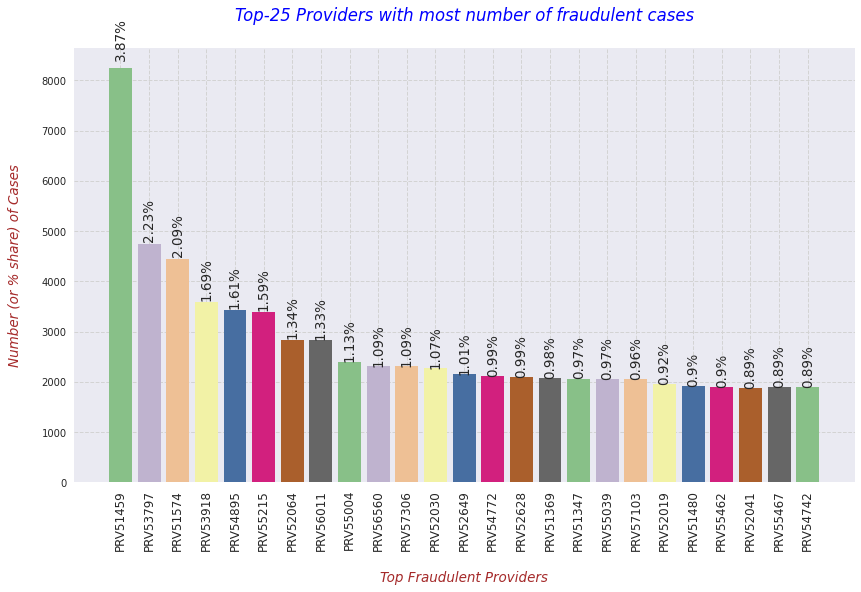

In [384]:
print(tmp_only_frauds[['Provider','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="Provider", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent Providers", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 Providers with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Providers with most percentage of Fraudulent Case Submissions.
    * Here, PRV51459 has the highest percentage share of fraudulent cases. The, difference b/w others providers is not that high.

### **Q2. Which are the Top-25 `Providers` with maximum number of non-fraudulent cases?**

In [385]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

    Provider  Num_of_cases  Percentage
0   PRV53750          1245        0.36
1   PRV55552          1206        0.35
2   PRV53394          1215        0.35
3   PRV53871          1220        0.35
4   PRV52001          1177        0.34
5   PRV52104          1189        0.34
6   PRV56559          1113        0.32
7   PRV56006          1090        0.32
8   PRV54813          1056        0.31
9   PRV52631          1057        0.31
10  PRV51509          1030        0.30
11  PRV56270          1043        0.30
12  PRV54332           995        0.29
13  PRV52605          1000        0.29
14  PRV53702          1010        0.29
15  PRV57333          1004        0.29
16  PRV55525           933        0.27
17  PRV56248           934        0.27
18  PRV57348           920        0.27
19  PRV52395           912        0.26
20  PRV56243           909        0.26
21  PRV52859           911        0.26
22  PRV53700           913        0.26
23  PRV55510           861        0.25
24  PRV54374           85

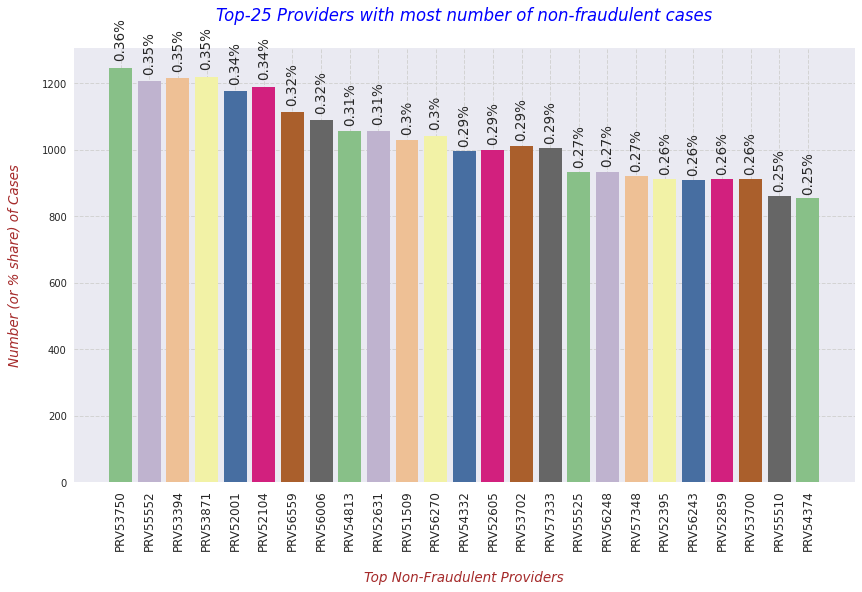

In [386]:
print(tmp_only_non_frauds[['Provider','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="Provider", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent Providers", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 Providers with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Providers with most percentage of Non-Fraudulent Case Submissions.
    * Here, PRV53750 has the highest percentage share of non-fraudulent cases. But, the difference with other providers is not so high.

### **Q3. Which are the Top-25 `Attending Physicians` with maximum number of fraudulent cases?**

In [387]:
tmp = pd.DataFrame(train_iobp_df.groupby(['AttendingPhysician','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['AttendingPhysician', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,AttendingPhysician,Fraud?,Num_of_cases,Cases,Percentage
0,PHY311001,No,2,344471,0.0
1,PHY311002,Yes,1,212232,0.0
2,PHY311004,No,2,344471,0.0
3,PHY311005,No,2,344471,0.0
4,PHY311006,No,1,344471,0.0


In [388]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   AttendingPhysician  Num_of_cases  Percentage
0           PHY330576          2534        1.19
1           PHY350277          1628        0.77
2           PHY412132          1321        0.62
3           PHY423534          1223        0.58
4           PHY314027          1200        0.57
5           PHY327046          1181        0.56
6           PHY338032          1158        0.55
7           PHY357120          1156        0.54
8           PHY337425          1156        0.54
9           PHY341578          1133        0.53
10          PHY432650          1093        0.52
11          PHY347064          1076        0.51
12          PHY344389          1000        0.47
13          PHY383481          1005        0.47
14          PHY415321          1002        0.47
15          PHY433436           924        0.44
16          PHY375453           880        0.41
17          PHY387126           762        0.36
18          PHY357307           737        0.35
19          PHY318667           711     

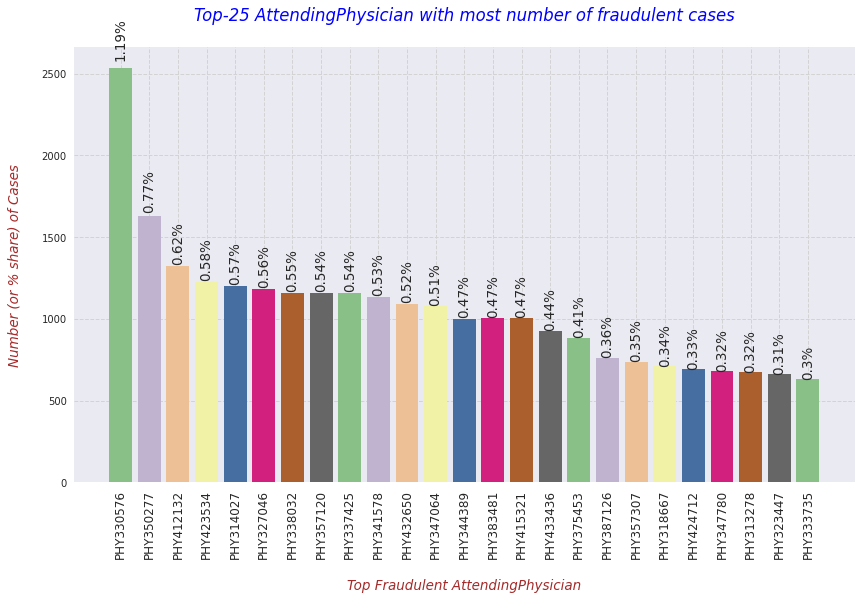

In [389]:
print(tmp_only_frauds[['AttendingPhysician','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="AttendingPhysician", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent AttendingPhysician", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 AttendingPhysician with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Attenting Physicians with most percentage of Fraudulent Case Submissions.
    * Here, PHY330576 has the highest percentage share of fraudulent cases. But, the difference b/w other physicians is not so high.

### **Q4. Which are the Top-25 `Attenting Physicians` with maximum number of non-fraudulent cases?**

In [390]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   AttendingPhysician  Num_of_cases  Percentage
0           PHY351121          1053        0.31
1           PHY375943           912        0.26
2           PHY432614           716        0.21
3           PHY389456           673        0.20
4           PHY326984           686        0.20
5           PHY362889           674        0.20
6           PHY373032           618        0.18
7           PHY367255           634        0.18
8           PHY356444           600        0.17
9           PHY360179           583        0.17
10          PHY405720           544        0.16
11          PHY342223           503        0.15
12          PHY387900           514        0.15
13          PHY430054           513        0.15
14          PHY361063           470        0.14
15          PHY326049           445        0.13
16          PHY388040           447        0.13
17          PHY351973           426        0.12
18          PHY318242           422        0.12
19          PHY328307           402     

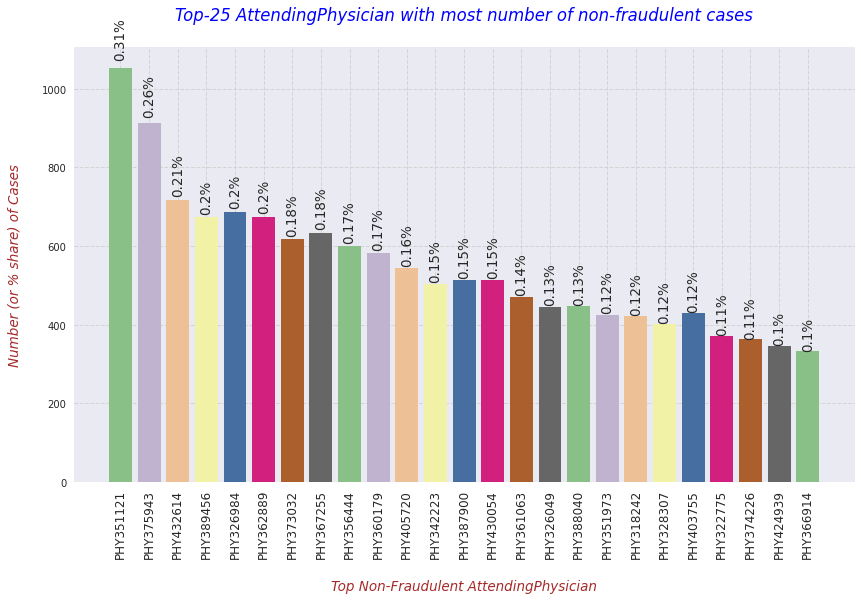

In [391]:
print(tmp_only_non_frauds[['AttendingPhysician','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="AttendingPhysician", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent AttendingPhysician", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 AttendingPhysician with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Attenting Physicians with most percentage of Non-Fraudulent Case Submissions.
    * Here, PHY351121 has the highest percentage share of non-fraudulent cases. But, the difference with other providers is not so high.

### **Q5. Which are the Top-25 `Operating Physicians` with maximum number of fraudulent cases?**

In [392]:
tmp = pd.DataFrame(train_iobp_df.groupby(['OperatingPhysician','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['OperatingPhysician', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,OperatingPhysician,Fraud?,Num_of_cases,Cases,Percentage
0,PHY311005,No,1,67497,0.00
1,PHY311010,No,1,67497,0.00
2,PHY311011,Yes,5,46950,0.01
3,PHY311014,No,3,67497,0.00
4,PHY311018,No,2,67497,0.00


In [393]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   OperatingPhysician  Num_of_cases  Percentage
0           PHY330576           424        0.90
1           PHY424897           293        0.62
2           PHY314027           256        0.55
3           PHY423534           250        0.53
4           PHY357120           249        0.53
5           PHY412132           245        0.52
6           PHY327046           236        0.50
7           PHY381249           231        0.49
8           PHY333735           232        0.49
9           PHY341578           224        0.48
10          PHY429430           225        0.48
11          PHY337425           226        0.48
12          PHY383481           191        0.41
13          PHY347064           189        0.40
14          PHY432650           178        0.38
15          PHY344389           171        0.36
16          PHY415321           165        0.35
17          PHY433436           159        0.34
18          PHY341560           154        0.33
19          PHY387026           143     

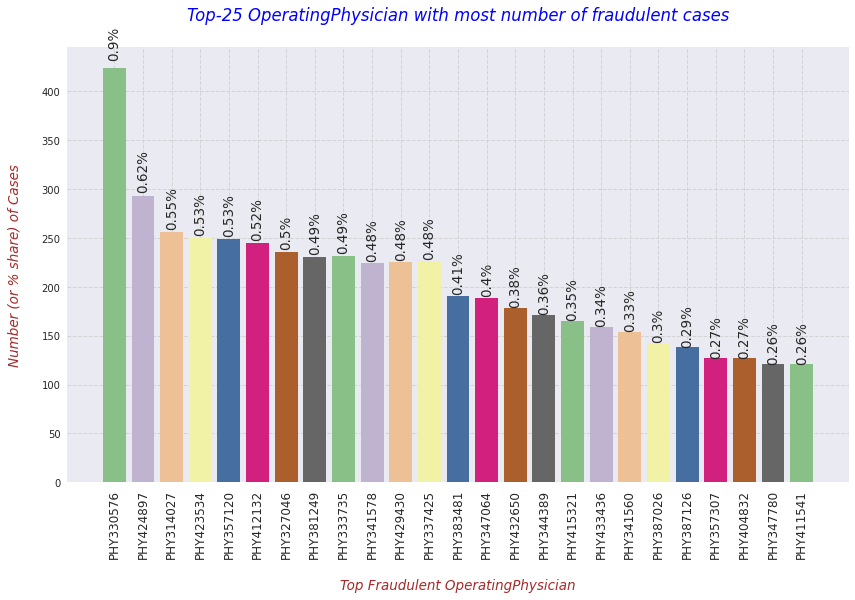

In [394]:
print(tmp_only_frauds[['OperatingPhysician','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="OperatingPhysician", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent OperatingPhysician", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 OperatingPhysician with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Operating Physicians with most percentage of Fraudulent Case Submissions.
    * Here, PHY330576 has the highest percentage share of fraudulent cases. But, the difference b/w other providers is not so high.

### **Q6. Which are the Top-25 `Operating Physicians` with maximum number of non-fraudulent cases?**

In [395]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   OperatingPhysician  Num_of_cases  Percentage
0           PHY387900           180        0.27
1           PHY351121           179        0.27
2           PHY375943           147        0.22
3           PHY367255           132        0.20
4           PHY432614           129        0.19
5           PHY362889           122        0.18
6           PHY326984           121        0.18
7           PHY356444           108        0.16
8           PHY360179            98        0.15
9           PHY405720            96        0.14
10          PHY373032            97        0.14
11          PHY321493            88        0.13
12          PHY342223            89        0.13
13          PHY318242            85        0.13
14          PHY319973            89        0.13
15          PHY326049            81        0.12
16          PHY366914            79        0.12
17          PHY361063            84        0.12
18          PHY388040            82        0.12
19          PHY322775            71     

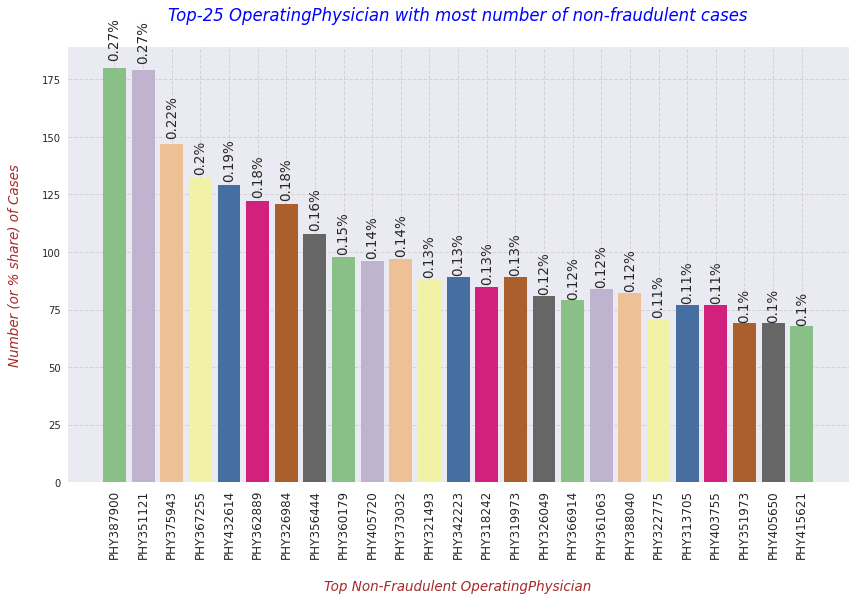

In [396]:
print(tmp_only_non_frauds[['OperatingPhysician','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="OperatingPhysician", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent OperatingPhysician", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 OperatingPhysician with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Operating Physicians with most percentage of Non-Fraudulent Case Submissions.
    * Here, PHY387900 and PHY351121 has the highest percentage share of non-fraudulent cases. But, the difference b/w providers is not so high.

### **Q7. Which are the Top-25 `Other Physicians` with maximum number of fraudulent cases?**

In [397]:
tmp = pd.DataFrame(train_iobp_df.groupby(['OtherPhysician','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['OtherPhysician', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,OtherPhysician,Fraud?,Num_of_cases,Cases,Percentage
0,PHY311001,No,1,125093,0.0
1,PHY311003,Yes,2,74643,0.0
2,PHY311005,No,2,125093,0.0
3,PHY311006,No,3,125093,0.0
4,PHY311007,Yes,1,74643,0.0


In [398]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   OtherPhysician  Num_of_cases  Percentage
0       PHY412132          1247        1.67
1       PHY341578          1098        1.47
2       PHY338032          1070        1.43
3       PHY337425          1041        1.39
4       PHY347064           806        1.08
5       PHY322092           771        1.03
6       PHY409965           744        1.00
7       PHY313818           730        0.98
8       PHY350277           682        0.91
9       PHY415321           678        0.91
10      PHY313278           625        0.84
11      PHY359122           614        0.82
12      PHY416093           538        0.72
13      PHY333735           496        0.66
14      PHY421058           432        0.58
15      PHY359931           414        0.55
16      PHY396637           400        0.54
17      PHY327964           371        0.50
18      PHY336024           372        0.50
19      PHY315344           363        0.49
20      PHY410597           357        0.48
21      PHY416732           356 

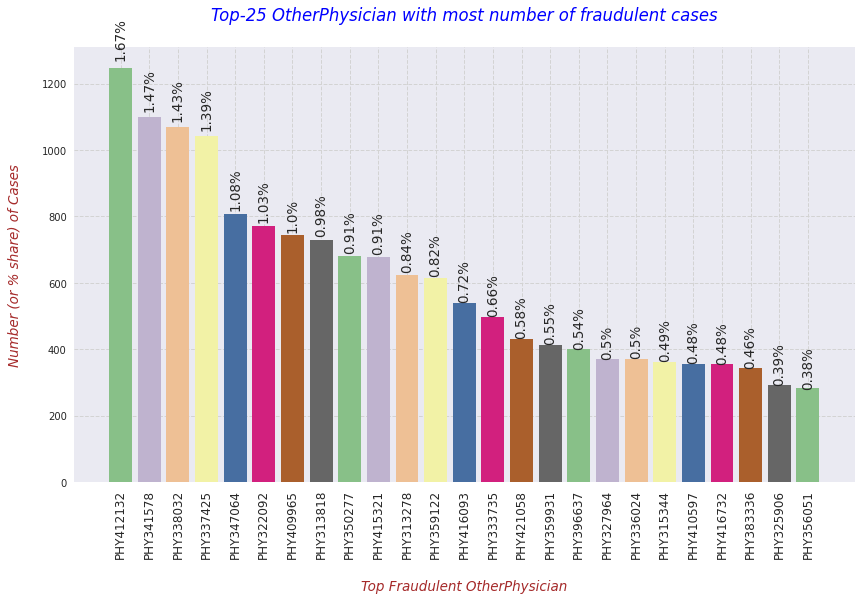

In [399]:
print(tmp_only_frauds[['OtherPhysician','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="OtherPhysician", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent OtherPhysician", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 OtherPhysician with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Other Physicians with most percentage of Fraudulent Case Submissions.
    * Here, PHY412132 has the highest percentage share of fraudulent cases. But, the difference with other providers is not so high.

### **Q8. Which are the Top-25 `Other Physicians` with maximum number of non-fraudulent cases?**

In [400]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   OtherPhysician  Num_of_cases  Percentage
0       PHY422235           369        0.29
1       PHY387900           351        0.28
2       PHY375943           328        0.26
3       PHY411722           313        0.25
4       PHY363309           305        0.24
5       PHY331484           295        0.24
6       PHY362889           294        0.24
7       PHY326984           292        0.23
8       PHY367255           269        0.22
9       PHY389456           271        0.22
10      PHY356444           258        0.21
11      PHY382485           249        0.20
12      PHY315424           243        0.19
13      PHY405720           220        0.18
14      PHY354358           217        0.17
15      PHY323501           202        0.16
16      PHY403755           196        0.16
17      PHY384394           196        0.16
18      PHY388477           197        0.16
19      PHY395822           195        0.16
20      PHY326286           189        0.15
21      PHY415621           182 

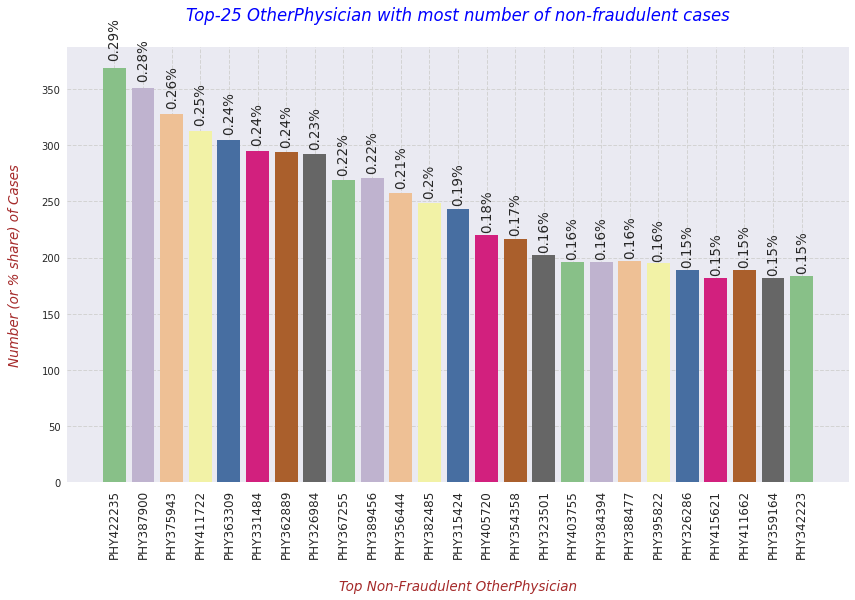

In [401]:
print(tmp_only_non_frauds[['OtherPhysician','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="OtherPhysician", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent OtherPhysician", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 OtherPhysician with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Other Physicians with most percentage of Non-Fraudulent Case Submissions.
    * Here, PHY422235 has the highest percentage share of non-fraudulent cases. But, the difference with other providers is not so high.

### **Q9. Which are the Top-25 `ClmAdmitDiagnosisCode` with maximum number of fraudulent cases?**

In [402]:
tmp = pd.DataFrame(train_iobp_df.groupby(['ClmAdmitDiagnosisCode','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['ClmAdmitDiagnosisCode', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,ClmAdmitDiagnosisCode,Fraud?,Num_of_cases,Cases,Percentage
0,0030,No,1,83850,0.00
1,0030,Yes,1,62049,0.00
2,0059,No,1,83850,0.00
3,0059,Yes,2,62049,0.00
4,00845,No,31,83850,0.04


In [403]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   ClmAdmitDiagnosisCode  Num_of_cases  Percentage
0                  42731          1529        2.46
1                  V7612          1441        2.32
2                  78605          1432        2.31
3                  78650          1191        1.92
4                  78900          1020        1.64
5                   4019          1006        1.62
6                  25000           873        1.41
7                    486           843        1.36
8                  78079           828        1.33
9                   7802           793        1.28
10                  7295           740        1.19
11                  5990           703        1.13
12                 V5883           691        1.11
13                  4280           661        1.07
14                  7242           600        0.97
15                  7862           593        0.96
16                 V5789           573        0.92
17                 V5861           556        0.90
18                  2724       

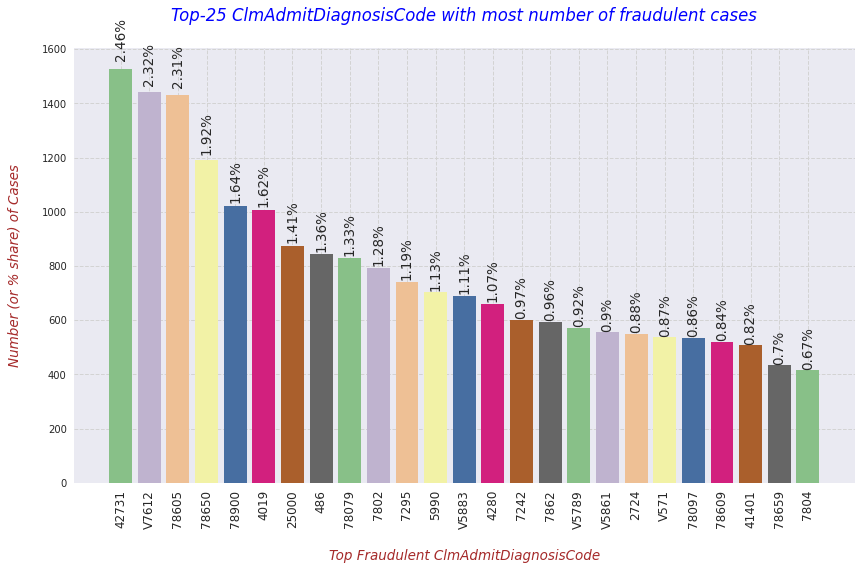

In [404]:
print(tmp_only_frauds[['ClmAdmitDiagnosisCode','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="ClmAdmitDiagnosisCode", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent ClmAdmitDiagnosisCode", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 ClmAdmitDiagnosisCode with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 'Claim Admit Diagnosis Code' with most percentage of Fraudulent Case Submissions.

### **Q10. Which are the Top-25 `ClmAdmitDiagnosisCode` with maximum number of non-fraudulent cases?**

In [405]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   ClmAdmitDiagnosisCode  Num_of_cases  Percentage
0                  V7612          2633        3.14
1                  42731          2105        2.51
2                   4019          1726        2.06
3                  78605          1560        1.86
4                  25000          1495        1.78
5                  78900          1316        1.57
6                  V5883          1182        1.41
7                   7295          1104        1.32
8                  78650          1082        1.29
9                   7242           997        1.19
10                 V5861           980        1.17
11                  2724           958        1.14
12                 78079           951        1.13
13                  5990           922        1.10
14                  V571           905        1.08
15                  7862           868        1.04
16                  7802           820        0.98
17                  4011           660        0.79
18                   486       

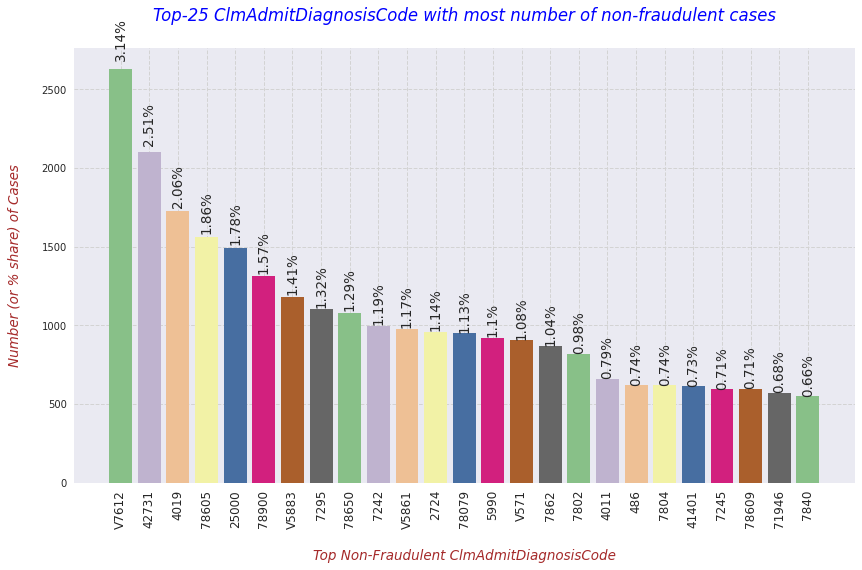

In [406]:
print(tmp_only_non_frauds[['ClmAdmitDiagnosisCode','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="ClmAdmitDiagnosisCode", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent ClmAdmitDiagnosisCode", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 ClmAdmitDiagnosisCode with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**

* The above plot shows us the Top-25 'Claim Admit Diagnosis Code' with most percentage of Non-Fraudulent Case Submissions.

* Main observation from the above 2 plots is that same `Claim Admit Diagnostic Codes` have similar percentages for false and no-false claims. Therefore, it feels like this feature might not be very useful.

### **Q11. Which are the Top-25 `DiagnosisGroupCode` with maximum number of fraudulent cases?**

In [407]:
tmp = pd.DataFrame(train_iobp_df.groupby(['DiagnosisGroupCode','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['DiagnosisGroupCode', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,DiagnosisGroupCode,Fraud?,Num_of_cases,Cases,Percentage
0,000,No,57,17072,0.33
1,000,Yes,77,23402,0.33
2,001,No,2,17072,0.01
3,001,Yes,8,23402,0.03
4,002,No,9,17072,0.05


In [408]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   DiagnosisGroupCode  Num_of_cases  Percentage
0                 882           111        0.47
1                 166           107        0.46
2                 186           102        0.44
3                 192            98        0.42
4                 945            95        0.41
5                 884            97        0.41
6                 939            96        0.41
7                 202            95        0.41
8                 883            96        0.41
9                 188            97        0.41
10                168            94        0.40
11                949            94        0.40
12                204            94        0.40
13                885            92        0.39
14                876            90        0.38
15                196            89        0.38
16                198            89        0.38
17                183            89        0.38
18                887            90        0.38
19                950            90     

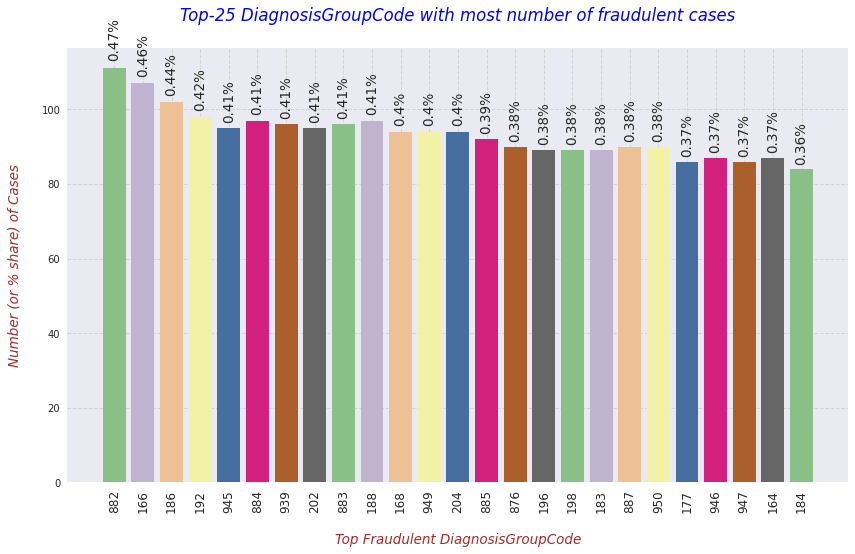

In [409]:
print(tmp_only_frauds[['DiagnosisGroupCode','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="DiagnosisGroupCode", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent DiagnosisGroupCode", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 DiagnosisGroupCode with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 'Diagnosis Group Code' with most percentage of Fraudulent Case Submissions.

### **Q12. Which are the Top-25 `DiagnosisGroupCode` with maximum number of non-fraudulent cases?**

In [410]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   DiagnosisGroupCode  Num_of_cases  Percentage
0                 183            76        0.45
1                 167            76        0.45
2                 884            77        0.45
3                 208            75        0.44
4                 940            70        0.41
5                 881            70        0.41
6                 882            68        0.40
7                 187            69        0.40
8                 887            69        0.40
9                 941            69        0.40
10                939            67        0.39
11                876            66        0.39
12                168            66        0.39
13                182            67        0.39
14                184            65        0.38
15                205            65        0.38
16                206            65        0.38
17                177            64        0.37
18                190            63        0.37
19                283            64     

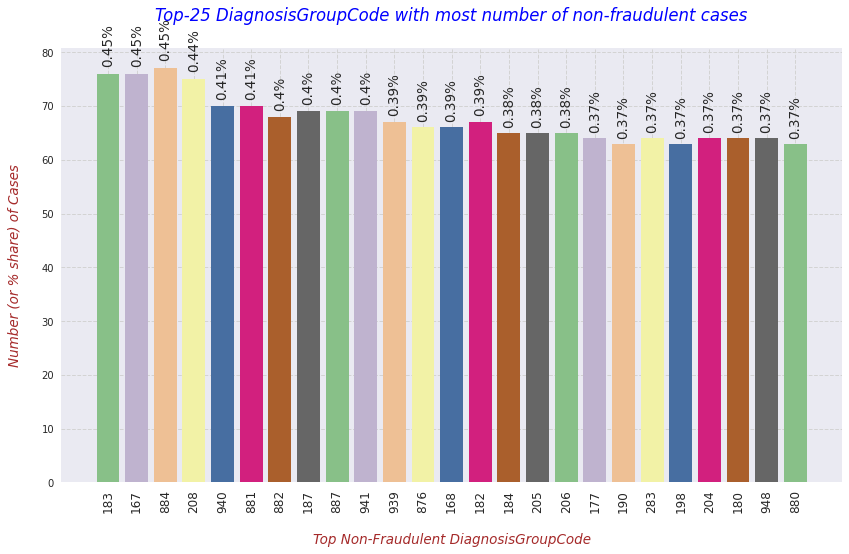

In [411]:
print(tmp_only_non_frauds[['DiagnosisGroupCode','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="DiagnosisGroupCode", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent DiagnosisGroupCode", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 DiagnosisGroupCode with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**

* The above plot shows us the Top-25 'Diagnosis Group Code' with most percentage of Non-Fraudulent Case Submissions.

* Main observation from the above 2 plots is that same `Diagnosis Group Codes` have similar percentages for false and no-false claims. Therefore, it feels like this feature might not be very useful.

### **Q13. Does `Age_groups` have any relationship with maximum number of fraudulent cases?**

In [412]:
def bene_age_brackets(val):
    """
    Description : This function is created for allocating the age groups based on Beneficiary Age.
    """
    if val >=1 and val <=40:
        return 'Young'
    elif val > 40 and val <=60:
        return 'Mid'
    elif val > 60 and val <= 80:
        return 'Old'
    else:
        return 'Very Old'

In [413]:
train_iobp_df['AGE_groups'] = train_iobp_df['Bene_Age'].apply(lambda age: bene_age_brackets(age))

In [414]:
tmp = pd.DataFrame(train_iobp_df.groupby(['AGE_groups','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['AGE_groups', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,AGE_groups,Fraud?,Num_of_cases,Cases,Percentage
0,Mid,No,35524,345415,10.28
1,Mid,Yes,21152,212796,9.94
2,Old,No,190334,345415,55.10
3,Old,Yes,116676,212796,54.83
4,Very Old,No,110885,345415,32.10


In [415]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

  AGE_groups  Num_of_cases  Percentage
0        Old        116676       54.83
1   Very Old         69780       32.79
2        Mid         21152        9.94
3      Young          5188        2.44 



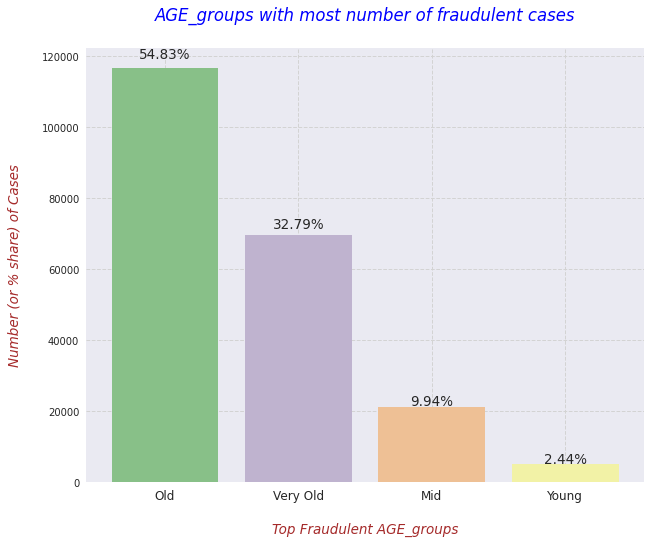

In [416]:
print(tmp_only_frauds[['AGE_groups','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(10,8))
    fig = sns.barplot(data=tmp_only_frauds, x="AGE_groups", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=0)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent AGE_groups", fontdict=label_font_dict)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("AGE_groups with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the percentage of Fraudulent Case Submissions for various Age Groups.

### **Q14. Does `Age_groups` have any relationship with maximum number of non-fraudulent cases?**

In [417]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

  AGE_groups  Num_of_cases  Percentage
0        Old        190334       55.10
1   Very Old        110885       32.10
2        Mid         35524       10.28
3      Young          8672        2.51 



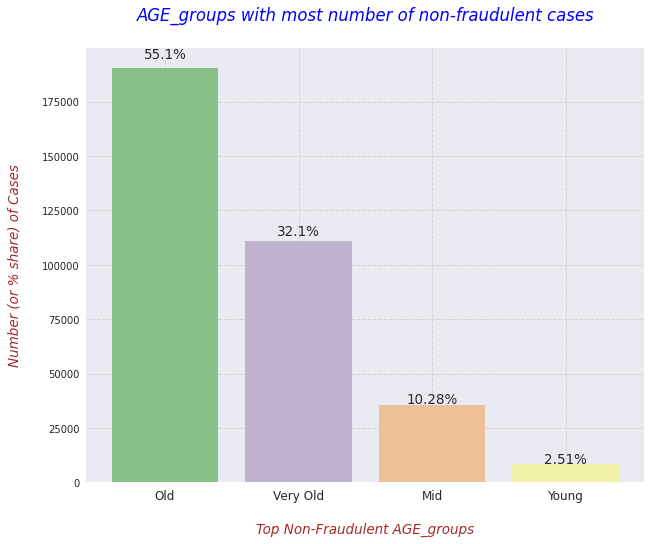

In [418]:
print(tmp_only_non_frauds[['AGE_groups','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(10,8))
    fig = sns.barplot(data=tmp_only_non_frauds, x="AGE_groups", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=0)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent AGE_groups", fontdict=label_font_dict)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("AGE_groups with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**

* The above plot shows us the percentage of Non-Fraudulent Case Submissions for various Age Groups.

* Main observation from the above 2 plots is that same `Age Groups` have similar percentages for false and no-false claims. Therefore, it feels like this feature might not be very useful.

### **Q15. Which are the Top-25 `States` with maximum number of fraudulent cases?**

In [419]:
tmp = pd.DataFrame(train_iobp_df.groupby(['State','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['State', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,State,Fraud?,Num_of_cases,Cases,Percentage
0,1,No,6715,345415,1.94
1,1,Yes,3525,212796,1.66
2,2,No,531,345415,0.15
3,2,Yes,207,212796,0.10
4,3,No,7314,345415,2.12


In [420]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

    State  Num_of_cases  Percentage
0       5         30335       14.26
1      10         17512        8.23
2      33         17492        8.22
3      39         11448        5.38
4      45         10135        4.76
5      31          9112        4.28
6      49          8613        4.05
7      23          8538        4.01
8      14          8509        4.00
9      22          7798        3.66
10     44          6709        3.15
11     36          6381        3.00
12     26          5301        2.49
13     50          4782        2.25
14     15          4635        2.18
15     34          4385        2.06
16     11          4123        1.94
17      6          3666        1.72
18      1          3525        1.66
19     24          3453        1.62
20     42          3180        1.49
21     16          2733        1.28
22     21          2576        1.21
23     46          2124        1.00
24      3          2030        0.95 



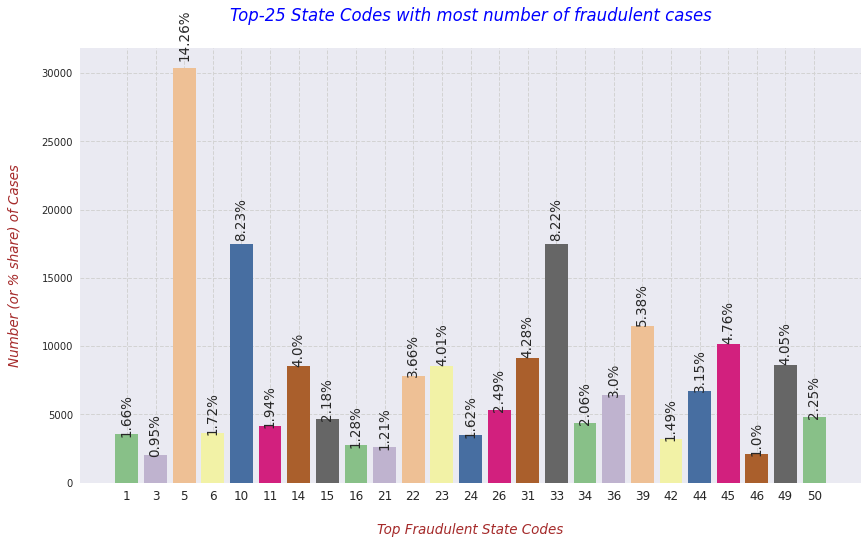

In [421]:
print(tmp_only_frauds[['State','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="State", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent State Codes", fontdict=label_font_dict)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 State Codes with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 State Codes with most percentage of Fraudulent Case Submissions.

### **Q16. What are the Top-25 `States` with maximum number of non-fraudulent cases?**

In [422]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

    State  Num_of_cases  Percentage
0      45         23887        6.92
1      10         21561        6.24
2       5         21015        6.08
3      33         17532        5.08
4      14         15908        4.61
5      36         14910        4.32
6      34         14520        4.20
7      11         12880        3.73
8      39         12803        3.71
9      23         12805        3.71
10     15          9578        2.77
11     21          8685        2.51
12     18          8643        2.50
13     52          7839        2.27
14     44          7709        2.23
15     26          7610        2.20
16     42          7311        2.12
17      3          7314        2.12
18     50          6958        2.01
19     31          6828        1.98
20      1          6715        1.94
21     49          6384        1.85
22     19          6230        1.80
23     25          5863        1.70
24     22          5826        1.69 



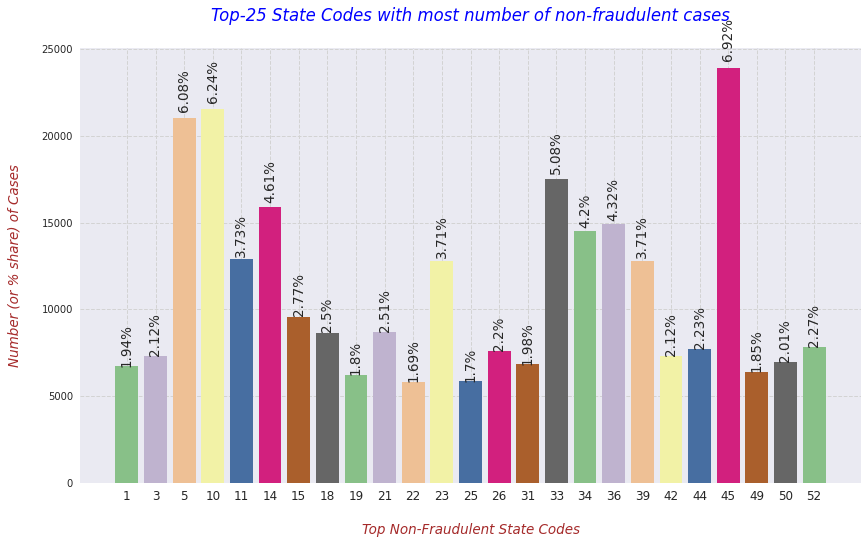

In [423]:
print(tmp_only_non_frauds[['State','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(14,8))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="State", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent State Codes", fontdict=label_font_dict)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 State Codes with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**

* The above plot shows us the Top-25 State Codes with most percentage of Non-Fraudulent Case Submissions.

* Main observation from the above 2 plots is that same `State Codes` have similar percentages for false and no-false claims. Therefore, it feels like this feature might not be very useful.

### **Q17. Which are the Top-25 `Country` with maximum number of fraudulent cases?**

In [424]:
tmp = pd.DataFrame(train_iobp_df.groupby(['County','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['County', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,County,Fraud?,Num_of_cases,Cases,Percentage
0,0,No,6584,345415,1.91
1,0,Yes,4897,212796,2.30
2,1,No,8,345415,0.00
3,1,Yes,4,212796,0.00
4,10,No,10750,345415,3.11


In [425]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

    County  Num_of_cases  Percentage
0      200         10078        4.74
1      470          7048        3.31
2      400          5962        2.80
3      590          5814        2.73
4        0          4897        2.30
5      160          4865        2.29
6      620          4704        2.21
7      130          4551        2.14
8      490          4477        2.10
9      170          4362        2.05
10     440          4314        2.03
11      20          4174        1.96
12      90          4079        1.92
13     150          3844        1.81
14     290          3725        1.75
15     510          3505        1.65
16     310          3437        1.62
17     390          3387        1.59
18     331          3284        1.54
19      10          3232        1.52
20     141          3202        1.50
21      60          3181        1.49
22     700          3020        1.42
23     250          2999        1.41
24     530          2871        1.35 



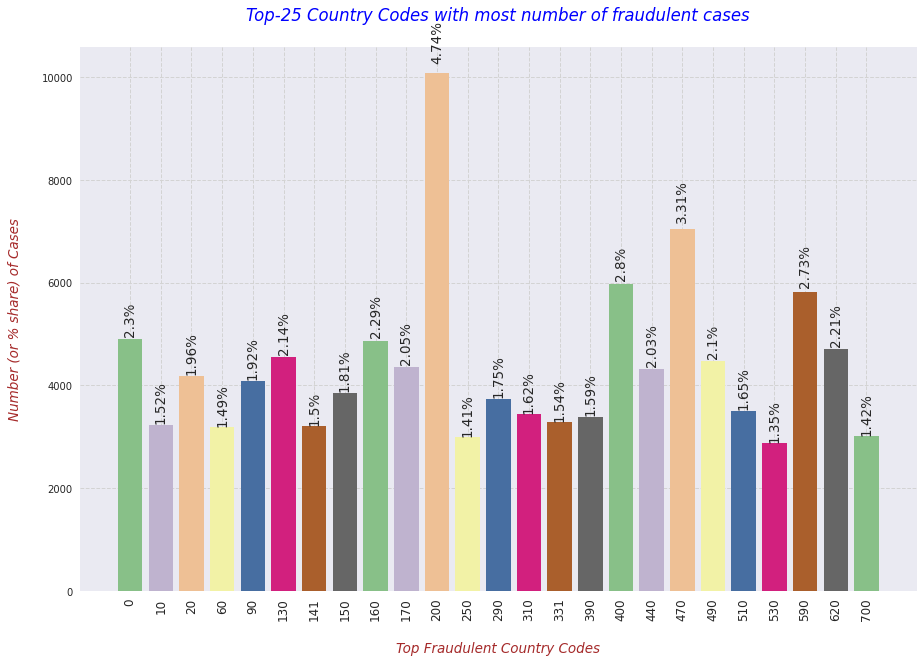

In [426]:
print(tmp_only_frauds[['County','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(15,10))
    fig = sns.barplot(data=tmp_only_frauds.iloc[0:25], x="County", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent Country Codes", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 Country Codes with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the Top-25 Country Codes with most percentage of Fraudulent Case Submissions.

### **Q18. What are the Top-25 `Country` with maximum number of non-fraudulent cases?**

In [427]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

    County  Num_of_cases  Percentage
0       10         10750        3.11
1       60          8814        2.55
2       20          8458        2.45
3       90          7007        2.03
4        0          6584        1.91
5      200          5879        1.70
6      150          5843        1.69
7      141          5793        1.68
8      400          5735        1.66
9      160          5668        1.64
10     310          5590        1.62
11      70          5487        1.59
12      50          5430        1.57
13     250          5385        1.56
14      40          5276        1.53
15     470          5230        1.51
16     480          5229        1.51
17     490          5010        1.45
18     100          4995        1.45
19     120          4936        1.43
20     240          4887        1.41
21     550          4513        1.31
22      30          4491        1.30
23     290          4417        1.28
24     390          4428        1.28 



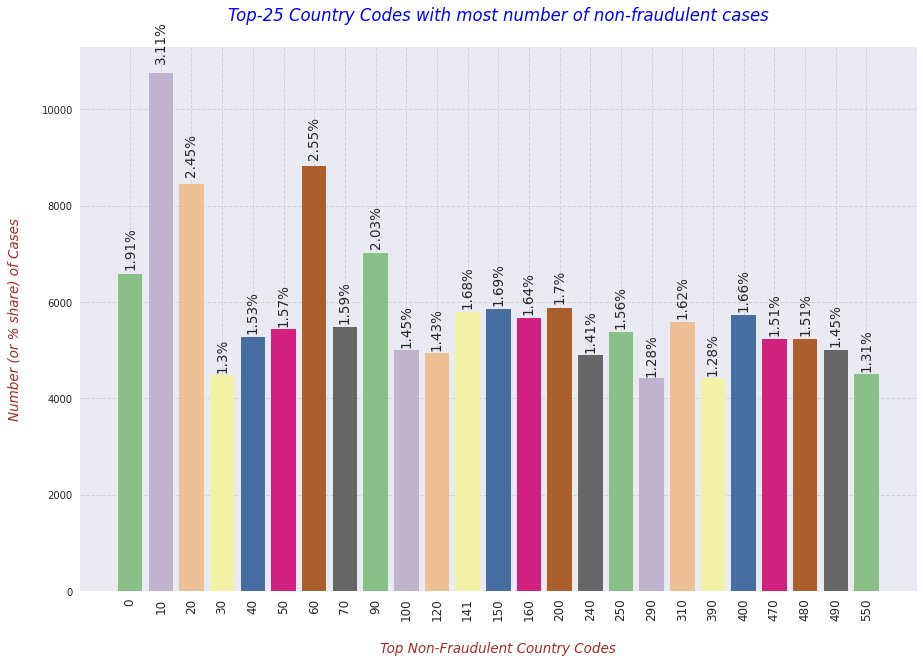

In [428]:
print(tmp_only_non_frauds[['County','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(15,10))
    fig = sns.barplot(data=tmp_only_non_frauds.iloc[0:25], x="County", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=90)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent Country Codes", fontdict=label_font_dict)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Top-25 Country Codes with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**

* The above plot shows us the Top-25 Country Codes with most percentage of Non-Fraudulent Case Submissions.

* Main observation from the above 2 plots is that same `Country Codes` have similar percentages for false and no-false claims. Therefore, it feels like this feature might not be very useful.

### **Q19. Does various `Human Races` have any relationship with maximum number of fraudulent cases?**

In [429]:
tmp = pd.DataFrame(train_iobp_df.groupby(['Race','PotentialFraud'])['BeneID'].count()).reset_index()
tmp.columns = ['Race', 'Fraud?', 'Num_of_cases']
tot_fraud_cases = tmp[tmp['Fraud?'] == 'Yes']['Num_of_cases'].sum()
tot_non_fraud_cases = tmp[tmp['Fraud?'] == 'No']['Num_of_cases'].sum()
tmp['Cases'] = tmp['Fraud?'].apply(lambda val: tot_non_fraud_cases if val == "No" else tot_fraud_cases)
tmp['Percentage'] = round(((tmp['Num_of_cases'] / tmp['Cases']) * 100),2)

tmp.head()

,Race,Fraud?,Num_of_cases,Cases,Percentage
0,1,No,292691,345415,84.74
1,1,Yes,178345,212796,83.81
2,2,No,35356,345415,10.24
3,2,Yes,20284,212796,9.53
4,3,No,10753,345415,3.11


In [430]:
tmp_only_frauds = tmp[tmp['Fraud?'] == 'Yes'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   Race  Num_of_cases  Percentage
0     1        178345       83.81
1     2         20284        9.53
2     3          8962        4.21
3     5          5205        2.45 



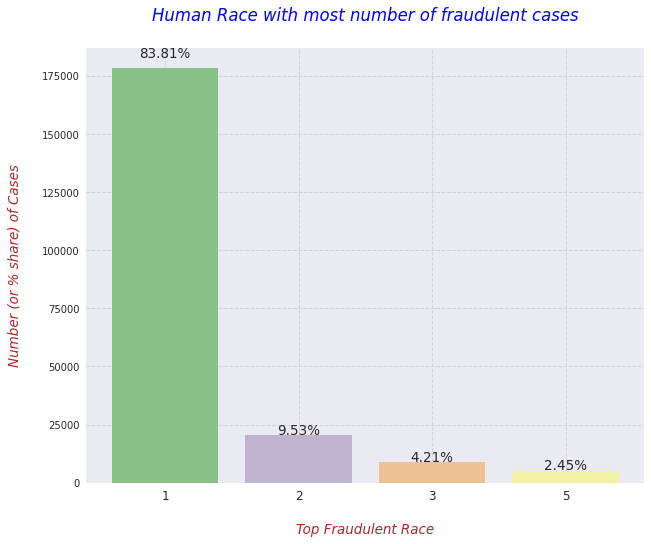

In [431]:
print(tmp_only_frauds[['Race','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(10,8))
    fig = sns.barplot(data=tmp_only_frauds, x="Race", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=0)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Fraudulent Race", fontdict=label_font_dict)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Human Race with most number of fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us the percentage of Fraudulent Case Submissions for various Human Races.

### **Q20. Does various `Human Races` have any relationship with maximum number of non-fraudulent cases?**

In [432]:
tmp_only_non_frauds = tmp[tmp['Fraud?'] == 'No'].sort_values(by=['Percentage'], ascending=False).reset_index(drop=True)

   Race  Num_of_cases  Percentage
0     1        292691       84.74
1     2         35356       10.24
2     3         10753        3.11
3     5          6615        1.92 



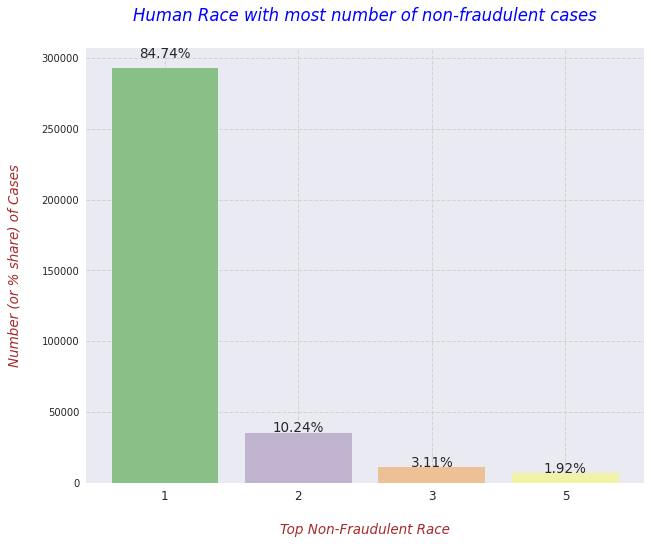

In [433]:
print(tmp_only_non_frauds[['Race','Num_of_cases','Percentage']].head(25), "\n")

with plt.style.context('seaborn'):
    plt.figure(figsize=(10,8))
    fig = sns.barplot(data=tmp_only_non_frauds, x="Race", y="Num_of_cases", palette='Accent')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_non_fraud_cases,2))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13.5, rotation=0)
    
    # Providing the labels and title to the graph
    plt.xlabel("\nTop Non-Fraudulent Race", fontdict=label_font_dict)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Number (or % share) of Cases\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Human Race with most number of non-fraudulent cases\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**

* The above plot shows us the percentage of Non-Fraudulent Case Submissions for various Human Races.

* Main observation from the above 2 plots is that same `Human Races` have similar percentages for false and no-false claims. Therefore, it feels like this feature might not be very useful.

# **Feature Engg - SET 1**

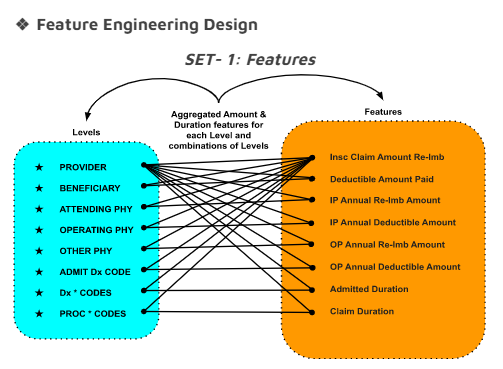

In [434]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Feat_Engg_SET1.png")

In [435]:
train_bene_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Beneficiarydata-1542865627584.csv")
train_ip_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Inpatientdata-1542865627584.csv")
train_op_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Outpatientdata-1542865627584.csv")
train_tgt_lbls_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train-1542865627584.csv")

## ***Exploring_Target_Labels_Data***

In [436]:
train_tgt_lbls_df.head()

,Provider,PotentialFraud
0,PRV51001,No
1,PRV51003,Yes
2,PRV51004,No
3,PRV51005,Yes
4,PRV51007,No


* **Check the Fraud and Non-Fraud Counts**

In [437]:
print("### The unique number of providers are {}. ###".format(train_tgt_lbls_df.shape[0]))

### The unique number of providers are 5410. ###


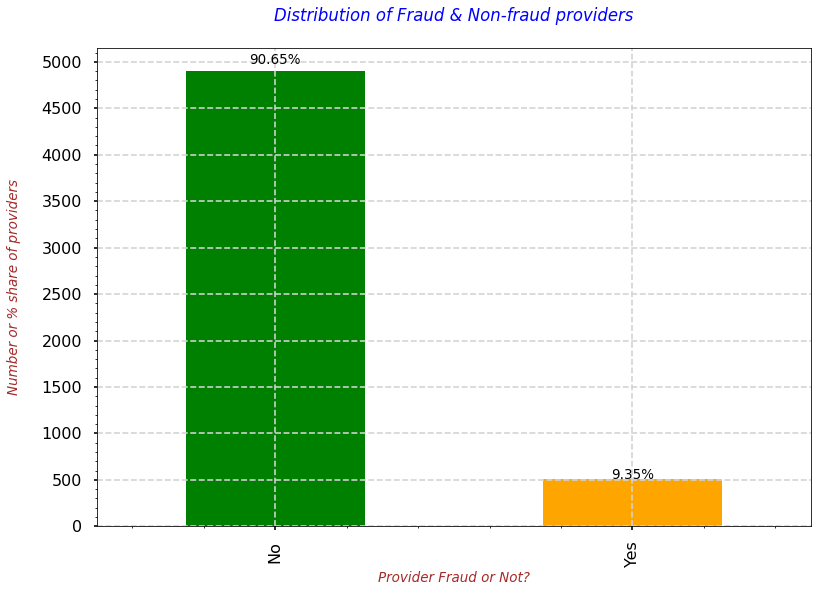

In [438]:
with plt.style.context('seaborn-poster'):
    fig = train_tgt_lbls_df["PotentialFraud"].value_counts().plot(kind='bar', color=['green','orange'])
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/train_tgt_lbls_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xlabel("Provider Fraud or Not?", fontdict=label_font_dict)
    plt.ylabel("Number or % share of providers\n", fontdict=label_font_dict)
    plt.yticks(np.arange(0,5100,500))
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of Fraud & Non-fraud providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can say that 90% of the providers are not frausters and only 9% of them are involved in frauds.

### **Adding `New Feature - 1` :: `Admitted` or `Not Admitted` indicator in IP and OP Dataset**

* **Adding in IP Dataset**

In [439]:
train_ip_df["Admitted?"] = 1

In [440]:
train_ip_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,...,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,Admitted?
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,...,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,...,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,...,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,...,7843,32723,V1041,4254,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,...,34400,5856,42732,486,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN,1


* **Adding in OP Dataset**

In [441]:
train_op_df["Admitted?"] = 0

In [442]:
train_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DeductibleAmtPaid,ClmAdmitDiagnosisCode,Admitted?
0,BENE11002,CLM624349,2009-10-11,2009-10-11,PRV56011,30,PHY326117,NaN,NaN,78943,V5866,V1272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,56409,0
1,BENE11003,CLM189947,2009-02-12,2009-02-12,PRV57610,80,PHY362868,NaN,NaN,6115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,79380,0
2,BENE11003,CLM438021,2009-06-27,2009-06-27,PRV57595,10,PHY328821,NaN,NaN,2723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
3,BENE11004,CLM121801,2009-01-06,2009-01-06,PRV56011,40,PHY334319,NaN,NaN,71988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
4,BENE11004,CLM150998,2009-01-22,2009-01-22,PRV56011,200,PHY403831,NaN,NaN,82382,30000,72887,4280,7197,V4577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,71947,0


### **Merging the Datasets**

In [443]:
# Commom columns must be 28
common_cols = [col for col in train_ip_df.columns if col in train_op_df.columns]
len(common_cols)

28

In [444]:
# Merging the IP and OP dataset on the basis of common columns
train_ip_op_df = pd.merge(left=train_ip_df, right=train_op_df, left_on=common_cols, right_on=common_cols, how="outer")
train_ip_op_df.shape

(558211, 31)

In [445]:
train_ip_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,...,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,Admitted?
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,...,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,...,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.0,NaN,NaN,NaN,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,...,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,...,7843,32723,V1041,4254,25062,40390,4019,NaN,331.0,NaN,NaN,NaN,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,...,34400,5856,42732,486,5119,29620,20300,NaN,3893.0,NaN,NaN,NaN,NaN,NaN,1


### **Merging the IP_OP Dataset with BENE Data**

In [446]:
# Joining the IP_OP dataset with the BENE data
train_ip_op_bene_df = pd.merge(left=train_ip_op_df, right=train_bene_df, left_on='BeneID', right_on='BeneID',how='inner')
train_ip_op_bene_df.shape

(558211, 55)

### **Merging the IP_OP_BENE Dataset with PROVIDER level Tgt Labels Data**

In [447]:
# Joining the IP_OP_BENE dataset with the Tgt Label Provider Data
train_iobp_df = pd.merge(left=train_ip_op_bene_df, right=train_tgt_lbls_df, left_on='Provider', right_on='Provider',how='inner')
train_iobp_df.shape

(558211, 56)

### **Entire Dataset**

In [448]:
train_iobp_df.shape

(558211, 56)

In [449]:
# Unique Providers
train_iobp_df["Provider"].nunique()

5410

In [450]:
# Unique Claim numbers
train_iobp_df["ClaimID"].nunique()

558211

In [451]:
# Joining with the PRV Tgt Labels
prvs_claims_df = pd.DataFrame(train_iobp_df.groupby(['Provider'])['ClaimID'].count()).reset_index()
prvs_claims_tgt_lbls_df = pd.merge(left=prvs_claims_df, right=train_tgt_lbls_df, on='Provider', how='inner')
prvs_claims_tgt_lbls_df

,Provider,ClaimID,PotentialFraud
0,PRV51001,25,No
1,PRV51003,132,Yes
2,PRV51004,149,No
3,PRV51005,1165,Yes
4,PRV51007,72,No
...,...,...,...
5405,PRV57759,28,No
5406,PRV57760,22,No
5407,PRV57761,82,No
5408,PRV57762,1,No


- **Fraud Count at Claims level**

     PotentialFraud
No           345415
Yes          212796 



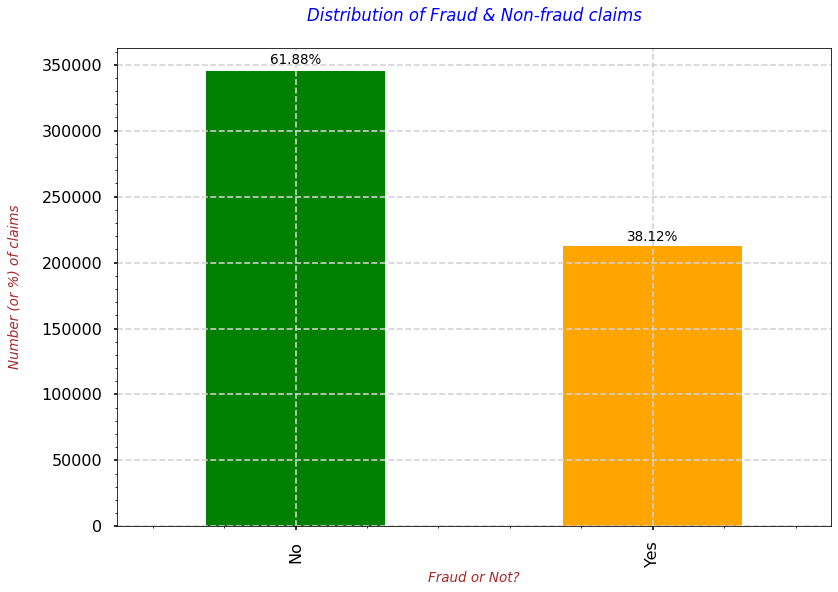

In [452]:
print(pd.DataFrame(train_iobp_df['PotentialFraud'].value_counts()), "\n")

with plt.style.context('seaborn-poster'):
    fig = train_iobp_df['PotentialFraud'].value_counts().plot(kind='bar', color=['green','orange'])
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/train_iobp_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xlabel("Fraud or Not?", fontdict=label_font_dict)
    plt.ylabel("Number (or %) of claims\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of Fraud & Non-fraud claims\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us that, 62% of claims are Non-Fraud and 32% of them are Fraudulent. 
    * By looking at the percentages we may say that there is a class-imbalance problem but after looking at the number of records it doesn't seem to be a severe class-imbalance problem. 
        * So, I'll try some class balancing techniques only after training a baseline model w/o any synthetic or class weighting techniques.

## **Feature Engineering**
**`Let's create some features`**

### **Adding `New Feature - 2` :: `Is_Alive?`**

    - Is Alive? = No if DOD is NaN else Yes

In [453]:
train_iobp_df['DOB'] = pd.to_datetime(train_iobp_df['DOB'], format="%Y-%m-%d")
train_iobp_df['DOD'] = pd.to_datetime(train_iobp_df['DOD'], format="%Y-%m-%d")

In [454]:
train_iobp_df['Is_Alive?'] = train_iobp_df['DOD'].apply(lambda val: 'No' if val != val else 'Yes')

In [455]:
train_iobp_df['Is_Alive?'].value_counts()

No     554080
Yes      4131
Name: Is_Alive?, dtype: int64

### **Adding `New Feature - 3` :: `Claim_Duration`**
    
    - Claim Duration = Claim End Date - Claim Start Date

In [456]:
train_iobp_df['ClaimStartDt'] = pd.to_datetime(train_iobp_df['ClaimStartDt'], format="%Y-%m-%d")
train_iobp_df['ClaimEndDt'] = pd.to_datetime(train_iobp_df['ClaimEndDt'], format="%Y-%m-%d")

train_iobp_df['Claim_Duration'] = (train_iobp_df['ClaimEndDt'] - train_iobp_df['ClaimStartDt']).dt.days

### **Adding `New Feature - 4` :: `Admitted_Duration`**

    - Admitted Duration = Discharge Date - Admission Date

In [457]:
train_iobp_df['AdmissionDt'] = pd.to_datetime(train_iobp_df['AdmissionDt'], format="%Y-%m-%d")
train_iobp_df['DischargeDt'] = pd.to_datetime(train_iobp_df['DischargeDt'], format="%Y-%m-%d")

train_iobp_df['Admitted_Duration'] = (train_iobp_df['DischargeDt'] - train_iobp_df['AdmissionDt']).dt.days

### **Adding `New Feature - 5` :: `Bene_Age`**

    - Bene Age = DOD - DOB (if DOD is Null then replace it with MAX date in DOD)

In [458]:
# Filling the Null values as MAX Date of Death in the Dataset
train_iobp_df['DOD'].fillna(value=train_iobp_df['DOD'].max(), inplace=True)

In [459]:
train_iobp_df['Bene_Age'] = round(((train_iobp_df['DOD'] - train_iobp_df['DOB']).dt.days)/365,1)

### **Adding `New Feature - 6` :: `Att_Opr_Oth_Phy_Tot_Claims`**
    
   * It represents the total claims submitted by Attending, Operating and Other Physicians.
       
       * **`Reasoning`** :: The idea behind adding this feature is to see whether a total of physicians claims submission will help in influencing the potential frauds.


   * **`Logic`** :: Att_Phy_tot_claims + Opr_Phy_tot_claims + Oth_Phy_tot_claims

- **`Att_Phy_tot_claims`** :: **Total Number of claims or cases seen by Attending Physician**

In [460]:
# Total unique number of Attended Physicians
print("Unique number of Attending Physicians present in the dataset are --> {}".format(train_iobp_df['AttendingPhysician'].nunique()))

Unique number of Attending Physicians present in the dataset are --> 82063


In [461]:
train_iobp_df['Att_Phy_tot_claims'] = train_iobp_df.groupby(['AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df['Att_Phy_tot_claims'].describe()

count    556703.000000
mean        138.634829
std         293.669039
min           1.000000
25%           7.000000
50%          33.000000
75%         116.000000
max        2534.000000
Name: Att_Phy_tot_claims, dtype: float64

- **`Opr_Phy_tot_claims`** :: **Total Number of claims or cases seen by Opearting Physician**

In [462]:
# Total unique number of Operating Physicians
print("Unique number of Operating Physicians present in the dataset are --> {}".format(train_iobp_df['OperatingPhysician'].nunique()))

Unique number of Operating Physicians present in the dataset are --> 35315


In [463]:
train_iobp_df['Opr_Phy_tot_claims'] = train_iobp_df.groupby(['OperatingPhysician'])['ClaimID'].transform('count')
train_iobp_df['Opr_Phy_tot_claims'].describe()

count    114447.000000
mean         27.204811
std          52.687759
min           1.000000
25%           2.000000
50%           8.000000
75%          25.000000
max         424.000000
Name: Opr_Phy_tot_claims, dtype: float64

- **`Oth_Phy_tot_claims`** :: **Total Number of claims or cases seen by Other Physician**

In [464]:
# Total unique number of Other Physicians
print("Unique number of Other Physicians present in the dataset are --> {}".format(train_iobp_df['OtherPhysician'].nunique()))

Unique number of Other Physicians present in the dataset are --> 46457


In [465]:
train_iobp_df['Oth_Phy_tot_claims'] = train_iobp_df.groupby(['OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df['Oth_Phy_tot_claims'].describe()

count    199736.000000
mean         90.207914
std         208.017235
min           1.000000
25%           3.000000
50%          15.000000
75%          60.000000
max        1247.000000
Name: Oth_Phy_tot_claims, dtype: float64

In [466]:
# Creating the combined feature
train_iobp_df['Att_Phy_tot_claims'].fillna(value=0, inplace=True)
train_iobp_df['Opr_Phy_tot_claims'].fillna(value=0, inplace=True)
train_iobp_df['Oth_Phy_tot_claims'].fillna(value=0, inplace=True)

In [467]:
train_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'] = train_iobp_df['Att_Phy_tot_claims'] + train_iobp_df['Opr_Phy_tot_claims'] + train_iobp_df['Oth_Phy_tot_claims']

In [468]:
train_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'].describe()

count    558211.000000
mean        176.115666
std         379.833208
min           0.000000
25%           9.000000
50%          41.000000
75%         144.000000
max        3372.000000
Name: Att_Opr_Oth_Phy_Tot_Claims, dtype: float64

In [469]:
train_iobp_df.drop(['Att_Phy_tot_claims', 'Opr_Phy_tot_claims', 'Oth_Phy_tot_claims'], axis=1, inplace=True)

### **Adding `New Feature - 7` :: `Prv_Tot_Att_Opr_Oth_Phys`**
    
   * It represents the total of all kind of physicians that a provider has interacted with.
       
       * **`Reasoning`** :: The idea behind adding this feature is to see whether a fraudulent provider interacts with higher or lower numberof of various physicians.


   * **`Logic`** :: Prv_Tot_Att_Phy + Prv_Tot_Opr_Phy + Prv_Tot_Oth_Phy

In [470]:
train_iobp_df["Prv_Tot_Att_Phy"] = train_iobp_df.groupby(['Provider'])['AttendingPhysician'].transform('count')
train_iobp_df["Prv_Tot_Opr_Phy"] = train_iobp_df.groupby(['Provider'])['OperatingPhysician'].transform('count')
train_iobp_df["Prv_Tot_Oth_Phy"] = train_iobp_df.groupby(['Provider'])['OtherPhysician'].transform('count')

In [471]:
# Nulls in the above features
train_iobp_df.isna().sum().tail(3)

Prv_Tot_Att_Phy    0
Prv_Tot_Opr_Phy    0
Prv_Tot_Oth_Phy    0
dtype: int64

In [472]:
train_iobp_df["Prv_Tot_Att_Phy"].describe()

count    558211.000000
mean        820.206469
std        1271.272090
min           1.000000
25%         122.000000
50%         359.000000
75%        1013.000000
max        8207.000000
Name: Prv_Tot_Att_Phy, dtype: float64

* The average number of attending physicians for providers are 820.

In [473]:
train_iobp_df["Prv_Tot_Opr_Phy"].describe()

count    558211.000000
mean        155.030023
std         228.266693
min           0.000000
25%          25.000000
50%          73.000000
75%         185.000000
max        1441.000000
Name: Prv_Tot_Opr_Phy, dtype: float64

* The average number of operating physicians for providers are 155.

In [474]:
train_iobp_df["Prv_Tot_Oth_Phy"].describe()

count    558211.000000
mean        306.781194
std         497.246984
min           0.000000
25%          37.000000
50%         120.000000
75%         381.000000
max        3209.000000
Name: Prv_Tot_Oth_Phy, dtype: float64

* The average number of other physicians for providers are 306.

In [475]:
train_iobp_df['Prv_Tot_Att_Opr_Oth_Phys'] = train_iobp_df['Prv_Tot_Att_Phy'] + train_iobp_df['Prv_Tot_Opr_Phy'] + train_iobp_df['Prv_Tot_Oth_Phy']

In [476]:
train_iobp_df["Prv_Tot_Att_Opr_Oth_Phys"].describe()

count    558211.000000
mean       1282.017685
std        1993.415913
min           1.000000
25%         192.000000
50%         560.000000
75%        1567.000000
max       12857.000000
Name: Prv_Tot_Att_Opr_Oth_Phys, dtype: float64

In [477]:
train_iobp_df.drop(['Prv_Tot_Att_Phy', 'Prv_Tot_Opr_Phy', 'Prv_Tot_Oth_Phy'], axis=1, inplace=True)

### **Adding `New Feature - 8` :: `Total Unique Claim Admit Codes used by a PROVIDER`**
   
   * **`Reasoning`** :: The idea behind adding this feature is to see how many unique number of `Claim Admit Diagnosis Codes` used by the Provider. 
       * As there may be a pattern that if a provider has used so many Admit Diagnosis Codes then it might increases or decreases the chances of fraud.

In [478]:
train_iobp_df['PRV_Tot_Admit_DCodes'] = train_iobp_df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

In [479]:
train_iobp_df["PRV_Tot_Admit_DCodes"].describe()

count    558211.000000
mean        109.227258
std         112.083238
min           0.000000
25%          28.000000
50%          72.000000
75%         152.000000
max         582.000000
Name: PRV_Tot_Admit_DCodes, dtype: float64

### **Adding `New Feature - 9` :: `Total Unique Number of Diagnosis Group Codes used by a PROVIDER`**
   
   * **`Reasoning`** :: The idea behind adding this feature is to see how many unique `Diagnosis Group Codes` used by the Provider.
       * As there may be a pattern that if a provider has used so many Diagnosis Group Codes then it might increases or decreases the chances of fraud.

In [480]:
train_iobp_df['PRV_Tot_DGrpCodes'] = train_iobp_df.groupby(['Provider'])['DiagnosisGroupCode'].transform('nunique')

In [481]:
train_iobp_df["PRV_Tot_DGrpCodes"].describe()

count    558211.000000
mean         22.234648
std          46.571715
min           0.000000
25%           0.000000
50%           0.000000
75%          21.000000
max         330.000000
Name: PRV_Tot_DGrpCodes, dtype: float64

### **Adding `New Feature - 10` :: `Total unique Date of Birth years of beneficiaries provided by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that if a provider has very high variability in the year of birth of patients then that might be one of the signs of medicare frauds.
       - Because generally private hospitals who treat poor patients make false claims on their names. For example, Nazia is 10 years old. But, according to a claim filed by Chhattisgarh-based Shaheed Hospital with the Rashtriya Swasthya Bima Yojna (RSBY), she has delivered a baby after a caesarean operation. Mukul (name changed) is only 7. But Agarwal Hospital, Raipur, has made a claim for removing cataract from his eyes.

Read more at:
https://economictimes.indiatimes.com/news/politics-and-nation/private-hospitals-perform-fake-surgeries-to-claim-thousands-in-insurance-cover/articleshow/16934229.cms?utm_source=contentofinterest&utm_medium=text&utm_campaign=cppst

In [482]:
train_iobp_df['DOB_Year'] = train_iobp_df['DOB'].dt.year

In [483]:
train_iobp_df['PRV_Tot_Unq_DOB_Years'] = train_iobp_df.groupby(['Provider'])['DOB_Year'].transform('nunique')

In [484]:
train_iobp_df['PRV_Tot_Unq_DOB_Years'].describe()

count    558211.000000
mean         50.615590
std          18.190988
min           1.000000
25%          38.000000
50%          54.000000
75%          67.000000
max          75.000000
Name: PRV_Tot_Unq_DOB_Years, dtype: float64

In [485]:
train_iobp_df.drop(['DOB_Year'], axis=1, inplace=True)

### **Adding `New Feature - 11` :: `Sum of patients age treated by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the sum of patients age treated by a provider is very high or low then it might influence the fraud.

In [486]:
train_iobp_df['PRV_Bene_Age_Sum'] = train_iobp_df.groupby(['Provider'])['Bene_Age'].transform('sum')

In [487]:
train_iobp_df['PRV_Bene_Age_Sum'].describe()

count    558211.000000
mean      60903.124044
std       95028.202759
min          34.300000
25%        9007.200000
50%       26310.800000
75%       74869.500000
max      617454.100000
Name: PRV_Bene_Age_Sum, dtype: float64

### **Adding `New Feature - 12` :: `Sum of Insc Claim Re-Imb Amount for a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the sum of claim re-imb amount for a provider is very high or low then it might influence the fraud.

In [488]:
train_iobp_df['PRV_Insc_Clm_ReImb_Amt'] = train_iobp_df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

In [489]:
train_iobp_df['PRV_Insc_Clm_ReImb_Amt'].describe()

count    5.582110e+05
mean     4.877429e+05
std      7.367223e+05
min      0.000000e+00
25%      6.369000e+04
50%      2.036000e+05
75%      5.969000e+05
max      5.996050e+06
Name: PRV_Insc_Clm_ReImb_Amt, dtype: float64

### **Adding `New Feature - 13` :: `Total number of RKD Patients seen by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the total number of RKD Patients seen by a Provider is very high or low then it might influence the fraud.

In [490]:
train_iobp_df['RenalDiseaseIndicator'] = train_iobp_df['RenalDiseaseIndicator'].apply(lambda val: 1 if val == "Y" else 0)

In [491]:
train_iobp_df['PRV_Tot_RKD_Patients'] = train_iobp_df.groupby(['Provider'])['RenalDiseaseIndicator'].transform('sum')

In [492]:
train_iobp_df['PRV_Tot_RKD_Patients'].describe()

count    558211.000000
mean        157.902616
std         233.828365
min           0.000000
25%          24.000000
50%          73.000000
75%         192.000000
max        1447.000000
Name: PRV_Tot_RKD_Patients, dtype: float64

In [493]:
# Dropping these 2 columns as there 99% of values are same
train_iobp_df.drop(['NoOfMonths_PartACov', 'NoOfMonths_PartBCov'], axis=1, inplace=True)

In [494]:
# Filling null values in Admitted_Duration with 0 (as it will represent the patients were admitted for 0 days)
train_iobp_df['Admitted_Duration'].fillna(value=0,inplace=True)

In [495]:
train_iobp_df.shape

(558211, 66)

### **Adding `Aggregated Features` :: For every possible level**
    - Provider
    - Beneficiary
    - Attending Physician
    - Operating Physician
    - Other Physician and etc..
   
   
   * **`Reasoning`** :: The idea behind adding the aggregated features at different levels is that fraud can be done by an individual or group of individuals or entities involved in the claim process.

In [496]:
# PRV Aggregate features
train_iobp_df["PRV_CoPayment"] = train_iobp_df.groupby('Provider')['DeductibleAmtPaid'].transform('sum')
train_iobp_df["PRV_IP_Annual_ReImb_Amt"] = train_iobp_df.groupby('Provider')['IPAnnualReimbursementAmt'].transform('sum')
train_iobp_df["PRV_IP_Annual_Ded_Amt"] = train_iobp_df.groupby('Provider')['IPAnnualDeductibleAmt'].transform('sum')
train_iobp_df["PRV_OP_Annual_ReImb_Amt"] = train_iobp_df.groupby('Provider')['OPAnnualReimbursementAmt'].transform('sum')
train_iobp_df["PRV_OP_Annual_Ded_Amt"] = train_iobp_df.groupby('Provider')['OPAnnualDeductibleAmt'].transform('sum')
train_iobp_df["PRV_Admit_Duration"] = train_iobp_df.groupby('Provider')['Admitted_Duration'].transform('sum')
train_iobp_df["PRV_Claim_Duration"] = train_iobp_df.groupby('Provider')['Claim_Duration'].transform('sum')

In [497]:
def create_agg_feats(grp_col, feat_name, operation='sum'):
    """
    Description :: This function is created for adding the aggregated features in the dataset for every level like:
        - Beneficiary
        - Attending Physician
        - Operating Physician
        - Other Physician and etc..
        
    Input Parameters :: It accepts below inputs:
        - grp_col : `str`
            - It represents the feature or level at which you want to perform the aggregation.
        
        - feat_name : `str`
            - It represents the feature whose aggregated aspect you want to capture.
        
        - operation : `str`
            - It represents the aggregation operation you want to perform.(By default it is SUM)
    """
    feat_1 = feat_name + "_Insc_ReImb_Amt"
    train_iobp_df[feat_1] = train_iobp_df.groupby(grp_col)['InscClaimAmtReimbursed'].transform(operation)

    feat_2 = feat_name + "_CoPayment"
    train_iobp_df[feat_2] = train_iobp_df.groupby(grp_col)['DeductibleAmtPaid'].transform(operation)

    feat_3 = feat_name + "_IP_Annual_ReImb_Amt"
    train_iobp_df[feat_3] = train_iobp_df.groupby(grp_col)['IPAnnualReimbursementAmt'].transform(operation)

    feat_4 = feat_name + "_IP_Annual_Ded_Amt"
    train_iobp_df[feat_4] = train_iobp_df.groupby(grp_col)['IPAnnualDeductibleAmt'].transform(operation)

    feat_5 = feat_name + "_OP_Annual_ReImb_Amt"
    train_iobp_df[feat_5] = train_iobp_df.groupby(grp_col)['OPAnnualReimbursementAmt'].transform(operation)

    feat_6 = feat_name + "_OP_Annual_Ded_Amt"
    train_iobp_df[feat_6] = train_iobp_df.groupby(grp_col)['OPAnnualDeductibleAmt'].transform(operation)

    feat_7 = feat_name + "_Admit_Duration"
    train_iobp_df[feat_7] = train_iobp_df.groupby(grp_col)['Admitted_Duration'].transform(operation)

    feat_8 = feat_name + "_Claim_Duration"
    train_iobp_df[feat_8] = train_iobp_df.groupby(grp_col)['Claim_Duration'].transform(operation)

In [498]:
# BENE, PHYs, Diagnosis Admit and Group Codes columns
create_agg_feats(grp_col='BeneID', feat_name="BENE")
create_agg_feats(grp_col='AttendingPhysician', feat_name="ATT_PHY")
create_agg_feats(grp_col='OperatingPhysician', feat_name="OPT_PHY")
create_agg_feats(grp_col='OtherPhysician', feat_name="OTH_PHY")
create_agg_feats(grp_col='ClmAdmitDiagnosisCode', feat_name="Claim_Admit_Diag_Code")
create_agg_feats(grp_col='DiagnosisGroupCode', feat_name="Diag_GCode")

In [499]:
# Dropping these 3 columns as there 99% of values are same
train_iobp_df.drop(['ClmProcedureCode_4', 'ClmProcedureCode_5', 'ClmProcedureCode_6'], axis=1, inplace=True)

In [500]:
# Diagnosis Codes columns
create_agg_feats(grp_col='ClmDiagnosisCode_1', feat_name="Claim_DiagCode1")
create_agg_feats(grp_col='ClmDiagnosisCode_2', feat_name="Claim_DiagCode2")
create_agg_feats(grp_col='ClmDiagnosisCode_3', feat_name="Claim_DiagCode3")
create_agg_feats(grp_col='ClmDiagnosisCode_4', feat_name="Claim_DiagCode4")
create_agg_feats(grp_col='ClmDiagnosisCode_5', feat_name="Claim_DiagCode5")
create_agg_feats(grp_col='ClmDiagnosisCode_6', feat_name="Claim_DiagCode6")
create_agg_feats(grp_col='ClmDiagnosisCode_7', feat_name="Claim_DiagCode7")
create_agg_feats(grp_col='ClmDiagnosisCode_8', feat_name="Claim_DiagCode8")
create_agg_feats(grp_col='ClmDiagnosisCode_9', feat_name="Claim_DiagCode9")
create_agg_feats(grp_col='ClmDiagnosisCode_10', feat_name="Claim_DiagCode10")

# Medical Procedure Codes columns
create_agg_feats(grp_col='ClmProcedureCode_1', feat_name="Claim_ProcCode1")
create_agg_feats(grp_col='ClmProcedureCode_2', feat_name="Claim_ProcCode2")
create_agg_feats(grp_col='ClmProcedureCode_3', feat_name="Claim_ProcCode3")

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:23: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, u

In [501]:
train_iobp_df.shape

(558211, 222)

### **Adding `Aggregated Features` :: Based on various combinations of different levels in order to introduce their interactions in the dataset.**
    - PROVIDER <--> BENE <--> PHYSICIANS
    - PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> DIAGNOSIS CODES <--> PROCEDURE CODES and etc..

   * **`Reasoning`** :: The idea behind adding the aggregated features based on the combinations of various features is that many parties or entities might work together to make a medicare fraud. Thus, we need to capture interactions among them to better classify the fraudsters.

In [502]:
# PROVIDER <--> other features :: To get claim counts
train_iobp_df["ClmCount_Provider"]=train_iobp_df.groupby(['Provider'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID"]=train_iobp_df.groupby(['Provider','BeneID'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_AttendingPhysician"]=train_iobp_df.groupby(['Provider','AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_OtherPhysician"]=train_iobp_df.groupby(['Provider','OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_OperatingPhysician"]=train_iobp_df.groupby(['Provider','OperatingPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmAdmitDiagnosisCode"]=train_iobp_df.groupby(['Provider','ClmAdmitDiagnosisCode'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_1"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_2"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_3"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_4"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_4'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_5"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_5'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_6"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_6'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_7"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_7'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_8"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_8'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_9"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_9'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_ClmDiagnosisCode_10"]=train_iobp_df.groupby(['Provider','ClmDiagnosisCode_10'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_DiagnosisGroupCode"]=train_iobp_df.groupby(['Provider','DiagnosisGroupCode'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> PHYSICIANS :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> PROCEDURE CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmProcedureCode_3'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> PROCEDURE CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmProcedureCode_3'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> PROCEDURE CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmProcedureCode_3'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> DIAGNOSIS CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_1"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_2"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_3"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_4"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_4'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_5"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_5'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_6"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_6'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_7"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_7'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_8"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_8'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_9"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_9'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician_ClmDiagnosisCode_10"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician','ClmDiagnosisCode_10'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> DIAGNOSIS CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_1"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_2"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_3"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_4"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_4'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_5"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_5'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_6"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_6'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_7"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_7'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_8"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_8'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_9"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_9'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician_ClmDiagnosisCode_10"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician','ClmDiagnosisCode_10'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> DIAGNOSIS CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_1"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_2"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_3"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_4"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_4'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_5"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_5'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_6"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_6'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_7"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_7'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_8"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_8'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_9"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_9'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician_ClmDiagnosisCode_10"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician','ClmDiagnosisCode_10'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> PROCEDURE CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmProcedureCode_3'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> DIAGNOSIS CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_4"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_4'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_5"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_5'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_6"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_6'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_7"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_7'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_8"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_8'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_9"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_9'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_10"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_10'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> DIAGNOSIS CODES <--> PROCEDURE CODES :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_1_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_1','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_1_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_1','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_1_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_1','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_2_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_2','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_2_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_2','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_2_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_2','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_3_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_3','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_3_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_3','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_3_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_3','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_4_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_4','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_4_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_4','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_4_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_4','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_5_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_5','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_5_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_5','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_5_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_5','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_6_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_6','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_6_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_6','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_6_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_6','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_7_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_7','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_7_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_7','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_7_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_7','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_8','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_8','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_8','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_9','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_9','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_9','ClmProcedureCode_3'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_1"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_10','ClmProcedureCode_1'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_2"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_10','ClmProcedureCode_2'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_3"]=train_iobp_df.groupby(['Provider','BeneID','ClmDiagnosisCode_10','ClmProcedureCode_3'])['ClaimID'].transform('count')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all

In [503]:
train_iobp_df.shape

(558211, 327)

In [504]:
# Removing unwanted columns
remove_unwanted_columns=['BeneID', 'ClaimID', 'ClaimStartDt','ClaimEndDt','AttendingPhysician','OperatingPhysician', 'OtherPhysician',
                      'AdmissionDt', 'ClmAdmitDiagnosisCode', 'DischargeDt', 'DiagnosisGroupCode',
                      'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 
                      'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10',
                      'ClmProcedureCode_1', 'ClmProcedureCode_2', 'ClmProcedureCode_3', 'DOB', 'DOD', 'State', 'County']

train_iobp_df.drop(columns=remove_unwanted_columns, axis=1, inplace=True)

In [505]:
train_iobp_df.shape

(558211, 299)

In [506]:
# Filling Nulls in Deductible Amt Paid by Patient
train_iobp_df['DeductibleAmtPaid'].fillna(value=0, inplace=True)

In [507]:
# Binary encoding the categorical features --> 0 means No and 1 means Yes
train_iobp_df['Gender'] = train_iobp_df['Gender'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['PotentialFraud'] = train_iobp_df['PotentialFraud'].apply(lambda val: 0 if val == "No" else 1)
train_iobp_df['Is_Alive?'] = train_iobp_df['Is_Alive?'].apply(lambda val: 0 if val == "No" else 1)

train_iobp_df['ChronicCond_Alzheimer'] = train_iobp_df['ChronicCond_Alzheimer'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Heartfailure'] = train_iobp_df['ChronicCond_Heartfailure'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_KidneyDisease'] = train_iobp_df['ChronicCond_KidneyDisease'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Cancer'] = train_iobp_df['ChronicCond_Cancer'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_ObstrPulmonary'] = train_iobp_df['ChronicCond_ObstrPulmonary'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Depression'] = train_iobp_df['ChronicCond_Depression'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Diabetes'] = train_iobp_df['ChronicCond_Diabetes'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_IschemicHeart'] = train_iobp_df['ChronicCond_IschemicHeart'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Osteoporasis'] = train_iobp_df['ChronicCond_Osteoporasis'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_rheumatoidarthritis'] = train_iobp_df['ChronicCond_rheumatoidarthritis'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_stroke'] = train_iobp_df['ChronicCond_stroke'].apply(lambda val: 0 if val == 2 else val)

In [508]:
# Encoding the Categorical features
train_iobp_df = pd.get_dummies(train_iobp_df,columns=['Gender', 'Race', 'Admitted?', 'Is_Alive?'], drop_first=True)

In [509]:
pd.set_option('display.max_rows',310)

In [510]:
# Checking Nulls in the features
pd.DataFrame(train_iobp_df.isna().sum())

,0
Provider,0
InscClaimAmtReimbursed,0
DeductibleAmtPaid,0
RenalDiseaseIndicator,0
ChronicCond_Alzheimer,0
ChronicCond_Heartfailure,0
ChronicCond_KidneyDisease,0
ChronicCond_Cancer,0
ChronicCond_ObstrPulmonary,0
ChronicCond_Depression,0


In [511]:
# Filling Nulls in the aggregated features
train_iobp_df.fillna(value=0, inplace=True)

In [512]:
# Checking Nulls in the features
pd.DataFrame(train_iobp_df.isna().sum())

,0
Provider,0
InscClaimAmtReimbursed,0
DeductibleAmtPaid,0
RenalDiseaseIndicator,0
ChronicCond_Alzheimer,0
ChronicCond_Heartfailure,0
ChronicCond_KidneyDisease,0
ChronicCond_Cancer,0
ChronicCond_ObstrPulmonary,0
ChronicCond_Depression,0


In [513]:
# Checking the Datatypes of the features
train_iobp_df.dtypes

Provider                                                            object
InscClaimAmtReimbursed                                               int64
DeductibleAmtPaid                                                  float64
RenalDiseaseIndicator                                                int64
ChronicCond_Alzheimer                                                int64
ChronicCond_Heartfailure                                             int64
ChronicCond_KidneyDisease                                            int64
ChronicCond_Cancer                                                   int64
ChronicCond_ObstrPulmonary                                           int64
ChronicCond_Depression                                               int64
ChronicCond_Diabetes                                                 int64
ChronicCond_IschemicHeart                                            int64
ChronicCond_Osteoporasis                                             int64
ChronicCond_rheumatoidart

## **Entire Data `Aggregation` :: At provider level**

   * **`Reasoning`** :: The main objective is to predict the `Medicare Provider Fraud`. Thus, here we are grouping the entire dataset at the level of PROVIDER and taking SUM of all the columns to create n-dimensional representation of each provider.

In [514]:
train_iobp_df = train_iobp_df.groupby(['Provider','PotentialFraud'],as_index=False).agg('sum')

In [515]:
train_iobp_df.shape

(5410, 301)

# **`Data Seggregation`**

## **Creating separate sets of independent features and target column.**

   * **`Reasoning`** :: These sets will be used for training the ML Models.

In [516]:
X = train_iobp_df.drop(axis=1, columns=['Provider','PotentialFraud'])
y = train_iobp_df['PotentialFraud']

In [517]:
X.shape, type(X), y.shape, type(y)

((5410, 299), pandas.core.frame.DataFrame, (5410,), pandas.core.series.Series)

In [518]:
X.head()

,InscClaimAmtReimbursed,DeductibleAmtPaid,RenalDiseaseIndicator,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,...,ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_1,ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_2,ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_3,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_1,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_2,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_3,ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_1,ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_2,ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_3,Gender_1,Race_2,Race_3,Race_5,Admitted?_1,Is_Alive?_1
0,104640,5340.0,8,15,19,17,5,10,9,21,23,6,8,6,440150,...,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,9.0,4.0,0.0,0.0,5.0,0.0
1,605670,66286.0,29,56,80,64,10,41,54,100,112,33,38,12,999000,...,31.0,7.0,0.0,28.0,7.0,0.0,3.0,1.0,0.0,54.0,24.0,0.0,1.0,62.0,1.0
2,52170,310.0,23,64,88,50,16,41,63,105,108,49,46,17,648430,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,24.0,5.0,0.0,0.0,1.0
3,280910,3700.0,259,426,680,507,165,295,485,799,895,344,331,124,4221950,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,511.0,262.0,10.0,0.0,0.0,4.0
4,33710,3264.0,11,26,40,22,12,16,29,49,51,21,22,12,219600,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,14.0,0.0,0.0,3.0,1.0


In [519]:
y.head()

0    0
1    1
2    0
3    1
4    0
Name: PotentialFraud, dtype: int64

## **`Train Test Split` :: Creating TRAIN and VALIDATION sets.**

   * **`Reasoning`** :: These sets will be used for measurng the performance of ML Models.

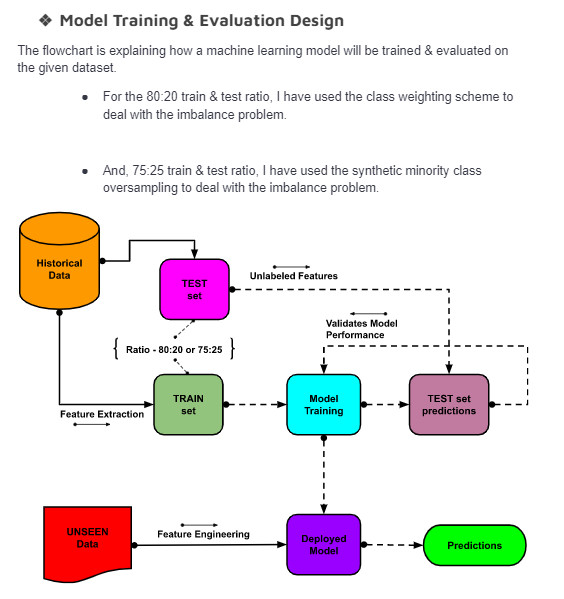

In [520]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Model_Training_and_Validation_Strategy.png")

In [521]:
from sklearn.model_selection import train_test_split as tts

In [522]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.20, stratify=y, random_state=39)

In [523]:
# Checking shape of each set
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4328, 299), (1082, 299), (4328,), (1082,))

In [524]:
# Checking count of tgt labels in y_train
y_train.value_counts()

0    3923
1     405
Name: PotentialFraud, dtype: int64

In [525]:
# Checking count of tgt labels in y_test
y_test.value_counts()

0    981
1    101
Name: PotentialFraud, dtype: int64

# **`Standardizing TRAIN & TEST sets`** 
## **Bringing every feature into the same scale.**

In [526]:
from sklearn.preprocessing import RobustScaler

In [527]:
# Standardize the data (train and test)
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)
X_train_std = robust_scaler.transform(X_train)
X_test_std = robust_scaler.transform(X_test)

# **`Baseline Model Training`**

### **`Using Class Weighting Scheme`**

#### **`1. Logistic Regression`**

In [528]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.calibration import CalibratedClassifierCV

In [529]:
# Training the model with all features and hyper-parameterized values
log_reg_1 = LogisticRegression(C=0.0316228, penalty='l1',
                               fit_intercept=True, solver='liblinear', tol=0.0001, max_iter=500, 
                               class_weight='balanced',
                               verbose=0, 
                               intercept_scaling=1.0,
                               multi_class='auto',
                               random_state=49)

log_reg_1.fit(X_train_std, y_train)

LogisticRegression(C=0.0316228, class_weight='balanced', intercept_scaling=1.0,
                   max_iter=500, penalty='l1', random_state=49,
                   solver='liblinear')

In [530]:
def pred_prob(clf, data): 
    """
    Description :: This function is created for storing the predicted probabability using the trained model.
    
    Input :: It accepts below input parameters :
      - clf : Trained model classifier
      - data : Dataset for which we want to generate the predictions
    """
    y_pred = clf.predict_proba(data)[:,1]
    return y_pred

def draw_roc(train_fpr, train_tpr, test_fpr, test_tpr):
    """
    Description :: This function is created for calculating the AUC score on train and test data. And, plotting the ROC curve.
    
    Input :: It accepts below input parameters :
      - train_fpr : Train False +ve rate
      - train_tpr : Train True +ve rate
      - test_fpr : Test False +ve rate
      - test_tpr : Test True +ve rate
    """
    # calculate auc for train and test
    train_auc = auc(train_fpr, train_tpr)
    test_auc = auc(test_fpr, test_tpr)
    with plt.style.context('seaborn-poster'):
      plt.plot(train_fpr, train_tpr, label="Train AUC ="+"{:.4f}".format(train_auc), color='blue')
      plt.plot(test_fpr, test_tpr, label="Test AUC ="+"{:.4f}".format(test_auc), color='red')
      plt.legend()
      plt.xlabel("False Positive Rate(FPR)", fontdict=label_font_dict)
      plt.ylabel("True Positive Rate(TPR)", fontdict=label_font_dict)
      plt.title("Area Under Curve", fontdict=title_font_dict)
      plt.grid(b=True, which='major', color='lightgrey', linestyle='--')
      plt.minorticks_on()
      plt.show()
    
def find_best_threshold(threshold, fpr, tpr):
    """
    Description :: This function is created for finding the best threshold value.
    """
    t = threshold[np.argmax(tpr * (1-fpr))]
    return t

def predict_with_best_t(proba, threshold):
    """
    Description :: This function is created for generating the predictions based on the best threshold value.
    """
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

def draw_confusion_matrix(best_t, x_train, x_test, y_train, y_test, y_train_pred, y_test_pred):
    """
    Description :: This function is created for plotting the confusion matrix of TRAIN and TEST sets.
    """
    fig, ax = plt.subplots(1,2, figsize=(20,6))

    train_prediction = predict_with_best_t(y_train_pred, best_t)
    cm = confusion_matrix(y_train, train_prediction)
    with plt.style.context('seaborn'):
        sns.heatmap(cm, annot=True, fmt='d', ax=ax[0], cmap='viridis')
        ax[0].set_title('Train Dataset Confusion Matrix', fontdict=title_font_dict)
        ax[0].set_xlabel("Predicted Label", fontdict=label_font_dict)
        ax[0].set_ylabel("Actual Label", fontdict=label_font_dict)

    test_prediction = predict_with_best_t(y_test_pred, best_t)
    cm = confusion_matrix(y_test, test_prediction)
    with plt.style.context('seaborn'):
        sns.heatmap(cm, annot=True, fmt='d', ax=ax[1], cmap='summer')
        ax[1].set_title('Test Dataset Confusion Matrix', fontdict=title_font_dict)
        ax[1].set_xlabel("Predicted Label", fontdict=label_font_dict)
        ax[1].set_ylabel("Actual Label", fontdict=label_font_dict)
    
    plt.show()
    
    return train_prediction, test_prediction

In [531]:
def validate_model(clf, x_train, x_test, y_train, y_test):
    """
    Description :: This function is created for performing the evaluation of the trained model.
    """
    # predict the probability of train data
    y_train_pred = pred_prob(clf, x_train)
    
    # predict the probability of test data
    y_test_pred = pred_prob(clf, x_test)
    
    # calculate tpr, fpr using roc_curve
    train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
    test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)
    
    # calculate auc for train and test
    train_auc = auc(train_fpr, train_tpr)
    print("### Train AUC = {}".format(train_auc))
    test_auc = auc(test_fpr, test_tpr)
    print("### Test AUC = {}".format(test_auc))
    
    # plotting the ROC curve
    draw_roc(train_fpr, train_tpr, test_fpr, test_tpr)
    
    # Best threshold value
    best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
    
    # Plotting the confusion matrices
    train_prediction, test_prediction = draw_confusion_matrix(best_t, x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)
    
    # Generating the F1-scores
    train_f1_score = f1_score(y_train, train_prediction)
    test_f1_score = f1_score(y_test, test_prediction)
    
    return test_auc, train_f1_score, test_f1_score, best_t

### Train AUC = 0.9471260027127136
### Test AUC = 0.9518373855734198


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


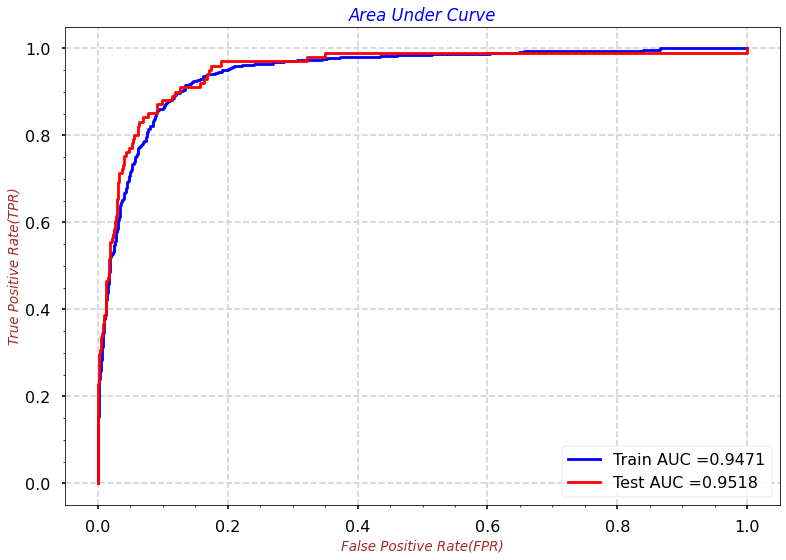

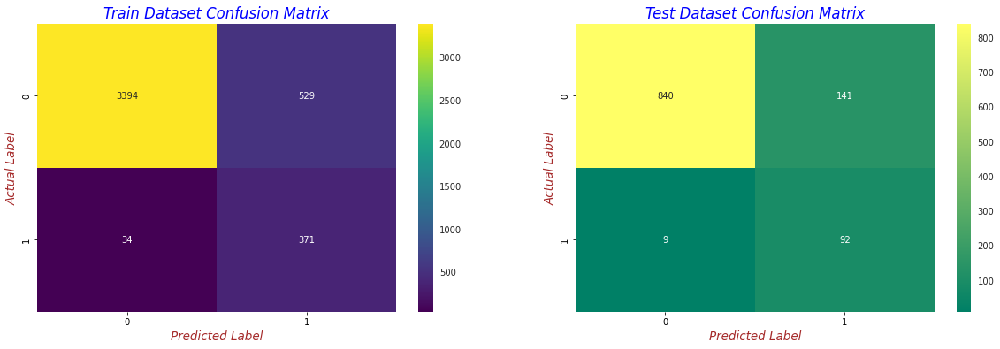



### Best Threshold = 0.3544
### Model AUC is : 0.9518
### Model Train F1 Score is : 0.5686
### Model Test F1 Score is : 0.5509


In [532]:
# Validate Logistic Regression model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(log_reg_1, X_train_std, X_test_std, y_train, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [533]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': log_reg_1.coef_[0]})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.548121
1,Admitted_Duration,0.548848
2,PRV_Tot_DGrpCodes,-0.037874
3,PRV_Tot_Unq_DOB_Years,-0.270709
4,PRV_Bene_Age_Sum,0.054760


In [534]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

In [535]:
top_15_neg_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Features'].iloc[0:15]
top_15_neg_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Importance_Model_1'].iloc[0:15]

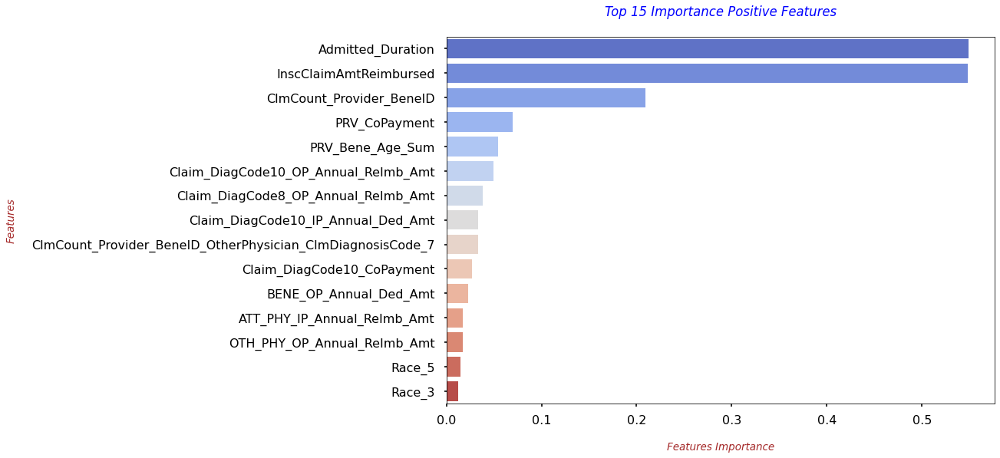

In [536]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

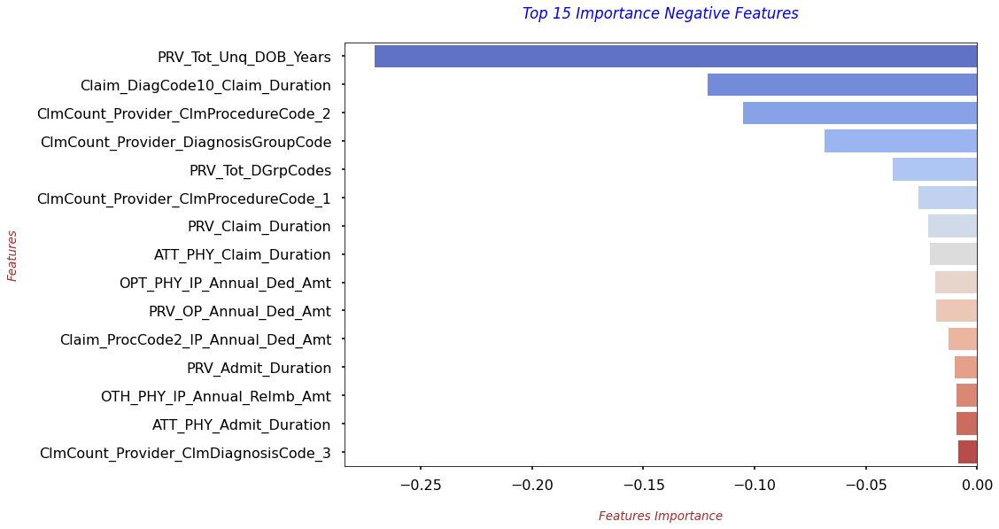

In [537]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_neg_feats, x=top_15_neg_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Negative Features\n", fontdict=title_font_dict)

#### **`2. Decision Tree`**

In [538]:
from sklearn.tree import DecisionTreeClassifier

In [539]:
# Training the model with all features and hyper-parameterized values
dec_tree_2 = DecisionTreeClassifier(criterion='gini',
                                   max_depth= 6,
                                   max_features='log2',
                                   min_samples_leaf=150,
                                   min_samples_split=150,
                                   class_weight='balanced',
                                   random_state=49,
                                   splitter='best',
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

dec_tree_2.fit(X_train_std, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=6,
                       max_features='log2', min_samples_leaf=150,
                       min_samples_split=150, random_state=49)

### Train AUC = 0.9264832595361951
### Test AUC = 0.9259948930672883


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


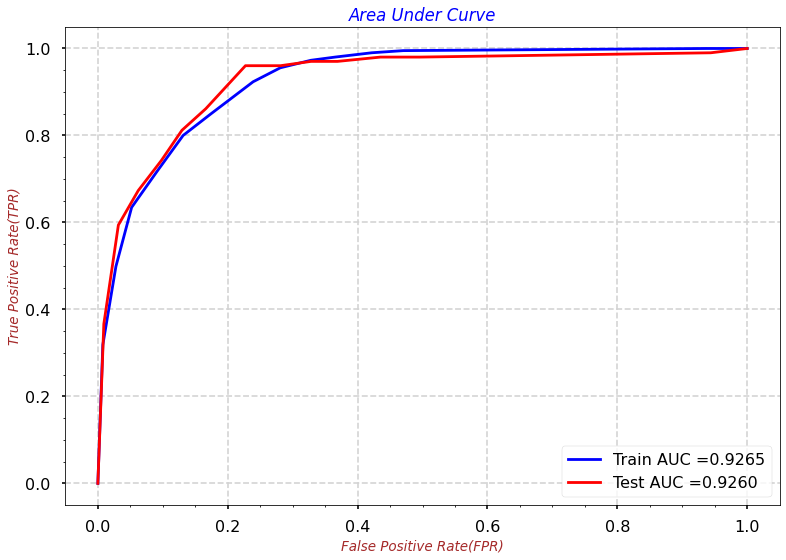

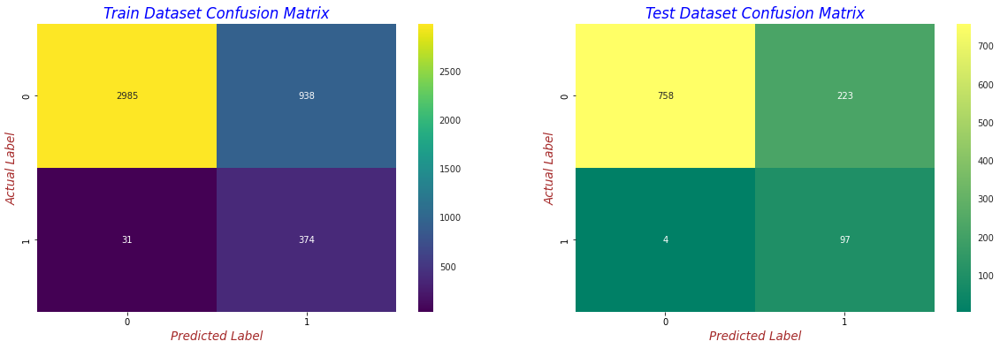



### Best Threshold = 0.5316
### Model AUC is : 0.9260
### Model Train F1 Score is : 0.4356
### Model Test F1 Score is : 0.4608


In [540]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(dec_tree_2, X_train_std, X_test_std, y_train, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [541]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': dec_tree_2.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,DeductibleAmtPaid,0.040583
1,OPT_PHY_Admit_Duration,0.003299
2,OTH_PHY_Claim_Duration,0.000785
3,Claim_Admit_Diag_Code_IP_Annual_ReImb_Amt,0.700819
4,Claim_Admit_Diag_Code_IP_Annual_Ded_Amt,0.002466


In [542]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

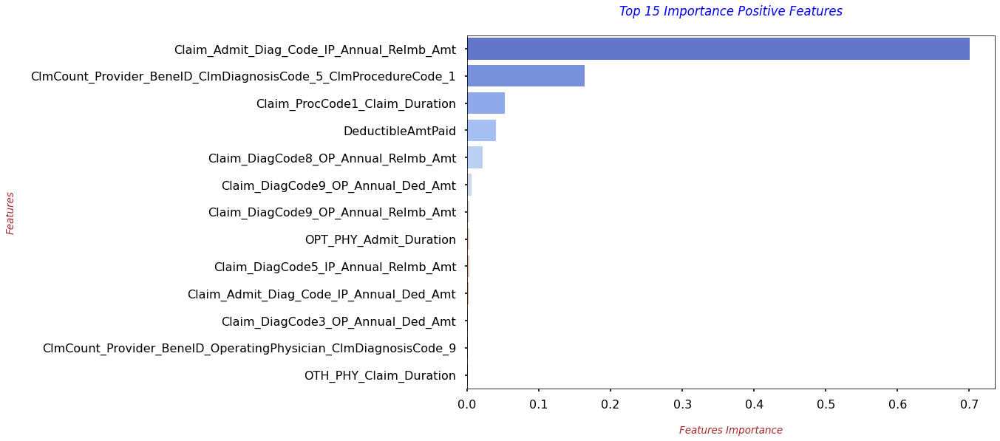

In [543]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

#### **`3. Random Forest Classifier`**

In [544]:
from sklearn.ensemble import RandomForestClassifier

In [545]:
# Training the model with all features and hyper-parameterized values
rfc_3 = RandomForestClassifier(n_estimators=30,criterion='gini',
                                   max_depth= 4,
                                   max_features='auto',
                                   min_samples_leaf=50,
                                   min_samples_split=50,
                                   class_weight='balanced',
                                   random_state=49,
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

rfc_3.fit(X_train_std, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=4,
                       min_samples_leaf=50, min_samples_split=50,
                       n_estimators=30, random_state=49)

### Train AUC = 0.9457812898292124
### Test AUC = 0.9517970145638417


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


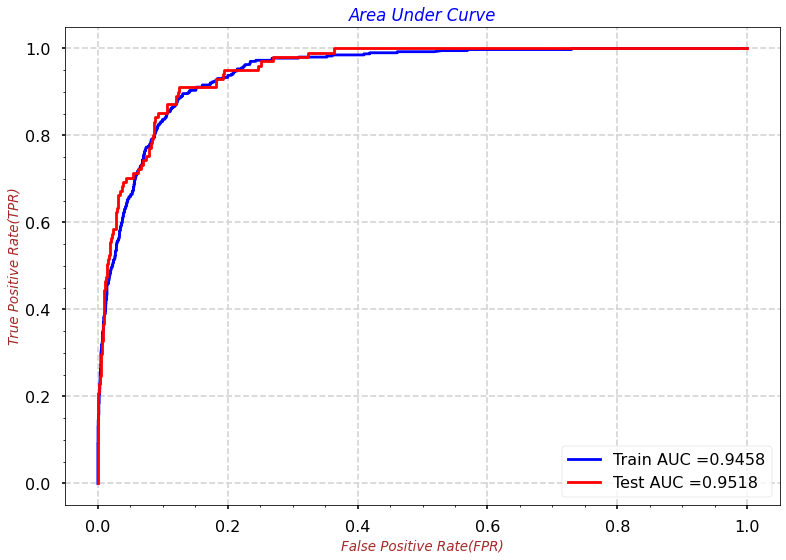

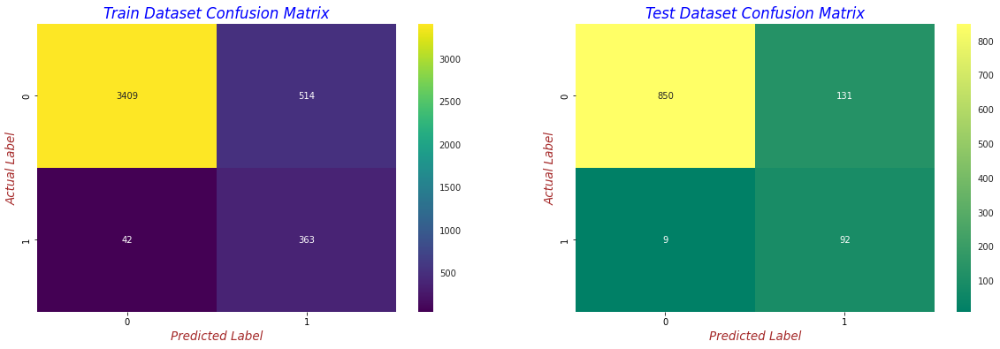



### Best Threshold = 0.5390
### Model AUC is : 0.9518
### Model Train F1 Score is : 0.5663
### Model Test F1 Score is : 0.5679


In [546]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(rfc_3, X_train_std, X_test_std, y_train, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [547]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': rfc_3.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.012603
1,DeductibleAmtPaid,0.028761
2,RenalDiseaseIndicator,0.000322
3,ChronicCond_ObstrPulmonary,0.000937
4,ChronicCond_Diabetes,0.000268


In [548]:
top_20_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:20]
top_20_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:20]

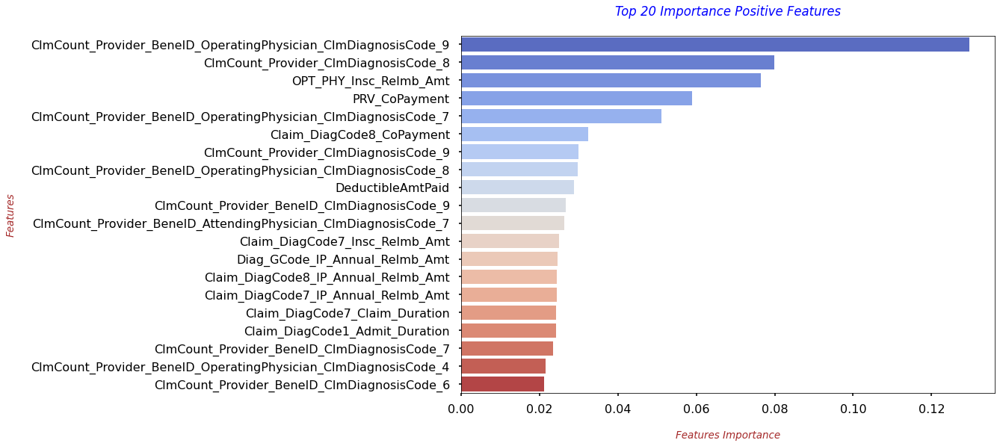

In [549]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_20_pos_feats, x=top_20_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 20 Importance Positive Features\n", fontdict=title_font_dict)

### **`Using Minority Synthetic Oversampling`**

#### **`Train Test Split` :: Creating TRAIN and VALIDATION sets.**

   * **`Reasoning`** :: These sets will be used for measurng the performance of ML Models.

In [550]:
from sklearn.model_selection import train_test_split as tts

In [551]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.25, stratify=y, random_state=39)

In [552]:
# Checking shape of each set
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4057, 299), (1353, 299), (4057,), (1353,))

In [553]:
# Checking count of tgt labels in y_train
y_train.value_counts()

0    3678
1     379
Name: PotentialFraud, dtype: int64

In [554]:
# Checking count of tgt labels in y_test
y_test.value_counts()

0    1226
1     127
Name: PotentialFraud, dtype: int64

#### **`Standardizing the TRAIN & TEST sets` :: Bringing every feature into the same scale.**

In [555]:
from sklearn.preprocessing import RobustScaler

In [556]:
# Standardize the data (train and test)
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)
X_train_std = robust_scaler.transform(X_train)
X_test_std = robust_scaler.transform(X_test)

In [557]:
from collections import Counter

In [558]:
# BEFORE Oversampling :: Checking the percentage share of fraud and non-fraud records in the TRAIN set
counter = Counter(y_train)
counter

Counter({0: 3678, 1: 379})

In [559]:
fraud_percentage = (counter[1]*100 / (counter[0]+counter[1]))
non_fraud_percentage = (counter[0]*100 / (counter[0]+counter[1]))
print("Fraud Percentage = {:.2f}% and Non-Fraud Percentage = {:.2f}%".format(fraud_percentage, non_fraud_percentage))

Fraud Percentage = 9.34% and Non-Fraud Percentage = 90.66%


In [560]:
# Performing minority oversampling
from imblearn.over_sampling import ADASYN

In [561]:
oversample = ADASYN(sampling_strategy=0.35, n_neighbors=12)
X_train_ovsamp, y_train_ovsamp = oversample.fit_resample(X_train_std, y_train)

X_train_ovsamp.shape, y_train_ovsamp.shape

((4983, 299), (4983,))

In [562]:
counter = Counter(y_train_ovsamp)
counter

Counter({0: 3678, 1: 1305})

In [563]:
fraud_percentage = (counter[1]*100 / (counter[0]+counter[1]))
non_fraud_percentage = (counter[0]*100 / (counter[0]+counter[1]))
print("Fraud Percentage = {:.2f}% and Non-Fraud Percentage = {:.2f}%".format(fraud_percentage, non_fraud_percentage))

Fraud Percentage = 26.19% and Non-Fraud Percentage = 73.81%


#### **`4. Logistic Regression`**

In [564]:
# Training the model with all features and hyper-parameterized values
log_reg_4 = LogisticRegression(C=0.0316228, penalty='l1',
                               fit_intercept=True, 
                               solver='liblinear', 
                               tol=0.0001, 
                               max_iter=500, 
                               verbose=0, 
                               intercept_scaling=1.0,
                               multi_class='auto',
                               random_state=49)

log_reg_4.fit(X_train_ovsamp, y_train_ovsamp)

LogisticRegression(C=0.0316228, intercept_scaling=1.0, max_iter=500,
                   penalty='l1', random_state=49, solver='liblinear')

### Train AUC = 0.9395194373087157
### Test AUC = 0.9418183453006385


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


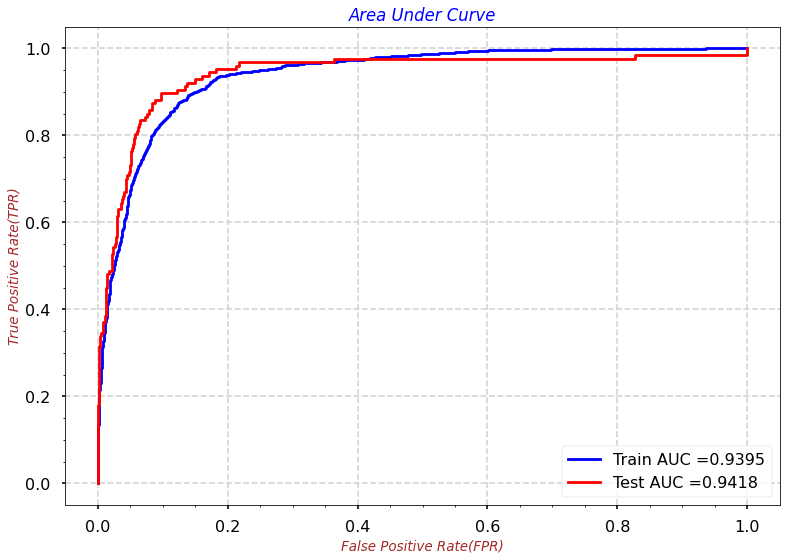

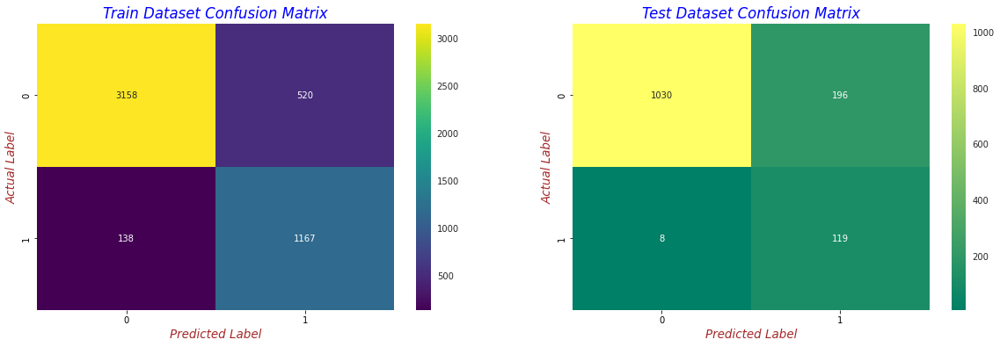



### Best Threshold = 0.1898
### Model AUC is : 0.9418
### Model Train F1 Score is : 0.7801
### Model Test F1 Score is : 0.5385


In [565]:
# Validate Logistic Regression model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(log_reg_4, X_train_ovsamp, X_test_std, y_train_ovsamp, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [566]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': log_reg_4.coef_[0]})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.722834
1,ChronicCond_stroke,0.047096
2,Admitted_Duration,0.489483
3,PRV_Tot_DGrpCodes,-0.006593
4,PRV_Tot_Unq_DOB_Years,-0.298081


In [567]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

In [568]:
top_15_neg_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Features'].iloc[0:15]
top_15_neg_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Importance_Model_1'].iloc[0:15]

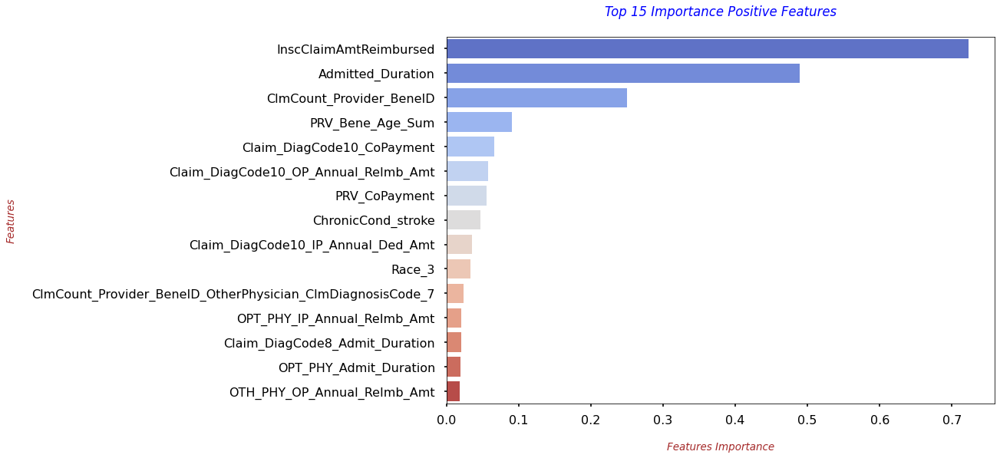

In [569]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

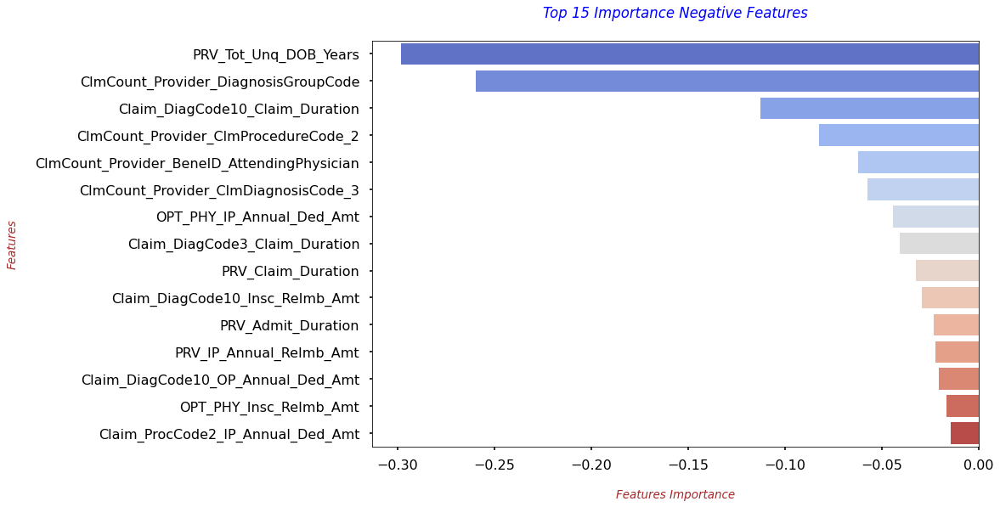

In [570]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_neg_feats, x=top_15_neg_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Negative Features\n", fontdict=title_font_dict)

#### **`5. Decision Tree`**

In [571]:
from sklearn.tree import DecisionTreeClassifier

In [572]:
# Training the model with all features and hyper-parameterized values
dec_tree_5 = DecisionTreeClassifier(criterion='gini',
                                   max_depth= 6,
                                   max_features='log2',
                                   min_samples_leaf=150,
                                   min_samples_split=150,
                                   random_state=49,
                                   splitter='best',
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

dec_tree_5.fit(X_train_ovsamp, y_train_ovsamp)

DecisionTreeClassifier(max_depth=6, max_features='log2', min_samples_leaf=150,
                       min_samples_split=150, random_state=49)

### Train AUC = 0.9235104035801567
### Test AUC = 0.9372422961811666


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


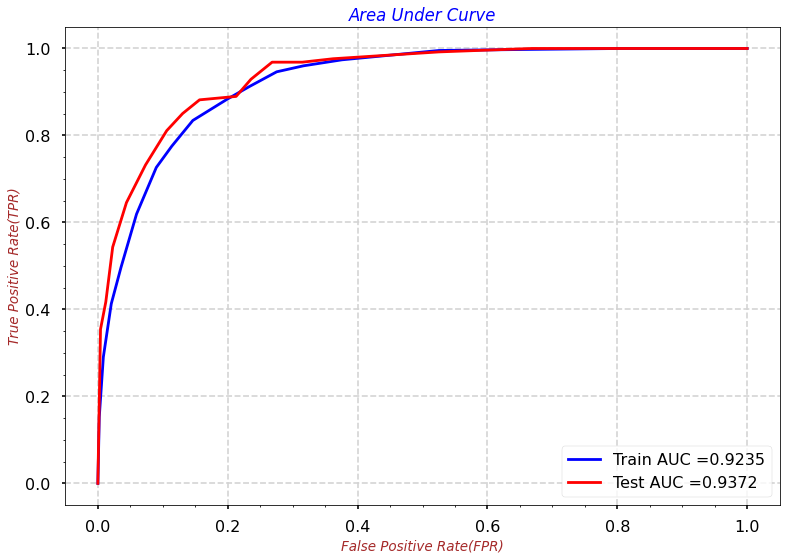

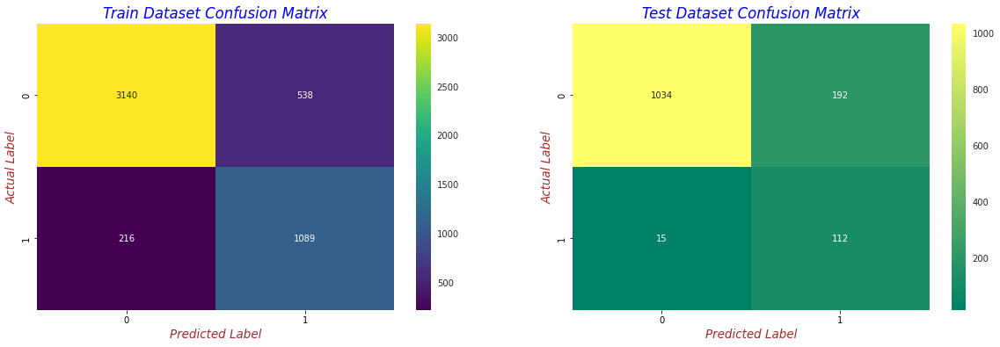



### Best Threshold = 0.3929
### Model AUC is : 0.9372
### Model Train F1 Score is : 0.7428
### Model Test F1 Score is : 0.5197


In [573]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(dec_tree_5, X_train_ovsamp, X_test_std, y_train_ovsamp, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [574]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': dec_tree_5.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,DeductibleAmtPaid,0.053100
1,IPAnnualDeductibleAmt,0.000019
2,OPT_PHY_OP_Annual_Ded_Amt,0.004203
3,OTH_PHY_OP_Annual_ReImb_Amt,0.000965
4,Claim_Admit_Diag_Code_IP_Annual_ReImb_Amt,0.639877


In [575]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

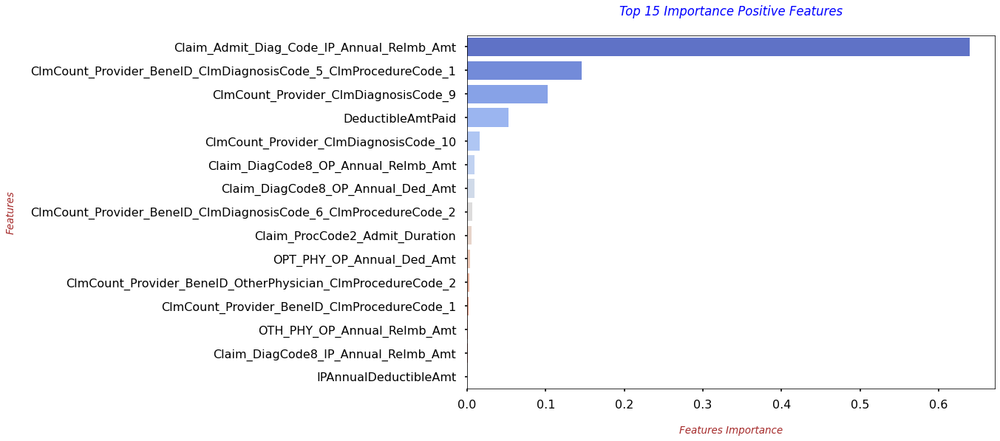

In [576]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

#### **`6. Random Forest Classifier`**

In [577]:
from sklearn.ensemble import RandomForestClassifier

In [578]:
# Training the model with all features and hyper-parameterized values
rfc_6 = RandomForestClassifier(n_estimators=30,criterion='gini',
                                   max_depth= 4,
                                   max_features='auto',
                                   min_samples_leaf=50,
                                   min_samples_split=50,
                                   random_state=49,
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

rfc_6.fit(X_train_std, y_train)

RandomForestClassifier(max_depth=4, min_samples_leaf=50, min_samples_split=50,
                       n_estimators=30, random_state=49)

### Train AUC = 0.9236866612914314
### Test AUC = 0.9487289822866759


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


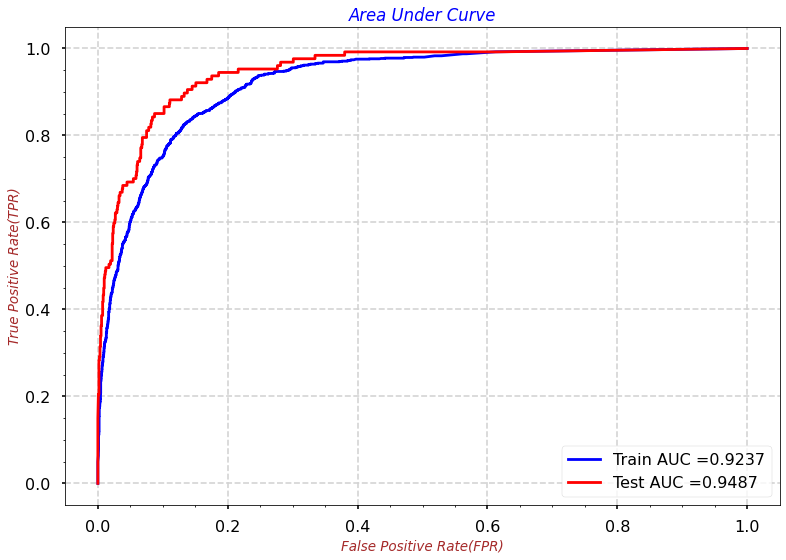

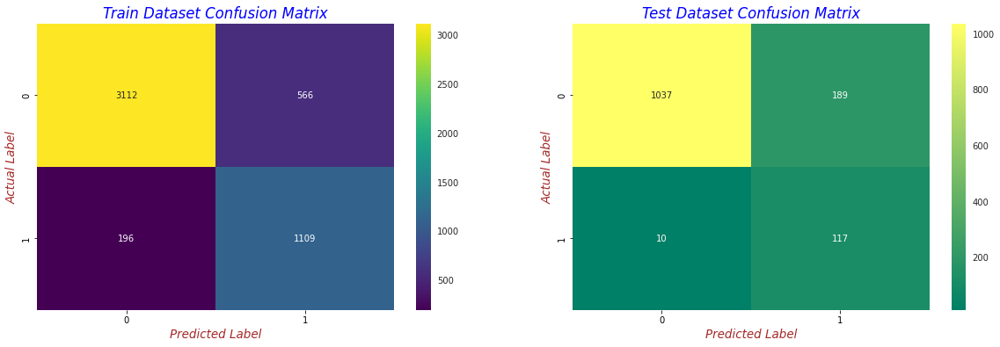



### Best Threshold = 0.1089
### Model AUC is : 0.9487
### Model Train F1 Score is : 0.7443
### Model Test F1 Score is : 0.5404


In [579]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(rfc_6, X_train_ovsamp, X_test_std, y_train_ovsamp, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [580]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': rfc_6.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.032471
1,DeductibleAmtPaid,0.005630
2,RenalDiseaseIndicator,0.000265
3,ChronicCond_Alzheimer,0.000079
4,IPAnnualReimbursementAmt,0.003554


In [581]:
top_20_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:20]
top_20_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:20]

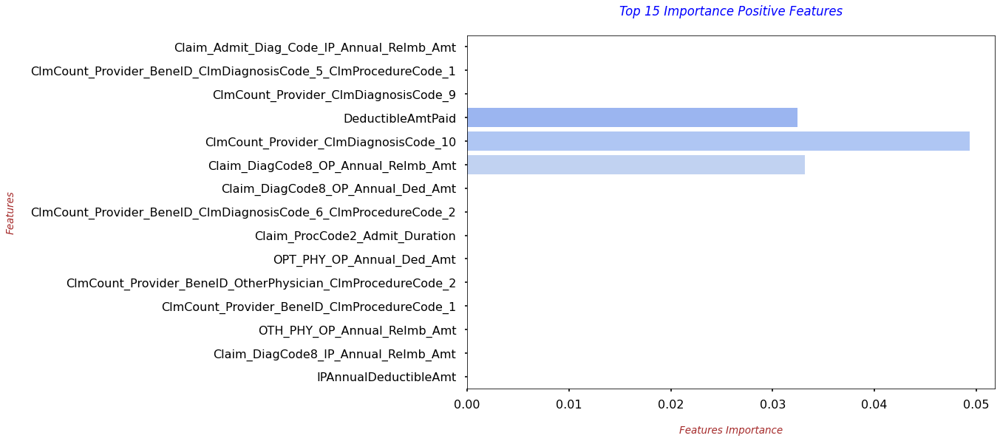

In [582]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_20_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

# **`Models - SET 1 - RESULTS`**
- Best performing model highlighted in light yellow in the below table.

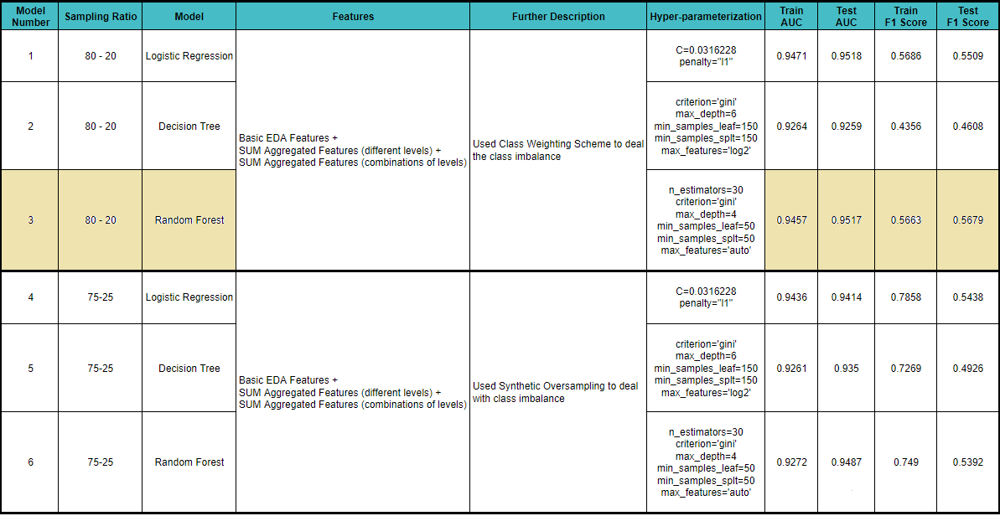

In [583]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Models_Set_1_Results.png")

## **`Models - SET 1 - OBSERVATIONS`**

- **Adding Aggregated features at below mentioned levels certainly helped in achieving the good performance scores.**
    - Provider
    - Beneficiary
    - Attending Physician
    - Operating Physician
    - Other Physician and etc..
    
    
- **Adding below mentioned Aggregated features in order to capture the interactions b/w the different parties involved in the CLAIM process certainly helped in achieving the good performance scores.**  
    - PROVIDER <--> BENE <--> PHYSICIANS
    - PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> DIAGNOSIS CODES <--> PROCEDURE CODES and etc..
    

- **Doing the synthetic oversampling of the minority class doesn't provide gain in the model's performance whehreas we can see a slight drop in the performace.** 

# **Feature Engg - SET 2**

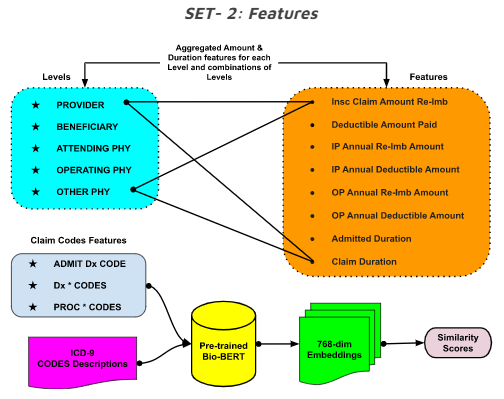

In [584]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Feat_Engg_SET2.png")

In [585]:
train_bene_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Beneficiarydata-1542865627584.csv")
train_ip_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Inpatientdata-1542865627584.csv")
train_op_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train_Outpatientdata-1542865627584.csv")
train_tgt_lbls_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Train-1542865627584.csv")

In [586]:
test_bene_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Test_Beneficiarydata-1542969243754.csv")
test_ip_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Test_Inpatientdata-1542969243754.csv")
test_op_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Test_Outpatientdata-1542969243754.csv")
test_tgt_lbls_df = pd.read_csv("../input/healthcare-provider-fraud-detection-analysis/Test-1542969243754.csv")

## ***Exploring_Target_Labels_Data***

In [587]:
train_tgt_lbls_df.head()

,Provider,PotentialFraud
0,PRV51001,No
1,PRV51003,Yes
2,PRV51004,No
3,PRV51005,Yes
4,PRV51007,No


In [588]:
test_tgt_lbls_df.head()

,Provider
0,PRV51002
1,PRV51006
2,PRV51009
3,PRV51010
4,PRV51018


* **Check the Fraud and Non-Fraud Counts**

In [589]:
print("### The unique number of train providers are {}. ###".format(train_tgt_lbls_df.shape[0]))

### The unique number of train providers are 5410. ###


In [590]:
print("### The unique number of test providers are {}. ###".format(test_tgt_lbls_df.shape[0]))

### The unique number of test providers are 1353. ###


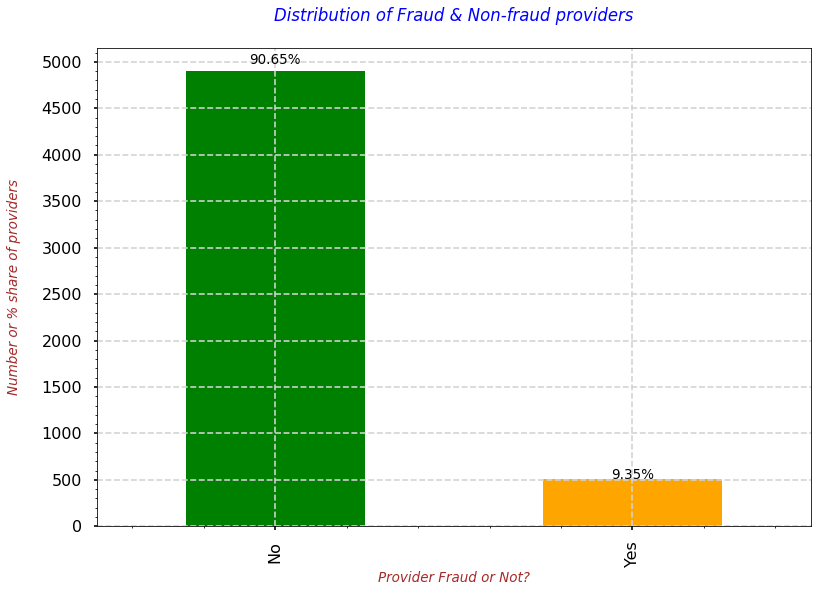

In [591]:
with plt.style.context('seaborn-poster'):
    fig = train_tgt_lbls_df["PotentialFraud"].value_counts().plot(kind='bar', color=['green','orange'])
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/train_tgt_lbls_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xlabel("Provider Fraud or Not?", fontdict=label_font_dict)
    plt.ylabel("Number or % share of providers\n", fontdict=label_font_dict)
    plt.yticks(np.arange(0,5100,500))
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of Fraud & Non-fraud providers\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* From the above plot, we can say that 90% of the providers are not frausters and only 9% of them are involved in frauds.

- **Removing some entirely NULL Procedure Codes Features**

- TRAIN Set

In [592]:
train_ip_df.shape, train_op_df.shape

((40474, 30), (517737, 27))

In [593]:
(train_ip_df['ClmProcedureCode_4'].isna().sum() / train_ip_df.shape[0])*100,\
(train_ip_df['ClmProcedureCode_5'].isna().sum() / train_ip_df.shape[0])*100,\
(train_ip_df['ClmProcedureCode_6'].isna().sum() / train_ip_df.shape[0])*100

(99.71339625438553, 99.97776350249543, 100.0)

In [594]:
(train_op_df['ClmProcedureCode_4'].isna().sum() / train_op_df.shape[0])*100,\
(train_op_df['ClmProcedureCode_5'].isna().sum() / train_op_df.shape[0])*100,\
(train_op_df['ClmProcedureCode_6'].isna().sum() / train_op_df.shape[0])*100

(99.99961370348267, 100.0, 100.0)

- Unseen Set

In [595]:
test_ip_df.shape, test_op_df.shape

((9551, 30), (125841, 27))

In [596]:
(test_ip_df['ClmProcedureCode_4'].isna().sum() / test_ip_df.shape[0])*100,\
(test_ip_df['ClmProcedureCode_5'].isna().sum() / test_ip_df.shape[0])*100,\
(test_ip_df['ClmProcedureCode_6'].isna().sum() / test_ip_df.shape[0])*100

(99.69636687257879, 99.97905978431578, 100.0)

In [597]:
(test_op_df['ClmProcedureCode_4'].isna().sum() / test_op_df.shape[0])*100,\
(test_op_df['ClmProcedureCode_5'].isna().sum() / test_op_df.shape[0])*100,\
(test_op_df['ClmProcedureCode_6'].isna().sum() / test_op_df.shape[0])*100

(100.0, 100.0, 100.0)

- **Removing the above columns**

In [598]:
train_ip_df.drop(['ClmProcedureCode_4','ClmProcedureCode_5','ClmProcedureCode_6'],axis=1,inplace=True)
train_op_df.drop(['ClmProcedureCode_4','ClmProcedureCode_5','ClmProcedureCode_6'],axis=1,inplace=True)

In [599]:
test_ip_df.drop(['ClmProcedureCode_4','ClmProcedureCode_5','ClmProcedureCode_6'],axis=1,inplace=True)
test_op_df.drop(['ClmProcedureCode_4','ClmProcedureCode_5','ClmProcedureCode_6'],axis=1,inplace=True)

In [600]:
# Converting the PROC CODES into STRING format
train_ip_df['ClmProcedureCode_1'] = train_ip_df['ClmProcedureCode_1'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
train_ip_df['ClmProcedureCode_2'] = train_ip_df['ClmProcedureCode_2'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
train_ip_df['ClmProcedureCode_3'] = train_ip_df['ClmProcedureCode_3'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)

train_op_df['ClmProcedureCode_1'] = train_op_df['ClmProcedureCode_1'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
train_op_df['ClmProcedureCode_2'] = train_op_df['ClmProcedureCode_2'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
train_op_df['ClmProcedureCode_3'] = train_op_df['ClmProcedureCode_3'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)

In [601]:
# Converting the PROC CODES into STRING format
test_ip_df['ClmProcedureCode_1'] = test_ip_df['ClmProcedureCode_1'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
test_ip_df['ClmProcedureCode_2'] = test_ip_df['ClmProcedureCode_2'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
test_ip_df['ClmProcedureCode_3'] = test_ip_df['ClmProcedureCode_3'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)

test_op_df['ClmProcedureCode_1'] = test_op_df['ClmProcedureCode_1'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
test_op_df['ClmProcedureCode_2'] = test_op_df['ClmProcedureCode_2'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)
test_op_df['ClmProcedureCode_3'] = test_op_df['ClmProcedureCode_3'].apply(lambda val: str(val).split(".")[0] if val == val else np.NaN)

### **Adding `New Feature - 1` :: `Admitted` or `Not Admitted` indicator in IP and OP Dataset**

* **Adding in IP Dataset**

In [602]:
train_ip_df["Admitted?"] = 1

In [603]:
test_ip_df["Admitted?"] = 1

In [604]:
train_ip_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,Admitted?
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,2948,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,30390,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,2762,7843,32723,V1041,4254,25062,40390,4019,NaN,331,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,3051,34400,5856,42732,486,5119,29620,20300,NaN,3893,NaN,NaN,1


In [605]:
test_ip_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,Admitted?
0,BENE11014,CLM67387,2009-09-09,2009-09-16,PRV57070,9000,PHY317786,PHY427017,NaN,2009-09-09,5789,1068.0,2009-09-16,332,5780,5533,496,V420,40390,2851,5990,570,41071,4280,4443,5849,NaN,1
1,BENE11017,CLM31237,2008-12-25,2009-01-08,PRV54750,14000,PHY314656,PHY426644,NaN,2008-12-25,5939,1068.0,2009-01-08,661,1889,41071,5990,5601,4588,5845,4549,29570,34831,NaN,5551,NaN,NaN,1
2,BENE11026,CLM78930,2009-12-09,2009-12-13,PRV53758,2000,PHY349495,NaN,NaN,2009-12-09,4019,1068.0,2009-12-13,241,4010,78791,60000,41401,V1254,4372,78650,7813,4254,NaN,NaN,NaN,NaN,1
3,BENE11031,CLM56810,2009-06-23,2009-07-06,PRV55825,16000,PHY429538,PHY371893,NaN,2009-06-23,8208,1068.0,2009-07-06,564,8208,4168,920,5990,40391,2859,4254,41400,5849,41401,8152,3320,NaN,1
4,BENE11085,CLM34625,2009-01-20,2009-01-31,PRV52338,19000,PHY397161,NaN,NaN,2009-01-20,4279,1068.0,2009-01-31,880,29654,V142,78702,30503,V140,V4582,V6109,7242,NaN,NaN,NaN,NaN,NaN,1


* **Adding in OP Dataset**

In [606]:
train_op_df["Admitted?"] = 0

In [607]:
test_op_df["Admitted?"] = 0

In [608]:
train_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,DeductibleAmtPaid,ClmAdmitDiagnosisCode,Admitted?
0,BENE11002,CLM624349,2009-10-11,2009-10-11,PRV56011,30,PHY326117,NaN,NaN,78943,V5866,V1272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,56409,0
1,BENE11003,CLM189947,2009-02-12,2009-02-12,PRV57610,80,PHY362868,NaN,NaN,6115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,79380,0
2,BENE11003,CLM438021,2009-06-27,2009-06-27,PRV57595,10,PHY328821,NaN,NaN,2723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
3,BENE11004,CLM121801,2009-01-06,2009-01-06,PRV56011,40,PHY334319,NaN,NaN,71988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
4,BENE11004,CLM150998,2009-01-22,2009-01-22,PRV56011,200,PHY403831,NaN,NaN,82382,30000,72887,4280,7197,V4577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,71947,0


In [609]:
test_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,DeductibleAmtPaid,ClmAdmitDiagnosisCode,Admitted?
0,BENE11001,CLM392397,2009-06-02,2009-06-02,PRV55962,30,PHY347633,NaN,PHY347633,V5832,V5861,2724,3182,V5869,42731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
1,BENE11001,CLM430760,2009-06-23,2009-06-23,PRV56112,30,PHY381777,NaN,PHY381777,9594,E9174,4019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
2,BENE11007,CLM233081,2009-03-07,2009-03-07,PRV56979,200,PHY425311,NaN,PHY425311,7248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0
3,BENE11007,CLM496381,2009-07-29,2009-07-29,PRV56573,10,PHY393253,PHY347995,NaN,58889,2449,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,5939,0
4,BENE11007,CLM521391,2009-08-12,2009-08-12,PRV56573,10,PHY417685,NaN,PHY382041,V666,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0


### **Merging the Datasets**

In [610]:
# Commom columns must be 28
common_cols_tr = [col for col in train_ip_df.columns if col in train_op_df.columns]
len(common_cols_tr)

25

In [611]:
# Merging the IP and OP dataset on the basis of common columns
train_ip_op_df = pd.merge(left=train_ip_df, right=train_op_df, left_on=common_cols_tr, right_on=common_cols_tr, how="outer")
train_ip_op_df.shape

(558211, 28)

In [612]:
# Merging the IP and OP dataset on the basis of common columns
test_ip_op_df = pd.merge(left=test_ip_df, right=test_op_df, left_on=common_cols_tr, right_on=common_cols_tr, how="outer")
test_ip_op_df.shape

(135392, 28)

In [613]:
train_ip_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,Admitted?
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.0,2009-04-18,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,1
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.0,2009-09-02,750,6186,2948,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092,NaN,NaN,1
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.0,2009-09-20,883,29623,30390,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,BENE11011,CLM38412,2009-02-14,2009-02-22,PRV52405,5000,PHY369659,PHY392961,PHY349768,2009-02-14,431,1068.0,2009-02-22,067,43491,2762,7843,32723,V1041,4254,25062,40390,4019,NaN,331,NaN,NaN,1
4,BENE11014,CLM63689,2009-08-13,2009-08-30,PRV56614,10000,PHY379376,PHY398258,NaN,2009-08-13,78321,1068.0,2009-08-30,975,042,3051,34400,5856,42732,486,5119,29620,20300,NaN,3893,NaN,NaN,1


In [614]:
test_ip_op_df.head()

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,Admitted?
0,BENE11014,CLM67387,2009-09-09,2009-09-16,PRV57070,9000,PHY317786,PHY427017,NaN,2009-09-09,5789,1068.0,2009-09-16,332,5780,5533,496,V420,40390,2851,5990,570,41071,4280,4443,5849,NaN,1
1,BENE11017,CLM31237,2008-12-25,2009-01-08,PRV54750,14000,PHY314656,PHY426644,NaN,2008-12-25,5939,1068.0,2009-01-08,661,1889,41071,5990,5601,4588,5845,4549,29570,34831,NaN,5551,NaN,NaN,1
2,BENE11026,CLM78930,2009-12-09,2009-12-13,PRV53758,2000,PHY349495,NaN,NaN,2009-12-09,4019,1068.0,2009-12-13,241,4010,78791,60000,41401,V1254,4372,78650,7813,4254,NaN,NaN,NaN,NaN,1
3,BENE11031,CLM56810,2009-06-23,2009-07-06,PRV55825,16000,PHY429538,PHY371893,NaN,2009-06-23,8208,1068.0,2009-07-06,564,8208,4168,920,5990,40391,2859,4254,41400,5849,41401,8152,3320,NaN,1
4,BENE11085,CLM34625,2009-01-20,2009-01-31,PRV52338,19000,PHY397161,NaN,NaN,2009-01-20,4279,1068.0,2009-01-31,880,29654,V142,78702,30503,V140,V4582,V6109,7242,NaN,NaN,NaN,NaN,NaN,1


### **Merging the IP_OP Dataset with BENE Data**

In [615]:
# Joining the IP_OP dataset with the BENE data
train_ip_op_bene_df = pd.merge(left=train_ip_op_df, right=train_bene_df, left_on='BeneID', right_on='BeneID',how='inner')
train_ip_op_bene_df.shape

(558211, 52)

In [616]:
# Joining the IP_OP dataset with the BENE data
test_ip_op_bene_df = pd.merge(left=test_ip_op_df, right=test_bene_df, left_on='BeneID', right_on='BeneID',how='inner')
test_ip_op_bene_df.shape

(135392, 52)

### **Merging the IP_OP_BENE Dataset with PROVIDER level Tgt Labels Data**

In [617]:
# Joining the IP_OP_BENE dataset with the Tgt Label Provider Data
train_iobp_df = pd.merge(left=train_ip_op_bene_df, right=train_tgt_lbls_df, left_on='Provider', right_on='Provider',how='inner')
train_iobp_df.shape

(558211, 53)

In [618]:
# Joining the IP_OP_BENE dataset with the Tgt Label Provider Data
test_iobp_df = pd.merge(left=test_ip_op_bene_df, right=test_tgt_lbls_df, left_on='Provider', right_on='Provider',how='inner')
test_iobp_df.shape

(135392, 52)

### **Entire Dataset**

In [619]:
train_iobp_df.shape

(558211, 53)

In [620]:
test_iobp_df.shape

(135392, 52)

In [621]:
# Unique Providers
train_iobp_df["Provider"].nunique()

5410

In [622]:
# Unique Providers
test_iobp_df["Provider"].nunique()

1353

In [623]:
# Unique Claim numbers
train_iobp_df["ClaimID"].nunique()

558211

In [624]:
# Unique Claim numbers
test_iobp_df["ClaimID"].nunique()

135392

In [625]:
# Joining with the PRV Tgt Labels
prvs_claims_df = pd.DataFrame(train_iobp_df.groupby(['Provider'])['ClaimID'].count()).reset_index()
prvs_claims_tgt_lbls_df = pd.merge(left=prvs_claims_df, right=train_tgt_lbls_df, on='Provider', how='inner')
prvs_claims_tgt_lbls_df

,Provider,ClaimID,PotentialFraud
0,PRV51001,25,No
1,PRV51003,132,Yes
2,PRV51004,149,No
3,PRV51005,1165,Yes
4,PRV51007,72,No
...,...,...,...
5405,PRV57759,28,No
5406,PRV57760,22,No
5407,PRV57761,82,No
5408,PRV57762,1,No


In [626]:
# Joining with the PRV Tgt Labels
prvs_claims_df = pd.DataFrame(test_iobp_df.groupby(['Provider'])['ClaimID'].count()).reset_index()
prvs_claims_tgt_lbls_df = pd.merge(left=prvs_claims_df, right=test_tgt_lbls_df, on='Provider', how='inner')
prvs_claims_tgt_lbls_df

,Provider,ClaimID
0,PRV51002,205
1,PRV51006,102
2,PRV51009,39
3,PRV51010,38
4,PRV51018,190
...,...,...
1348,PRV57713,11
1349,PRV57726,8
1350,PRV57745,2
1351,PRV57749,49


- **Fraud Count at Claims level**

     PotentialFraud
No           345415
Yes          212796 



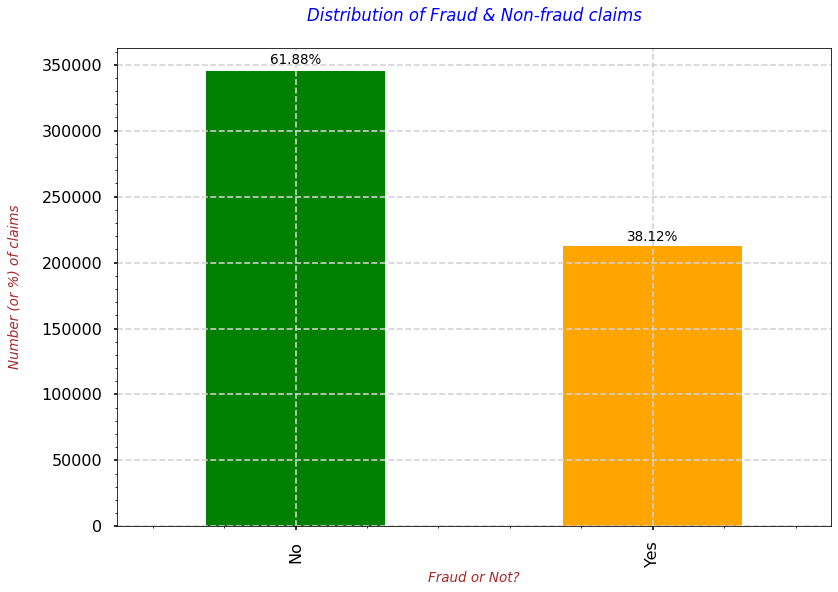

In [627]:
print(pd.DataFrame(train_iobp_df['PotentialFraud'].value_counts()), "\n")

with plt.style.context('seaborn-poster'):
    fig = train_iobp_df['PotentialFraud'].value_counts().plot(kind='bar', color=['green','orange'])
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/train_iobp_df.shape[0],2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=13.5)
    # Providing the labels and title to the graph
    plt.xlabel("Fraud or Not?", fontdict=label_font_dict)
    plt.ylabel("Number (or %) of claims\n", fontdict=label_font_dict)
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.minorticks_on()
    plt.title("Distribution of Fraud & Non-fraud claims\n", fontdict=title_font_dict)
    plt.plot();

**`OBSERVATION`**
* The above plot shows us that, 62% of claims are Non-Fraud and 32% of them are Fraudulent. 
    * By looking at the percentages we may say that there is a class-imbalance problem but after looking at the number of records it doesn't seem to be a severe class-imbalance problem. 
        * So, I'll try some class balancing techniques only after training a baseline model w/o any synthetic or class weighting techniques.

# **`VECTOR Embeddings`**

- Generating the vector embeddings of ::
    - `CLAIM Admit Diagnosis Codes`
    - `Diagnosis Codes`
    - `Procedure Codes`


- For now, I'm not including the `Dx Related Group Code` for generating the similarity score b/w these features.

In [628]:
import pickle 

# Loading the embeddings of CAD, DIAG and PROC codes
## Sentence embeddings are generated from the pre-trained Bio-BERT on PubMed and PMC datasets
### Dx and Proc Codes are downloaded from ICD-9 portal Effective from 2014
#### Refer Notebook --> CS_1_Codes_Desc_Embeddings.ipynb
with open('../input/medicare-prv-fraud-files/cad_diag_codes_embeddings.pkl', 'rb') as f:
    loaded_cad_dict = pickle.load(f)

with open('../input/medicare-prv-fraud-files/proc_codes_embeddings.pkl', 'rb') as f:
    loaded_proc_dict = pickle.load(f)

In [629]:
zeros_vec = np.zeros(shape=(1,768),dtype='float')

In [630]:
# Fetching the embeddings of every CAD and Dx CODE
train_iobp_df['Clm_Admit_Dx_embeddings'] = train_iobp_df['ClmAdmitDiagnosisCode'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_1_embeddings'] = train_iobp_df['ClmDiagnosisCode_1'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_2_embeddings'] = train_iobp_df['ClmDiagnosisCode_2'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_3_embeddings'] = train_iobp_df['ClmDiagnosisCode_3'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_4_embeddings'] = train_iobp_df['ClmDiagnosisCode_4'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_5_embeddings'] = train_iobp_df['ClmDiagnosisCode_5'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_6_embeddings'] = train_iobp_df['ClmDiagnosisCode_6'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_7_embeddings'] = train_iobp_df['ClmDiagnosisCode_7'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_8_embeddings'] = train_iobp_df['ClmDiagnosisCode_8'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_9_embeddings'] = train_iobp_df['ClmDiagnosisCode_9'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_Dx_10_embeddings'] = train_iobp_df['ClmDiagnosisCode_10'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))

In [631]:
# Fetching the embeddings of every CAD and Dx CODE
test_iobp_df['Clm_Admit_Dx_embeddings'] = test_iobp_df['ClmAdmitDiagnosisCode'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_1_embeddings'] = test_iobp_df['ClmDiagnosisCode_1'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_2_embeddings'] = test_iobp_df['ClmDiagnosisCode_2'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_3_embeddings'] = test_iobp_df['ClmDiagnosisCode_3'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_4_embeddings'] = test_iobp_df['ClmDiagnosisCode_4'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_5_embeddings'] = test_iobp_df['ClmDiagnosisCode_5'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_6_embeddings'] = test_iobp_df['ClmDiagnosisCode_6'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_7_embeddings'] = test_iobp_df['ClmDiagnosisCode_7'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_8_embeddings'] = test_iobp_df['ClmDiagnosisCode_8'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_9_embeddings'] = test_iobp_df['ClmDiagnosisCode_9'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_Dx_10_embeddings'] = test_iobp_df['ClmDiagnosisCode_10'].apply(lambda code: loaded_cad_dict.get(code,zeros_vec[0]))

In [632]:
# Adding the embeddings of all the Dx Codes for every claim
train_iobp_df['Clm_All_Dx_embeddings'] = train_iobp_df[['Clm_Dx_1_embeddings','Clm_Dx_2_embeddings','Clm_Dx_3_embeddings','Clm_Dx_4_embeddings','Clm_Dx_5_embeddings','Clm_Dx_6_embeddings','Clm_Dx_7_embeddings','Clm_Dx_8_embeddings','Clm_Dx_9_embeddings','Clm_Dx_10_embeddings']]\
.apply(lambda row : row['Clm_Dx_1_embeddings'] + row['Clm_Dx_2_embeddings'] + row['Clm_Dx_3_embeddings'] + row['Clm_Dx_4_embeddings'] + row['Clm_Dx_5_embeddings'] + row['Clm_Dx_6_embeddings'] + row['Clm_Dx_7_embeddings'] + row['Clm_Dx_8_embeddings'] + row['Clm_Dx_9_embeddings'] + row['Clm_Dx_10_embeddings'], axis=1)

In [633]:
# Final embeddings of all the Dx Codes for every claim
train_iobp_df['Clm_All_Dx_embeddings']

0         [0.9678052412346005, 1.6423875028267503, -1.30...
1         [1.30414180457592, 1.4621049482375383, -1.3063...
2         [0.8069967683404684, 1.3780399085953832, -1.21...
3         [1.0197997465729713, 1.4949923837557435, -0.58...
4         [1.2688028439879417, 0.9786814162507653, -0.30...
                                ...                        
558206    [0.6410285793244839, 0.139002975076437, -0.414...
558207    [0.29387184977531433, 0.032951388508081436, -0...
558208    [0.1727948859333992, 0.6853120625019073, -0.45...
558209    [0.1868998408317566, 0.3849315941333771, -0.16...
558210    [0.09751432272605598, 0.26662084460258484, -0....
Name: Clm_All_Dx_embeddings, Length: 558211, dtype: object

In [634]:
# Adding the embeddings of all the Dx Codes for every claim
test_iobp_df['Clm_All_Dx_embeddings'] = test_iobp_df[['Clm_Dx_1_embeddings','Clm_Dx_2_embeddings','Clm_Dx_3_embeddings','Clm_Dx_4_embeddings','Clm_Dx_5_embeddings','Clm_Dx_6_embeddings','Clm_Dx_7_embeddings','Clm_Dx_8_embeddings','Clm_Dx_9_embeddings','Clm_Dx_10_embeddings']]\
.apply(lambda row : row['Clm_Dx_1_embeddings'] + row['Clm_Dx_2_embeddings'] + row['Clm_Dx_3_embeddings'] + row['Clm_Dx_4_embeddings'] + row['Clm_Dx_5_embeddings'] + row['Clm_Dx_6_embeddings'] + row['Clm_Dx_7_embeddings'] + row['Clm_Dx_8_embeddings'] + row['Clm_Dx_9_embeddings'] + row['Clm_Dx_10_embeddings'], axis=1)

In [635]:
# Final embeddings of all the Dx Codes for every claim
test_iobp_df['Clm_All_Dx_embeddings']

0         [0.6438316721469164, 2.163996056653559, -1.585...
1         [1.3458348102867603, 1.3714876929298043, -0.68...
2         [1.3597857274580747, 1.0866809133440256, -1.02...
3         [1.209467918612063, 1.0890447879210114, -0.271...
4         [0.5807230211794376, 1.6170704737305641, -0.99...
                                ...                        
135387    [1.4863854311406612, 1.1393327005207539, -1.06...
135388    [0.22494754195213318, 0.05418386682868004, -0....
135389    [0.5574011146090925, 0.5943227931857109, -0.45...
135390    [0.2821866199374199, 0.5696764439344406, -0.54...
135391    [0.4634277820587158, 0.5886942557990551, -0.74...
Name: Clm_All_Dx_embeddings, Length: 135392, dtype: object

In [636]:
# Fetching the embeddings of every PROC Code
train_iobp_df['Clm_PROC_1_embeddings'] = train_iobp_df['ClmProcedureCode_1'].apply(lambda code: loaded_proc_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_PROC_2_embeddings'] = train_iobp_df['ClmProcedureCode_2'].apply(lambda code: loaded_proc_dict.get(code,zeros_vec[0]))
train_iobp_df['Clm_PROC_3_embeddings'] = train_iobp_df['ClmProcedureCode_3'].apply(lambda code: loaded_proc_dict.get(code,zeros_vec[0]))

In [637]:
# Fetching the embeddings of every PROC Code
test_iobp_df['Clm_PROC_1_embeddings'] = test_iobp_df['ClmProcedureCode_1'].apply(lambda code: loaded_proc_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_PROC_2_embeddings'] = test_iobp_df['ClmProcedureCode_2'].apply(lambda code: loaded_proc_dict.get(code,zeros_vec[0]))
test_iobp_df['Clm_PROC_3_embeddings'] = test_iobp_df['ClmProcedureCode_3'].apply(lambda code: loaded_proc_dict.get(code,zeros_vec[0]))

In [638]:
# Adding the embeddings of all the PROC Codes for every claim
train_iobp_df['Clm_All_PROC_embeddings'] = train_iobp_df[['Clm_PROC_1_embeddings','Clm_PROC_2_embeddings','Clm_PROC_3_embeddings']]\
.apply(lambda row : row['Clm_PROC_1_embeddings'] + row['Clm_PROC_2_embeddings'] + row['Clm_PROC_3_embeddings'], axis=1)

In [639]:
# Final embeddings of all the PROC Codes for every claim
train_iobp_df['Clm_All_PROC_embeddings']

0         [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1         [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2         [0.3849864900112152, 0.1121806651353836, -0.51...
3         [0.2294469177722931, 0.3657669425010681, -0.20...
4         [-0.06431667506694794, 0.015989957377314568, -...
                                ...                        
558206    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
558207    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
558208    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
558209    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
558210    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
Name: Clm_All_PROC_embeddings, Length: 558211, dtype: object

In [640]:
# Adding the embeddings of all the PROC Codes for every claim
test_iobp_df['Clm_All_PROC_embeddings'] = test_iobp_df[['Clm_PROC_1_embeddings','Clm_PROC_2_embeddings','Clm_PROC_3_embeddings']]\
.apply(lambda row : row['Clm_PROC_1_embeddings'] + row['Clm_PROC_2_embeddings'] + row['Clm_PROC_3_embeddings'], axis=1)

In [641]:
# Final embeddings of all the PROC Codes for every claim
test_iobp_df['Clm_All_PROC_embeddings']

0         [0.23038002103567123, 0.10825760662555695, -0....
1         [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2         [-0.030945993959903717, 0.476326584815979, 0.2...
3         [-0.04374227300286293, 0.37726446986198425, -0...
4         [0.11961781233549118, 0.18316590785980225, -0....
                                ...                        
135387    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
135388    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
135389    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
135390    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
135391    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
Name: Clm_All_PROC_embeddings, Length: 135392, dtype: object

In [642]:
from scipy.spatial import distance

In [643]:
# Generating the similarity scores features
## Similarity b/w CAD and Dx Codes
## Similarity b/w CAD and Proc Codes
## Similarity b/w Dx and Proc Codes
train_iobp_df['Clm_Admit_Diag_Dx_Similarity'] = train_iobp_df[['Clm_Admit_Dx_embeddings','Clm_All_Dx_embeddings']].apply(lambda row: 1 - distance.cosine(row['Clm_Admit_Dx_embeddings'], row['Clm_All_Dx_embeddings']), axis=1)
train_iobp_df['Clm_Admit_Diag_Proc_Similarity'] = train_iobp_df[['Clm_Admit_Dx_embeddings','Clm_All_PROC_embeddings']].apply(lambda row: 1 - distance.cosine(row['Clm_Admit_Dx_embeddings'], row['Clm_All_PROC_embeddings']), axis=1)
train_iobp_df['Clm_Dx_Proc_Similarity'] = train_iobp_df[['Clm_All_Dx_embeddings','Clm_All_PROC_embeddings']].apply(lambda row: 1 - distance.cosine(row['Clm_All_Dx_embeddings'], row['Clm_All_PROC_embeddings']), axis=1)

/opt/conda/lib/python3.7/site-packages/scipy/spatial/distance.py:699: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


In [644]:
train_iobp_df['Clm_Admit_Diag_Dx_Similarity'].fillna(value=0,inplace=True)
train_iobp_df['Clm_Admit_Diag_Proc_Similarity'].fillna(value=0,inplace=True)
train_iobp_df['Clm_Dx_Proc_Similarity'].fillna(value=0,inplace=True)

In [645]:
train_iobp_df['Clm_CAD_Dx_Proc_Similarity'] = train_iobp_df['Clm_Admit_Diag_Dx_Similarity'] + train_iobp_df['Clm_Admit_Diag_Proc_Similarity'] + train_iobp_df['Clm_Dx_Proc_Similarity']

In [646]:
# Generating the similarity scores features
## Similarity b/w CAD and Dx Codes
## Similarity b/w CAD and Proc Codes
## Similarity b/w Dx and Proc Codes
test_iobp_df['Clm_Admit_Diag_Dx_Similarity'] = test_iobp_df[['Clm_Admit_Dx_embeddings','Clm_All_Dx_embeddings']].apply(lambda row: 1 - distance.cosine(row['Clm_Admit_Dx_embeddings'], row['Clm_All_Dx_embeddings']), axis=1)
test_iobp_df['Clm_Admit_Diag_Proc_Similarity'] = test_iobp_df[['Clm_Admit_Dx_embeddings','Clm_All_PROC_embeddings']].apply(lambda row: 1 - distance.cosine(row['Clm_Admit_Dx_embeddings'], row['Clm_All_PROC_embeddings']), axis=1)
test_iobp_df['Clm_Dx_Proc_Similarity'] = test_iobp_df[['Clm_All_Dx_embeddings','Clm_All_PROC_embeddings']].apply(lambda row: 1 - distance.cosine(row['Clm_All_Dx_embeddings'], row['Clm_All_PROC_embeddings']), axis=1)

In [647]:
test_iobp_df['Clm_Admit_Diag_Dx_Similarity'].fillna(value=0,inplace=True)
test_iobp_df['Clm_Admit_Diag_Proc_Similarity'].fillna(value=0,inplace=True)
test_iobp_df['Clm_Dx_Proc_Similarity'].fillna(value=0,inplace=True)

In [648]:
test_iobp_df['Clm_CAD_Dx_Proc_Similarity'] = test_iobp_df['Clm_Admit_Diag_Dx_Similarity'] + test_iobp_df['Clm_Admit_Diag_Proc_Similarity'] + test_iobp_df['Clm_Dx_Proc_Similarity']

In [649]:
# Dropping the individual CAD, Dx and PROC embeddings features
train_iobp_df.drop(['Clm_Admit_Dx_embeddings',
'Clm_Dx_1_embeddings',
'Clm_Dx_2_embeddings',
'Clm_Dx_3_embeddings',
'Clm_Dx_4_embeddings',
'Clm_Dx_5_embeddings',
'Clm_Dx_6_embeddings',
'Clm_Dx_7_embeddings',
'Clm_Dx_8_embeddings',
'Clm_Dx_9_embeddings',
'Clm_Dx_10_embeddings',
'Clm_PROC_1_embeddings',
'Clm_PROC_2_embeddings',
'Clm_PROC_3_embeddings'],axis=1,inplace=True)

test_iobp_df.drop(['Clm_Admit_Dx_embeddings',
'Clm_Dx_1_embeddings',
'Clm_Dx_2_embeddings',
'Clm_Dx_3_embeddings',
'Clm_Dx_4_embeddings',
'Clm_Dx_5_embeddings',
'Clm_Dx_6_embeddings',
'Clm_Dx_7_embeddings',
'Clm_Dx_8_embeddings',
'Clm_Dx_9_embeddings',
'Clm_Dx_10_embeddings',
'Clm_PROC_1_embeddings',
'Clm_PROC_2_embeddings',
'Clm_PROC_3_embeddings'],axis=1,inplace=True)

## **Feature Engineering**
**`Let's create some features`**

### **Adding `New Feature - 2` :: `Is_Alive?`**

    - Is Alive? = No if DOD is NaN else Yes

In [650]:
train_iobp_df['DOB'] = pd.to_datetime(train_iobp_df['DOB'], format="%Y-%m-%d")
train_iobp_df['DOD'] = pd.to_datetime(train_iobp_df['DOD'], format="%Y-%m-%d")

In [651]:
test_iobp_df['DOB'] = pd.to_datetime(test_iobp_df['DOB'], format="%Y-%m-%d")
test_iobp_df['DOD'] = pd.to_datetime(test_iobp_df['DOD'], format="%Y-%m-%d")

In [652]:
train_iobp_df['Is_Alive?'] = train_iobp_df['DOD'].apply(lambda val: 'No' if val != val else 'Yes')

In [653]:
test_iobp_df['Is_Alive?'] = test_iobp_df['DOD'].apply(lambda val: 'No' if val != val else 'Yes')

In [654]:
train_iobp_df['Is_Alive?'].value_counts()

No     554080
Yes      4131
Name: Is_Alive?, dtype: int64

In [655]:
test_iobp_df['Is_Alive?'].value_counts()

No     134352
Yes      1040
Name: Is_Alive?, dtype: int64

### **Adding `New Feature - 3` :: `Claim_Duration`**
    
    - Claim Duration = Claim End Date - Claim Start Date

In [656]:
train_iobp_df['ClaimStartDt'] = pd.to_datetime(train_iobp_df['ClaimStartDt'], format="%Y-%m-%d")
train_iobp_df['ClaimEndDt'] = pd.to_datetime(train_iobp_df['ClaimEndDt'], format="%Y-%m-%d")

train_iobp_df['Claim_Duration'] = (train_iobp_df['ClaimEndDt'] - train_iobp_df['ClaimStartDt']).dt.days

In [657]:
test_iobp_df['ClaimStartDt'] = pd.to_datetime(test_iobp_df['ClaimStartDt'], format="%Y-%m-%d")
test_iobp_df['ClaimEndDt'] = pd.to_datetime(test_iobp_df['ClaimEndDt'], format="%Y-%m-%d")

test_iobp_df['Claim_Duration'] = (test_iobp_df['ClaimEndDt'] - test_iobp_df['ClaimStartDt']).dt.days

### **Adding `New Feature - 4` :: `Admitted_Duration`**

    - Admitted Duration = Discharge Date - Admission Date

In [658]:
train_iobp_df['AdmissionDt'] = pd.to_datetime(train_iobp_df['AdmissionDt'], format="%Y-%m-%d")
train_iobp_df['DischargeDt'] = pd.to_datetime(train_iobp_df['DischargeDt'], format="%Y-%m-%d")

train_iobp_df['Admitted_Duration'] = (train_iobp_df['DischargeDt'] - train_iobp_df['AdmissionDt']).dt.days

In [659]:
test_iobp_df['AdmissionDt'] = pd.to_datetime(test_iobp_df['AdmissionDt'], format="%Y-%m-%d")
test_iobp_df['DischargeDt'] = pd.to_datetime(test_iobp_df['DischargeDt'], format="%Y-%m-%d")

test_iobp_df['Admitted_Duration'] = (test_iobp_df['DischargeDt'] - test_iobp_df['AdmissionDt']).dt.days

### **Adding `New Feature - 5` :: `Bene_Age`**

    - Bene Age = DOD - DOB (if DOD is Null then replace it with MAX date in DOD)

In [660]:
# Filling the Null values as MAX Date of Death in the Dataset
train_iobp_df['DOD'].fillna(value=train_iobp_df['DOD'].max(), inplace=True)

In [661]:
# Filling the Null values as MAX Date of Death in the Dataset
test_iobp_df['DOD'].fillna(value=train_iobp_df['DOD'].max(), inplace=True)

In [662]:
train_iobp_df['Bene_Age'] = round(((train_iobp_df['DOD'] - train_iobp_df['DOB']).dt.days)/365,1)

In [663]:
test_iobp_df['Bene_Age'] = round(((test_iobp_df['DOD'] - test_iobp_df['DOB']).dt.days)/365,1)

### **Adding `New Feature - 6` :: `Att_Opr_Oth_Phy_Tot_Claims`**
    
   * It represents the total claims submitted by Attending, Operating and Other Physicians.
       
       * **`Reasoning`** :: The idea behind adding this feature is to see whether a total of physicians claims submission will help in influencing the potential frauds.


   * **`Logic`** :: Att_Phy_tot_claims + Opr_Phy_tot_claims + Oth_Phy_tot_claims

- **`Att_Phy_tot_claims`** :: **Total Number of claims or cases seen by Attending Physician**

In [664]:
# Total unique number of Attended Physicians
print("Unique number of Attending Physicians present in the dataset are --> {}".format(train_iobp_df['AttendingPhysician'].nunique()))

Unique number of Attending Physicians present in the dataset are --> 82063


In [665]:
# Total unique number of Attended Physicians
print("Unique number of Attending Physicians present in the dataset are --> {}".format(test_iobp_df['AttendingPhysician'].nunique()))

Unique number of Attending Physicians present in the dataset are --> 21555


In [666]:
train_iobp_df['Att_Phy_tot_claims'] = train_iobp_df.groupby(['AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df['Att_Phy_tot_claims'].describe()

count    556703.000000
mean        138.634829
std         293.669039
min           1.000000
25%           7.000000
50%          33.000000
75%         116.000000
max        2534.000000
Name: Att_Phy_tot_claims, dtype: float64

In [667]:
test_iobp_df['Att_Phy_tot_claims'] = test_iobp_df.groupby(['AttendingPhysician'])['ClaimID'].transform('count')
test_iobp_df['Att_Phy_tot_claims'].describe()

count    135045.000000
mean         98.502669
std         171.003866
min           1.000000
25%           6.000000
50%          26.000000
75%          97.000000
max         939.000000
Name: Att_Phy_tot_claims, dtype: float64

- **`Opr_Phy_tot_claims`** :: **Total Number of claims or cases seen by Opearting Physician**

In [668]:
# Total unique number of Operating Physicians
print("Unique number of Operating Physicians present in the dataset are --> {}".format(train_iobp_df['OperatingPhysician'].nunique()))

Unique number of Operating Physicians present in the dataset are --> 35315


In [669]:
# Total unique number of Operating Physicians
print("Unique number of Operating Physicians present in the dataset are --> {}".format(test_iobp_df['OperatingPhysician'].nunique()))

Unique number of Operating Physicians present in the dataset are --> 8970


In [670]:
train_iobp_df['Opr_Phy_tot_claims'] = train_iobp_df.groupby(['OperatingPhysician'])['ClaimID'].transform('count')
train_iobp_df['Opr_Phy_tot_claims'].describe()

count    114447.000000
mean         27.204811
std          52.687759
min           1.000000
25%           2.000000
50%           8.000000
75%          25.000000
max         424.000000
Name: Opr_Phy_tot_claims, dtype: float64

In [671]:
test_iobp_df['Opr_Phy_tot_claims'] = test_iobp_df.groupby(['OperatingPhysician'])['ClaimID'].transform('count')
test_iobp_df['Opr_Phy_tot_claims'].describe()

count    27193.000000
mean        22.654838
std         37.219802
min          1.000000
25%          2.000000
50%          6.000000
75%         24.000000
max        170.000000
Name: Opr_Phy_tot_claims, dtype: float64

- **`Oth_Phy_tot_claims`** :: **Total Number of claims or cases seen by Other Physician**

In [672]:
# Total unique number of Other Physicians
print("Unique number of Other Physicians present in the dataset are --> {}".format(train_iobp_df['OtherPhysician'].nunique()))

Unique number of Other Physicians present in the dataset are --> 46457


In [673]:
# Total unique number of Other Physicians
print("Unique number of Other Physicians present in the dataset are --> {}".format(test_iobp_df['OtherPhysician'].nunique()))

Unique number of Other Physicians present in the dataset are --> 12096


In [674]:
train_iobp_df['Oth_Phy_tot_claims'] = train_iobp_df.groupby(['OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df['Oth_Phy_tot_claims'].describe()

count    199736.000000
mean         90.207914
std         208.017235
min           1.000000
25%           3.000000
50%          15.000000
75%          60.000000
max        1247.000000
Name: Oth_Phy_tot_claims, dtype: float64

In [675]:
test_iobp_df['Oth_Phy_tot_claims'] = test_iobp_df.groupby(['OtherPhysician'])['ClaimID'].transform('count')
test_iobp_df['Oth_Phy_tot_claims'].describe()

count    48632.000000
mean        72.746052
std        195.492974
min          1.000000
25%          3.000000
50%         12.000000
75%         46.000000
max       1205.000000
Name: Oth_Phy_tot_claims, dtype: float64

In [676]:
# Creating the combined feature
train_iobp_df['Att_Phy_tot_claims'].fillna(value=0, inplace=True)
train_iobp_df['Opr_Phy_tot_claims'].fillna(value=0, inplace=True)
train_iobp_df['Oth_Phy_tot_claims'].fillna(value=0, inplace=True)

In [677]:
# Creating the combined feature
test_iobp_df['Att_Phy_tot_claims'].fillna(value=0, inplace=True)
test_iobp_df['Opr_Phy_tot_claims'].fillna(value=0, inplace=True)
test_iobp_df['Oth_Phy_tot_claims'].fillna(value=0, inplace=True)

In [678]:
train_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'] = train_iobp_df['Att_Phy_tot_claims'] + train_iobp_df['Opr_Phy_tot_claims'] + train_iobp_df['Oth_Phy_tot_claims']

In [679]:
test_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'] = test_iobp_df['Att_Phy_tot_claims'] + test_iobp_df['Opr_Phy_tot_claims'] + test_iobp_df['Oth_Phy_tot_claims']

In [680]:
train_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'].describe()

count    558211.000000
mean        176.115666
std         379.833208
min           0.000000
25%           9.000000
50%          41.000000
75%         144.000000
max        3372.000000
Name: Att_Opr_Oth_Phy_Tot_Claims, dtype: float64

In [681]:
test_iobp_df['Att_Opr_Oth_Phy_Tot_Claims'].describe()

count    135392.000000
mean        128.930306
std         250.232903
min           0.000000
25%           8.000000
50%          32.000000
75%         127.000000
max        2096.000000
Name: Att_Opr_Oth_Phy_Tot_Claims, dtype: float64

In [682]:
train_iobp_df.drop(['Att_Phy_tot_claims', 'Opr_Phy_tot_claims', 'Oth_Phy_tot_claims'], axis=1, inplace=True)

In [683]:
test_iobp_df.drop(['Att_Phy_tot_claims', 'Opr_Phy_tot_claims', 'Oth_Phy_tot_claims'], axis=1, inplace=True)

### **Adding `New Feature - 7` :: `Prv_Tot_Att_Opr_Oth_Phys`**
    
   * It represents the total of all kind of physicians that a provider has interacted with.
       
       * **`Reasoning`** :: The idea behind adding this feature is to see whether a fraudulent provider interacts with higher or lower numberof of various physicians.


   * **`Logic`** :: Prv_Tot_Att_Phy + Prv_Tot_Opr_Phy + Prv_Tot_Oth_Phy

In [684]:
train_iobp_df["Prv_Tot_Att_Phy"] = train_iobp_df.groupby(['Provider'])['AttendingPhysician'].transform('count')
train_iobp_df["Prv_Tot_Opr_Phy"] = train_iobp_df.groupby(['Provider'])['OperatingPhysician'].transform('count')
train_iobp_df["Prv_Tot_Oth_Phy"] = train_iobp_df.groupby(['Provider'])['OtherPhysician'].transform('count')

In [685]:
test_iobp_df["Prv_Tot_Att_Phy"] = test_iobp_df.groupby(['Provider'])['AttendingPhysician'].transform('count')
test_iobp_df["Prv_Tot_Opr_Phy"] = test_iobp_df.groupby(['Provider'])['OperatingPhysician'].transform('count')
test_iobp_df["Prv_Tot_Oth_Phy"] = test_iobp_df.groupby(['Provider'])['OtherPhysician'].transform('count')

In [686]:
# Nulls in the above features
train_iobp_df.isna().sum().tail(3)

Prv_Tot_Att_Phy    0
Prv_Tot_Opr_Phy    0
Prv_Tot_Oth_Phy    0
dtype: int64

In [687]:
# Nulls in the above features
test_iobp_df.isna().sum().tail(3)

Prv_Tot_Att_Phy    0
Prv_Tot_Opr_Phy    0
Prv_Tot_Oth_Phy    0
dtype: int64

In [688]:
train_iobp_df["Prv_Tot_Att_Phy"].describe()

count    558211.000000
mean        820.206469
std        1271.272090
min           1.000000
25%         122.000000
50%         359.000000
75%        1013.000000
max        8207.000000
Name: Prv_Tot_Att_Phy, dtype: float64

In [689]:
test_iobp_df["Prv_Tot_Att_Phy"].describe()

count    135392.000000
mean        735.963351
std         869.004843
min           1.000000
25%         110.000000
50%         350.000000
75%         931.000000
max        3241.000000
Name: Prv_Tot_Att_Phy, dtype: float64

* The average number of attending physicians for providers are 820.

In [690]:
train_iobp_df["Prv_Tot_Opr_Phy"].describe()

count    558211.000000
mean        155.030023
std         228.266693
min           0.000000
25%          25.000000
50%          73.000000
75%         185.000000
max        1441.000000
Name: Prv_Tot_Opr_Phy, dtype: float64

In [691]:
test_iobp_df["Prv_Tot_Opr_Phy"].describe()

count    135392.000000
mean        138.226010
std         162.340525
min           0.000000
25%          22.000000
50%          78.000000
75%         194.000000
max         638.000000
Name: Prv_Tot_Opr_Phy, dtype: float64

* The average number of operating physicians for providers are 155.

In [692]:
train_iobp_df["Prv_Tot_Oth_Phy"].describe()

count    558211.000000
mean        306.781194
std         497.246984
min           0.000000
25%          37.000000
50%         120.000000
75%         381.000000
max        3209.000000
Name: Prv_Tot_Oth_Phy, dtype: float64

In [693]:
test_iobp_df["Prv_Tot_Oth_Phy"].describe()

count    135392.000000
mean        265.884713
std         326.364341
min           0.000000
25%          35.000000
50%         116.000000
75%         353.000000
max        1234.000000
Name: Prv_Tot_Oth_Phy, dtype: float64

* The average number of other physicians for providers are 306.

In [694]:
train_iobp_df['Prv_Tot_Att_Opr_Oth_Phys'] = train_iobp_df['Prv_Tot_Att_Phy'] + train_iobp_df['Prv_Tot_Opr_Phy'] + train_iobp_df['Prv_Tot_Oth_Phy']

In [695]:
test_iobp_df['Prv_Tot_Att_Opr_Oth_Phys'] = test_iobp_df['Prv_Tot_Att_Phy'] + test_iobp_df['Prv_Tot_Opr_Phy'] + test_iobp_df['Prv_Tot_Oth_Phy']

In [696]:
train_iobp_df["Prv_Tot_Att_Opr_Oth_Phys"].describe()

count    558211.000000
mean       1282.017685
std        1993.415913
min           1.000000
25%         192.000000
50%         560.000000
75%        1567.000000
max       12857.000000
Name: Prv_Tot_Att_Opr_Oth_Phys, dtype: float64

In [697]:
test_iobp_df["Prv_Tot_Att_Opr_Oth_Phys"].describe()

count    135392.000000
mean       1140.074074
std        1349.178773
min           1.000000
25%         171.000000
50%         556.000000
75%        1464.000000
max        5113.000000
Name: Prv_Tot_Att_Opr_Oth_Phys, dtype: float64

In [698]:
train_iobp_df.drop(['Prv_Tot_Att_Phy', 'Prv_Tot_Opr_Phy', 'Prv_Tot_Oth_Phy'], axis=1, inplace=True)

In [699]:
test_iobp_df.drop(['Prv_Tot_Att_Phy', 'Prv_Tot_Opr_Phy', 'Prv_Tot_Oth_Phy'], axis=1, inplace=True)

### **Adding `New Feature - 8` :: `Total Unique Claim Admit Codes used by a PROVIDER`**
   
   * **`Reasoning`** :: The idea behind adding this feature is to see how many unique number of `Claim Admit Diagnosis Codes` used by the Provider. 
       * As there may be a pattern that if a provider has used so many Admit Diagnosis Codes then it might increases or decreases the chances of fraud.

In [700]:
train_iobp_df['PRV_Tot_Admit_DCodes'] = train_iobp_df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

In [701]:
test_iobp_df['PRV_Tot_Admit_DCodes'] = test_iobp_df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

In [702]:
train_iobp_df["PRV_Tot_Admit_DCodes"].describe()

count    558211.000000
mean        109.227258
std         112.083238
min           0.000000
25%          28.000000
50%          72.000000
75%         152.000000
max         582.000000
Name: PRV_Tot_Admit_DCodes, dtype: float64

In [703]:
test_iobp_df["PRV_Tot_Admit_DCodes"].describe()

count    135392.000000
mean        105.203963
std          99.895910
min           0.000000
25%          26.000000
50%          72.000000
75%         161.000000
max         393.000000
Name: PRV_Tot_Admit_DCodes, dtype: float64

### **Adding `New Feature - 9` :: `Total Unique Number of Diagnosis Group Codes used by a PROVIDER`**
   
   * **`Reasoning`** :: The idea behind adding this feature is to see how many unique `Diagnosis Group Codes` used by the Provider.
       * As there may be a pattern that if a provider has used so many Diagnosis Group Codes then it might increases or decreases the chances of fraud.

In [704]:
train_iobp_df['PRV_Tot_DGrpCodes'] = train_iobp_df.groupby(['Provider'])['DiagnosisGroupCode'].transform('nunique')

In [705]:
test_iobp_df['PRV_Tot_DGrpCodes'] = test_iobp_df.groupby(['Provider'])['DiagnosisGroupCode'].transform('nunique')

In [706]:
train_iobp_df["PRV_Tot_DGrpCodes"].describe()

count    558211.000000
mean         22.234648
std          46.571715
min           0.000000
25%           0.000000
50%           0.000000
75%          21.000000
max         330.000000
Name: PRV_Tot_DGrpCodes, dtype: float64

In [707]:
test_iobp_df["PRV_Tot_DGrpCodes"].describe()

count    135392.000000
mean         23.009513
std          52.721288
min           0.000000
25%           0.000000
50%           0.000000
75%          15.000000
max         350.000000
Name: PRV_Tot_DGrpCodes, dtype: float64

### **Adding `New Feature - 10` :: `Total unique Date of Birth years of beneficiaries provided by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that if a provider has very high variability in the year of birth of patients then that might be one of the signs of medicare frauds.
       - Because generally private hospitals who treat poor patients make false claims on their names. For example, Nazia is 10 years old. But, according to a claim filed by Chhattisgarh-based Shaheed Hospital with the Rashtriya Swasthya Bima Yojna (RSBY), she has delivered a baby after a caesarean operation. Mukul (name changed) is only 7. But Agarwal Hospital, Raipur, has made a claim for removing cataract from his eyes.

Read more at:
https://economictimes.indiatimes.com/news/politics-and-nation/private-hospitals-perform-fake-surgeries-to-claim-thousands-in-insurance-cover/articleshow/16934229.cms?utm_source=contentofinterest&utm_medium=text&utm_campaign=cppst

In [708]:
train_iobp_df['DOB_Year'] = train_iobp_df['DOB'].dt.year

In [709]:
test_iobp_df['DOB_Year'] = test_iobp_df['DOB'].dt.year

In [710]:
train_iobp_df['PRV_Tot_Unq_DOB_Years'] = train_iobp_df.groupby(['Provider'])['DOB_Year'].transform('nunique')

In [711]:
test_iobp_df['PRV_Tot_Unq_DOB_Years'] = test_iobp_df.groupby(['Provider'])['DOB_Year'].transform('nunique')

In [712]:
train_iobp_df['PRV_Tot_Unq_DOB_Years'].describe()

count    558211.000000
mean         50.615590
std          18.190988
min           1.000000
25%          38.000000
50%          54.000000
75%          67.000000
max          75.000000
Name: PRV_Tot_Unq_DOB_Years, dtype: float64

In [713]:
test_iobp_df['PRV_Tot_Unq_DOB_Years'].describe()

count    135392.000000
mean         50.104460
std          18.194873
min           1.000000
25%          37.000000
50%          53.000000
75%          66.000000
max          75.000000
Name: PRV_Tot_Unq_DOB_Years, dtype: float64

In [714]:
train_iobp_df.drop(['DOB_Year'], axis=1, inplace=True)

In [715]:
test_iobp_df.drop(['DOB_Year'], axis=1, inplace=True)

### **Adding `New Feature - 11` :: `Sum of patients age treated by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the sum of patients age treated by a provider is very high or low then it might influence the fraud.

In [716]:
train_iobp_df['PRV_Bene_Age_Sum'] = train_iobp_df.groupby(['Provider'])['Bene_Age'].transform('sum')

In [717]:
test_iobp_df['PRV_Bene_Age_Sum'] = test_iobp_df.groupby(['Provider'])['Bene_Age'].transform('sum')

In [718]:
train_iobp_df['PRV_Bene_Age_Sum'].describe()

count    558211.000000
mean      60903.124044
std       95028.202759
min          34.300000
25%        9007.200000
50%       26310.800000
75%       74869.500000
max      617454.100000
Name: PRV_Bene_Age_Sum, dtype: float64

In [719]:
test_iobp_df['PRV_Bene_Age_Sum'].describe()

count    135392.000000
mean      54578.078857
std       64476.329969
min          32.900000
25%        8210.800000
50%       25966.100000
75%       69508.800000
max      239485.800000
Name: PRV_Bene_Age_Sum, dtype: float64

### **Adding `New Feature - 12` :: `Sum of Insc Claim Re-Imb Amount for a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the sum of claim re-imb amount for a provider is very high or low then it might influence the fraud.

In [720]:
train_iobp_df['PRV_Insc_Clm_ReImb_Amt'] = train_iobp_df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

In [721]:
test_iobp_df['PRV_Insc_Clm_ReImb_Amt'] = test_iobp_df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

In [722]:
train_iobp_df['PRV_Insc_Clm_ReImb_Amt'].describe()

count    5.582110e+05
mean     4.877429e+05
std      7.367223e+05
min      0.000000e+00
25%      6.369000e+04
50%      2.036000e+05
75%      5.969000e+05
max      5.996050e+06
Name: PRV_Insc_Clm_ReImb_Amt, dtype: float64

In [723]:
test_iobp_df['PRV_Insc_Clm_ReImb_Amt'].describe()

count    1.353920e+05
mean     4.879389e+05
std      8.321574e+05
min      0.000000e+00
25%      6.221000e+04
50%      2.050800e+05
75%      4.334000e+05
max      6.097440e+06
Name: PRV_Insc_Clm_ReImb_Amt, dtype: float64

### **Adding `New Feature - 13` :: `Total number of RKD Patients seen by a Provider`**
   
   * **`Reasoning`** :: The idea behind adding this feature is that there might be a pattern like if the total number of RKD Patients seen by a Provider is very high or low then it might influence the fraud.

In [724]:
train_iobp_df['RenalDiseaseIndicator'] = train_iobp_df['RenalDiseaseIndicator'].apply(lambda val: 1 if val == "Y" else 0)

In [725]:
test_iobp_df['RenalDiseaseIndicator'] = test_iobp_df['RenalDiseaseIndicator'].apply(lambda val: 1 if val == "Y" else 0)

In [726]:
train_iobp_df['PRV_Tot_RKD_Patients'] = train_iobp_df.groupby(['Provider'])['RenalDiseaseIndicator'].transform('sum')

In [727]:
test_iobp_df['PRV_Tot_RKD_Patients'] = test_iobp_df.groupby(['Provider'])['RenalDiseaseIndicator'].transform('sum')

In [728]:
train_iobp_df['PRV_Tot_RKD_Patients'].describe()

count    558211.000000
mean        157.902616
std         233.828365
min           0.000000
25%          24.000000
50%          73.000000
75%         192.000000
max        1447.000000
Name: PRV_Tot_RKD_Patients, dtype: float64

In [729]:
test_iobp_df['PRV_Tot_RKD_Patients'].describe()

count    135392.000000
mean        144.394846
std         176.266266
min           0.000000
25%          20.000000
50%          64.000000
75%         195.000000
max         652.000000
Name: PRV_Tot_RKD_Patients, dtype: float64

In [730]:
# Dropping these 2 columns as there 99% of values are same
train_iobp_df.drop(['NoOfMonths_PartACov', 'NoOfMonths_PartBCov'], axis=1, inplace=True)

In [731]:
# Dropping these 2 columns as there 99% of values are same
test_iobp_df.drop(['NoOfMonths_PartACov', 'NoOfMonths_PartBCov'], axis=1, inplace=True)

In [732]:
# Filling null values in Admitted_Duration with 0 (as it will represent the patients were admitted for 0 days)
train_iobp_df['Admitted_Duration'].fillna(value=0,inplace=True)

In [733]:
# Filling null values in Admitted_Duration with 0 (as it will represent the patients were admitted for 0 days)
test_iobp_df['Admitted_Duration'].fillna(value=0,inplace=True)

In [734]:
train_iobp_df.shape

(558211, 69)

In [735]:
test_iobp_df.shape

(135392, 68)

### **Adding `Aggregated Features` :: For every possible level**
    - Provider
    - Beneficiary
    - Attending Physician
    - Operating Physician
    - Other Physician and etc..
   
   
   * **`Reasoning`** :: The idea behind adding the aggregated features at different levels is that fraud can be done by an individual or group of individuals or entities involved in the claim process.

In [736]:
# PRV Aggregate features
train_iobp_df["PRV_CoPayment"] = train_iobp_df.groupby('Provider')['DeductibleAmtPaid'].transform('sum')
train_iobp_df["PRV_IP_Annual_ReImb_Amt"] = train_iobp_df.groupby('Provider')['IPAnnualReimbursementAmt'].transform('sum')
train_iobp_df["PRV_IP_Annual_Ded_Amt"] = train_iobp_df.groupby('Provider')['IPAnnualDeductibleAmt'].transform('sum')
train_iobp_df["PRV_OP_Annual_ReImb_Amt"] = train_iobp_df.groupby('Provider')['OPAnnualReimbursementAmt'].transform('sum')
train_iobp_df["PRV_OP_Annual_Ded_Amt"] = train_iobp_df.groupby('Provider')['OPAnnualDeductibleAmt'].transform('sum')
train_iobp_df["PRV_Admit_Duration"] = train_iobp_df.groupby('Provider')['Admitted_Duration'].transform('sum')
train_iobp_df["PRV_Claim_Duration"] = train_iobp_df.groupby('Provider')['Claim_Duration'].transform('sum')

In [737]:
# PRV Aggregate features
test_iobp_df["PRV_CoPayment"] = test_iobp_df.groupby('Provider')['DeductibleAmtPaid'].transform('sum')
test_iobp_df["PRV_IP_Annual_ReImb_Amt"] = test_iobp_df.groupby('Provider')['IPAnnualReimbursementAmt'].transform('sum')
test_iobp_df["PRV_IP_Annual_Ded_Amt"] = test_iobp_df.groupby('Provider')['IPAnnualDeductibleAmt'].transform('sum')
test_iobp_df["PRV_OP_Annual_ReImb_Amt"] = test_iobp_df.groupby('Provider')['OPAnnualReimbursementAmt'].transform('sum')
test_iobp_df["PRV_OP_Annual_Ded_Amt"] = test_iobp_df.groupby('Provider')['OPAnnualDeductibleAmt'].transform('sum')
test_iobp_df["PRV_Admit_Duration"] = test_iobp_df.groupby('Provider')['Admitted_Duration'].transform('sum')
test_iobp_df["PRV_Claim_Duration"] = test_iobp_df.groupby('Provider')['Claim_Duration'].transform('sum')

In [738]:
def create_agg_feats(grp_col, feat_name, operation='sum'):
    """
    Description :: This function is created for adding the aggregated features in the dataset for every level like:
        - Beneficiary
        - Attending Physician
        - Operating Physician
        - Other Physician and etc..
        
    Input Parameters :: It accepts below inputs:
        - grp_col : `str`
            - It represents the feature or level at which you want to perform the aggregation.
        
        - feat_name : `str`
            - It represents the feature whose aggregated aspect you want to capture.
        
        - operation : `str`
            - It represents the aggregation operation you want to perform.(By default it is SUM)
    """
    feat_1 = feat_name + "_Insc_ReImb_Amt"
    train_iobp_df[feat_1] = train_iobp_df.groupby(grp_col)['InscClaimAmtReimbursed'].transform(operation)
    test_iobp_df[feat_1] = test_iobp_df.groupby(grp_col)['InscClaimAmtReimbursed'].transform(operation)

    feat_2 = feat_name + "_CoPayment"
    train_iobp_df[feat_2] = train_iobp_df.groupby(grp_col)['DeductibleAmtPaid'].transform(operation)
    test_iobp_df[feat_2] = test_iobp_df.groupby(grp_col)['DeductibleAmtPaid'].transform(operation)

    feat_3 = feat_name + "_IP_Annual_ReImb_Amt"
    train_iobp_df[feat_3] = train_iobp_df.groupby(grp_col)['IPAnnualReimbursementAmt'].transform(operation)
    test_iobp_df[feat_3] = test_iobp_df.groupby(grp_col)['IPAnnualReimbursementAmt'].transform(operation)

    feat_4 = feat_name + "_IP_Annual_Ded_Amt"
    train_iobp_df[feat_4] = train_iobp_df.groupby(grp_col)['IPAnnualDeductibleAmt'].transform(operation)
    test_iobp_df[feat_4] = test_iobp_df.groupby(grp_col)['IPAnnualDeductibleAmt'].transform(operation)

    feat_5 = feat_name + "_OP_Annual_ReImb_Amt"
    train_iobp_df[feat_5] = train_iobp_df.groupby(grp_col)['OPAnnualReimbursementAmt'].transform(operation)
    test_iobp_df[feat_5] = test_iobp_df.groupby(grp_col)['OPAnnualReimbursementAmt'].transform(operation)

    feat_6 = feat_name + "_OP_Annual_Ded_Amt"
    train_iobp_df[feat_6] = train_iobp_df.groupby(grp_col)['OPAnnualDeductibleAmt'].transform(operation)
    test_iobp_df[feat_6] = test_iobp_df.groupby(grp_col)['OPAnnualDeductibleAmt'].transform(operation)

    feat_7 = feat_name + "_Admit_Duration"
    train_iobp_df[feat_7] = train_iobp_df.groupby(grp_col)['Admitted_Duration'].transform(operation)
    test_iobp_df[feat_7] = test_iobp_df.groupby(grp_col)['Admitted_Duration'].transform(operation)

    feat_8 = feat_name + "_Claim_Duration"
    train_iobp_df[feat_8] = train_iobp_df.groupby(grp_col)['Claim_Duration'].transform(operation)
    test_iobp_df[feat_8] = test_iobp_df.groupby(grp_col)['Claim_Duration'].transform(operation)

In [739]:
# BENE, PHYs, Diagnosis Admit and Group Codes columns
create_agg_feats(grp_col='BeneID', feat_name="BENE")
create_agg_feats(grp_col='AttendingPhysician', feat_name="ATT_PHY")
create_agg_feats(grp_col='OperatingPhysician', feat_name="OPT_PHY")
create_agg_feats(grp_col='OtherPhysician', feat_name="OTH_PHY")
create_agg_feats(grp_col='ClmAdmitDiagnosisCode', feat_name="Claim_Admit_Diag_Code")
create_agg_feats(grp_col='DiagnosisGroupCode', feat_name="Diag_GCode")

In [740]:
train_iobp_df.shape

(558211, 124)

In [741]:
test_iobp_df.shape

(135392, 123)

### **Adding `Aggregated Features` :: Based on various combinations of different levels in order to introduce their interactions in the dataset.**
    - PROVIDER <--> BENE <--> PHYSICIANS
    - PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> PROCEDURE CODES
    - PROVIDER <--> BENE <--> ATTENDING PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> OPERATING PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> OTHER PHYSICIAN <--> DIAGNOSIS CODES
    - PROVIDER <--> BENE <--> DIAGNOSIS CODES <--> PROCEDURE CODES and etc..

   * **`Reasoning`** :: The idea behind adding the aggregated features based on the combinations of various features is that many parties or entities might work together to make a medicare fraud. Thus, we need to capture interactions among them to better classify the fraudsters.

In [742]:
# PROVIDER <--> other features :: To get claim counts
train_iobp_df["ClmCount_Provider"]=train_iobp_df.groupby(['Provider'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID"]=train_iobp_df.groupby(['Provider','BeneID'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_AttendingPhysician"]=train_iobp_df.groupby(['Provider','AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_OtherPhysician"]=train_iobp_df.groupby(['Provider','OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_OperatingPhysician"]=train_iobp_df.groupby(['Provider','OperatingPhysician'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> PHYSICIANS :: To get claim counts
train_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician"]=train_iobp_df.groupby(['Provider','BeneID','AttendingPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OtherPhysician"]=train_iobp_df.groupby(['Provider','BeneID','OtherPhysician'])['ClaimID'].transform('count')
train_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician"]=train_iobp_df.groupby(['Provider','BeneID','OperatingPhysician'])['ClaimID'].transform('count')

In [743]:
train_iobp_df.shape

(558211, 132)

In [744]:
# PROVIDER <--> other features :: To get claim counts
test_iobp_df["ClmCount_Provider"]=test_iobp_df.groupby(['Provider'])['ClaimID'].transform('count')
test_iobp_df["ClmCount_Provider_BeneID"]=test_iobp_df.groupby(['Provider','BeneID'])['ClaimID'].transform('count')
test_iobp_df["ClmCount_Provider_AttendingPhysician"]=test_iobp_df.groupby(['Provider','AttendingPhysician'])['ClaimID'].transform('count')
test_iobp_df["ClmCount_Provider_OtherPhysician"]=test_iobp_df.groupby(['Provider','OtherPhysician'])['ClaimID'].transform('count')
test_iobp_df["ClmCount_Provider_OperatingPhysician"]=test_iobp_df.groupby(['Provider','OperatingPhysician'])['ClaimID'].transform('count')

# PROVIDER <--> BENE <--> PHYSICIANS :: To get claim counts
test_iobp_df["ClmCount_Provider_BeneID_AttendingPhysician"]=test_iobp_df.groupby(['Provider','BeneID','AttendingPhysician'])['ClaimID'].transform('count')
test_iobp_df["ClmCount_Provider_BeneID_OtherPhysician"]=test_iobp_df.groupby(['Provider','BeneID','OtherPhysician'])['ClaimID'].transform('count')
test_iobp_df["ClmCount_Provider_BeneID_OperatingPhysician"]=test_iobp_df.groupby(['Provider','BeneID','OperatingPhysician'])['ClaimID'].transform('count')

In [745]:
test_iobp_df.shape

(135392, 131)

In [746]:
# Removing unwanted columns
remove_unwanted_columns=['BeneID', 'ClaimID', 'ClaimStartDt','ClaimEndDt','AttendingPhysician','OperatingPhysician', 'OtherPhysician',
                      'AdmissionDt', 'ClmAdmitDiagnosisCode', 'DischargeDt', 'DiagnosisGroupCode',
                      'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 
                      'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10',
                      'ClmProcedureCode_1', 'ClmProcedureCode_2', 'ClmProcedureCode_3', 'DOB', 'DOD', 'State', 'County']

train_iobp_df.drop(columns=remove_unwanted_columns, axis=1, inplace=True)
test_iobp_df.drop(columns=remove_unwanted_columns, axis=1, inplace=True)

In [747]:
train_iobp_df.shape

(558211, 104)

In [748]:
test_iobp_df.shape

(135392, 103)

In [749]:
# Filling Nulls in Deductible Amt Paid by Patient
train_iobp_df['DeductibleAmtPaid'].fillna(value=0, inplace=True)

In [750]:
# Filling Nulls in Deductible Amt Paid by Patient
test_iobp_df['DeductibleAmtPaid'].fillna(value=0, inplace=True)

In [751]:
# Binary encoding the categorical features --> 0 means No and 1 means Yes
train_iobp_df['Gender'] = train_iobp_df['Gender'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['PotentialFraud'] = train_iobp_df['PotentialFraud'].apply(lambda val: 0 if val == "No" else 1)
train_iobp_df['Is_Alive?'] = train_iobp_df['Is_Alive?'].apply(lambda val: 0 if val == "No" else 1)

train_iobp_df['ChronicCond_Alzheimer'] = train_iobp_df['ChronicCond_Alzheimer'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Heartfailure'] = train_iobp_df['ChronicCond_Heartfailure'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_KidneyDisease'] = train_iobp_df['ChronicCond_KidneyDisease'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Cancer'] = train_iobp_df['ChronicCond_Cancer'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_ObstrPulmonary'] = train_iobp_df['ChronicCond_ObstrPulmonary'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Depression'] = train_iobp_df['ChronicCond_Depression'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Diabetes'] = train_iobp_df['ChronicCond_Diabetes'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_IschemicHeart'] = train_iobp_df['ChronicCond_IschemicHeart'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_Osteoporasis'] = train_iobp_df['ChronicCond_Osteoporasis'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_rheumatoidarthritis'] = train_iobp_df['ChronicCond_rheumatoidarthritis'].apply(lambda val: 0 if val == 2 else val)
train_iobp_df['ChronicCond_stroke'] = train_iobp_df['ChronicCond_stroke'].apply(lambda val: 0 if val == 2 else val)

In [752]:
# Binary encoding the categorical features --> 0 means No and 1 means Yes
test_iobp_df['Gender'] = test_iobp_df['Gender'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['Is_Alive?'] = test_iobp_df['Is_Alive?'].apply(lambda val: 0 if val == "No" else 1)

test_iobp_df['ChronicCond_Alzheimer'] = test_iobp_df['ChronicCond_Alzheimer'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_Heartfailure'] = test_iobp_df['ChronicCond_Heartfailure'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_KidneyDisease'] = test_iobp_df['ChronicCond_KidneyDisease'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_Cancer'] = test_iobp_df['ChronicCond_Cancer'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_ObstrPulmonary'] = test_iobp_df['ChronicCond_ObstrPulmonary'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_Depression'] = test_iobp_df['ChronicCond_Depression'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_Diabetes'] = test_iobp_df['ChronicCond_Diabetes'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_IschemicHeart'] = test_iobp_df['ChronicCond_IschemicHeart'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_Osteoporasis'] = test_iobp_df['ChronicCond_Osteoporasis'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_rheumatoidarthritis'] = test_iobp_df['ChronicCond_rheumatoidarthritis'].apply(lambda val: 0 if val == 2 else val)
test_iobp_df['ChronicCond_stroke'] = test_iobp_df['ChronicCond_stroke'].apply(lambda val: 0 if val == 2 else val)

In [753]:
# Encoding the Categorical features
train_iobp_df = pd.get_dummies(train_iobp_df,columns=['Gender', 'Race', 'Admitted?', 'Is_Alive?'], drop_first=True)

In [754]:
# Encoding the Categorical features
test_iobp_df = pd.get_dummies(test_iobp_df,columns=['Gender', 'Race', 'Admitted?', 'Is_Alive?'], drop_first=True)

In [755]:
train_iobp_df.shape

(558211, 106)

In [756]:
test_iobp_df.shape

(135392, 105)

In [757]:
pd.set_option('display.max_rows',120)

In [758]:
# Checking Nulls in the features
pd.DataFrame(train_iobp_df.isna().sum())

,0
Provider,0
InscClaimAmtReimbursed,0
DeductibleAmtPaid,0
RenalDiseaseIndicator,0
ChronicCond_Alzheimer,0
ChronicCond_Heartfailure,0
ChronicCond_KidneyDisease,0
ChronicCond_Cancer,0
ChronicCond_ObstrPulmonary,0
ChronicCond_Depression,0


In [759]:
# Checking Nulls in the features
pd.DataFrame(test_iobp_df.isna().sum())

,0
Provider,0
InscClaimAmtReimbursed,0
DeductibleAmtPaid,0
RenalDiseaseIndicator,0
ChronicCond_Alzheimer,0
ChronicCond_Heartfailure,0
ChronicCond_KidneyDisease,0
ChronicCond_Cancer,0
ChronicCond_ObstrPulmonary,0
ChronicCond_Depression,0


In [760]:
# Filling Nulls in the aggregated features
train_iobp_df.fillna(value=0, inplace=True)

In [761]:
# Filling Nulls in the aggregated features
test_iobp_df.fillna(value=0, inplace=True)

In [762]:
# Checking Nulls in the features
pd.DataFrame(train_iobp_df.isna().sum())

,0
Provider,0
InscClaimAmtReimbursed,0
DeductibleAmtPaid,0
RenalDiseaseIndicator,0
ChronicCond_Alzheimer,0
ChronicCond_Heartfailure,0
ChronicCond_KidneyDisease,0
ChronicCond_Cancer,0
ChronicCond_ObstrPulmonary,0
ChronicCond_Depression,0


In [763]:
# Checking Nulls in the features
pd.DataFrame(test_iobp_df.isna().sum())

,0
Provider,0
InscClaimAmtReimbursed,0
DeductibleAmtPaid,0
RenalDiseaseIndicator,0
ChronicCond_Alzheimer,0
ChronicCond_Heartfailure,0
ChronicCond_KidneyDisease,0
ChronicCond_Cancer,0
ChronicCond_ObstrPulmonary,0
ChronicCond_Depression,0


In [764]:
# Checking the Datatypes of the features
train_iobp_df.dtypes

Provider                                        object
InscClaimAmtReimbursed                           int64
DeductibleAmtPaid                              float64
RenalDiseaseIndicator                            int64
ChronicCond_Alzheimer                            int64
ChronicCond_Heartfailure                         int64
ChronicCond_KidneyDisease                        int64
ChronicCond_Cancer                               int64
ChronicCond_ObstrPulmonary                       int64
ChronicCond_Depression                           int64
ChronicCond_Diabetes                             int64
ChronicCond_IschemicHeart                        int64
ChronicCond_Osteoporasis                         int64
ChronicCond_rheumatoidarthritis                  int64
ChronicCond_stroke                               int64
IPAnnualReimbursementAmt                         int64
IPAnnualDeductibleAmt                            int64
OPAnnualReimbursementAmt                         int64
OPAnnualDe

In [765]:
# Checking the Datatypes of the features
test_iobp_df.dtypes

Provider                                        object
InscClaimAmtReimbursed                           int64
DeductibleAmtPaid                              float64
RenalDiseaseIndicator                            int64
ChronicCond_Alzheimer                            int64
ChronicCond_Heartfailure                         int64
ChronicCond_KidneyDisease                        int64
ChronicCond_Cancer                               int64
ChronicCond_ObstrPulmonary                       int64
ChronicCond_Depression                           int64
ChronicCond_Diabetes                             int64
ChronicCond_IschemicHeart                        int64
ChronicCond_Osteoporasis                         int64
ChronicCond_rheumatoidarthritis                  int64
ChronicCond_stroke                               int64
IPAnnualReimbursementAmt                         int64
IPAnnualDeductibleAmt                            int64
OPAnnualReimbursementAmt                         int64
OPAnnualDe

## **Entire Data `Aggregation` :: At provider level**

   * **`Reasoning`** :: The main objective is to predict the `Medicare Provider Fraud`. Thus, here we are grouping the entire dataset at the level of PROVIDER and taking SUM of all the columns to create n-dimensional representation of each provider.

In [766]:
train_iobp_df = train_iobp_df.groupby(['Provider','PotentialFraud'],as_index=False).agg('sum')

In [767]:
test_iobp_df = test_iobp_df.groupby(['Provider'],as_index=False).agg('sum')

In [768]:
train_iobp_df.shape

(5410, 104)

In [769]:
test_iobp_df.shape

(1353, 103)

## **`Data Segregation` :: Creating separate sets of independent features and target column.**

   * **`Reasoning`** :: These sets will be used for training the ML Models.

In [770]:
X = train_iobp_df.drop(axis=1, columns=['Provider','PotentialFraud'])
y = train_iobp_df['PotentialFraud']

In [771]:
X_unseen = test_iobp_df.drop(axis=1, columns=['Provider'])
y_unseen_prvs = test_iobp_df['Provider']

In [772]:
X.shape, type(X), y.shape, type(y)

((5410, 102), pandas.core.frame.DataFrame, (5410,), pandas.core.series.Series)

In [773]:
X_unseen.shape, type(X), y_unseen_prvs.shape, type(y_unseen_prvs)

((1353, 102), pandas.core.frame.DataFrame, (1353,), pandas.core.series.Series)

In [774]:
X.head()

,InscClaimAmtReimbursed,DeductibleAmtPaid,RenalDiseaseIndicator,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,...,Diag_GCode_Claim_Duration,ClmCount_Provider,ClmCount_Provider_BeneID,ClmCount_Provider_AttendingPhysician,ClmCount_Provider_OtherPhysician,ClmCount_Provider_OperatingPhysician,ClmCount_Provider_BeneID_AttendingPhysician,ClmCount_Provider_BeneID_OtherPhysician,ClmCount_Provider_BeneID_OperatingPhysician,Gender_1,Race_2,Race_3,Race_5,Admitted?_1,Is_Alive?_1
0,104640,5340.0,8,15,19,17,5,10,9,21,23,6,8,6,440150,...,3618.0,625,27,67.0,14.0,5.0,25.0,10.0,5.0,9.0,4.0,0.0,0.0,5.0,0.0
1,605670,66286.0,29,56,80,64,10,41,54,100,112,33,38,12,999000,...,31212.0,17424,164,2258.0,31.0,807.0,138.0,25.0,45.0,54.0,24.0,0.0,1.0,62.0,1.0
2,52170,310.0,23,64,88,50,16,41,63,105,108,49,46,17,648430,...,0.0,22201,179,1235.0,309.0,51.0,149.0,63.0,27.0,46.0,24.0,5.0,0.0,0.0,1.0
3,280910,3700.0,259,426,680,507,165,295,485,799,895,344,331,124,4221950,...,0.0,1357225,5607,255581.0,62710.0,9186.0,2071.0,660.0,264.0,511.0,262.0,10.0,0.0,0.0,4.0
4,33710,3264.0,11,26,40,22,12,16,29,49,51,21,22,12,219600,...,3125.0,5184,106,1708.0,192.0,48.0,82.0,28.0,12.0,34.0,14.0,0.0,0.0,3.0,1.0


In [775]:
X_unseen.head()

,InscClaimAmtReimbursed,DeductibleAmtPaid,RenalDiseaseIndicator,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,...,Diag_GCode_Claim_Duration,ClmCount_Provider,ClmCount_Provider_BeneID,ClmCount_Provider_AttendingPhysician,ClmCount_Provider_OtherPhysician,ClmCount_Provider_OperatingPhysician,ClmCount_Provider_BeneID_AttendingPhysician,ClmCount_Provider_BeneID_OtherPhysician,ClmCount_Provider_BeneID_OperatingPhysician,Gender_1,Race_2,Race_3,Race_5,Admitted?_1,Is_Alive?_1
0,53790,380.0,32,79,108,72,25,64,91,147,151,61,54,19,1062090,...,0.0,42025,293,1289.0,183.0,72.0,205.0,77.0,30.0,71.0,30.0,2.0,4.0,0.0,3.0
1,30720,0.0,10,35,69,50,15,37,53,72,78,26,16,8,384290,...,0.0,10404,202,1260.0,294.0,132.0,114.0,46.0,26.0,43.0,26.0,0.0,0.0,0.0,0.0
2,27230,1238.0,12,8,17,19,1,15,13,29,31,20,4,3,117160,...,81.0,1521,113,458.0,36.0,50.0,58.0,10.0,24.0,16.0,6.0,0.0,0.0,2.0,0.0
3,64580,5340.0,5,21,23,19,7,13,18,28,28,14,10,5,200200,...,271.0,1444,78,156.0,18.0,13.0,42.0,10.0,9.0,23.0,1.0,0.0,0.0,6.0,0.0
4,61620,670.0,41,73,109,93,25,61,86,146,135,57,44,13,900400,...,0.0,36100,312,1716.0,256.0,56.0,198.0,72.0,30.0,66.0,45.0,0.0,0.0,0.0,2.0


In [776]:
y.head()

0    0
1    1
2    0
3    1
4    0
Name: PotentialFraud, dtype: int64

In [777]:
y_unseen_prvs

0       PRV51002
1       PRV51006
2       PRV51009
3       PRV51010
4       PRV51018
          ...   
1348    PRV57713
1349    PRV57726
1350    PRV57745
1351    PRV57749
1352    PRV57750
Name: Provider, Length: 1353, dtype: object

## **`Train Test Split` :: Creating TRAIN and VALIDATION sets.**

   * **`Reasoning`** :: These sets will be used for measurng the performance of ML Models.

In [778]:
from sklearn.model_selection import train_test_split as tts

In [779]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.20, stratify=y, random_state=39)

In [780]:
# Checking shape of each set
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4328, 102), (1082, 102), (4328,), (1082,))

In [781]:
# Checking count of tgt labels in y_train
y_train.value_counts()

0    3923
1     405
Name: PotentialFraud, dtype: int64

In [782]:
# Checking count of tgt labels in y_test
y_test.value_counts()

0    981
1    101
Name: PotentialFraud, dtype: int64

## **`Standardizing the TRAIN & TEST sets` :: Bringing every feature into the same scale.**

In [783]:
from sklearn.preprocessing import RobustScaler

In [784]:
# Standardize the data (train and test)
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)
X_train_std = robust_scaler.transform(X_train)
X_test_std = robust_scaler.transform(X_test)
X_unseen_std = robust_scaler.transform(X_unseen)

## **`Baseline Model Training`**

### **`Using Class Weighting Scheme`**

#### **`1. Logistic Regression`**

In [785]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.calibration import CalibratedClassifierCV

In [786]:
# Training the model with all features and hyper-parameterized values
log_reg_1 = LogisticRegression(C=0.03, penalty='l1',
                               fit_intercept=True, solver='liblinear', tol=0.0001, max_iter=500, 
                               class_weight='balanced',
                               verbose=0, 
                               intercept_scaling=1.0,
                               multi_class='auto',
                               random_state=49)

log_reg_1.fit(X_train_std, y_train)

LogisticRegression(C=0.03, class_weight='balanced', intercept_scaling=1.0,
                   max_iter=500, penalty='l1', random_state=49,
                   solver='liblinear')

### Train AUC = 0.9417320455811407
### Test AUC = 0.9437833691626043


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


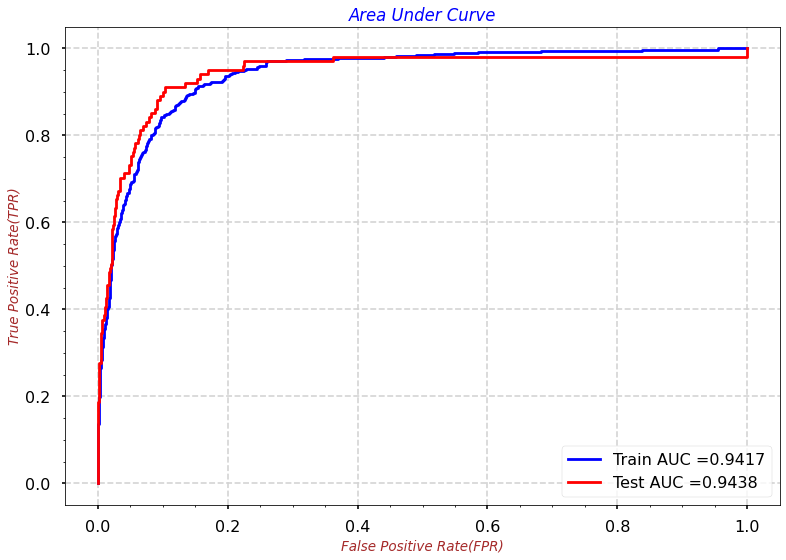

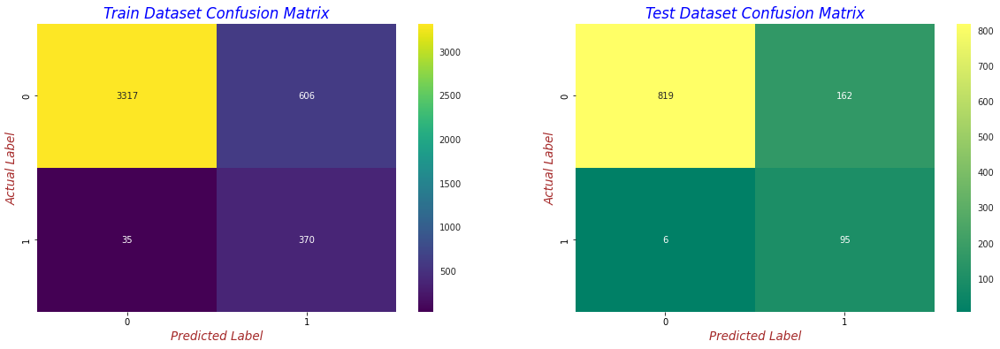



### Best Threshold = 0.3369
### Model AUC is : 0.9438
### Model Train F1 Score is : 0.5358
### Model Test F1 Score is : 0.5307


In [787]:
# Validate Logistic Regression model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(log_reg_1, X_train_std, X_test_std, y_train, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [788]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': log_reg_1.coef_[0]})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.539295
1,Admitted_Duration,0.439222
2,PRV_Tot_DGrpCodes,-0.030426
3,PRV_Tot_Unq_DOB_Years,-0.247869
4,PRV_Bene_Age_Sum,0.027942


In [789]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

In [790]:
top_15_neg_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Features'].iloc[0:15]
top_15_neg_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Importance_Model_1'].iloc[0:15]

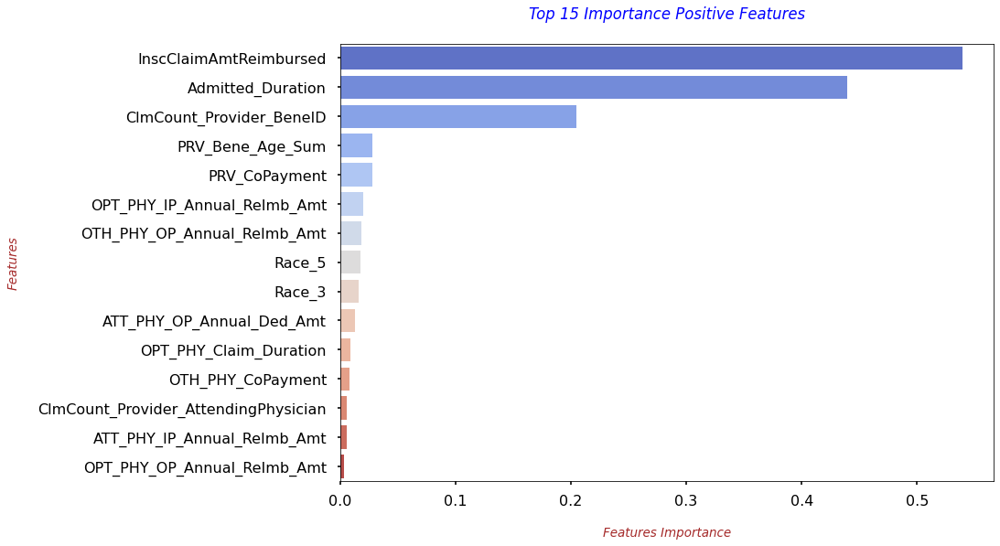

In [791]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

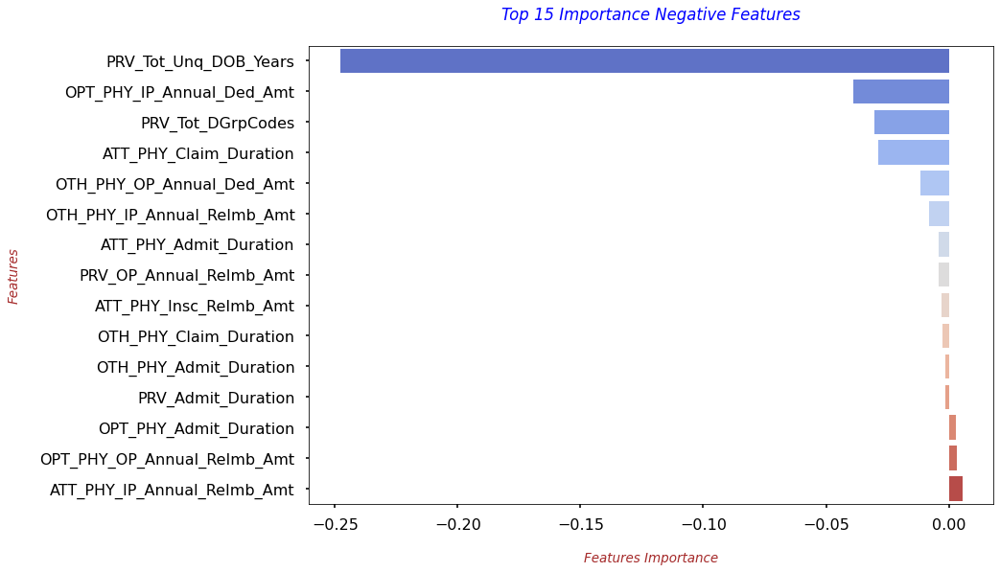

In [792]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_neg_feats, x=top_15_neg_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Negative Features\n", fontdict=title_font_dict)

#### **`2. Decision Tree`**

In [793]:
from sklearn.tree import DecisionTreeClassifier

In [794]:
# Training the model with all features and hyper-parameterized values
dec_tree_2 = DecisionTreeClassifier(criterion='gini',
                                   max_depth= 6,
                                   max_features='auto',
                                   min_samples_leaf=100,
                                   min_samples_split=50,
                                   class_weight='balanced',
                                   random_state=49,
                                   splitter='best',
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

dec_tree_2.fit(X_train_std, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=6,
                       max_features='auto', min_samples_leaf=100,
                       min_samples_split=50, random_state=49)

### Train AUC = 0.945017198352231
### Test AUC = 0.9461602123515104


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


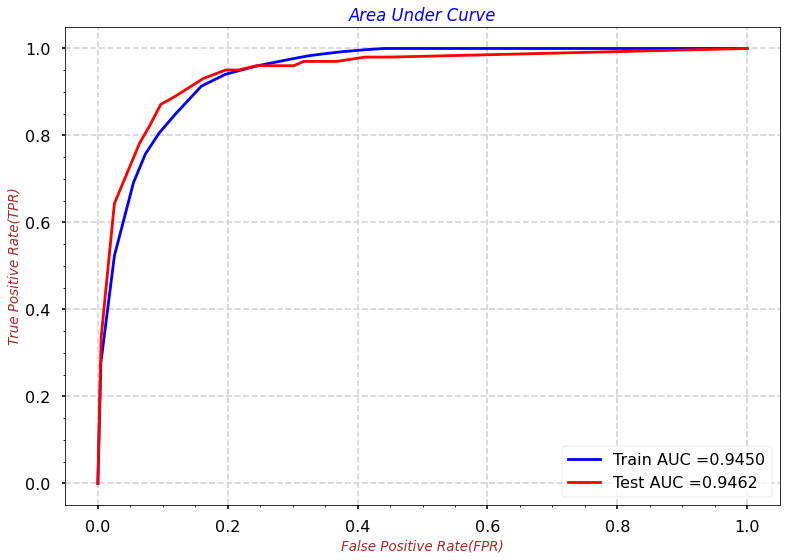

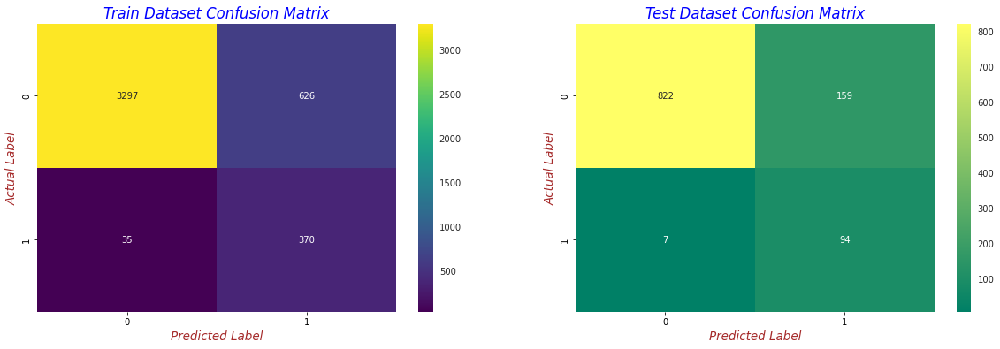



### Best Threshold = 0.6160
### Model AUC is : 0.9462
### Model Train F1 Score is : 0.5282
### Model Test F1 Score is : 0.5311


In [795]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(dec_tree_2, X_train_std, X_test_std, y_train, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [796]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': dec_tree_2.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,1.387090e-01
1,DeductibleAmtPaid,1.909211e-03
2,ChronicCond_Cancer,1.658138e-16
3,OPAnnualDeductibleAmt,7.829921e-03
4,Clm_Admit_Diag_Proc_Similarity,1.924751e-15


In [797]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

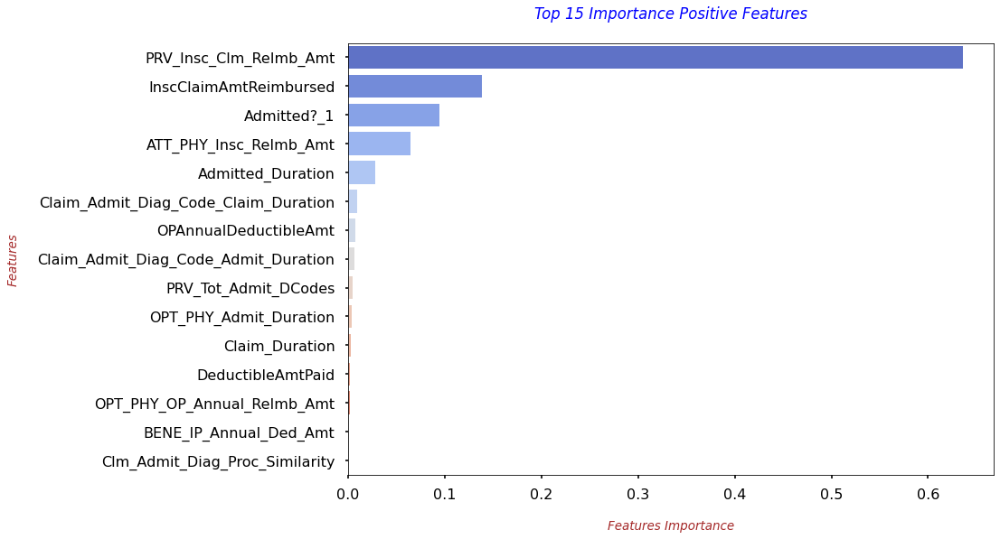

In [798]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

#### **`3. Random Forest Classifier`**

In [799]:
from sklearn.ensemble import RandomForestClassifier

In [800]:
# Training the model with all features and hyper-parameterized values
rfc_3 = RandomForestClassifier(n_estimators=30,criterion='gini',
                                   max_depth= 4,
                                   max_features='auto',
                                   min_samples_leaf=50,
                                   min_samples_split=50,
                                   class_weight='balanced',
                                   random_state=49,
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

rfc_3.fit(X_train_std, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=4,
                       min_samples_leaf=50, min_samples_split=50,
                       n_estimators=30, random_state=49)

### Train AUC = 0.9473894065703057
### Test AUC = 0.9516002058921489


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


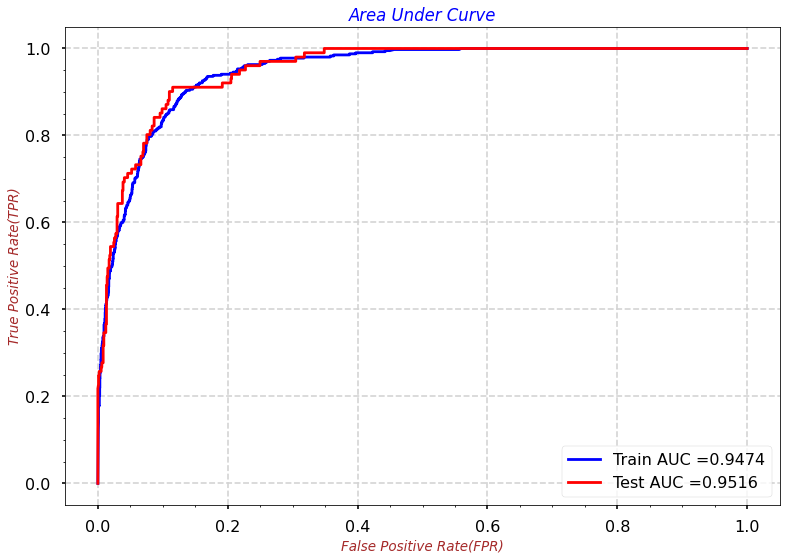

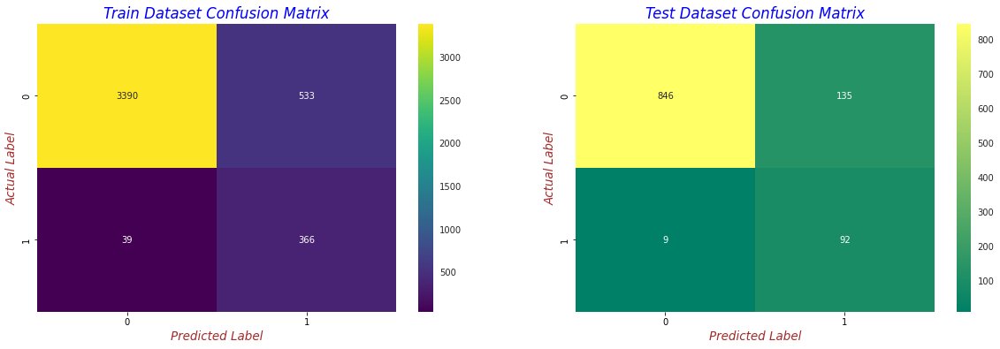



### Best Threshold = 0.5161
### Model AUC is : 0.9516
### Model Train F1 Score is : 0.5613
### Model Test F1 Score is : 0.5610


In [801]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(rfc_3, X_train_std, X_test_std, y_train, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [802]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': rfc_3.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.096383
1,DeductibleAmtPaid,0.036447
2,RenalDiseaseIndicator,0.000225
3,ChronicCond_Alzheimer,0.005393
4,ChronicCond_KidneyDisease,0.002140


In [803]:
top_20_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:20]
top_20_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:20]

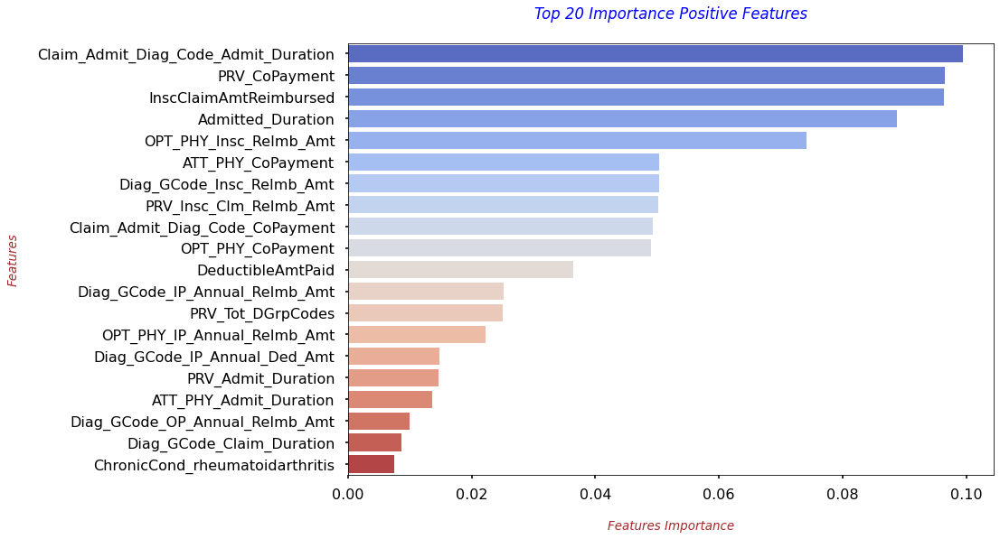

In [804]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_20_pos_feats, x=top_20_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 20 Importance Positive Features\n", fontdict=title_font_dict)

### **`Using Minority Synthetic Oversampling`**

#### **`Train Test Split` :: Creating TRAIN and VALIDATION sets.**

   * **`Reasoning`** :: These sets will be used for measurng the performance of ML Models.

In [805]:
from sklearn.model_selection import train_test_split as tts

In [806]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.25, stratify=y, random_state=39)

In [807]:
# Checking shape of each set
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4057, 102), (1353, 102), (4057,), (1353,))

In [808]:
# Checking count of tgt labels in y_train
y_train.value_counts()

0    3678
1     379
Name: PotentialFraud, dtype: int64

In [809]:
# Checking count of tgt labels in y_test
y_test.value_counts()

0    1226
1     127
Name: PotentialFraud, dtype: int64

#### **`Standardizing the TRAIN & TEST sets` :: Bringing every feature into the same scale.**

In [810]:
from sklearn.preprocessing import RobustScaler

In [811]:
# Standardize the data (train and test)
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)
X_train_std = robust_scaler.transform(X_train)
X_test_std = robust_scaler.transform(X_test)

In [812]:
from collections import Counter

In [813]:
# BEFORE Oversampling :: Checking the percentage share of fraud and non-fraud records in the TRAIN set
counter = Counter(y_train)
counter

Counter({0: 3678, 1: 379})

In [814]:
fraud_percentage = (counter[1]*100 / (counter[0]+counter[1]))
non_fraud_percentage = (counter[0]*100 / (counter[0]+counter[1]))
print("Fraud Percentage = {:.2f}% and Non-Fraud Percentage = {:.2f}%".format(fraud_percentage, non_fraud_percentage))

Fraud Percentage = 9.34% and Non-Fraud Percentage = 90.66%


In [815]:
# Performing minority oversampling
from imblearn.over_sampling import ADASYN

In [816]:
oversample = ADASYN(sampling_strategy=0.35, n_neighbors=12)
X_train_ovsamp, y_train_ovsamp = oversample.fit_resample(X_train_std, y_train)

X_train_ovsamp.shape, y_train_ovsamp.shape

((4941, 102), (4941,))

In [817]:
counter = Counter(y_train_ovsamp)
counter

Counter({0: 3678, 1: 1263})

In [818]:
fraud_percentage = (counter[1]*100 / (counter[0]+counter[1]))
non_fraud_percentage = (counter[0]*100 / (counter[0]+counter[1]))
print("Fraud Percentage = {:.2f}% and Non-Fraud Percentage = {:.2f}%".format(fraud_percentage, non_fraud_percentage))

Fraud Percentage = 25.56% and Non-Fraud Percentage = 74.44%


#### **`4. Logistic Regression`**

In [819]:
# Training the model with all features and hyper-parameterized values
log_reg_4 = LogisticRegression(C=0.03, penalty='l1',
                               fit_intercept=True, 
                               solver='liblinear', 
                               tol=0.0001, 
                               max_iter=500, 
                               verbose=0, 
                               intercept_scaling=1.0,
                               multi_class='auto',
                               random_state=49)

log_reg_4.fit(X_train_ovsamp, y_train_ovsamp)

LogisticRegression(C=0.03, intercept_scaling=1.0, max_iter=500, penalty='l1',
                   random_state=49, solver='liblinear')

### Train AUC = 0.9265677196417723
### Test AUC = 0.9314202771961825


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


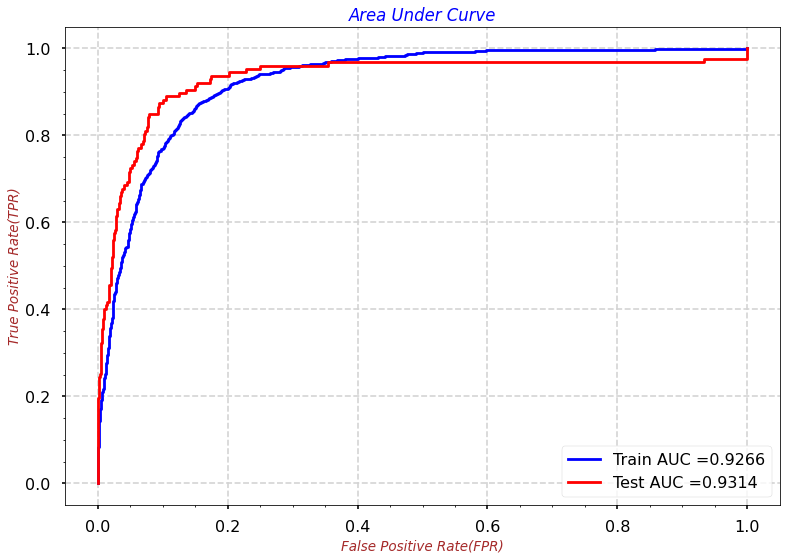

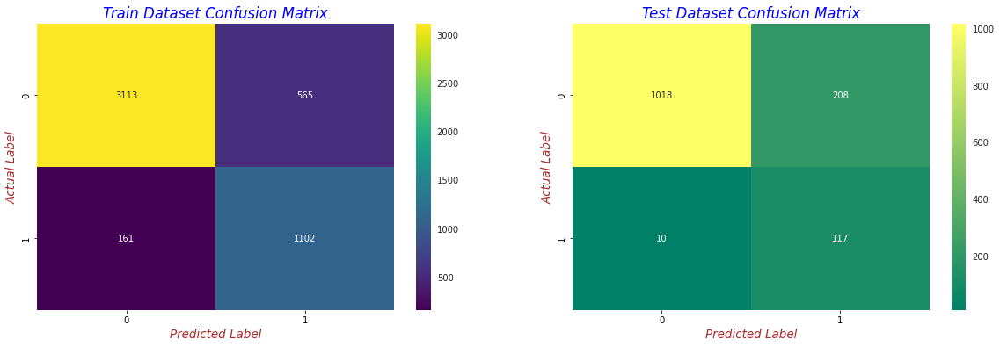



### Best Threshold = 0.1990
### Model AUC is : 0.9314
### Model Train F1 Score is : 0.7522
### Model Test F1 Score is : 0.5177


In [820]:
# Validate Logistic Regression model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(log_reg_4, X_train_ovsamp, X_test_std, y_train_ovsamp, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [821]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': log_reg_4.coef_[0]})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.605982
1,ChronicCond_stroke,0.090109
2,Admitted_Duration,0.317957
3,PRV_Tot_Admit_DCodes,-0.005935
4,PRV_Tot_DGrpCodes,-0.014639


In [822]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

In [823]:
top_15_neg_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Features'].iloc[0:15]
top_15_neg_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Importance_Model_1'].iloc[0:15]

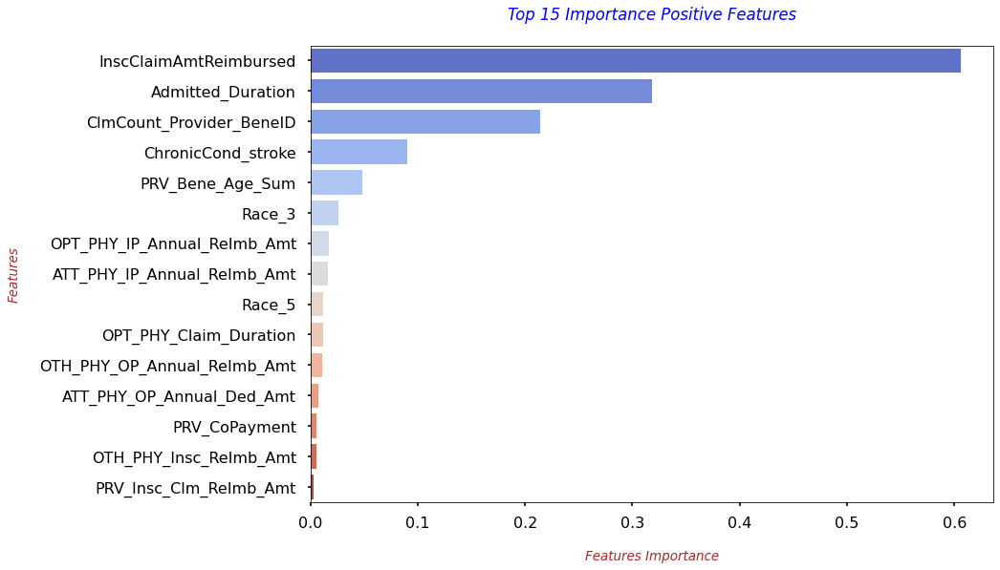

In [824]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

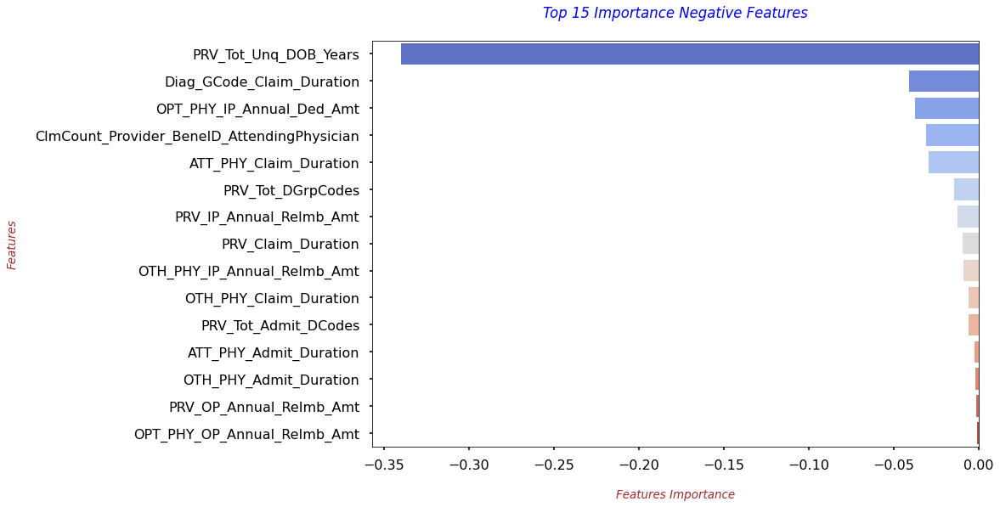

In [825]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_neg_feats, x=top_15_neg_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Negative Features\n", fontdict=title_font_dict)

#### **`5. Decision Tree`**

In [826]:
from sklearn.tree import DecisionTreeClassifier

In [827]:
# Training the model with all features and hyper-parameterized values
dec_tree_5 = DecisionTreeClassifier(criterion='gini',
                                   max_depth= 6,
                                   max_features='log2',
                                   min_samples_leaf=150,
                                   min_samples_split=150,
                                   random_state=49,
                                   splitter='best',
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

dec_tree_5.fit(X_train_ovsamp, y_train_ovsamp)

DecisionTreeClassifier(max_depth=6, max_features='log2', min_samples_leaf=150,
                       min_samples_split=150, random_state=49)

### Train AUC = 0.910743385700084
### Test AUC = 0.9362275372185329


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


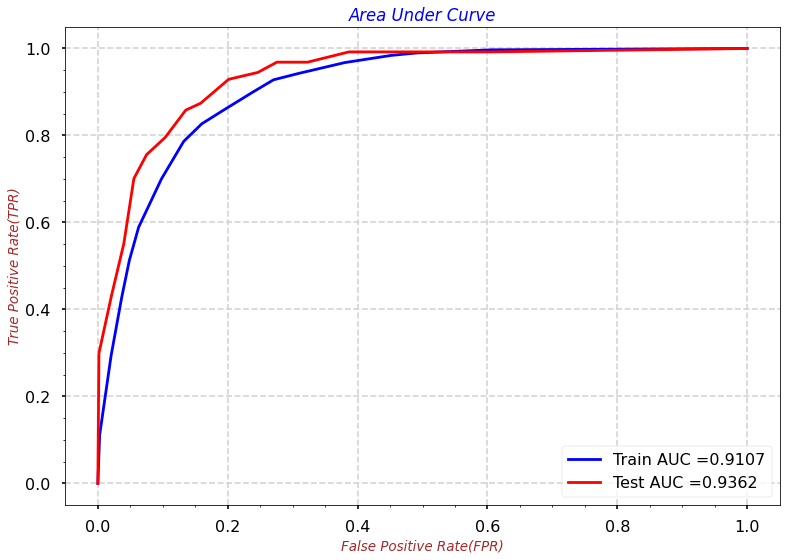

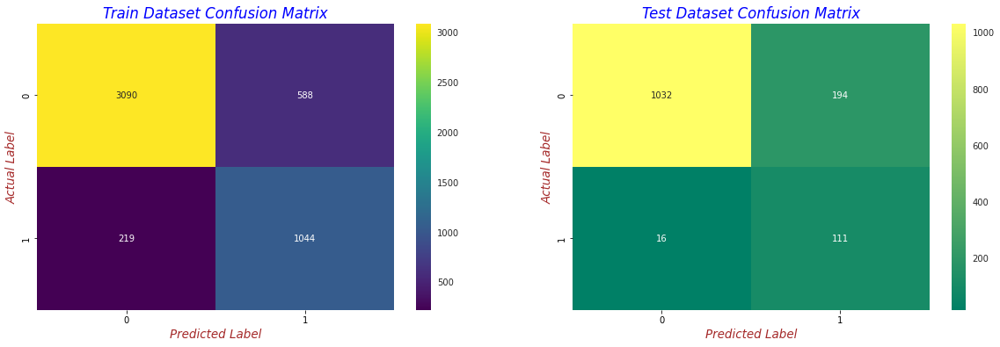



### Best Threshold = 0.3333
### Model AUC is : 0.9362
### Model Train F1 Score is : 0.7212
### Model Test F1 Score is : 0.5139


In [828]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(dec_tree_5, X_train_ovsamp, X_test_std, y_train_ovsamp, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [829]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': dec_tree_5.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,DeductibleAmtPaid,0.002356
1,ChronicCond_Depression,0.011755
2,IPAnnualReimbursementAmt,0.519807
3,Admitted_Duration,0.001040
4,PRV_Bene_Age_Sum,0.007931


In [830]:
top_15_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:15]
top_15_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:15]

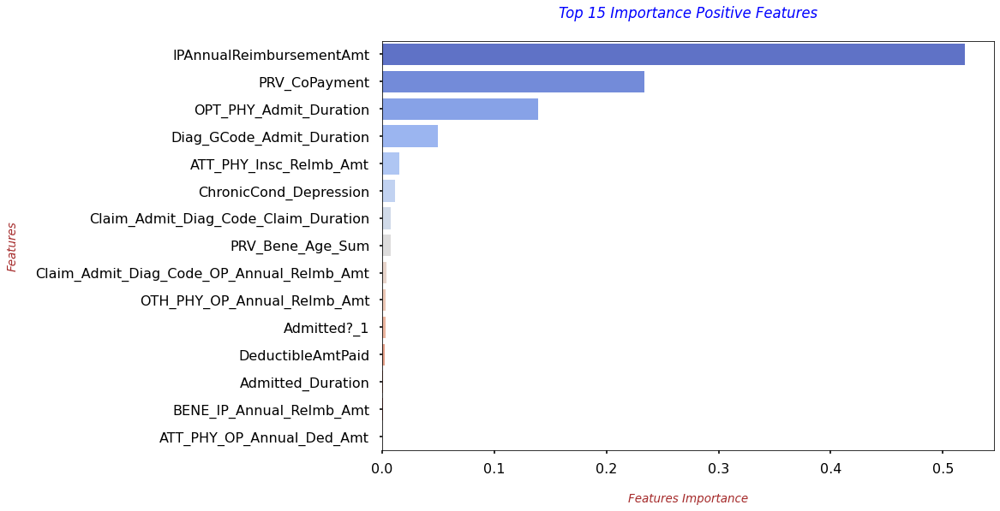

In [831]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_15_pos_feats, x=top_15_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

#### **`6. Random Forest Classifier`**

In [832]:
from sklearn.ensemble import RandomForestClassifier

In [833]:
# Training the model with all features and hyper-parameterized values
rfc_6 = RandomForestClassifier(n_estimators=30,criterion='gini',
                                   max_depth= 4,
                                   max_features='auto',
                                   min_samples_leaf=100,
                                   min_samples_split=50,
                                   random_state=49,
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

rfc_6.fit(X_train_std, y_train)

RandomForestClassifier(max_depth=4, min_samples_leaf=100, min_samples_split=50,
                       n_estimators=30, random_state=49)

### Train AUC = 0.9182419100194303
### Test AUC = 0.9460443668032523


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


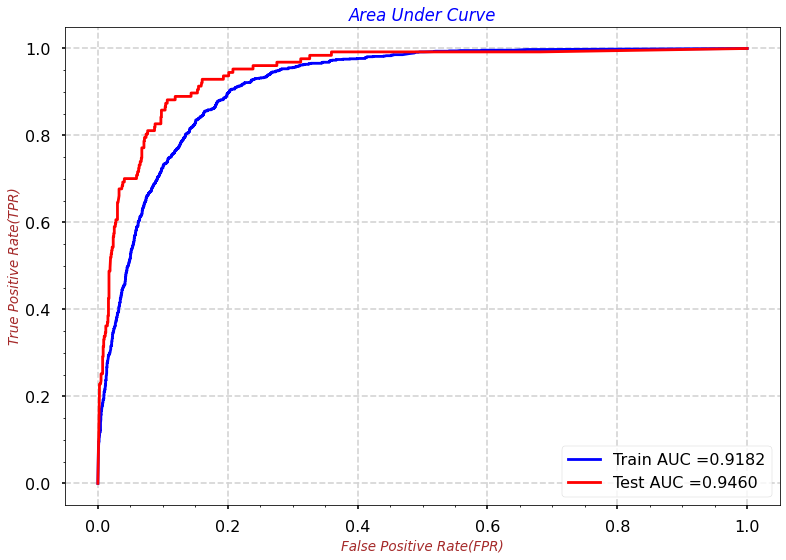

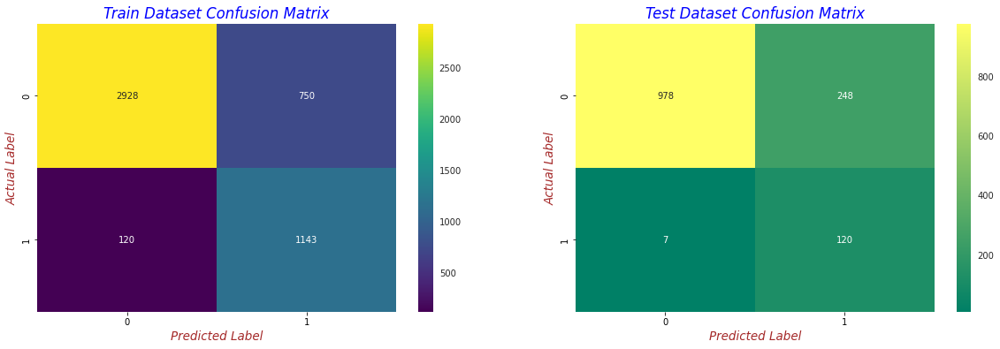



### Best Threshold = 0.0848
### Model AUC is : 0.9460
### Model Train F1 Score is : 0.7243
### Model Test F1 Score is : 0.4848


In [834]:
# Validate model
test_auc, train_f1_score, test_f1_score, best_t = validate_model(rfc_6, X_train_ovsamp, X_test_std, y_train_ovsamp, y_test)

print("\n")
print("### Best Threshold = {:.4f}".format(best_t))
print("### Model AUC is : {:.4f}".format(test_auc))
print("### Model Train F1 Score is : {:.4f}".format(train_f1_score))
print("### Model Test F1 Score is : {:.4f}".format(test_f1_score))

In [835]:
feats_imps = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': rfc_6.feature_importances_})
feats_imps = feats_imps[feats_imps['Importance_Model_1'] != 0]
feats_imps.reset_index(drop=True, inplace=True)
feats_imps.head()

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.103122
1,DeductibleAmtPaid,0.017575
2,ChronicCond_Cancer,0.000972
3,ChronicCond_Depression,0.000118
4,ChronicCond_Diabetes,0.000124


In [836]:
top_20_pos_feats = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:20]
top_20_pos_feats_scores = feats_imps.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:20]

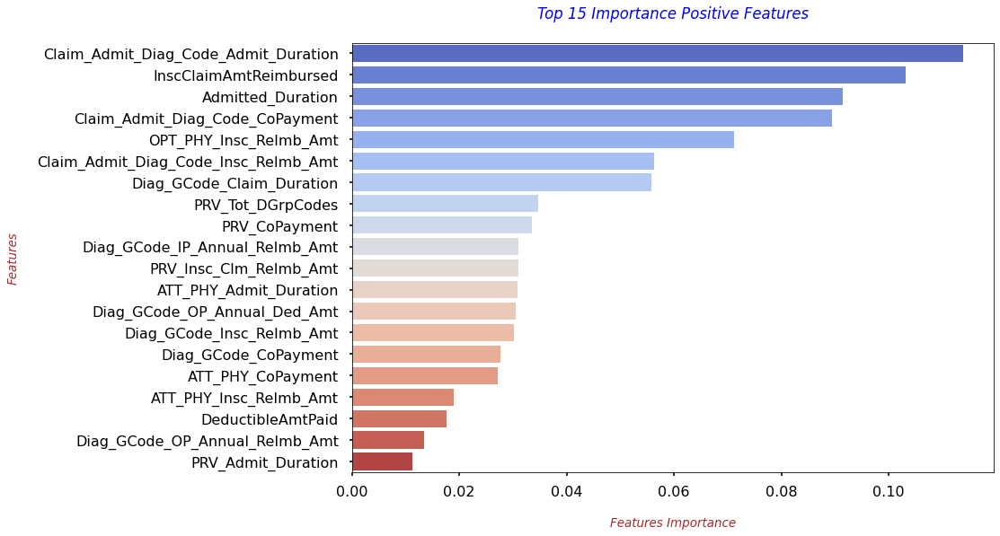

In [837]:
with plt.style.context('seaborn-poster'):
    sns.barplot(y=top_20_pos_feats, x=top_20_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontdict=label_font_dict)
    plt.ylabel("Features\n", fontdict=label_font_dict)
    plt.title("Top 15 Importance Positive Features\n", fontdict=title_font_dict)

# **`Models - SET 2 - RESULTS`**

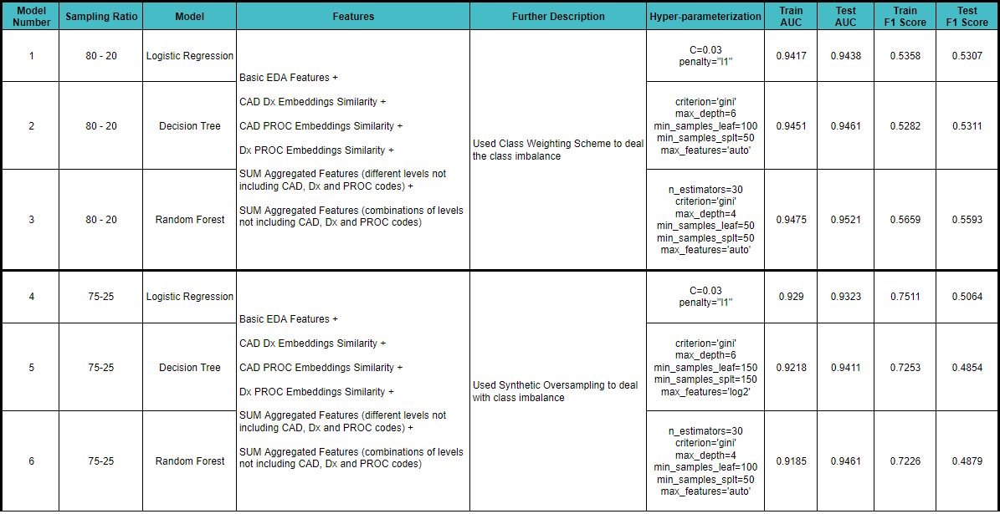

In [838]:
from IPython.display import Image
Image("../input/medicare-prv-fraud-files/Models_Set_2_Results.png")

## **`Models - SET 2 - OBSERVATIONS`**

- **Adding the Similarity Score features of embeddings b/w below mentioned doesn't really helped in improving the models performance:**
    - CAD and Dx Codes
    - Dx and PROC Codes
    - CAD and PROC Codes
    
- **Doing the synthetic oversampling of the minority class doesn't provide gain in the model's performance whehreas we can see a noticeable drop in the performace.** 

# **`Referred Links`**

- https://www.icd10data.com/ICD10CM/Codes

- https://www.icd10data.com/ICD10CM/DRG

- https://www.plasticsurgery.org/Documents/Health-Policy/Coding-Payment/ICD-10/icd-10-medical-diagnosis-codes.pdf

- https://ftp.cdc.gov/pub/health_statistics/nchs/publications/ICD10CM/2019/icd10cm_tabular_2019.pdf


- Very imp link :: Also downloaded files :: https://www.cms.gov/Medicare/Coding/ICD9ProviderDiagnosticCodes/codes

- https://www.cms.gov/Medicare/Coding/OutpatientCodeEdit/Downloads/ICD-10-IOCE-Code-Lists.pdf

- https://medicaid.utah.gov/Documents/pdfs/ClaimDenialCodes.pdf

- https://www.cms.gov/Medicare/Coding/OutpatientCodeEdit/Downloads/ICD-10-IOCE-Code-Lists.pdf

- DRG :: https://www.findacode.com/code-set.php?set=DRG
